In [1]:
import ot

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import torch

from generators import TopNGenerator
from modules import MLPEncoder, MLPDecoder, TransformerEncoder, TransformerDecoder, GeneratorMLP
#from orbit_dataset import get_datasets

from model import AutoEncoderModel
from utils import ChamferLoss, HungarianLoss, HungarianLossCustom, ChamferLossWeighted, HungarianLossDimensionMatching, SinkhornDistance

from torch.optim import Adam

from torch.nn import CrossEntropyLoss, MSELoss

In [96]:
from ripser import Rips
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from tqdm.notebook import tqdm

class OrbitDataset(Dataset):
    
    def __init__(self, X, transform=None):
        self.X = X
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return self.X[idx]

def generate_orbit(point_0, r, n=300):
    
    X = np.zeros([n, 2])
    
    xcur, ycur = point_0[0], point_0[1]
    
    for idx in range(n):
        xcur = (xcur + r * ycur * (1. - ycur)) % 1
        ycur = (ycur + r * xcur * (1. - xcur)) % 1
        X[idx, :] = [xcur, ycur]
    
    return X

def generate_orbits(m, rs=[2.5, 3.5, 4.0, 4.1, 4.3], n=300, random_state=None):
    
    # m orbits, each of n points of dimension 2
    orbits = np.zeros((m * len(rs), n, 2))
    
    # for each r
    for j, r in enumerate(rs):

        # initial points
        points_0 = random_state.uniform(size=(m,2))

        for i, point_0 in enumerate(points_0):
            orbits[j*m + i] = generate_orbit(points_0[i], rs[j])
            
    return orbits

def conv_pd(diagrams):
    pd = np.zeros((0, 2))

    for k, diagram_k in enumerate(diagrams):
        if k == 1:
            diagram_k = diagram_k[~np.isinf(diagram_k).any(axis=1)] # filter infs  
            
            #diagram_k = diagram_k[diagram_k[:, 1] - diagram_k[:, 0] >= 0.01]
            #diagram_k = np.concatenate((diagram_k, k * np.ones((diagram_k.shape[0], 1))), axis=1)
            if len(diagram_k) >= 20:
                diagram_k = np.sort(diagram_k, axis = 1)[::-1][:20]
                pd = np.concatenate((pd, diagram_k))
    return pd

def collate_fn(data):
    
    tmp_pd = data[0]
    
    n_batch = len(data)
    n_features_pd = tmp_pd.shape[1]
    
    n_points_pd = max(len(pd) for pd in data)
    
    mask = np.zeros((n_batch, n_points_pd))
    
    inputs_pd = np.zeros((n_batch, n_points_pd, n_features_pd), dtype=float) - 1.
    
    for i, pd in enumerate(data):
        inputs_pd[i][:len(pd)] = pd
        mask[i][:len(pd)] = 1
    
    return torch.Tensor(inputs_pd), torch.Tensor(mask).long()

def get_datasets(dataset_size, batch_size, n_train, n_test):
    vr = Rips()
    random_state = np.random.RandomState(42)
    X_orbit5k = generate_orbits(dataset_size, random_state=random_state)

    X_big = []

    for x in tqdm(X_orbit5k):
        diagram = conv_pd(vr.fit_transform(x))
        if len(diagram) >= 1:
            diagram[:, 1] -= diagram[:, 0] # to predict delta instead of second coord > first coord
            X_big.append(diagram)

    n_max = 0    

    for x in X_big:
        n_max = max(n_max, len(x))    

    dataset = OrbitDataset(X_big)
    
    n_train = int(0.8 * len(dataset))
    n_test = len(dataset) - n_train
    
    dataset_train, dataset_test = random_split(dataset, [n_train, n_test])
    dataloader_train = DataLoader(dataset_train, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
    dataloader_test =  DataLoader(dataset_test, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)
    return dataset_train, dataset_test, dataloader_train, dataloader_test, n_max

In [97]:
dataset_train, dataset_test, dataloader_train, dataloader_test, n_max = get_datasets(200, 64, 800, 200)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


  0%|          | 0/1000 [00:00<?, ?it/s]

In [119]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

n_epochs = 60
lr = 0.0001
dim_input = 2

#criterion_hungarian = HungarianLossDimensionMatching()

criterion_chamfer = ChamferLoss()
criterion_hungarian_default = HungarianLoss()
criterion_hungarian = HungarianLossCustom(use_weight=True, distance_penalty=5, ce_coeff=0)

sinkhorn = SinkhornDistance(eps=1, max_iter=100, reduction="mean")

# model init
encoder = MLPEncoder(n_in=dim_input, n_hidden=64, n_out=16, num_layers=2)
decoder = MLPDecoder(n_in=16, n_hidden=64, n_out=2*n_max, num_layers=2, set_channels=2)

#encoder = TransformerEncoder(n_in=dim_input, embed_dim=32, fc_dim=64, num_heads=2, num_layers=3, n_out_enc=16)

#generator = TopNGenerator(set_channels=2, cosine_channels=4, max_n=n_max + 5, latent_dim=16)

#decoder = GeneratorMLP(n_in=2, n_hidden=32, n_out=2, num_layers=2, generator=generator)

#decoder = TransformerDecoder(n_in=2, latent_dim=16, fc_dim=64, num_heads=2, num_layers=3, n_out=2, generator=generator,
#                            n_out_lin=32, n_hidden=64, num_layers_lin=2)

model = AutoEncoderModel(encoder, decoder).to(device)
optimizer = Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=5, min_lr=1e-6)

In [120]:

train_loss, val_loss = [], []

for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        #print(mask)
        loss_batch = 0
        for val, pred, cur_mask in zip(src, tgt, mask):
            #print(pred)
            val = val * cur_mask.unsqueeze(1).repeat(1, 2)
            pred = pred * cur_mask.unsqueeze(1).repeat(1, 2)
            a = (val[:, 1]**2 / torch.sum(val[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
            b = (pred[:, 1]**2 / torch.sum(pred[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
            #print(a, b)
            loss_batch += sliced_wasserstein_distance(val, pred, a, b, seed=54, n_projections=50)
        
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
    train_loss.append(loss_train)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            for val, pred, cur_mask in zip(src, tgt, mask):
                #print(pred)
                val = val * cur_mask.unsqueeze(1).repeat(1, 2)
                pred = pred * cur_mask.unsqueeze(1).repeat(1, 2)
                a = (val[:, 1]**2 / torch.sum(val[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
                b = (pred[:, 1]**2 / torch.sum(pred[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
                loss += sliced_wasserstein_distance(val, pred, a, b, seed=54, n_projections=50)
            
            
    loss_test = loss / len(dataloader_test.dataset)
    val_loss.append(loss_test)
    #scheduler.step(loss_test)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    
    cur_n = len(train_loss)
    #plt.figure(figsize=(10, 10))
    #plt.plot(np.arange(cur_n), train_loss, label = 'train')
    #plt.plot(np.arange(cur_n), val_loss, label = 'test')
    #plt.grid()
    #plt.legend()
    #plt.show()
    
    
    item = torch.tensor(dataset_train[0].reshape(1, -1, 2), dtype=torch.float)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    pred = torch.tensor(pred)
    #print(pred.shape)
    a = (item[0, :, 1]**2 / torch.sum(item[0, :, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
    b = (pred[0, :, 1]**2 / torch.sum(pred[0, :, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
    wasserstein_dist = sliced_wasserstein_distance(item[0], pred[0], a, b, seed=54, n_projections=100)
    chamfer_dist = criterion_chamfer(pred, item)
    hung_dist = criterion_hungarian_default(pred, item)
    
    
    print("Wasserstein for train element: {0}\t Chamfer: {1}\t Hungarian: {2}".format(wasserstein_dist, chamfer_dist, hung_dist))
    
    maskk = (pred[0, :, 1] != -1)

    #plt.figure(figsize=(10, 10))

    #plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    #plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    #
    #plt.grid()
    #plt.legend()
    #plt.title("Sliced Wasserstein + cut train")
    #plt.show()
    
    
    
    item = torch.tensor(dataset_test[0].reshape(1, -1, 2), dtype=torch.float)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    pred = torch.tensor(pred)
    maskk = (pred[0, :, 1] != -1)

    #plt.figure(figsize=(10, 10))

    #plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    #plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    
    a = (item[0, :, 1]**2 / torch.sum(item[0, :, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
    b = (pred[0, :, 1]**2 / torch.sum(pred[0, :, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
    wasserstein_dist = sliced_wasserstein_distance(item[0], pred[0], a, b, seed=54, n_projections=100)
    chamfer_dist = criterion_chamfer(pred, item)
    hung_dist = criterion_hungarian_default(pred, item)
    
    
    print("Wasserstein for test element: {0}\t Chamfer: {1}\t Hungarian: {2}".format(wasserstein_dist, chamfer_dist, hung_dist))
    
    #plt.grid()
    #plt.legend()
    #plt.title("Sliced Wasserstein + cut test")
    #plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.6678447127 0.6647616029
Wasserstein for train element: 0.6721547245979309	 Chamfer: 0.8790463209152222	 Hungarian: 0.9314092397689819
Wasserstein for test element: 0.684304416179657	 Chamfer: 0.891167402267456	 Hungarian: 0.9342080354690552


C:\Users\yura-\Anaconda3\lib\site-packages\ipykernel_launcher.py:73: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
C:\Users\yura-\Anaconda3\lib\site-packages\ipykernel_launcher.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.6619296074 0.6589546800
Wasserstein for train element: 0.6663392186164856	 Chamfer: 0.8707515001296997	 Hungarian: 0.9236000180244446
Wasserstein for test element: 0.6784874200820923	 Chamfer: 0.882899820804596	 Hungarian: 0.9263994097709656


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.6561130285 0.6530188322
Wasserstein for train element: 0.6604000926017761	 Chamfer: 0.8621573448181152	 Hungarian: 0.9155527949333191
Wasserstein for test element: 0.6725361943244934	 Chamfer: 0.8742977380752563	 Hungarian: 0.9183352589607239


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.6499499083 0.6465802789
Wasserstein for train element: 0.6539656519889832	 Chamfer: 0.8522299528121948	 Hungarian: 0.906773567199707
Wasserstein for test element: 0.6661093831062317	 Chamfer: 0.8643972873687744	 Hungarian: 0.909557044506073


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.6433644295 0.6397947669
Wasserstein for train element: 0.647182285785675	 Chamfer: 0.8415746092796326	 Hungarian: 0.8974471092224121
Wasserstein for test element: 0.6593430638313293	 Chamfer: 0.8537596464157104	 Hungarian: 0.9002334475517273


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.6364284754 0.6326388717
Wasserstein for train element: 0.6400262713432312	 Chamfer: 0.8299915790557861	 Hungarian: 0.8874644041061401
Wasserstein for test element: 0.6522002816200256	 Chamfer: 0.8421908617019653	 Hungarian: 0.8902497291564941


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.6290611029 0.6249374747
Wasserstein for train element: 0.6323205232620239	 Chamfer: 0.8176107406616211	 Hungarian: 0.8766855001449585
Wasserstein for test element: 0.6445054411888123	 Chamfer: 0.8298137784004211	 Hungarian: 0.8794671893119812


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.6210220456 0.6164119244
Wasserstein for train element: 0.6237824559211731	 Chamfer: 0.80375075340271	 Hungarian: 0.864712119102478
Wasserstein for test element: 0.6359782218933105	 Chamfer: 0.815961480140686	 Hungarian: 0.8674867749214172


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.6120933890 0.6069205403
Wasserstein for train element: 0.6142730712890625	 Chamfer: 0.7882450222969055	 Hungarian: 0.8513439297676086
Wasserstein for test element: 0.6264824867248535	 Chamfer: 0.8004590272903442	 Hungarian: 0.8541091680526733


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.6021241546 0.5962927341
Wasserstein for train element: 0.603621780872345	 Chamfer: 0.7706022262573242	 Hungarian: 0.8362714052200317
Wasserstein for test element: 0.6158509254455566	 Chamfer: 0.7828248739242554	 Hungarian: 0.8390322923660278


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.5909443498 0.5843440890
Wasserstein for train element: 0.591648519039154	 Chamfer: 0.7508999109268188	 Hungarian: 0.8192785382270813
Wasserstein for test element: 0.6038984656333923	 Chamfer: 0.7631312608718872	 Hungarian: 0.8220356702804565


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.5784053206 0.5710197091
Wasserstein for train element: 0.5783014297485352	 Chamfer: 0.7291762828826904	 Hungarian: 0.80030757188797
Wasserstein for test element: 0.5905752778053284	 Chamfer: 0.7413971424102783	 Hungarian: 0.8030582666397095


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.5644143224 0.5560958982
Wasserstein for train element: 0.5633479356765747	 Chamfer: 0.7049578428268433	 Hungarian: 0.7790481448173523
Wasserstein for test element: 0.5756492614746094	 Chamfer: 0.7171670198440552	 Hungarian: 0.7817931771278381


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.5487550497 0.5394505262
Wasserstein for train element: 0.5466747879981995	 Chamfer: 0.6784651279449463	 Hungarian: 0.7553137540817261
Wasserstein for test element: 0.5590106844902039	 Chamfer: 0.69068843126297	 Hungarian: 0.7580593824386597


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.5313310623 0.5209250450
Wasserstein for train element: 0.5281176567077637	 Chamfer: 0.6499801874160767	 Hungarian: 0.729012668132782
Wasserstein for test element: 0.5404924154281616	 Chamfer: 0.662226676940918	 Hungarian: 0.7317594289779663


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.5119134784 0.5003589392
Wasserstein for train element: 0.507514238357544	 Chamfer: 0.6195253729820251	 Hungarian: 0.6999756097793579
Wasserstein for test element: 0.5199348330497742	 Chamfer: 0.6317864060401917	 Hungarian: 0.7027243971824646


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.4905078709 0.4778575599
Wasserstein for train element: 0.48496580123901367	 Chamfer: 0.5868604183197021	 Hungarian: 0.668285608291626
Wasserstein for test element: 0.49744027853012085	 Chamfer: 0.5991388559341431	 Hungarian: 0.6710396409034729


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.4671913385 0.4534586668
Wasserstein for train element: 0.4605051577091217	 Chamfer: 0.552290141582489	 Hungarian: 0.6340934038162231
Wasserstein for test element: 0.4730373024940491	 Chamfer: 0.5646116137504578	 Hungarian: 0.6368555426597595


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 0.4419764876 0.4271940291
Wasserstein for train element: 0.4341617822647095	 Chamfer: 0.5161102414131165	 Hungarian: 0.5975292921066284
Wasserstein for test element: 0.4467584788799286	 Chamfer: 0.528476357460022	 Hungarian: 0.6003044247627258


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 0.4149929285 0.3993233740
Wasserstein for train element: 0.40619364380836487	 Chamfer: 0.47852733731269836	 Hungarian: 0.5589286684989929
Wasserstein for test element: 0.4188620448112488	 Chamfer: 0.49094727635383606	 Hungarian: 0.5617227554321289


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  20 0.3865586221 0.3702105582
Wasserstein for train element: 0.37696021795272827	 Chamfer: 0.4400175213813782	 Hungarian: 0.5188148021697998
Wasserstein for test element: 0.3897066116333008	 Chamfer: 0.45250260829925537	 Hungarian: 0.521632194519043


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  21 0.3569566011 0.3400077224
Wasserstein for train element: 0.34658998250961304	 Chamfer: 0.4007381200790405	 Hungarian: 0.47758644819259644
Wasserstein for test element: 0.35940685868263245	 Chamfer: 0.4132903218269348	 Hungarian: 0.480433851480484


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  22 0.3264849782 0.3093020022
Wasserstein for train element: 0.31568631529808044	 Chamfer: 0.3615943193435669	 Hungarian: 0.43590083718299866
Wasserstein for test element: 0.3285761773586273	 Chamfer: 0.37422508001327515	 Hungarian: 0.43878617882728577


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  23 0.2957652807 0.2786731124
Wasserstein for train element: 0.2848328948020935	 Chamfer: 0.32332777976989746	 Hungarian: 0.39451104402542114
Wasserstein for test element: 0.2978014051914215	 Chamfer: 0.336051344871521	 Hungarian: 0.3974480926990509


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  24 0.2653663754 0.2486765832
Wasserstein for train element: 0.2545855641365051	 Chamfer: 0.28656506538391113	 Hungarian: 0.3541466295719147
Wasserstein for test element: 0.26763585209846497	 Chamfer: 0.2993975877761841	 Hungarian: 0.35714444518089294


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  25 0.2358216345 0.2198204547
Wasserstein for train element: 0.22545252740383148	 Chamfer: 0.2518252432346344	 Hungarian: 0.31546419858932495
Wasserstein for test element: 0.23858921229839325	 Chamfer: 0.2647863030433655	 Hungarian: 0.3185357451438904


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  26 0.2076090425 0.1925379932
Wasserstein for train element: 0.19786420464515686	 Chamfer: 0.21950159966945648	 Hungarian: 0.2789948582649231
Wasserstein for test element: 0.21109183132648468	 Chamfer: 0.23261350393295288	 Hungarian: 0.2821536958217621


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  27 0.1811282933 0.1671633720
Wasserstein for train element: 0.1721498817205429	 Chamfer: 0.18985165655612946	 Hungarian: 0.24513229727745056
Wasserstein for test element: 0.1854729801416397	 Chamfer: 0.20313936471939087	 Hungarian: 0.24839143455028534


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  28 0.1566685140 0.1439411044
Wasserstein for train element: 0.1485476791858673	 Chamfer: 0.16300903260707855	 Hungarian: 0.21414022147655487
Wasserstein for test element: 0.1619732528924942	 Chamfer: 0.17650286853313446	 Hungarian: 0.21751730144023895


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  29 0.1344332099 0.1230054274
Wasserstein for train element: 0.12717603147029877	 Chamfer: 0.1389959454536438	 Hungarian: 0.18614378571510315
Wasserstein for test element: 0.14071181416511536	 Chamfer: 0.15273517370224	 Hungarian: 0.1896519660949707


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  30 0.1144888699 0.1044189706
Wasserstein for train element: 0.10808374732732773	 Chamfer: 0.11777371168136597	 Hungarian: 0.1611764132976532
Wasserstein for test element: 0.12174008041620255	 Chamfer: 0.13179758191108704	 Hungarian: 0.1648336499929428


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  31 0.0968927592 0.0881202519
Wasserstein for train element: 0.09118823707103729	 Chamfer: 0.09917880594730377	 Hungarian: 0.13909772038459778
Wasserstein for test element: 0.10497628897428513	 Chamfer: 0.11352553963661194	 Hungarian: 0.14293348789215088


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  32 0.0815006495 0.0740750134
Wasserstein for train element: 0.07644394040107727	 Chamfer: 0.08309856057167053	 Hungarian: 0.1198495477437973
Wasserstein for test element: 0.090377077460289	 Chamfer: 0.09777455776929855	 Hungarian: 0.12388372421264648


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  33 0.0683460236 0.0620692819
Wasserstein for train element: 0.06361810863018036	 Chamfer: 0.0692339837551117	 Hungarian: 0.10311702638864517
Wasserstein for test element: 0.07770659029483795	 Chamfer: 0.0841999500989914	 Hungarian: 0.10736845433712006


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  34 0.0571764223 0.0520213880
Wasserstein for train element: 0.05262654647231102	 Chamfer: 0.057410579174757004	 Hungarian: 0.08878099918365479
Wasserstein for test element: 0.06687908619642258	 Chamfer: 0.07268580049276352	 Hungarian: 0.09326357394456863


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  35 0.0479228459 0.0437655486
Wasserstein for train element: 0.04329124838113785	 Chamfer: 0.04748605191707611	 Hungarian: 0.07658945024013519
Wasserstein for test element: 0.0577075257897377	 Chamfer: 0.06302231550216675	 Hungarian: 0.08133240044116974


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  36 0.0404248722 0.0371641815
Wasserstein for train element: 0.035467177629470825	 Chamfer: 0.039349593222141266	 Hungarian: 0.06634952872991562
Wasserstein for test element: 0.05003615468740463	 Chamfer: 0.05481702834367752	 Hungarian: 0.07136563956737518


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  37 0.0344856232 0.0320987739
Wasserstein for train element: 0.029053468257188797	 Chamfer: 0.0331650972366333	 Hungarian: 0.05790373682975769
Wasserstein for test element: 0.04375103488564491	 Chamfer: 0.04802051559090614	 Hungarian: 0.06319651752710342


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  38 0.0299494509 0.0283897761
Wasserstein for train element: 0.02392365038394928	 Chamfer: 0.028346143662929535	 Hungarian: 0.0510837621986866
Wasserstein for test element: 0.03870568051934242	 Chamfer: 0.04256521165370941	 Hungarian: 0.05664392188191414


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  39 0.0266757533 0.0257324502
Wasserstein for train element: 0.019837291911244392	 Chamfer: 0.024593647569417953	 Hungarian: 0.045566193759441376
Wasserstein for test element: 0.0346483513712883	 Chamfer: 0.03818785399198532	 Hungarian: 0.051361896097660065


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  40 0.0243345499 0.0238865297
Wasserstein for train element: 0.016674647107720375	 Chamfer: 0.02163582295179367	 Hungarian: 0.04121914505958557
Wasserstein for test element: 0.03145740553736687	 Chamfer: 0.03473617881536484	 Hungarian: 0.04719500243663788


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  41 0.0226804689 0.0226035304
Wasserstein for train element: 0.014266314916312695	 Chamfer: 0.01946704462170601	 Hungarian: 0.03784088045358658
Wasserstein for test element: 0.028979191556572914	 Chamfer: 0.032026857137680054	 Hungarian: 0.04393845051527023


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  42 0.0214912444 0.0216864981
Wasserstein for train element: 0.012445525266230106	 Chamfer: 0.017983533442020416	 Hungarian: 0.03521333262324333
Wasserstein for test element: 0.02706723101437092	 Chamfer: 0.02991669811308384	 Hungarian: 0.041403237730264664


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  43 0.0206370894 0.0209741406
Wasserstein for train element: 0.010987777262926102	 Chamfer: 0.016833985224366188	 Hungarian: 0.03304997459053993
Wasserstein for test element: 0.02549857832491398	 Chamfer: 0.028156712651252747	 Hungarian: 0.039304353296756744


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  44 0.0199496504 0.0204119571
Wasserstein for train element: 0.009857606142759323	 Chamfer: 0.015891144052147865	 Hungarian: 0.03133203089237213
Wasserstein for test element: 0.02426418475806713	 Chamfer: 0.026723533868789673	 Hungarian: 0.037620313465595245


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  45 0.0193967633 0.0199421681
Wasserstein for train element: 0.008929818868637085	 Chamfer: 0.015077384188771248	 Hungarian: 0.029876921325922012
Wasserstein for test element: 0.023225266486406326	 Chamfer: 0.025484155863523483	 Hungarian: 0.03617948293685913


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  46 0.0189219788 0.0195459761
Wasserstein for train element: 0.008209551684558392	 Chamfer: 0.014388611540198326	 Hungarian: 0.028704196214675903
Wasserstein for test element: 0.022402938455343246	 Chamfer: 0.024438850581645966	 Hungarian: 0.034996092319488525


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  47 0.0185171254 0.0192029178
Wasserstein for train element: 0.007610233034938574	 Chamfer: 0.013763073831796646	 Hungarian: 0.02766895666718483
Wasserstein for test element: 0.021686431020498276	 Chamfer: 0.023495301604270935	 Hungarian: 0.03394021838903427


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  48 0.0181660186 0.0189045537
Wasserstein for train element: 0.007118355017155409	 Chamfer: 0.013117576949298382	 Hungarian: 0.026741597801446915
Wasserstein for test element: 0.021058103069663048	 Chamfer: 0.022624067962169647	 Hungarian: 0.032981615513563156


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  49 0.0178569462 0.0186420269
Wasserstein for train element: 0.006741580553352833	 Chamfer: 0.01254944782704115	 Hungarian: 0.025932583957910538
Wasserstein for test element: 0.020532744005322456	 Chamfer: 0.021815087646245956	 Hungarian: 0.032118868082761765


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  50 0.0175760835 0.0184019450
Wasserstein for train element: 0.006457934621721506	 Chamfer: 0.012066235765814781	 Hungarian: 0.02518625184893608
Wasserstein for test element: 0.020065302029252052	 Chamfer: 0.021009504795074463	 Hungarian: 0.031288303434848785


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  51 0.0173220690 0.0181933194
Wasserstein for train element: 0.006265636999160051	 Chamfer: 0.011636846698820591	 Hungarian: 0.024511048570275307
Wasserstein for test element: 0.01965176686644554	 Chamfer: 0.020231887698173523	 Hungarian: 0.030499104410409927


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  52 0.0171016119 0.0180120189
Wasserstein for train element: 0.006094784010201693	 Chamfer: 0.01116870529949665	 Hungarian: 0.023801783099770546
Wasserstein for test element: 0.01921115070581436	 Chamfer: 0.01944873109459877	 Hungarian: 0.02967749536037445


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  53 0.0169128664 0.0178610887
Wasserstein for train element: 0.005989030469208956	 Chamfer: 0.010819440707564354	 Hungarian: 0.02315949648618698
Wasserstein for test element: 0.01881796307861805	 Chamfer: 0.01870746724307537	 Hungarian: 0.028912890702486038


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  54 0.0167543050 0.0177354924
Wasserstein for train element: 0.005858940072357655	 Chamfer: 0.01049262098968029	 Hungarian: 0.022479422390460968
Wasserstein for test element: 0.01839865930378437	 Chamfer: 0.017967551946640015	 Hungarian: 0.028142383322119713


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  55 0.0166234504 0.0176352113
Wasserstein for train element: 0.0058069899678230286	 Chamfer: 0.010236380621790886	 Hungarian: 0.021925484761595726
Wasserstein for test element: 0.018083659932017326	 Chamfer: 0.017316482961177826	 Hungarian: 0.027486193925142288


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  56 0.0165159684 0.0175527707
Wasserstein for train element: 0.005741984583437443	 Chamfer: 0.010047288611531258	 Hungarian: 0.021382872015237808
Wasserstein for test element: 0.017776383087038994	 Chamfer: 0.016712557524442673	 Hungarian: 0.02686106041073799


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  57 0.0164302103 0.0174850803
Wasserstein for train element: 0.005711284466087818	 Chamfer: 0.009886367246508598	 Hungarian: 0.020908378064632416
Wasserstein for test element: 0.017529981210827827	 Chamfer: 0.016160933300852776	 Hungarian: 0.026301275938749313


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  58 0.0163575131 0.0174241569
Wasserstein for train element: 0.005621986463665962	 Chamfer: 0.009632108733057976	 Hungarian: 0.020368285477161407
Wasserstein for test element: 0.017221713438630104	 Chamfer: 0.015601317398250103	 Hungarian: 0.02570664882659912


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  59 0.0162973646 0.0173749644
Wasserstein for train element: 0.0055754822678864	 Chamfer: 0.009351213462650776	 Hungarian: 0.019902369007468224
Wasserstein for test element: 0.016973504796624184	 Chamfer: 0.015100844204425812	 Hungarian: 0.025176173076033592


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.0080243088 0.0076234727


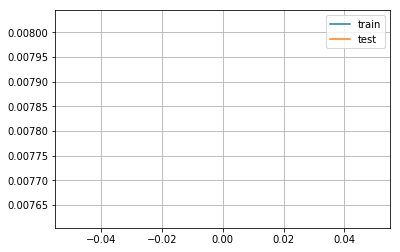

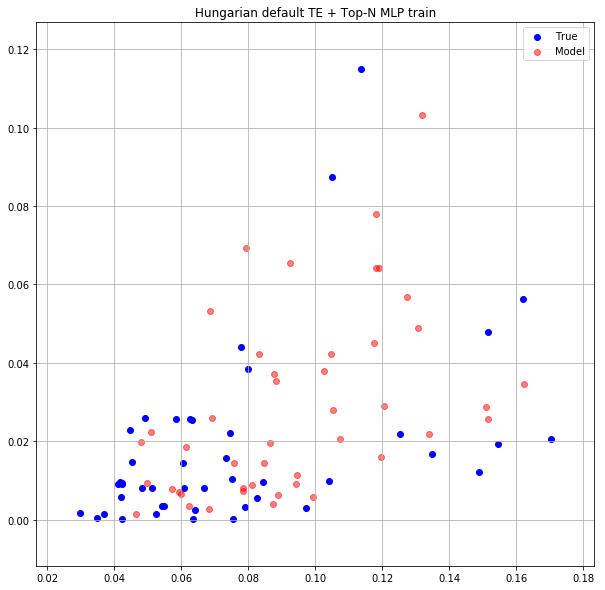

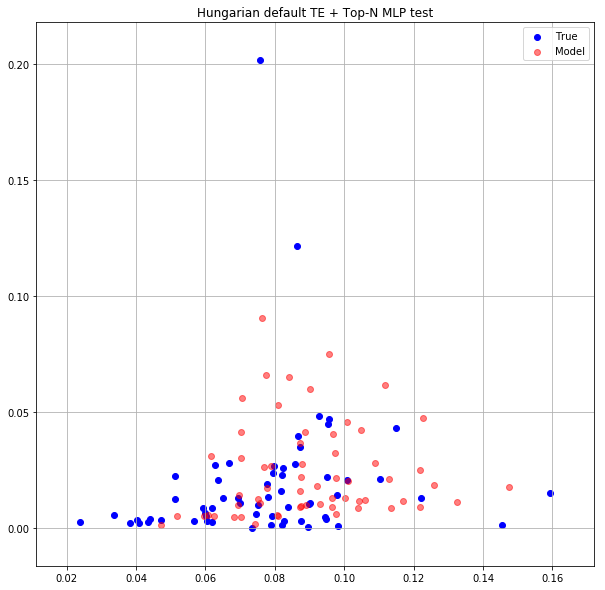

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.0079508899 0.0076611461


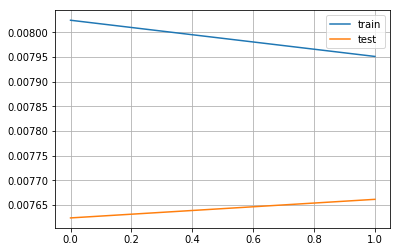

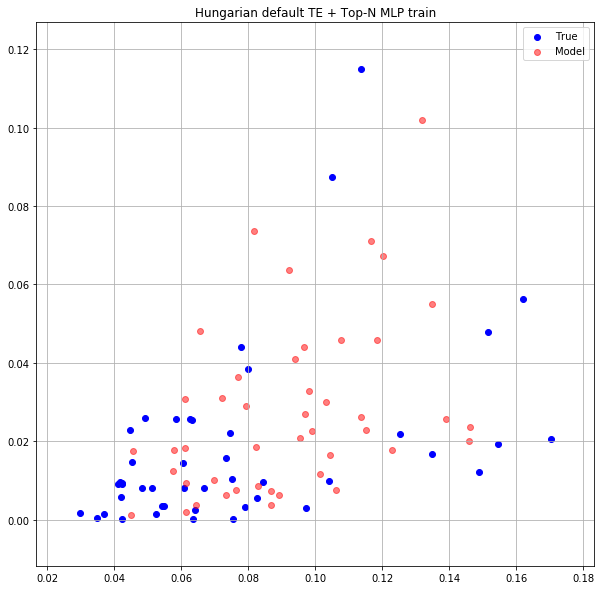

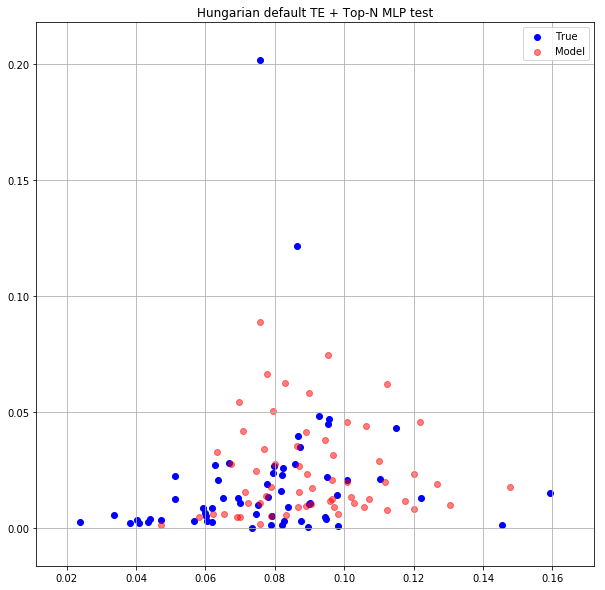

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.0079529993 0.0076374044


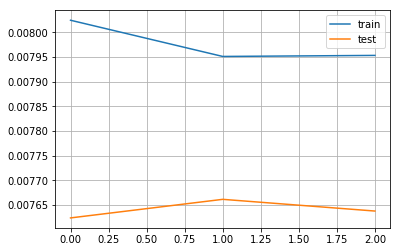

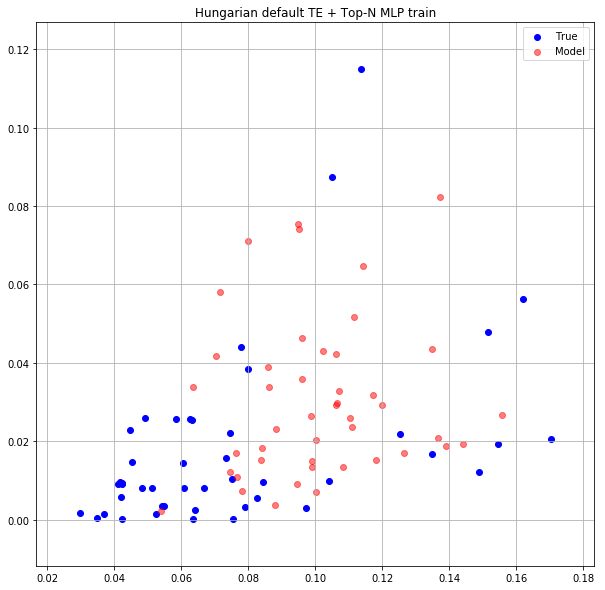

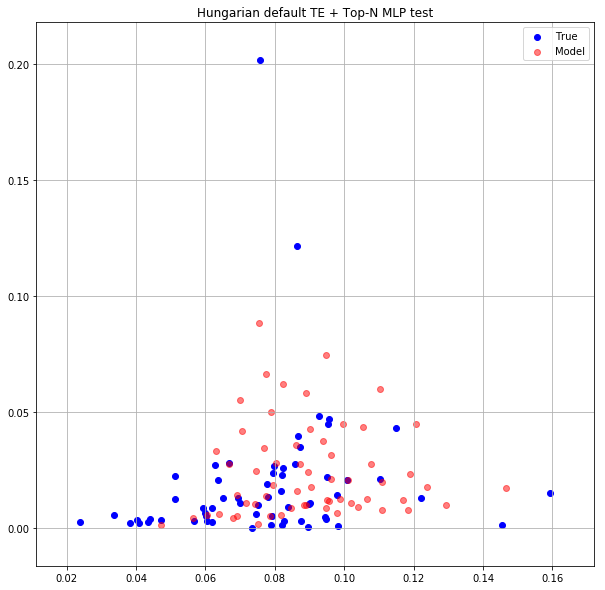

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.0077910083 0.0074639143


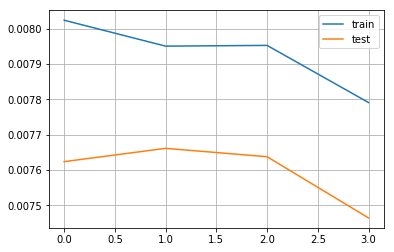

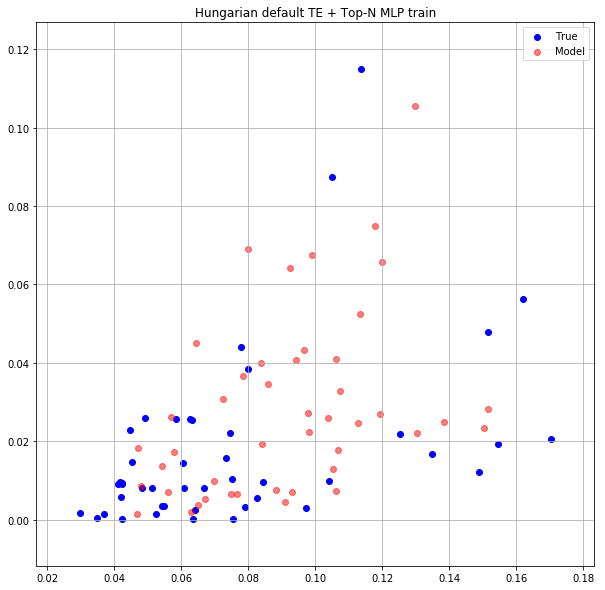

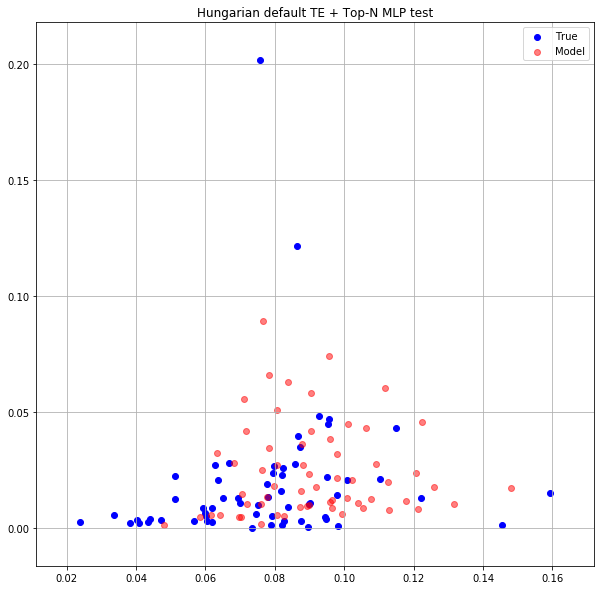

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.0077885361 0.0075376797


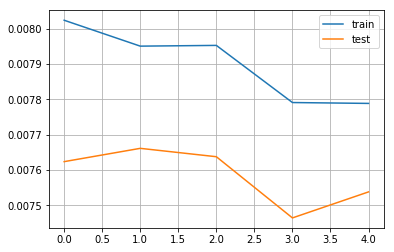

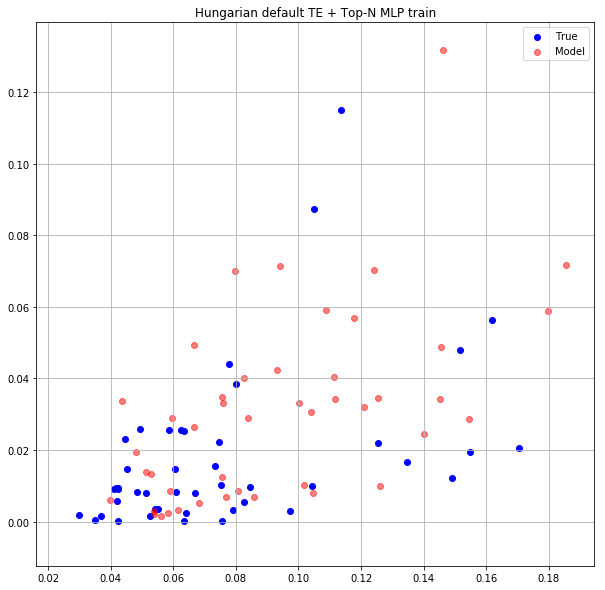

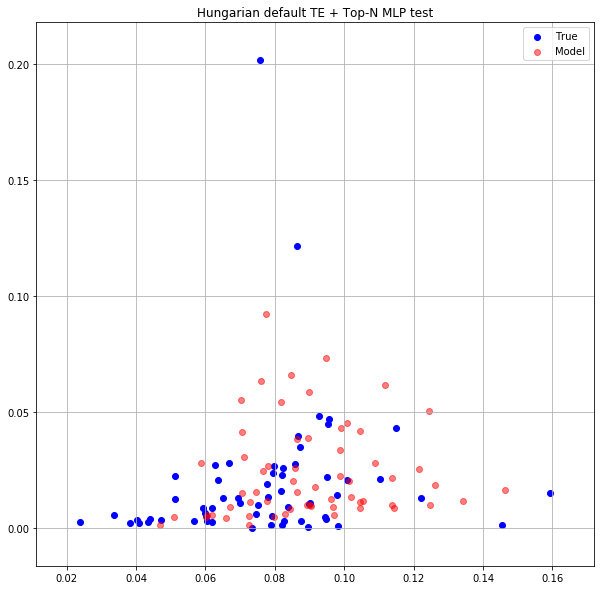

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.0077191638 0.0073714280


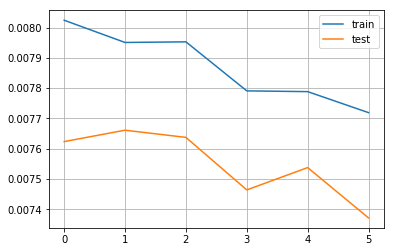

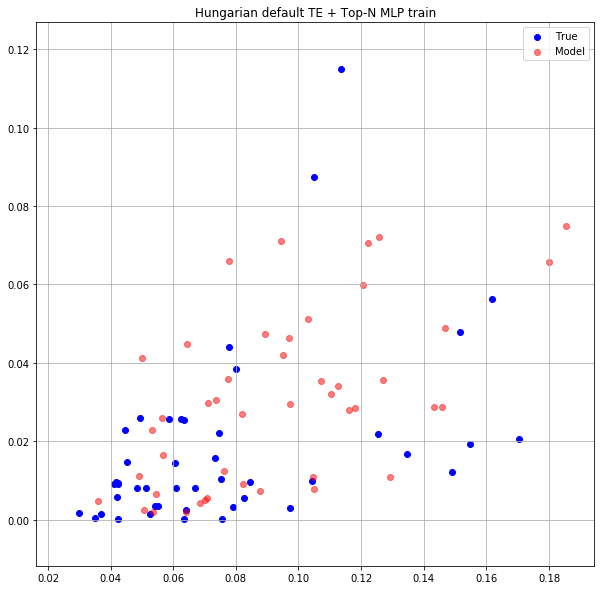

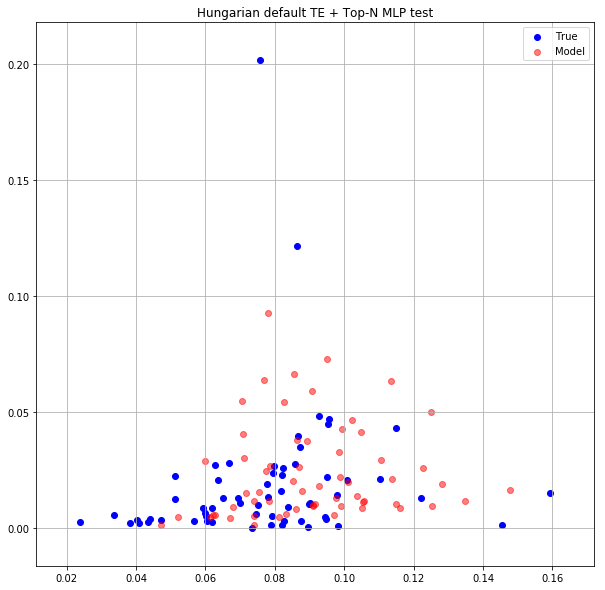

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0078924689 0.0074864011


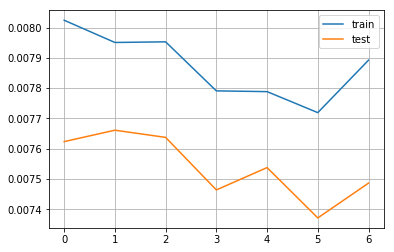

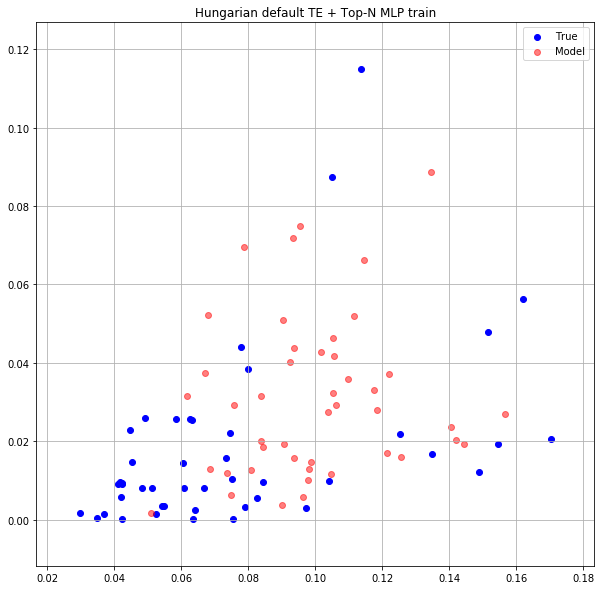

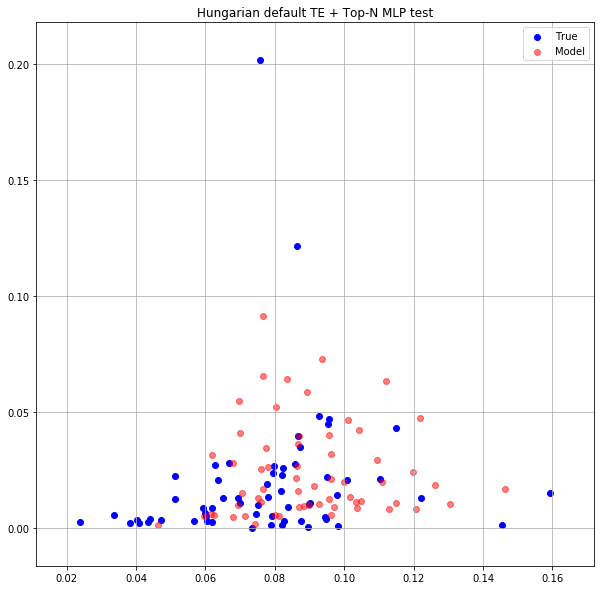

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0078900671 0.0073288865


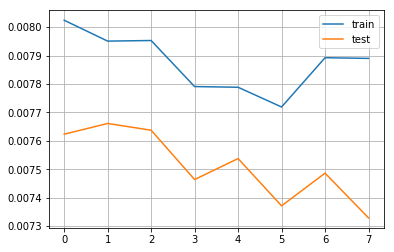

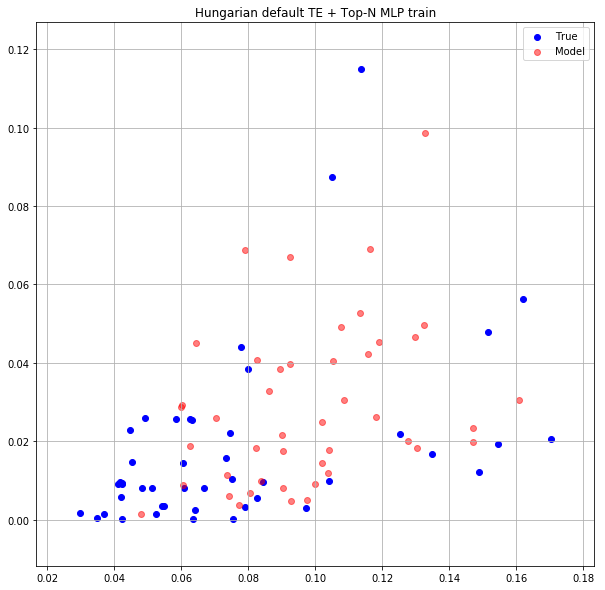

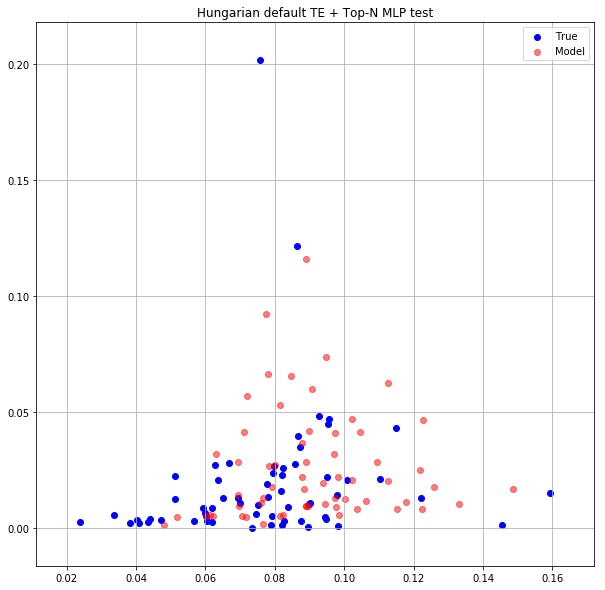

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0078239013 0.0075039794


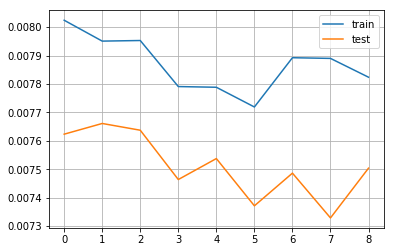

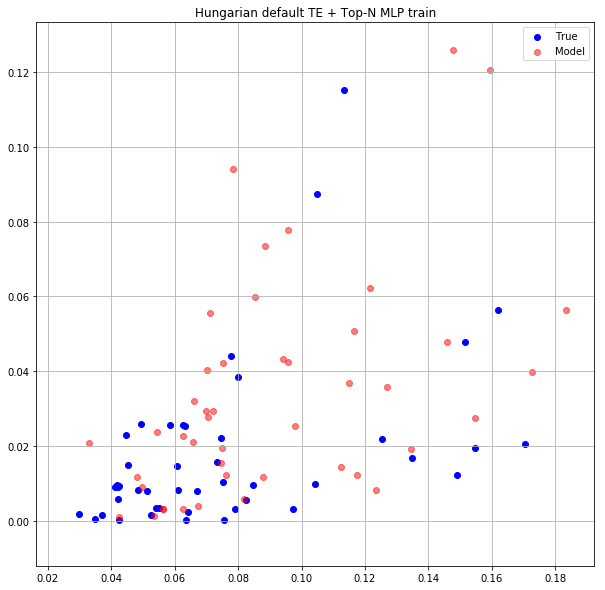

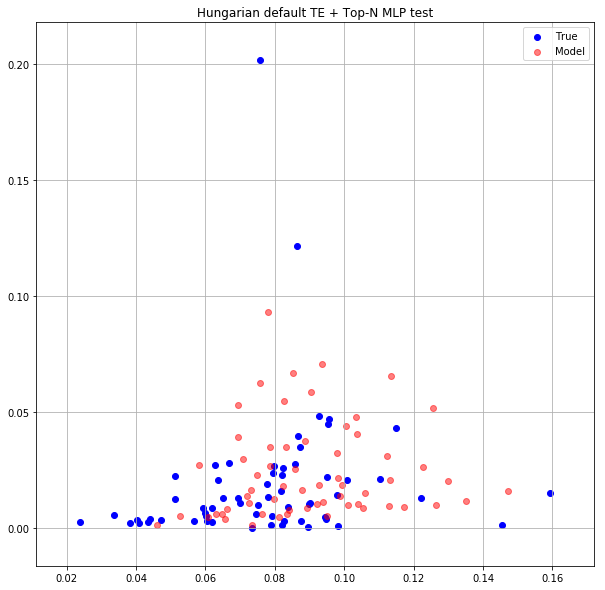

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0077690836 0.0075946804


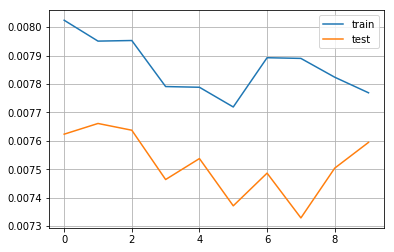

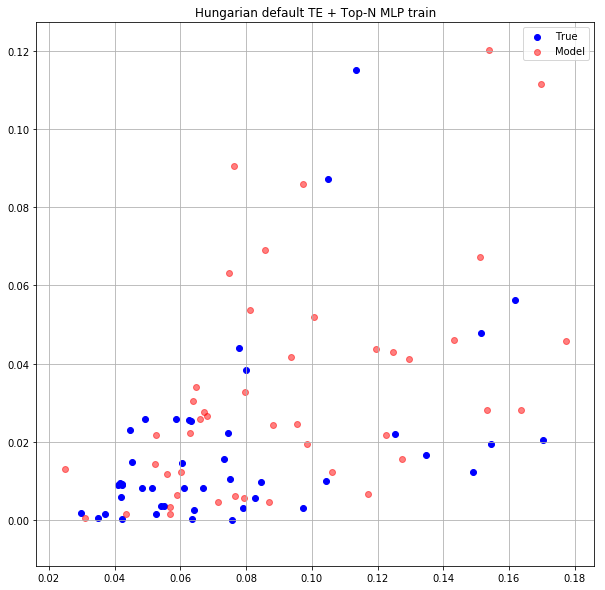

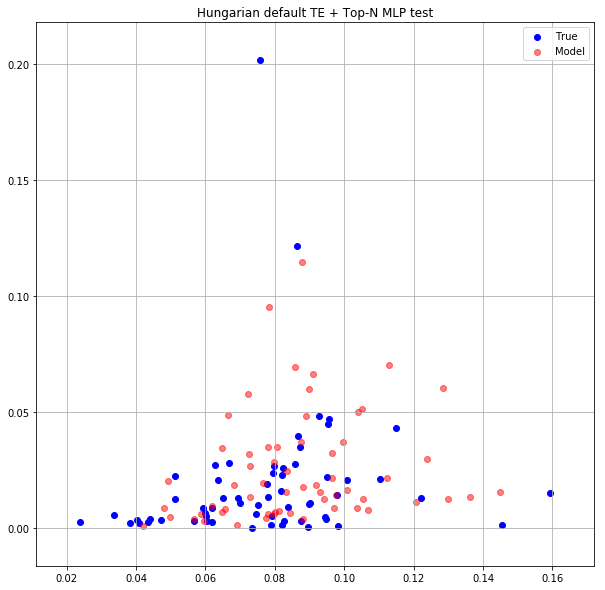

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0078547271 0.0073335278


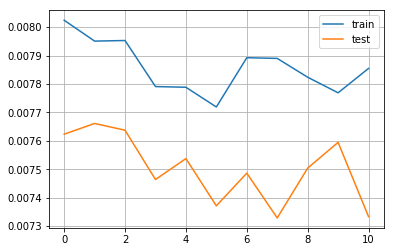

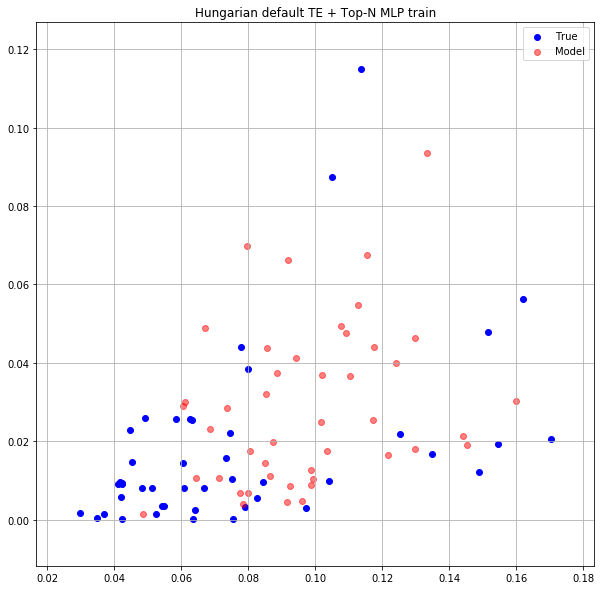

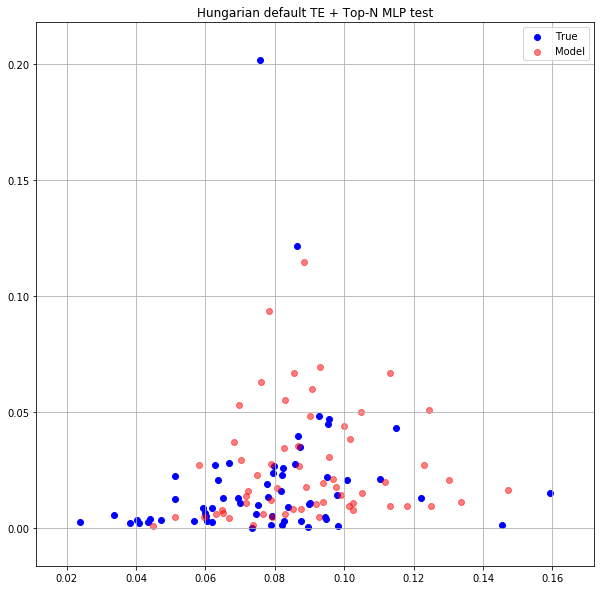

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0076494962 0.0076079215


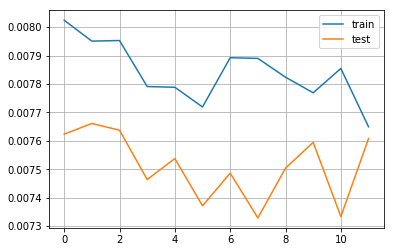

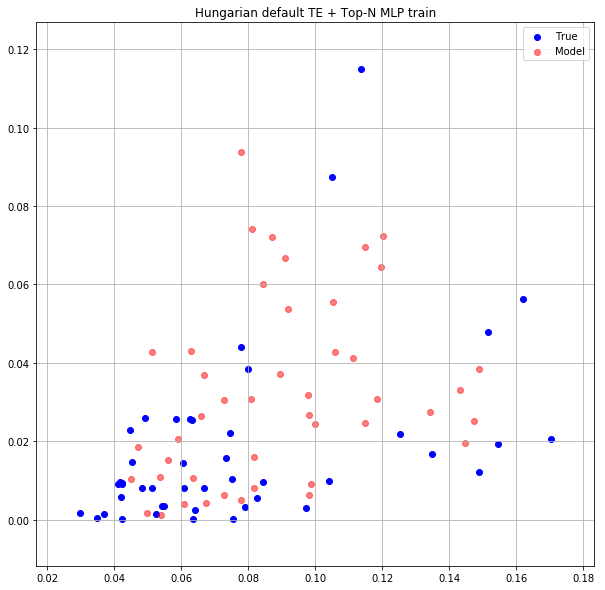

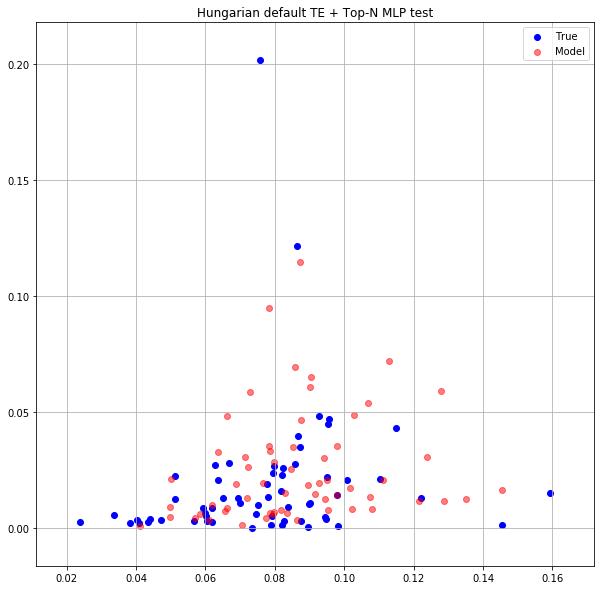

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.0078363642 0.0074054231


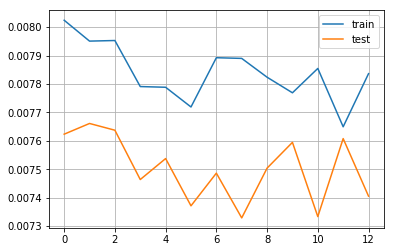

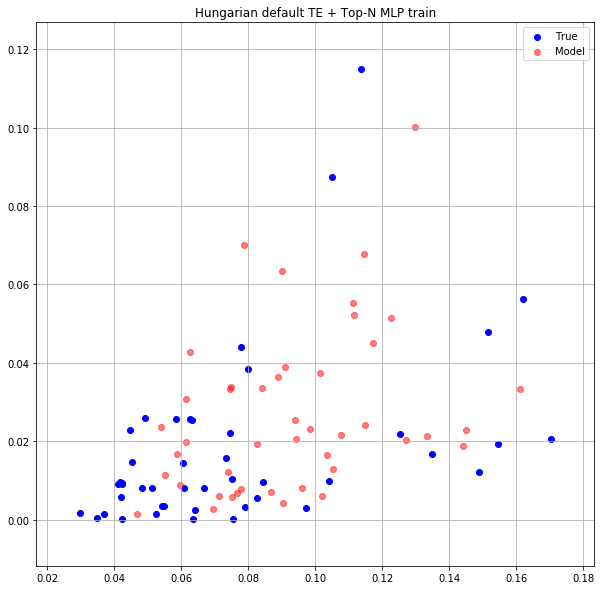

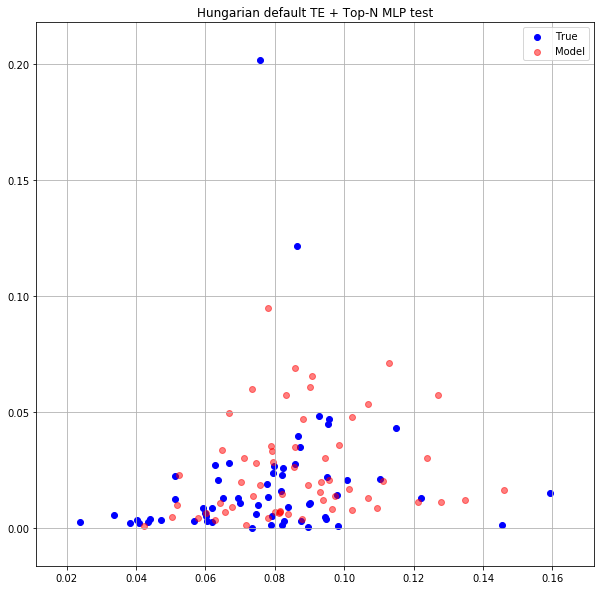

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.0077109830 0.0073382752


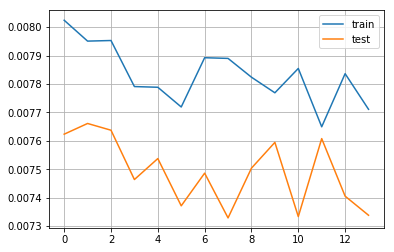

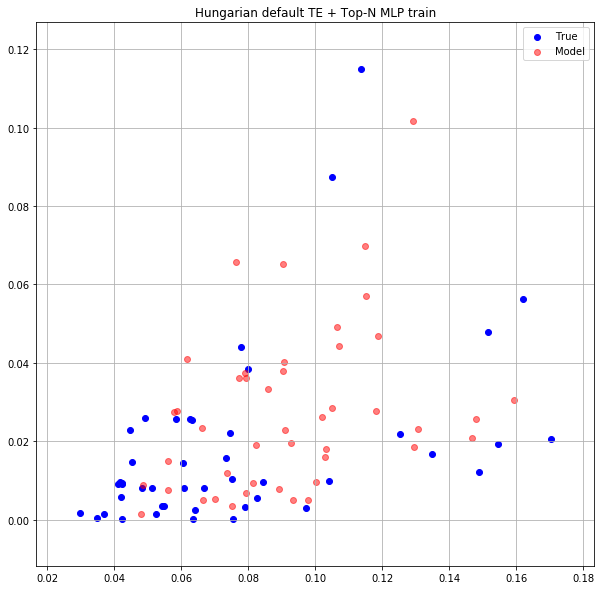

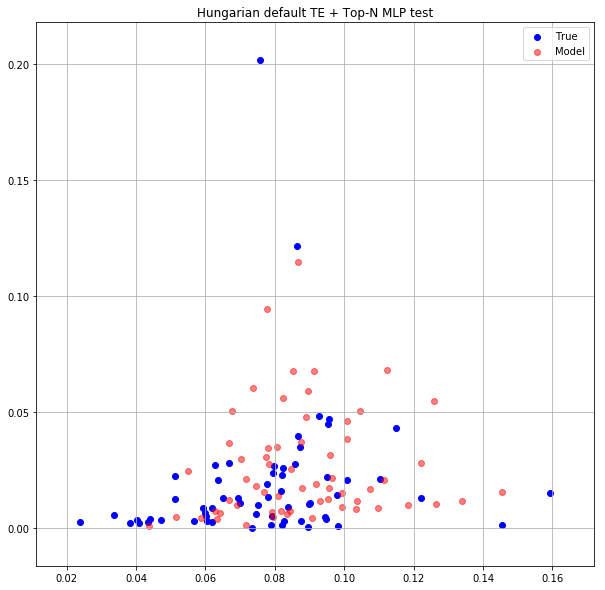

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.0076059951 0.0073591839


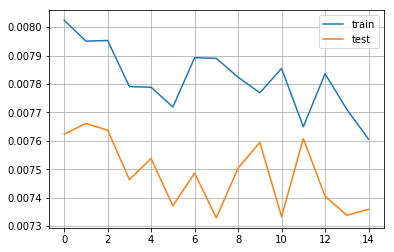

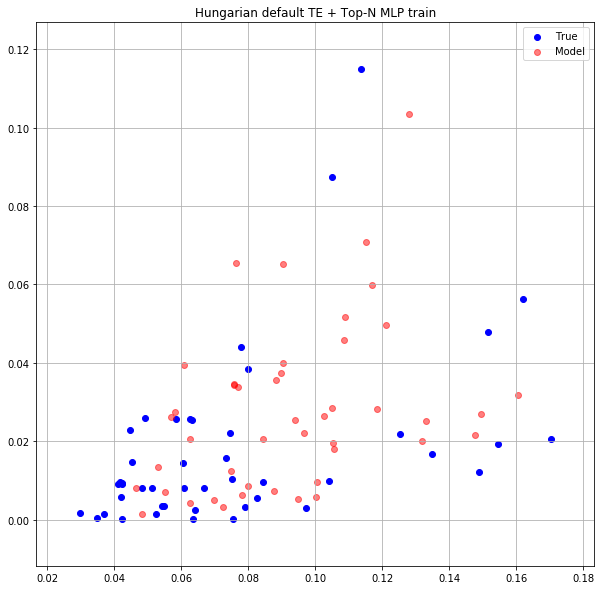

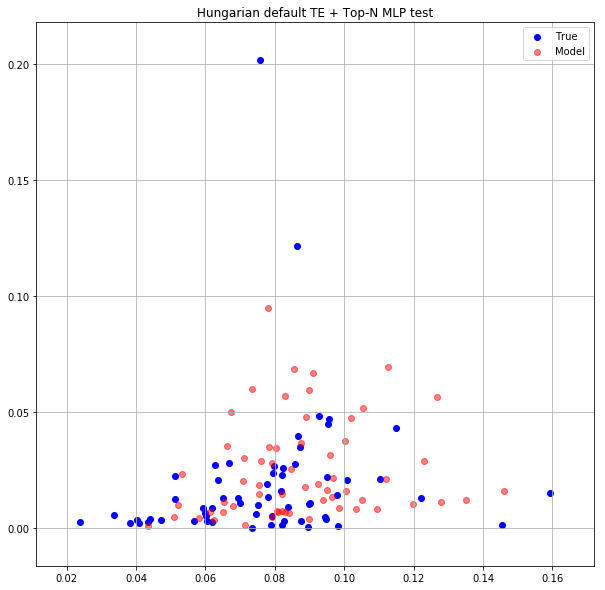

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.0077469228 0.0073741232


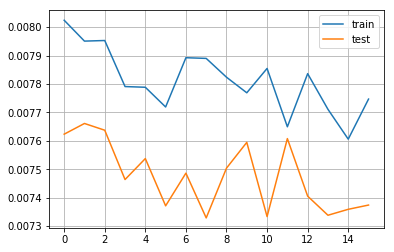

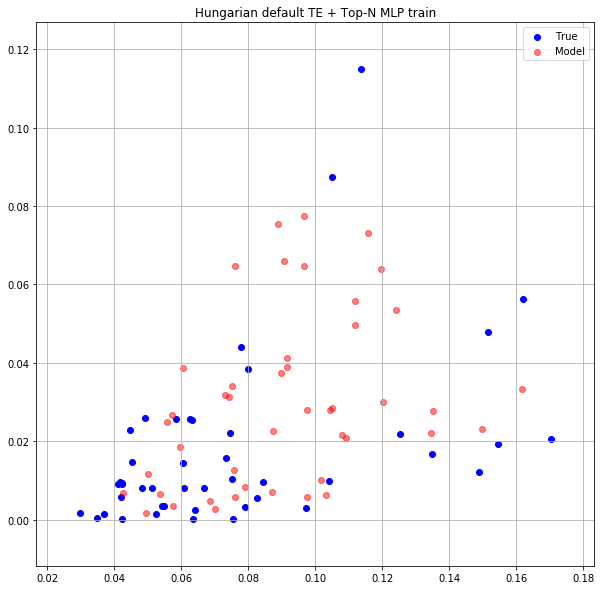

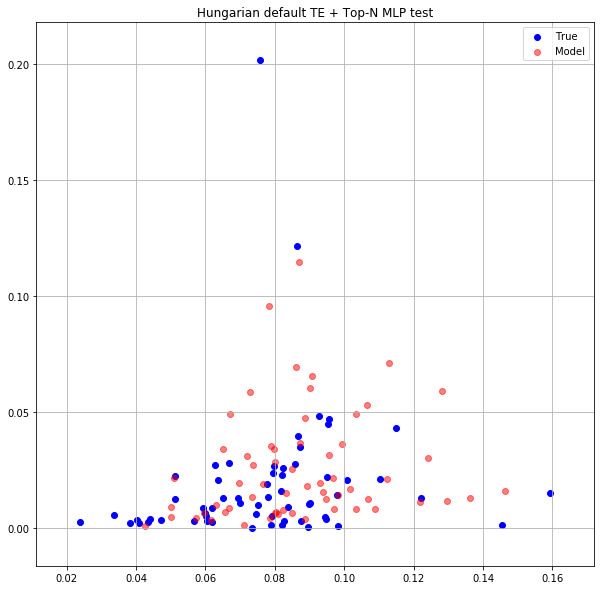

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.0074956585 0.0072947843


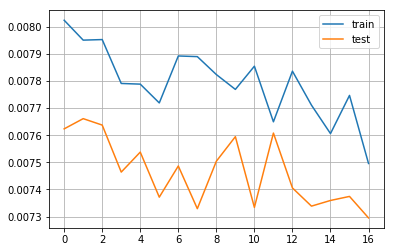

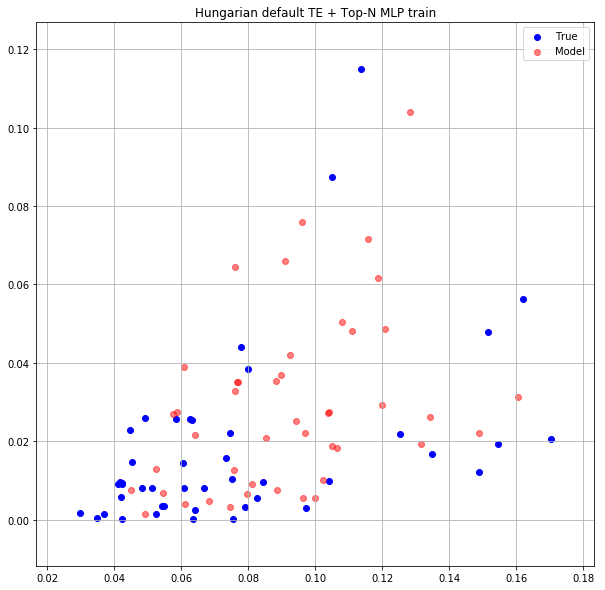

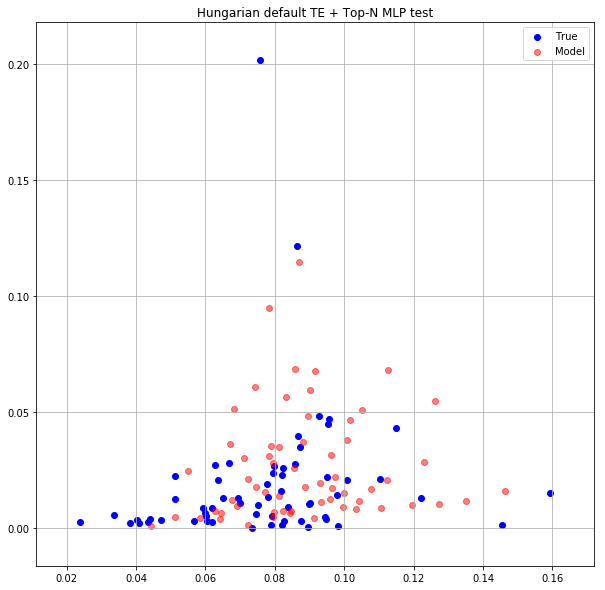

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.0076551675 0.0073455204


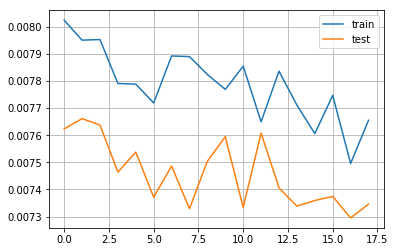

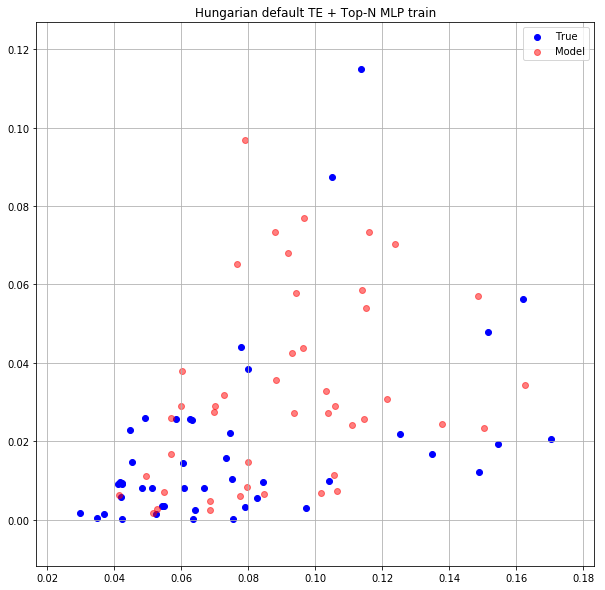

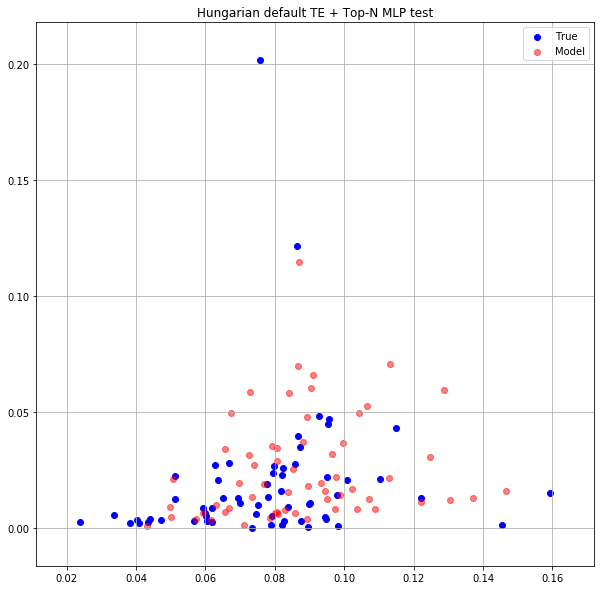

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 0.0076306406 0.0073389942


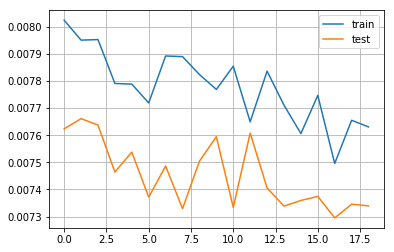

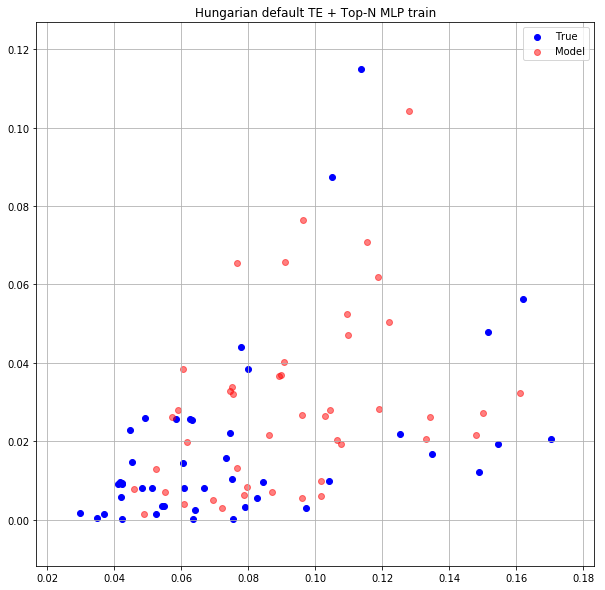

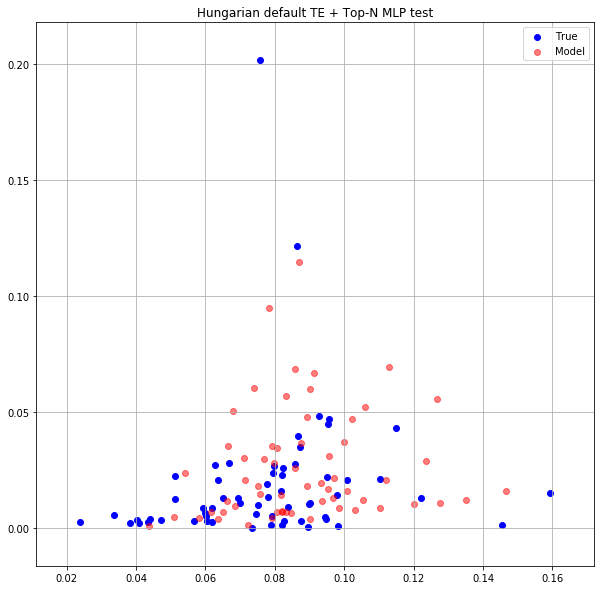

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 0.0075643794 0.0073435619


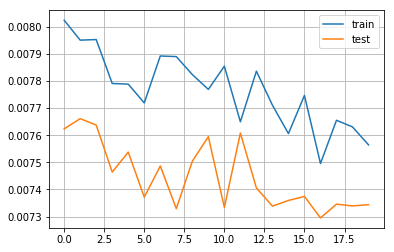

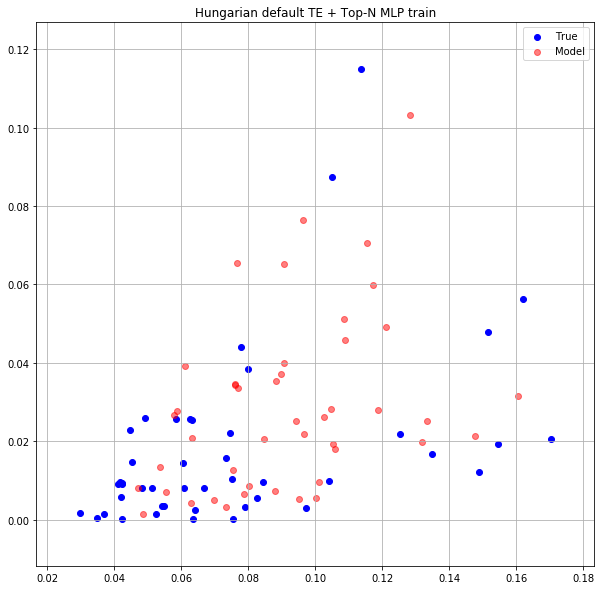

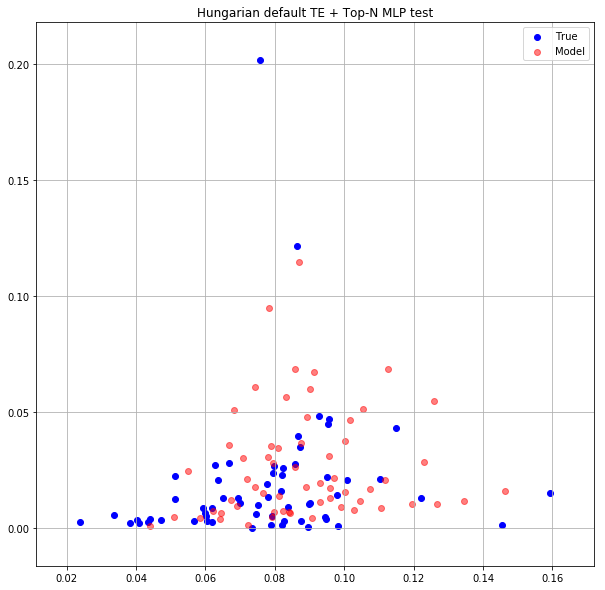

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  20 0.0075476589 0.0073318463


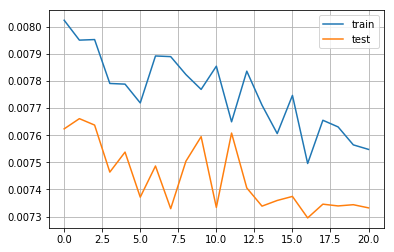

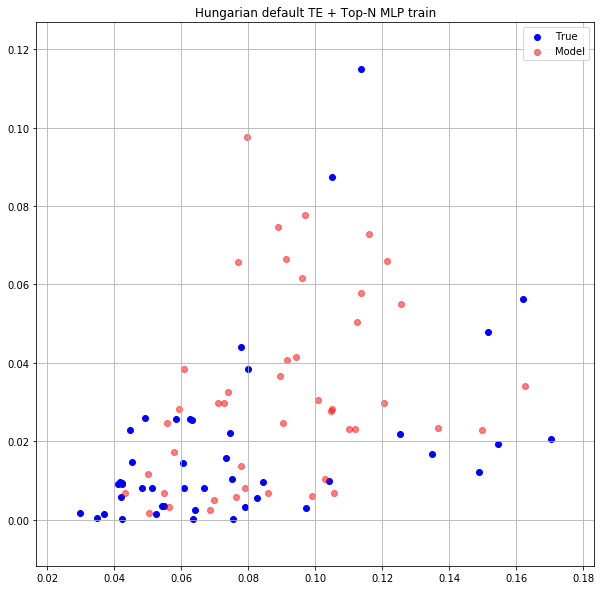

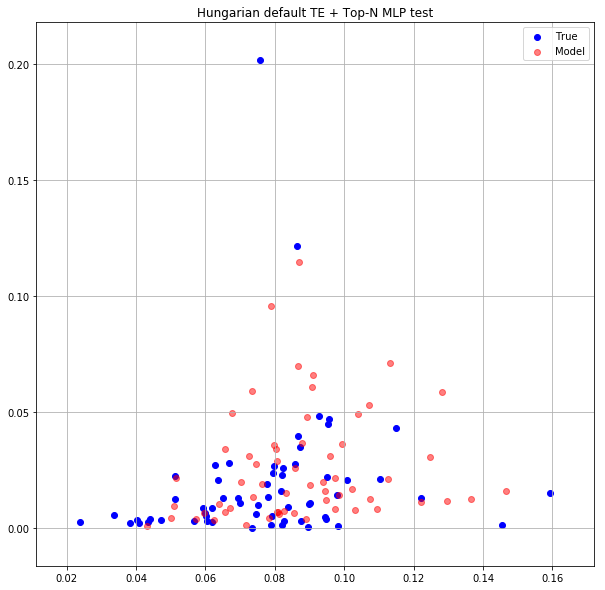

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  21 0.0076588416 0.0073157642


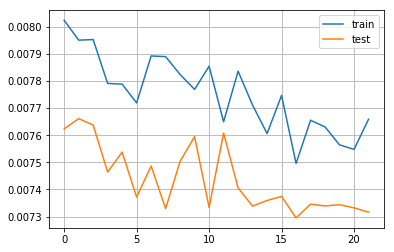

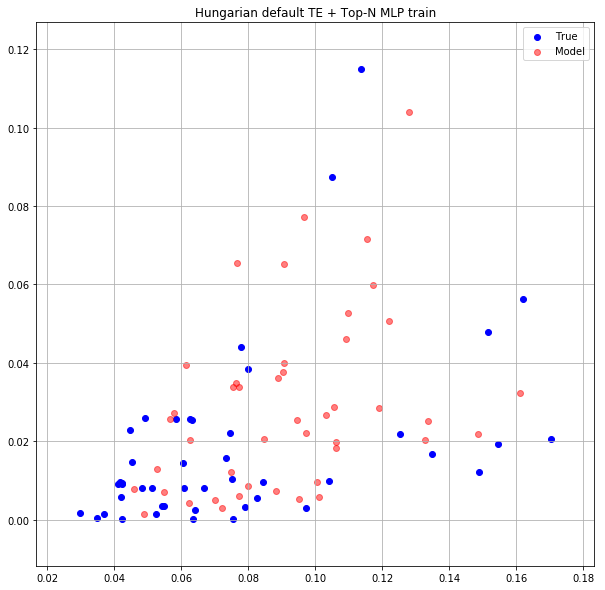

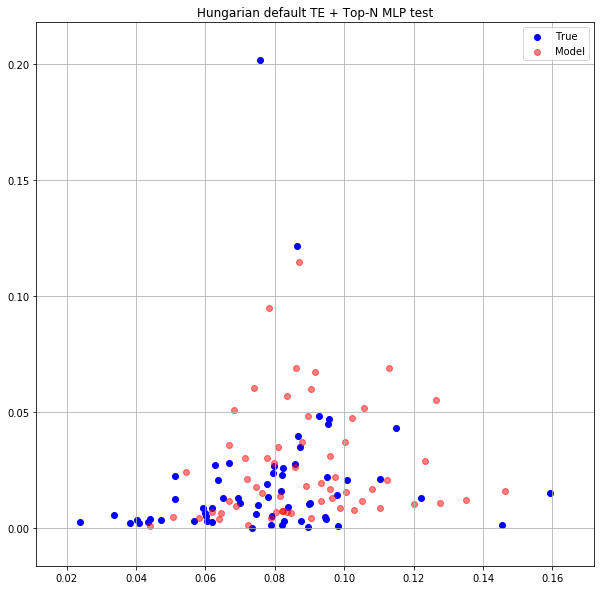

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  22 0.0076291454 0.0073408820


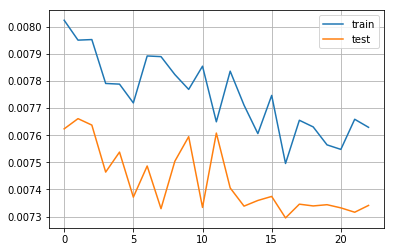

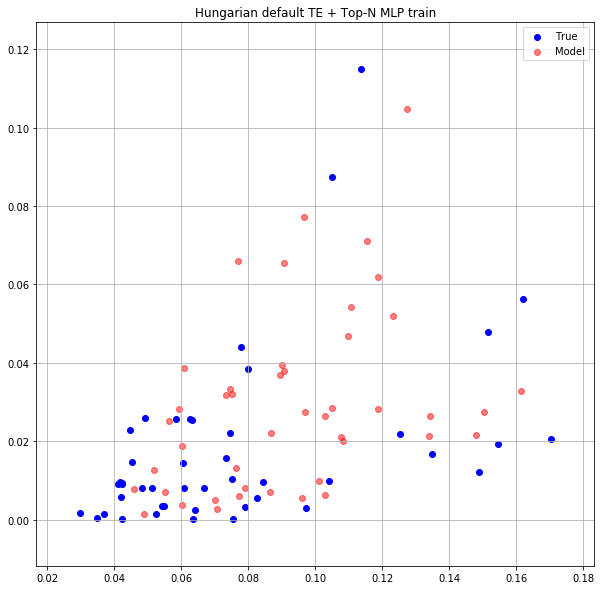

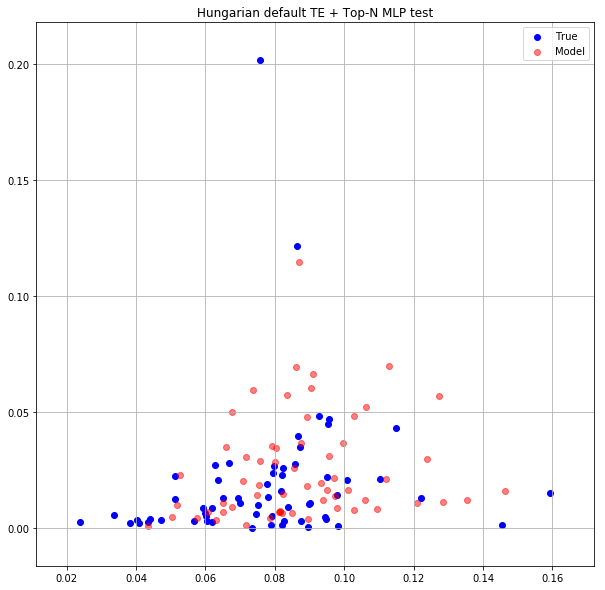

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  23 0.0076155649 0.0073426659


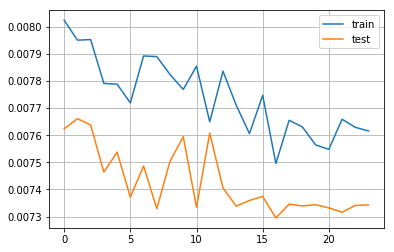

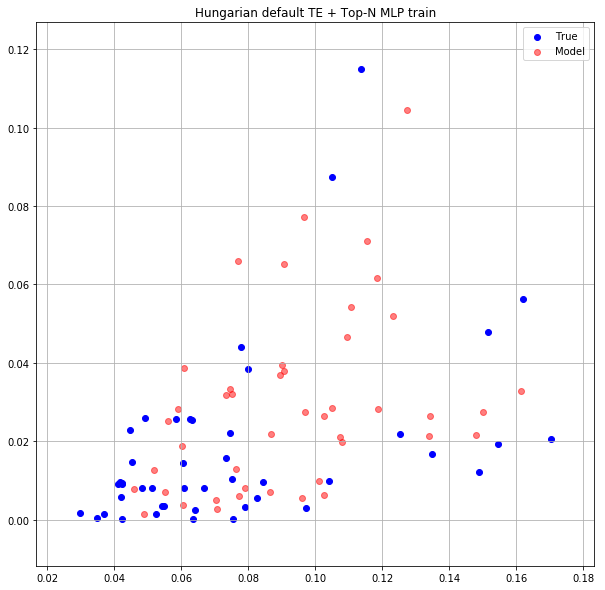

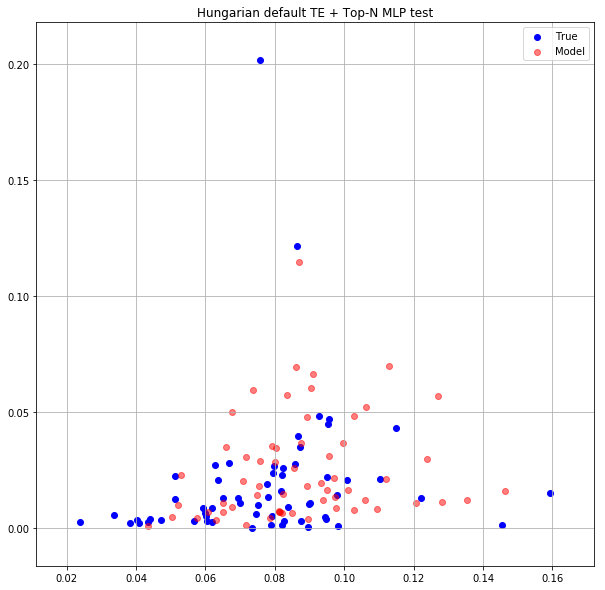

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  24 0.0075173853 0.0073386836


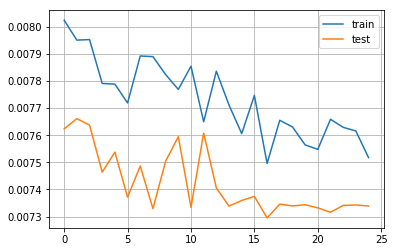

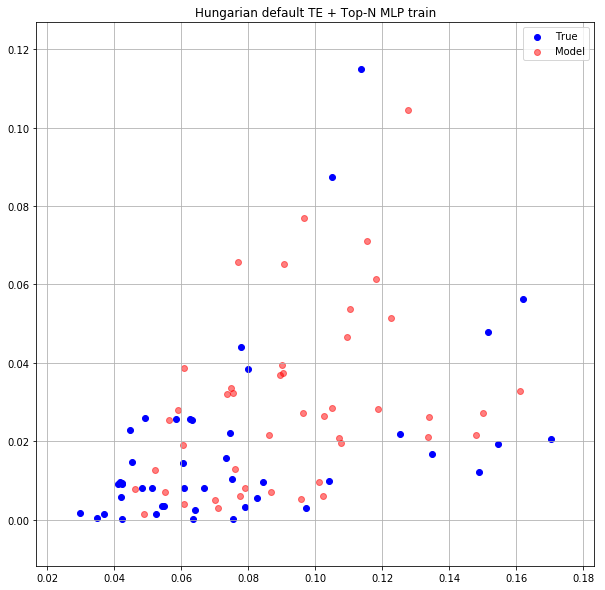

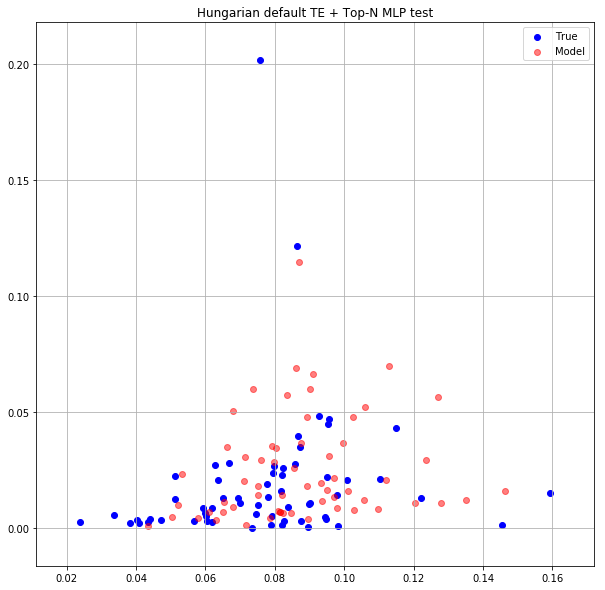

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  25 0.0075664925 0.0073297280


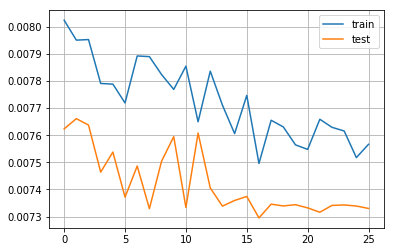

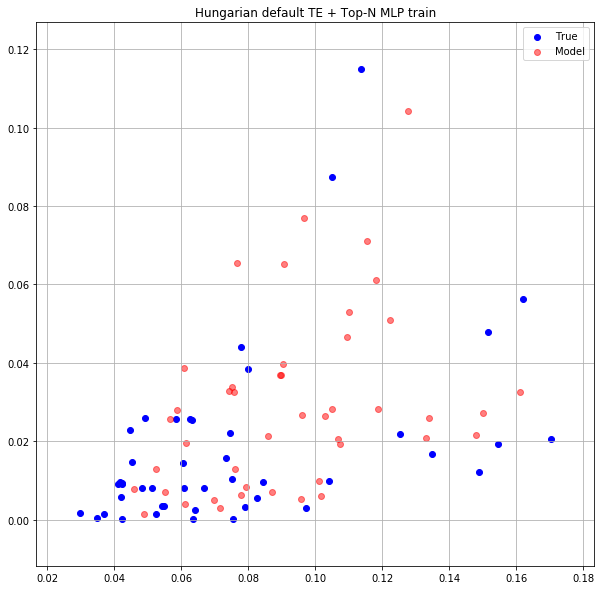

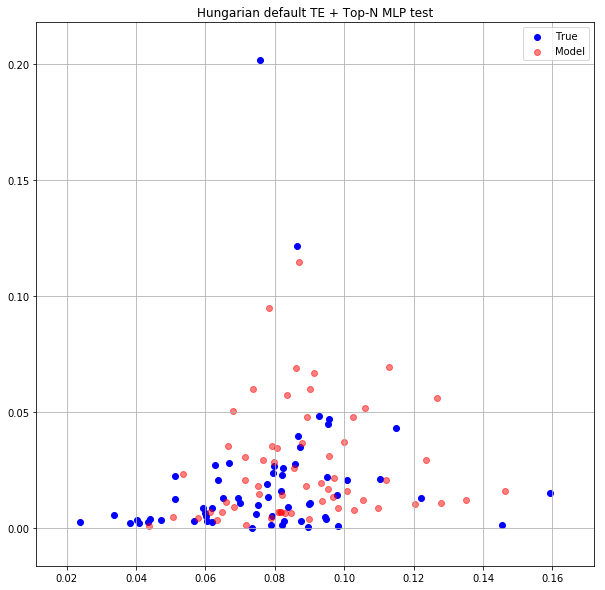

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  26 0.0075581763 0.0073349182


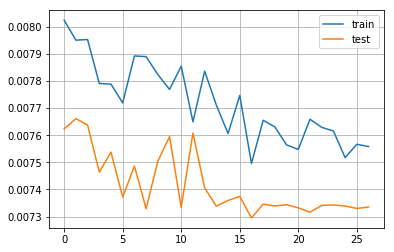

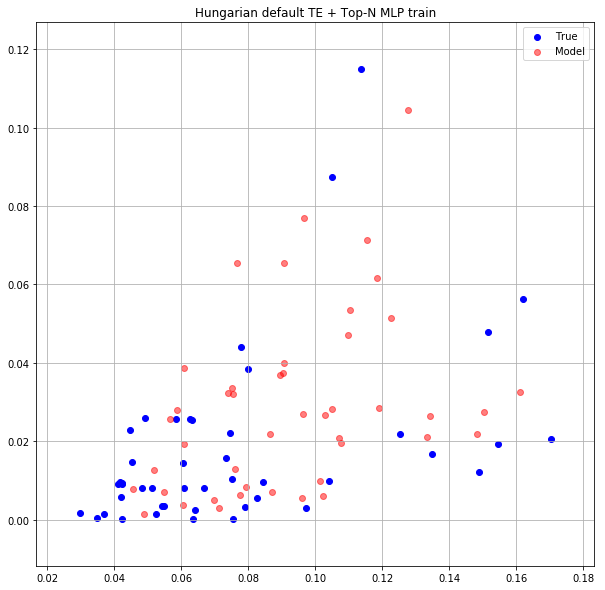

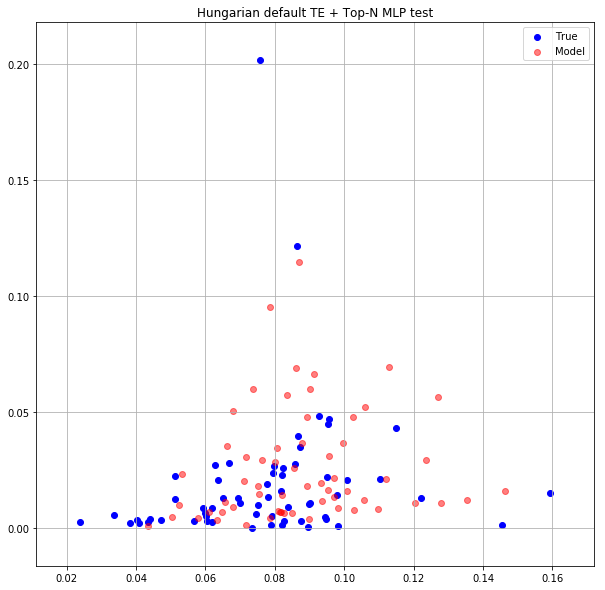

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  27 0.0075702751 0.0073380284


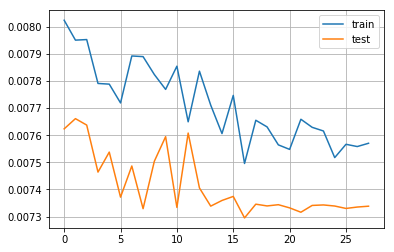

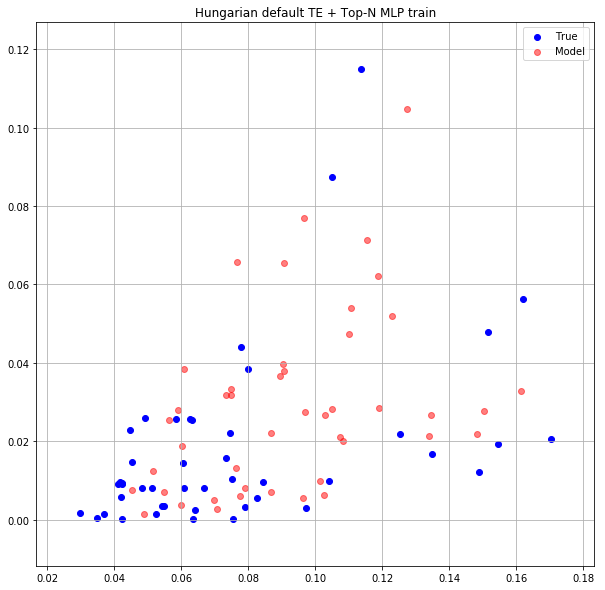

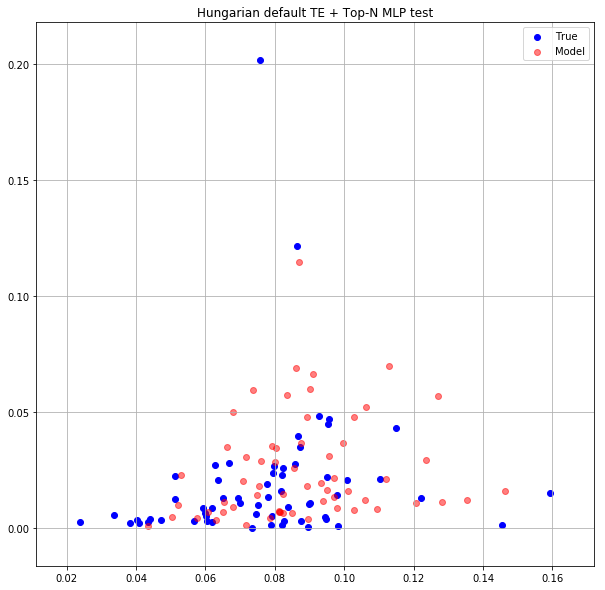

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  28 0.0075724707 0.0073432042


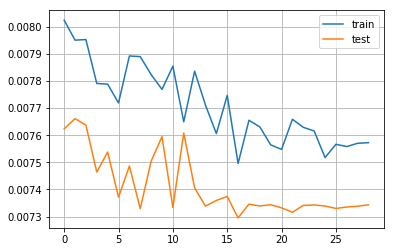

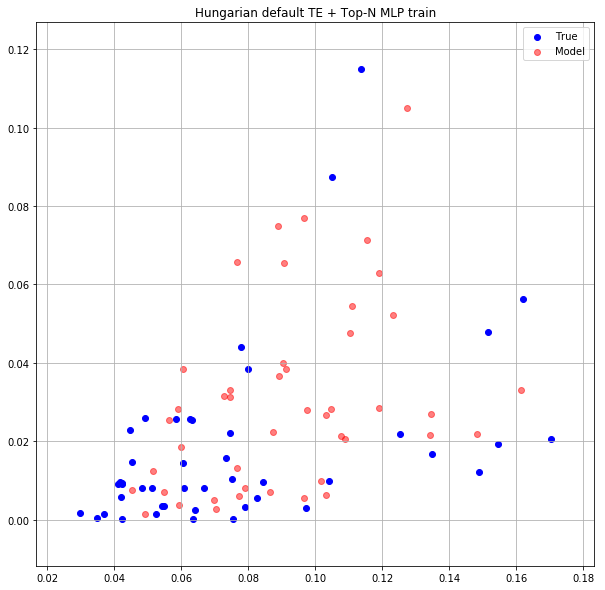

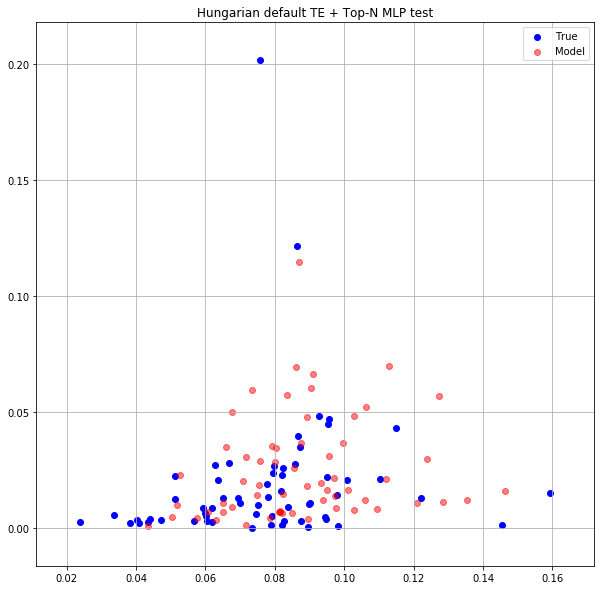

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  29 0.0075726616 0.0073426543


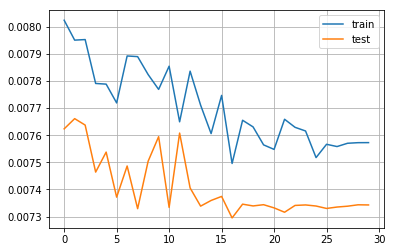

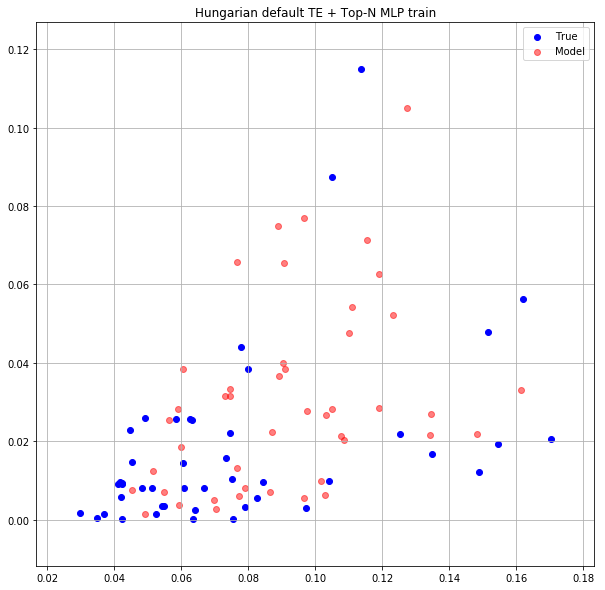

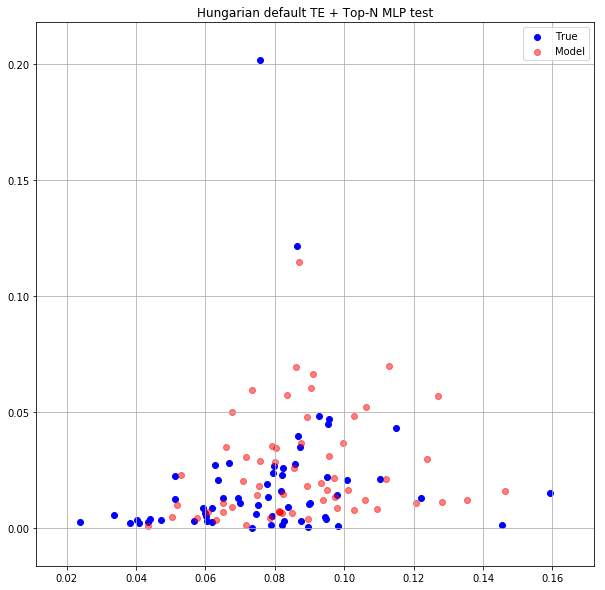

In [62]:
train_loss, val_loss = [], []

for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian_default(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
    train_loss.append(loss_train)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian_default(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
    val_loss.append(loss_test)
    scheduler.step(loss_test)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    
    cur_n = len(train_loss)
    plt.plot(np.arange(cur_n), train_loss, label = 'train')
    plt.plot(np.arange(cur_n), val_loss, label = 'test')
    plt.grid()
    plt.legend()
    plt.show()
    
    
    item = dataset_train[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Hungarian default TE + Top-N MLP train")
    plt.show()
    
    
    
    item = dataset_test[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Hungarian default TE + Top-N MLP test")
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.0105552217 0.0114614246


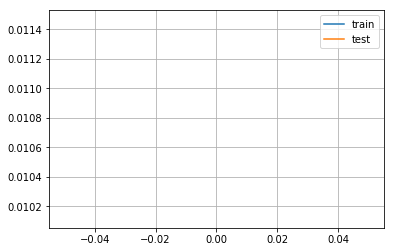

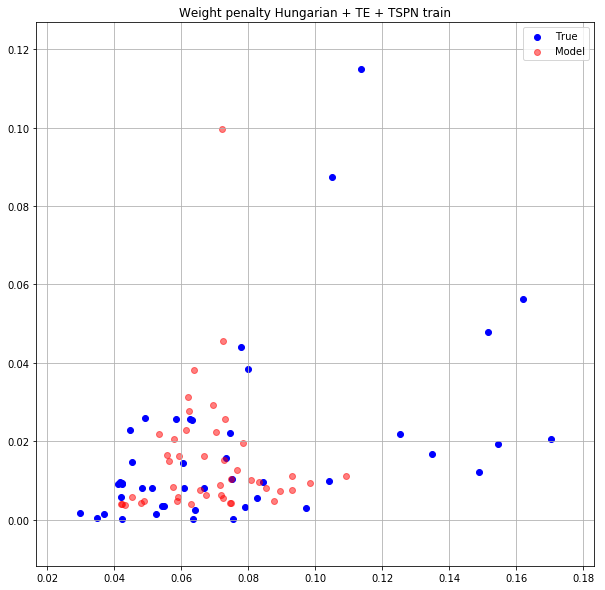

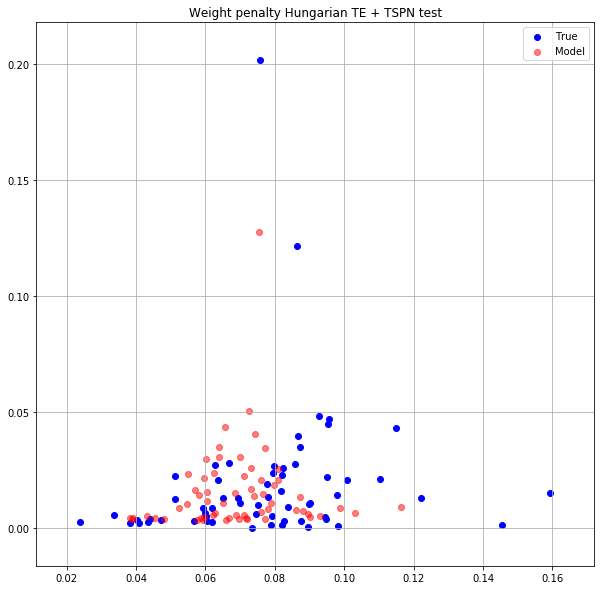

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.0105697922 0.0094729075


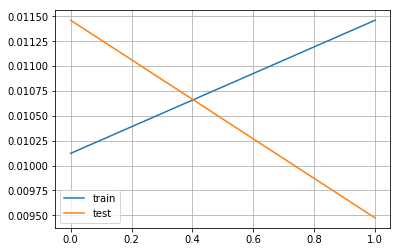

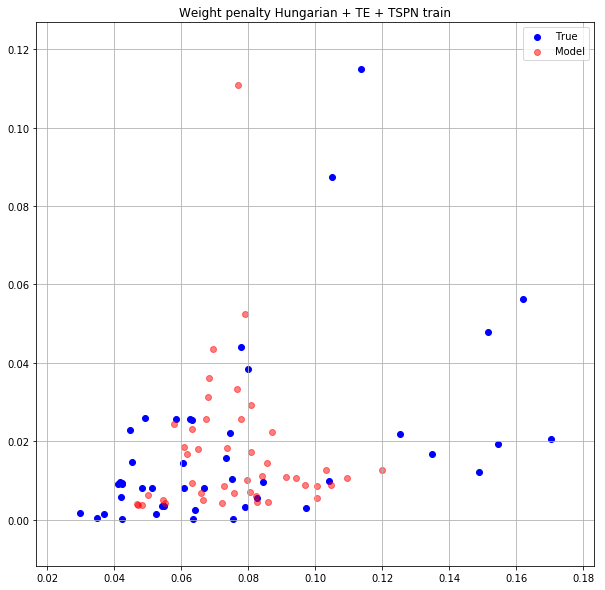

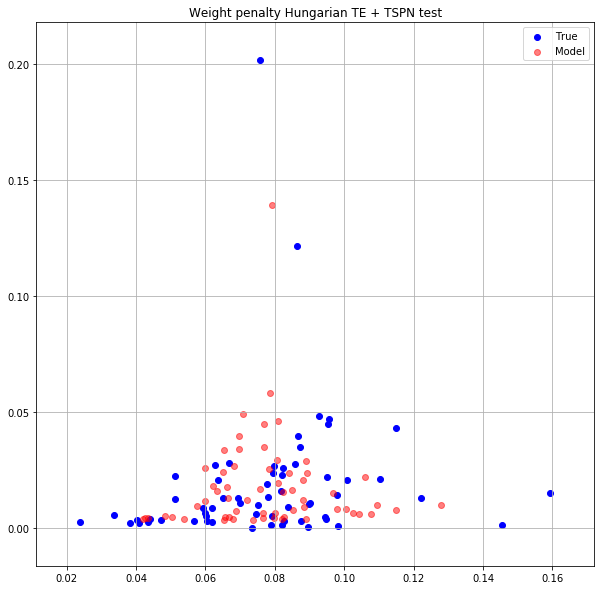

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.0107061807 0.0105614541


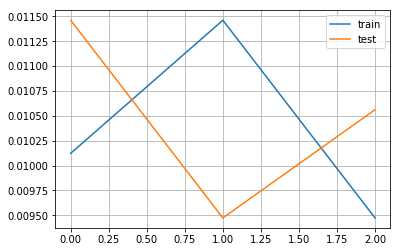

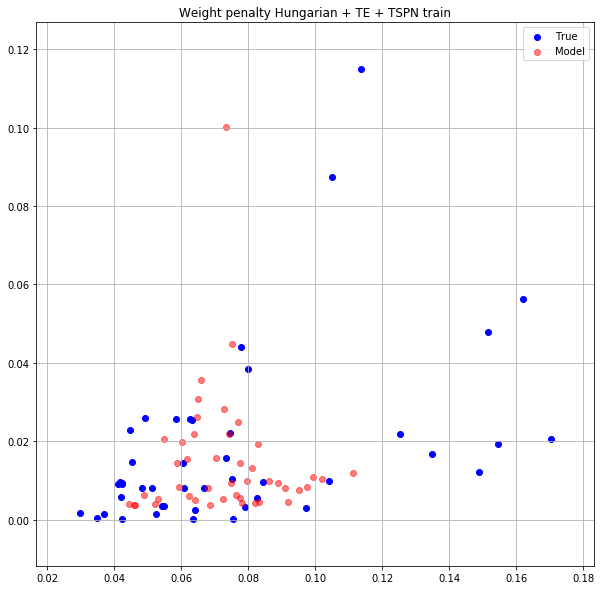

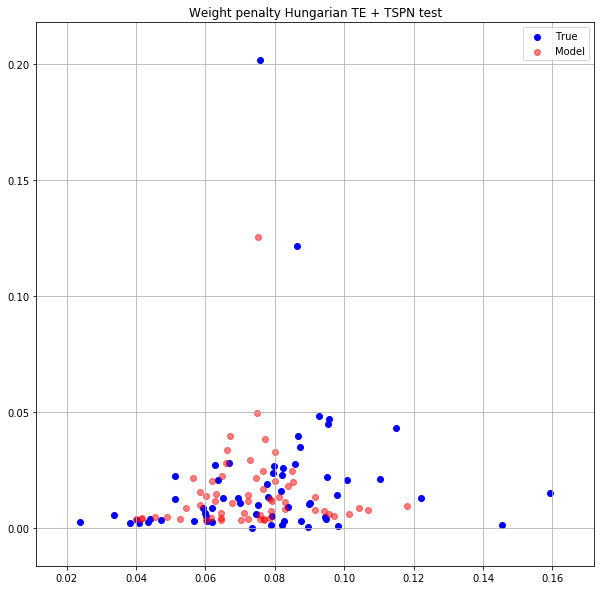

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.0105353165 0.0102118794


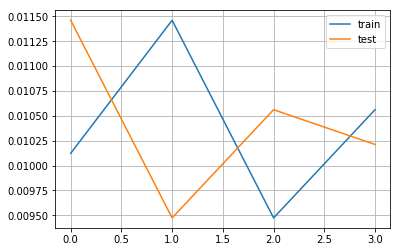

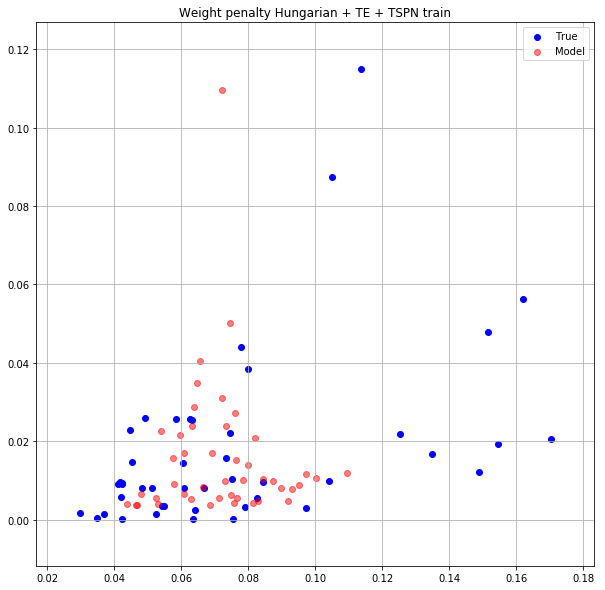

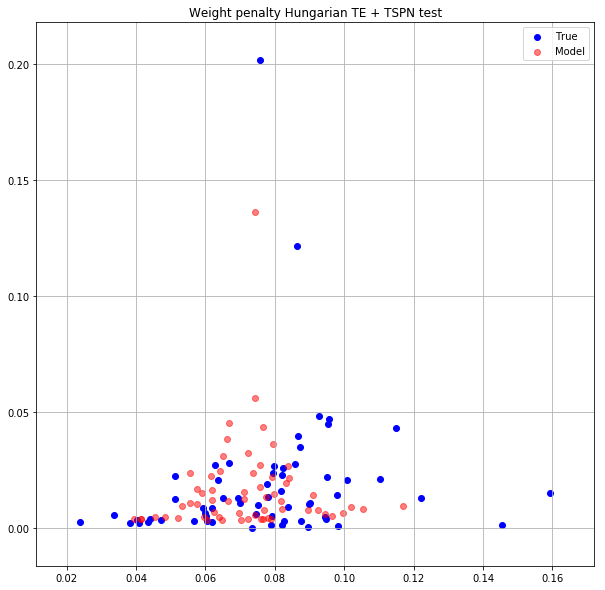

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.0104148556 0.0100770965


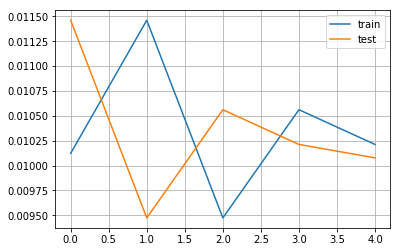

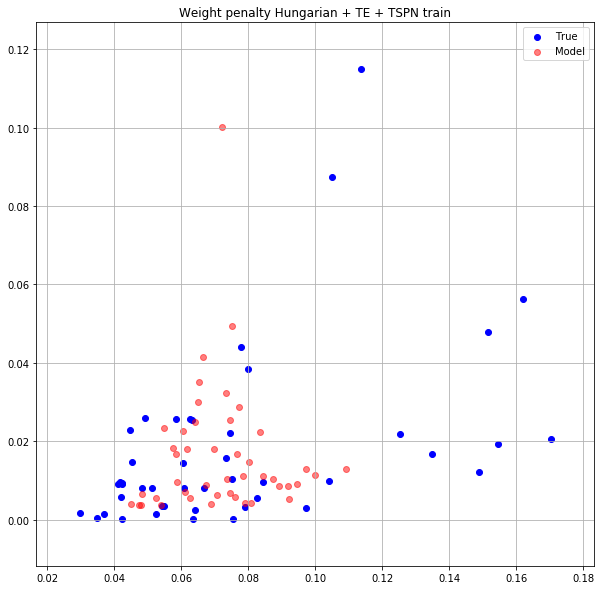

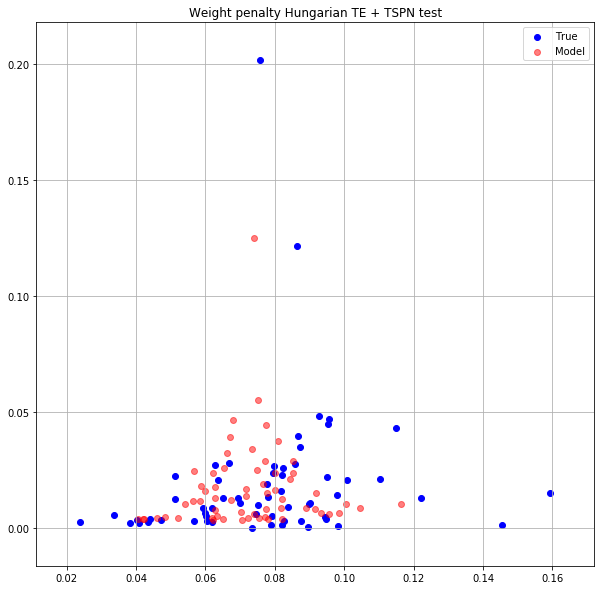

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.0103633134 0.0094937347


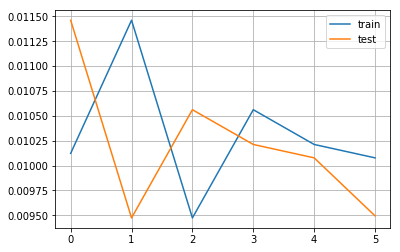

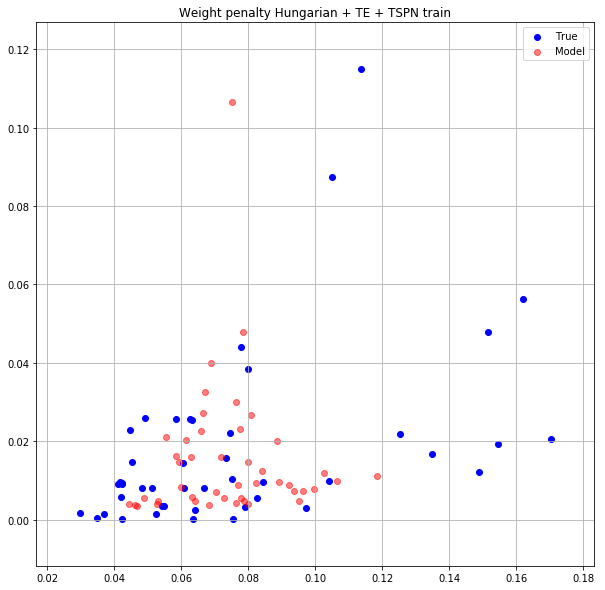

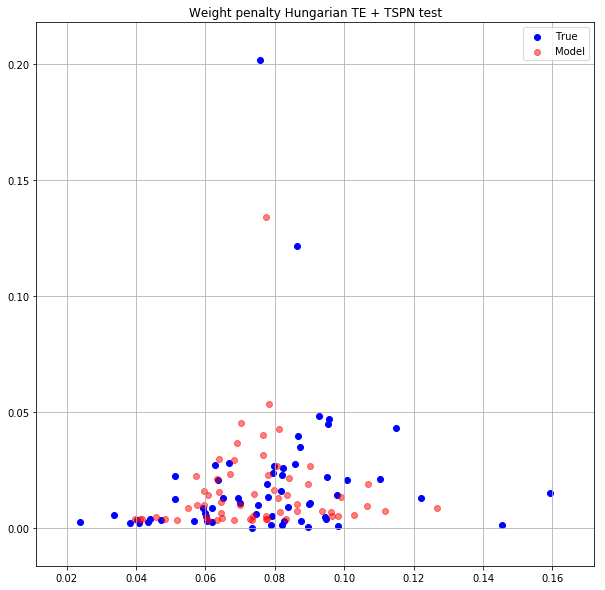

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0102918744 0.0091759516


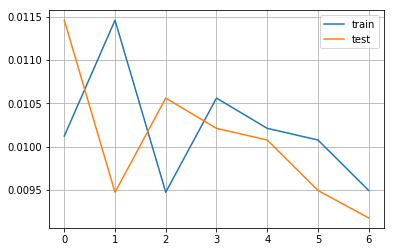

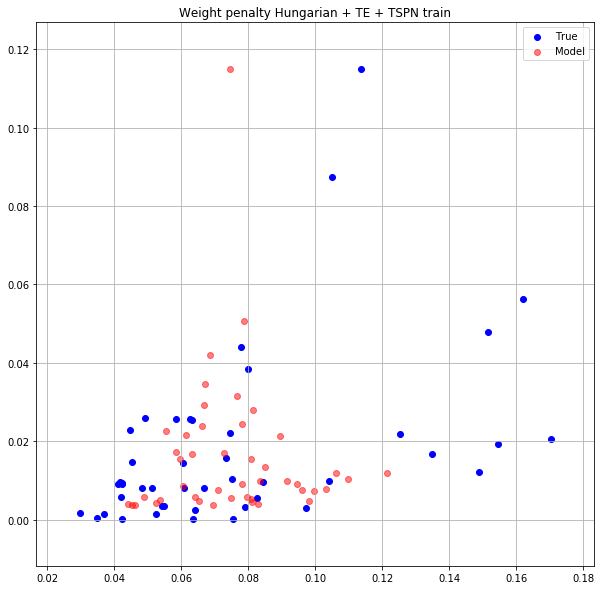

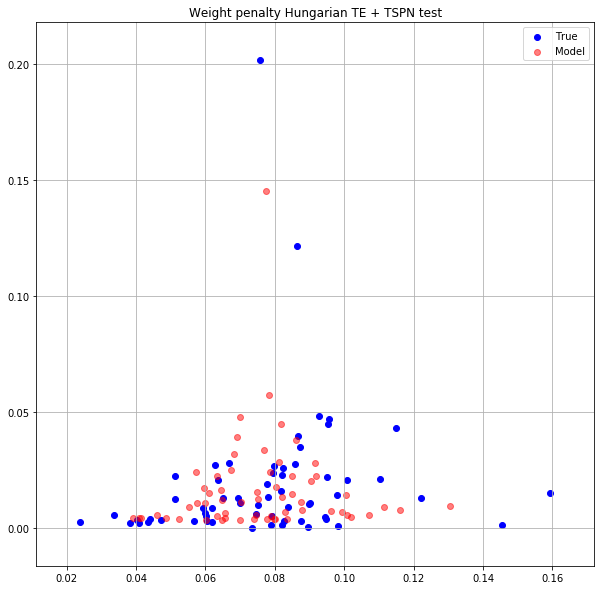

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0103873881 0.0093088476


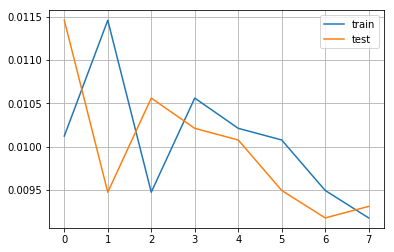

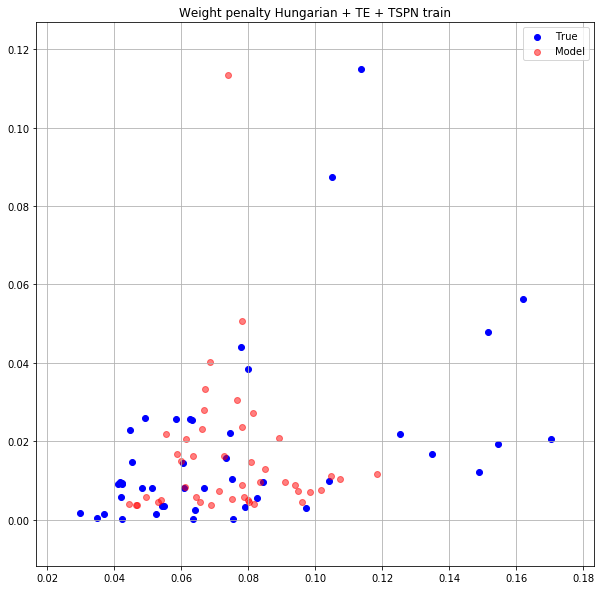

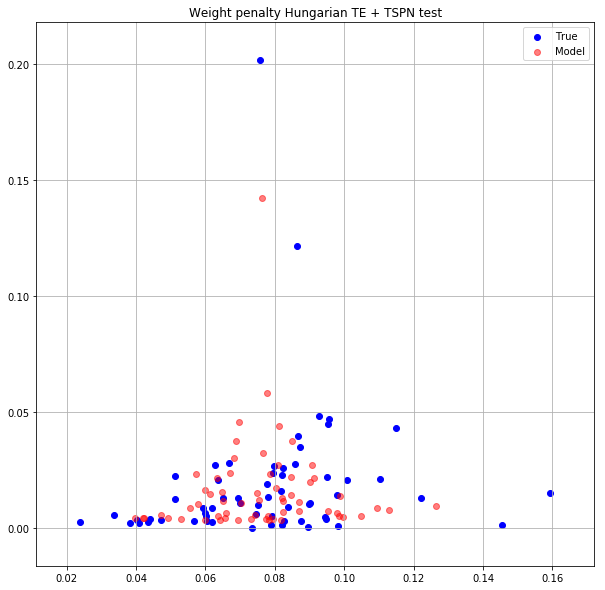

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0102237770 0.0098984595


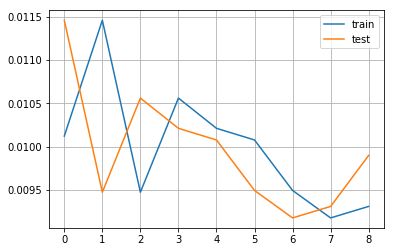

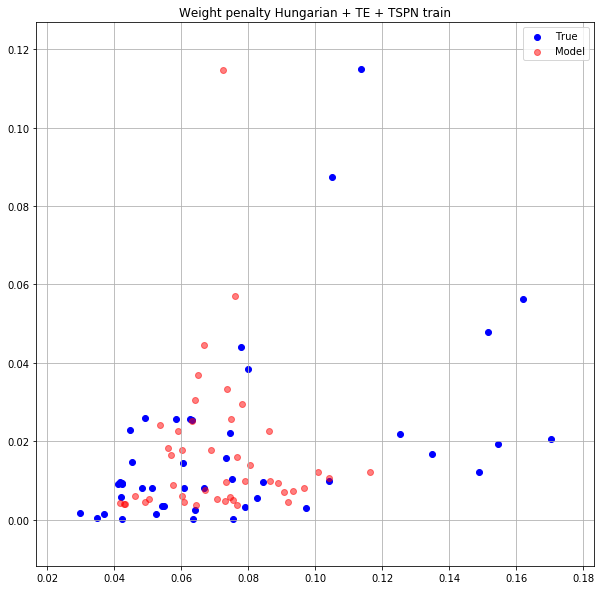

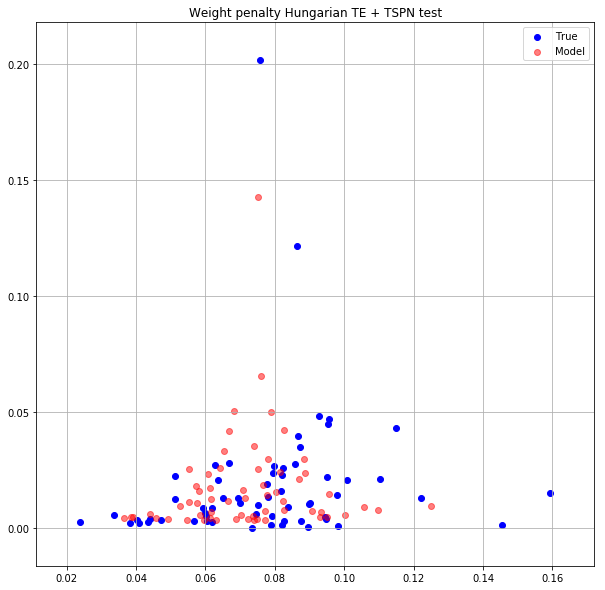

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0102354148 0.0093967561


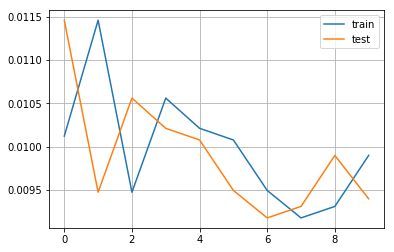

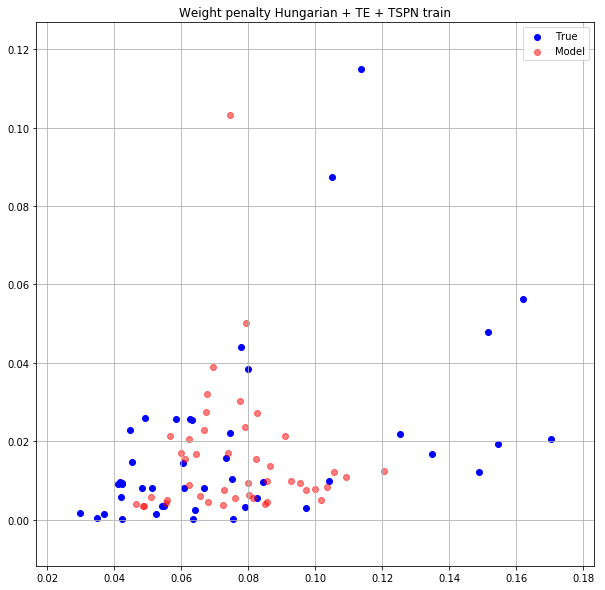

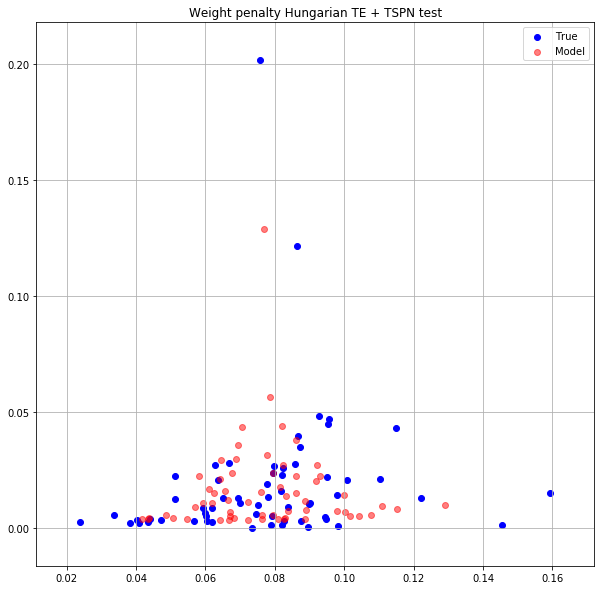

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0103040328 0.0095460871


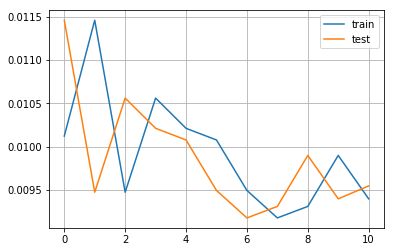

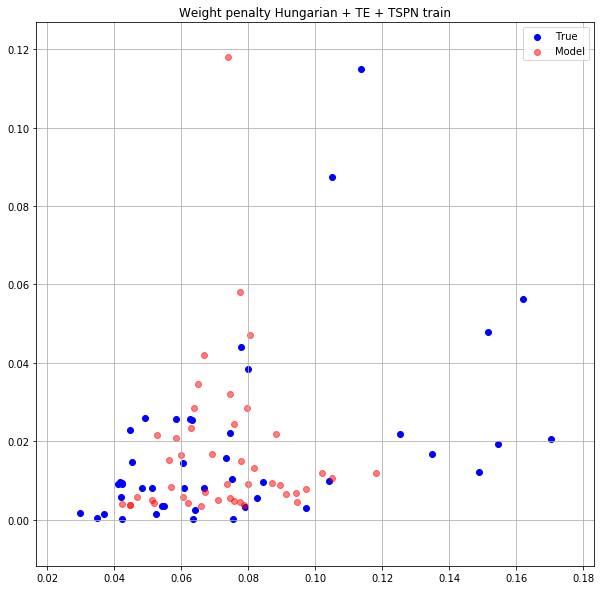

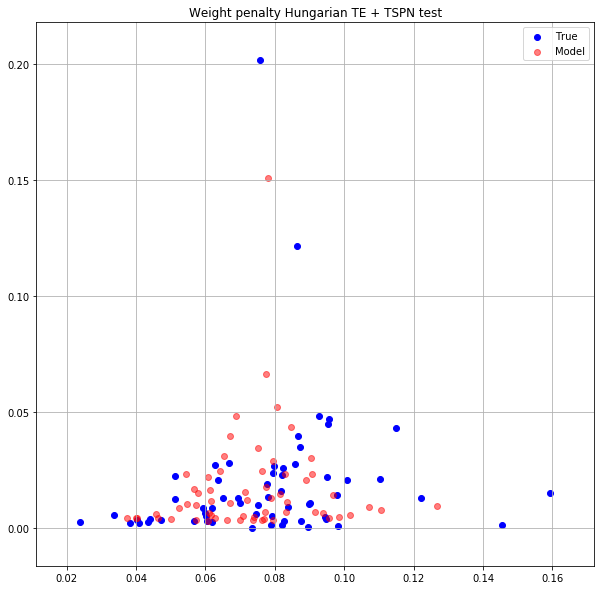

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0102394195 0.0111247944


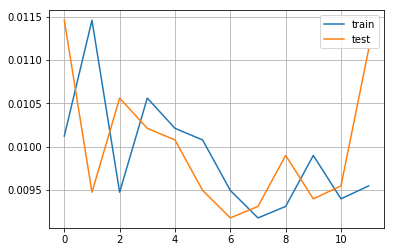

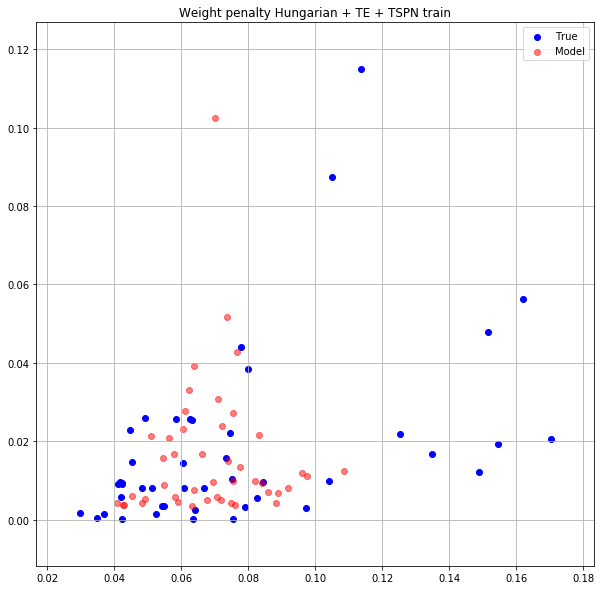

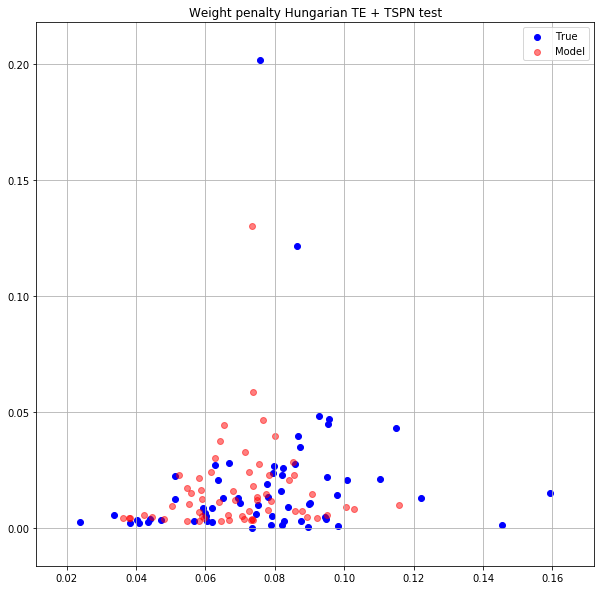

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.0102272360 0.0096301585


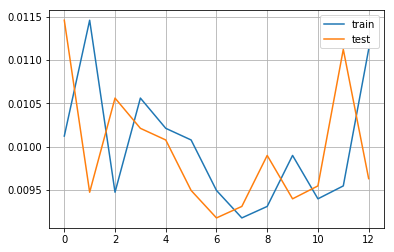

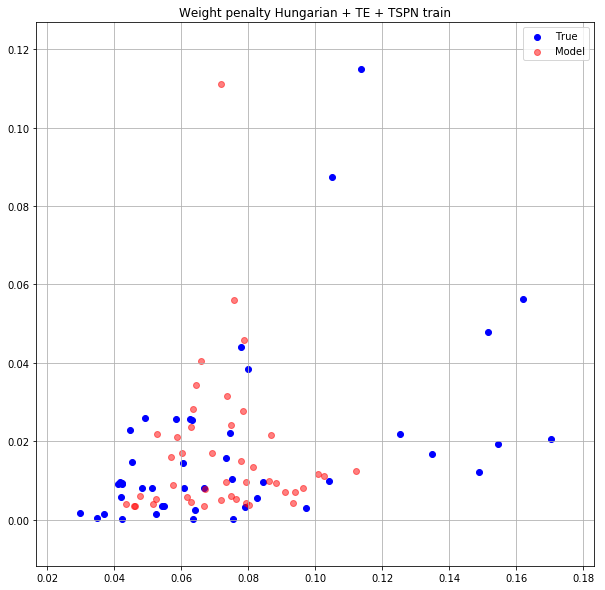

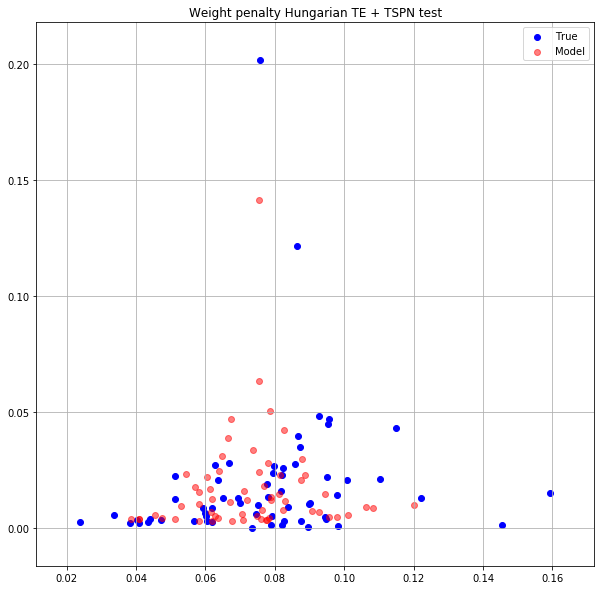

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.0100467233 0.0091935983


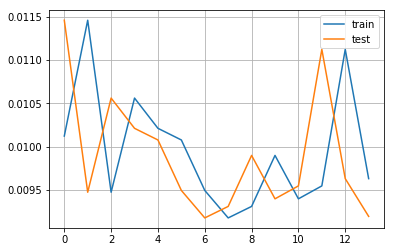

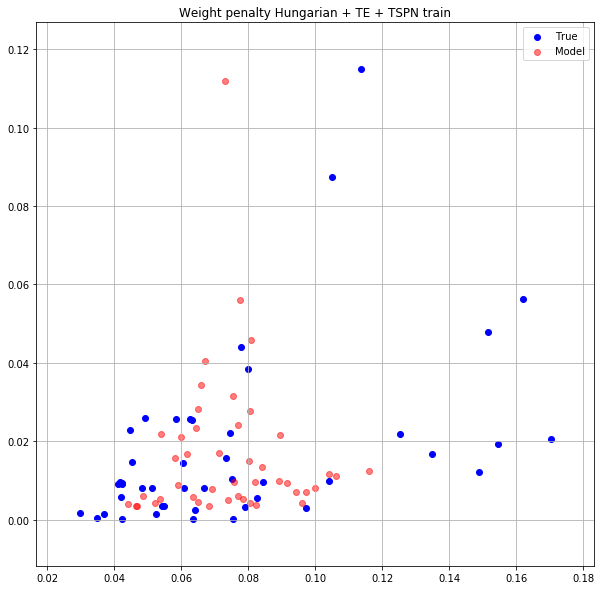

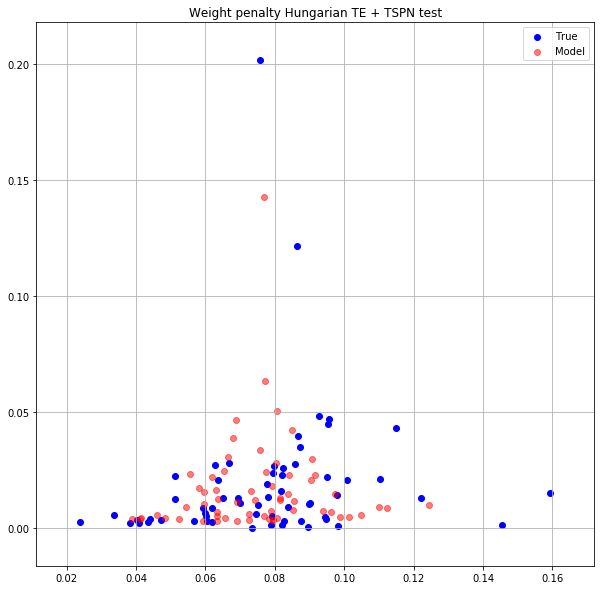

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.0100696711 0.0091774072


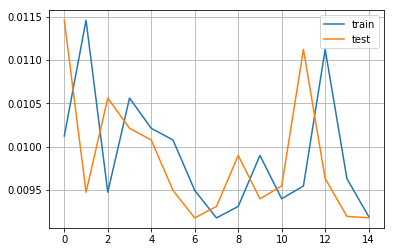

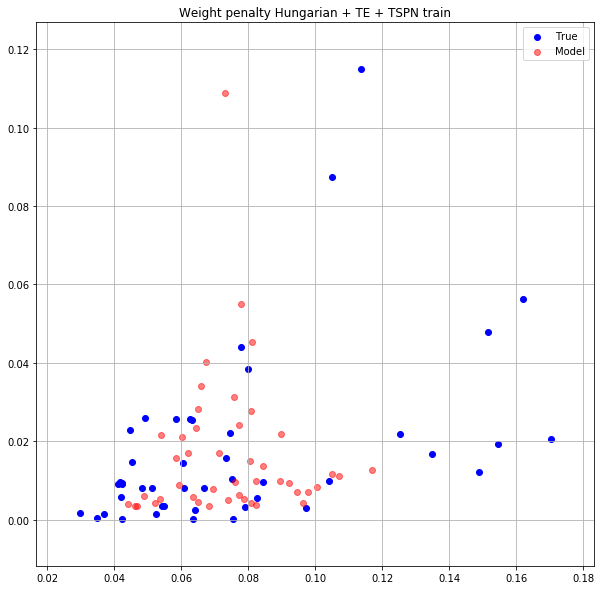

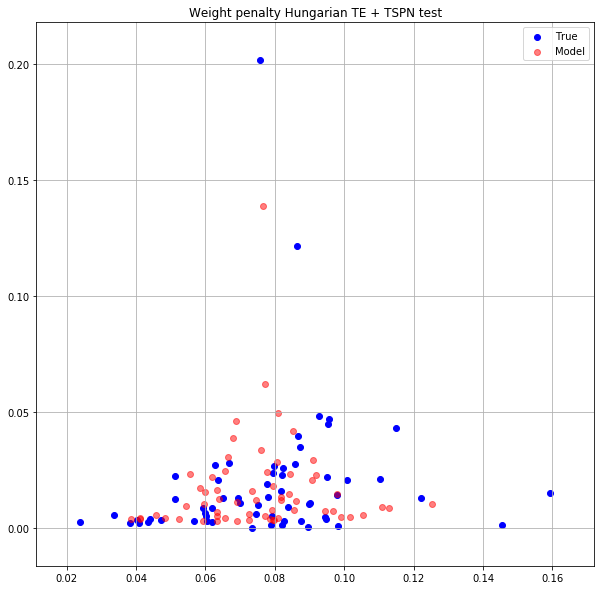

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.0099720750 0.0093696527


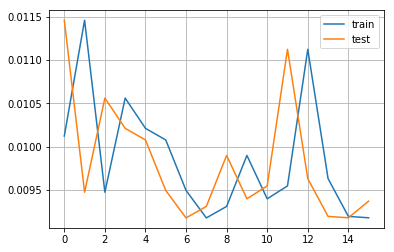

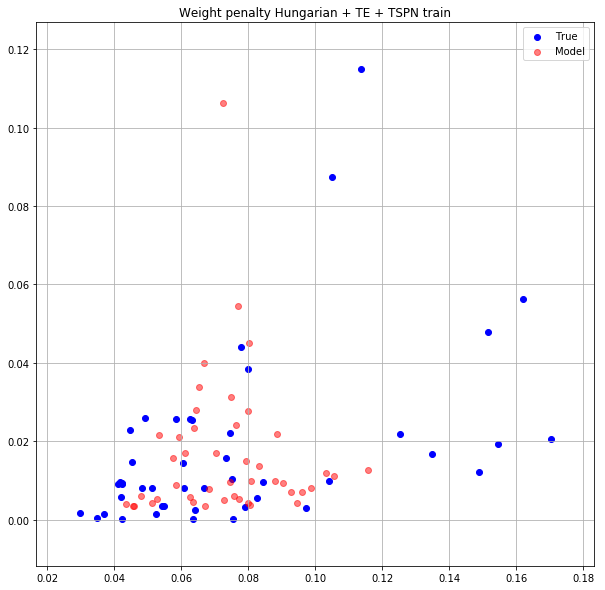

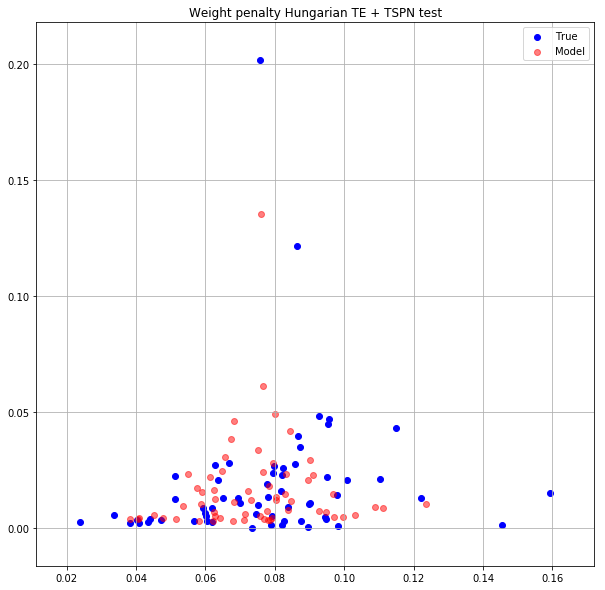

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.0099512134 0.0092471763


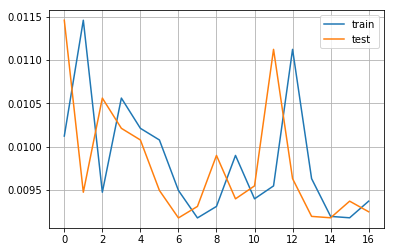

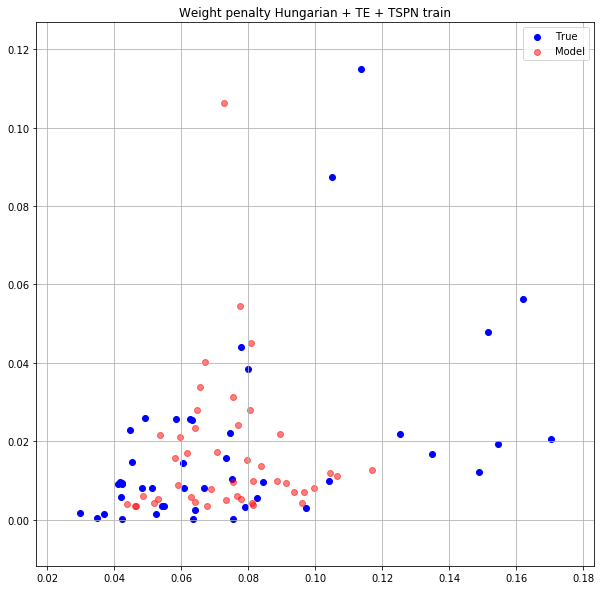

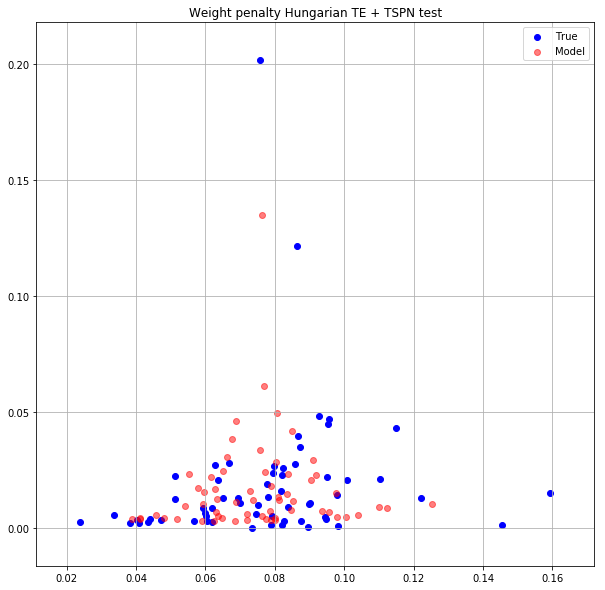

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.0100511108 0.0091537144


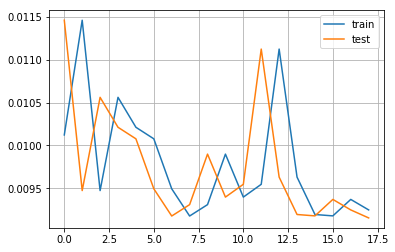

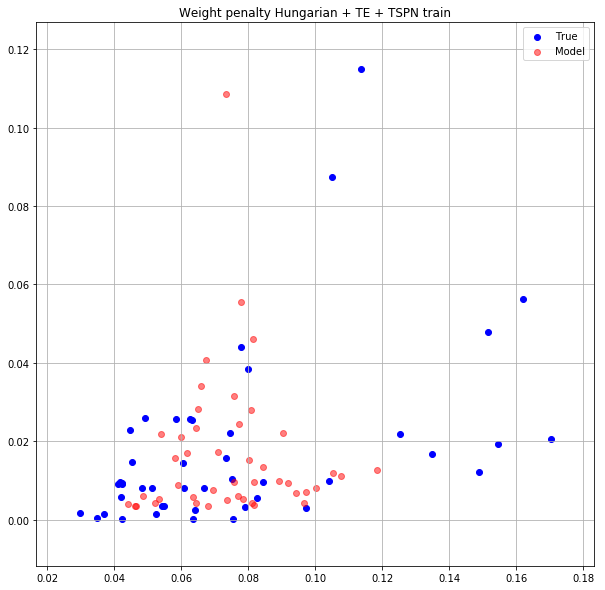

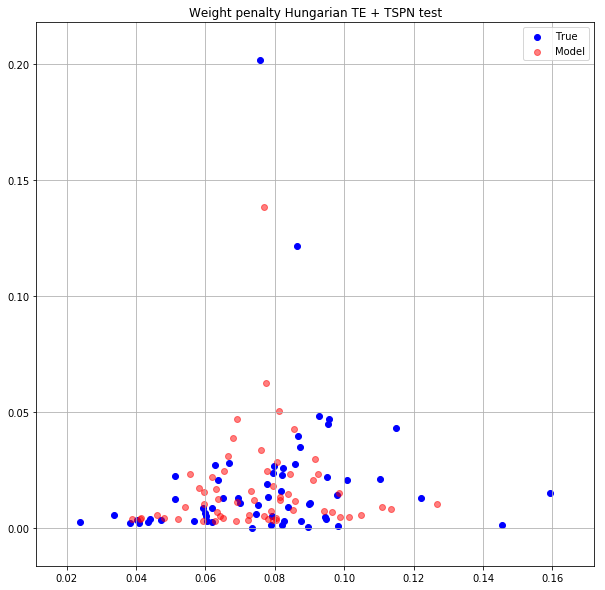

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 0.0099636493 0.0092715938


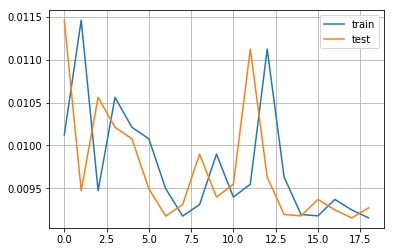

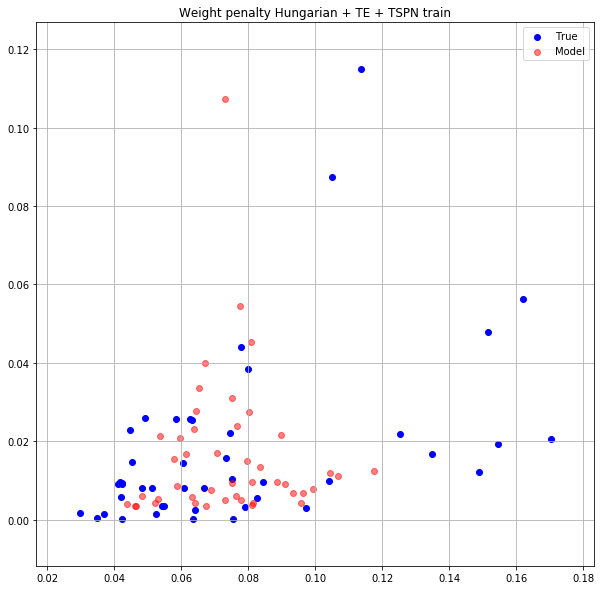

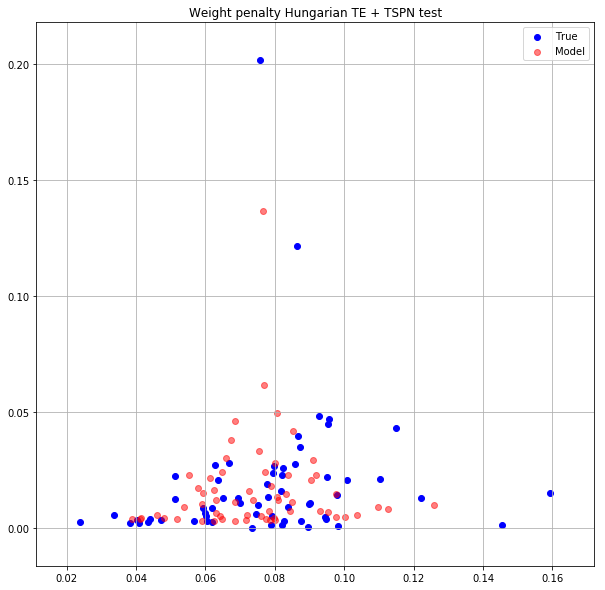

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 0.0099954400 0.0092776595


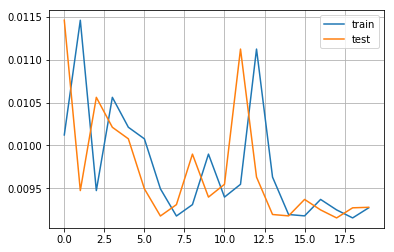

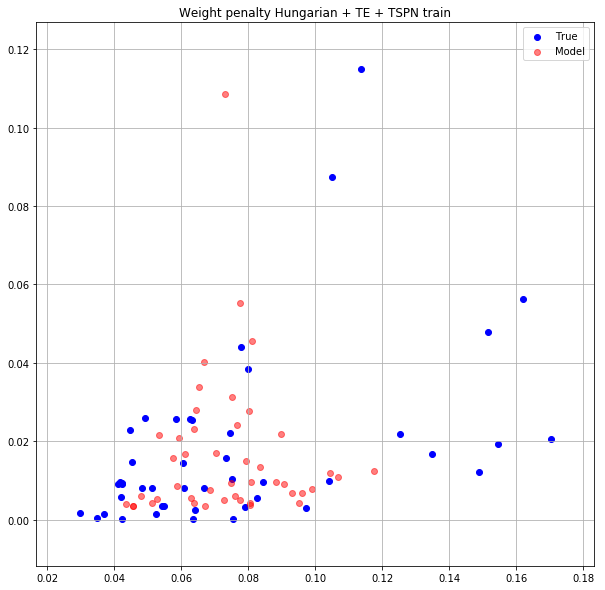

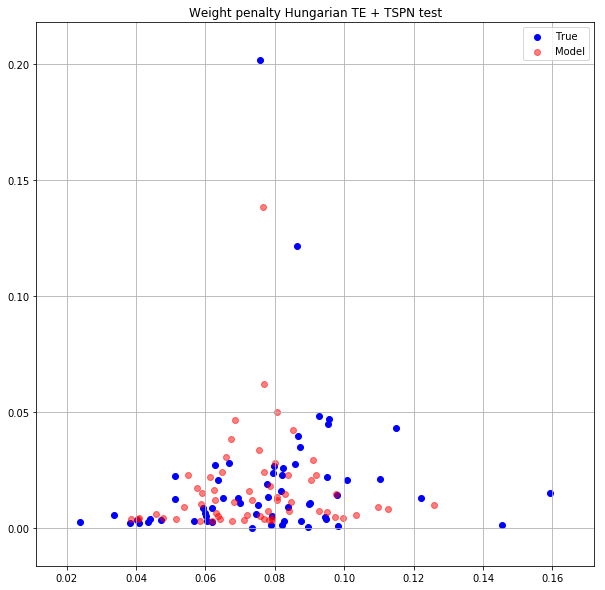

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  20 0.0100934645 0.0091327904


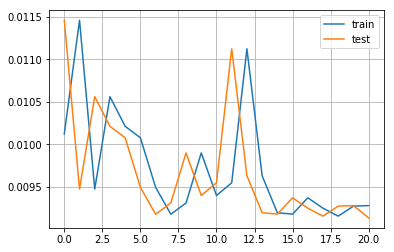

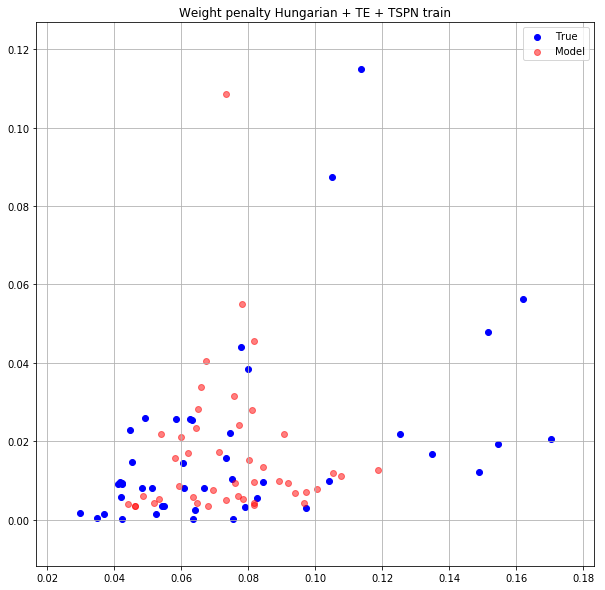

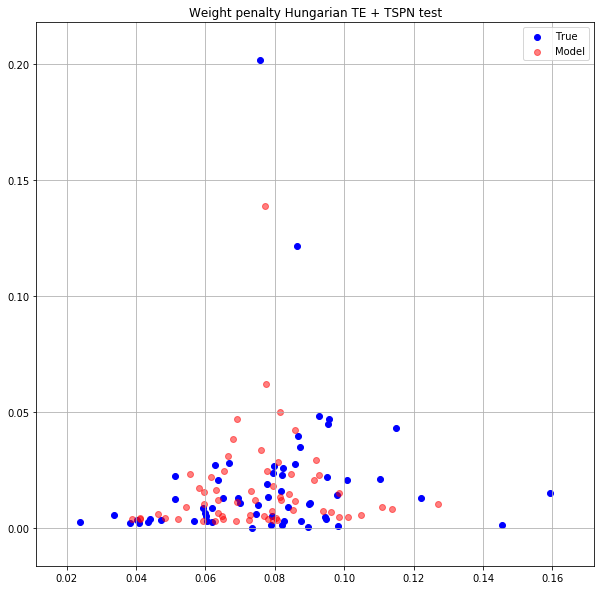

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  21 0.0099669928 0.0092373304


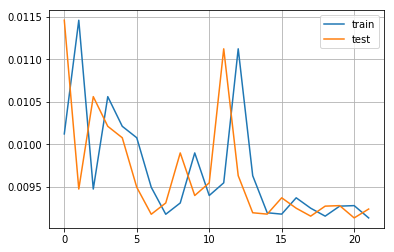

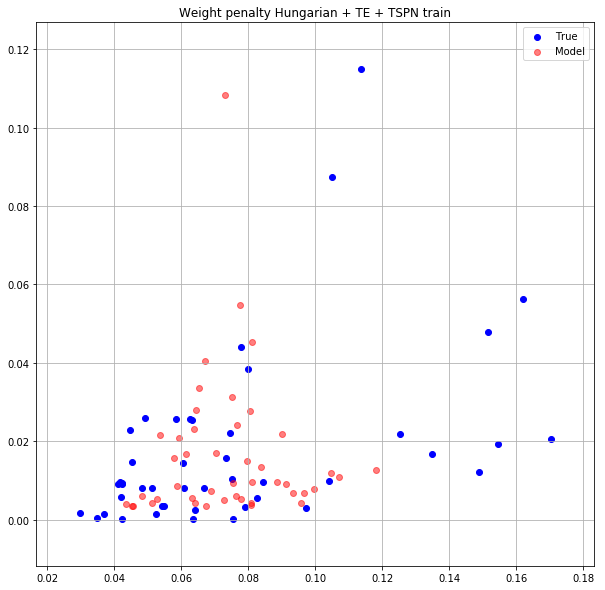

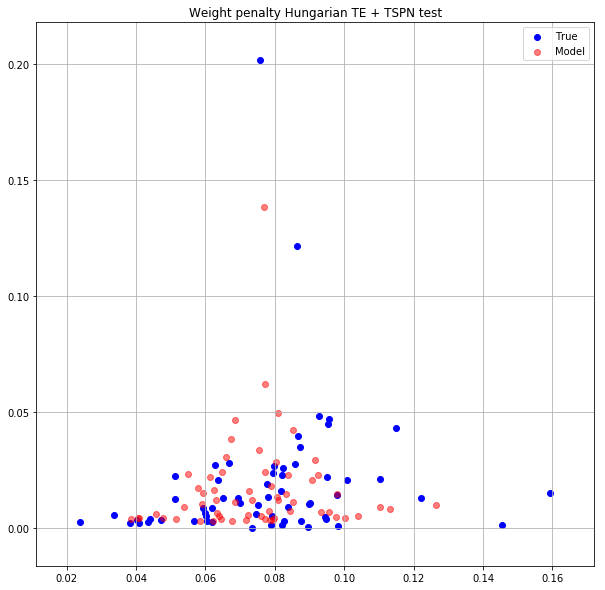

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  22 0.0100945709 0.0092461612


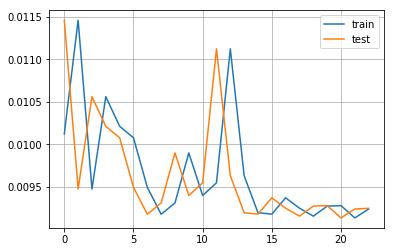

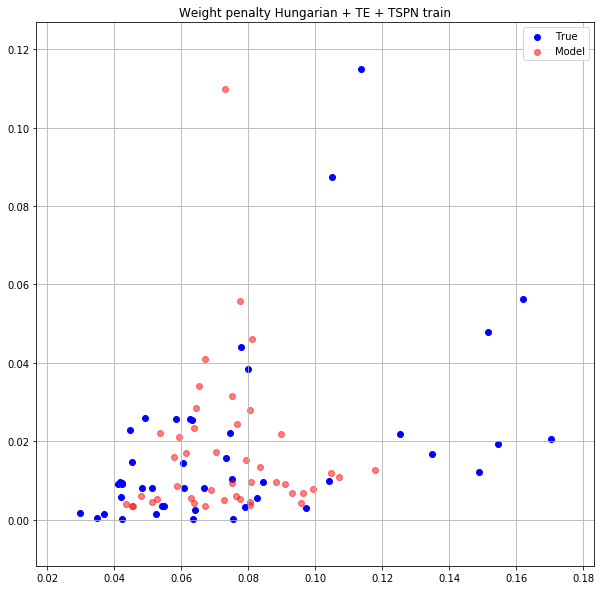

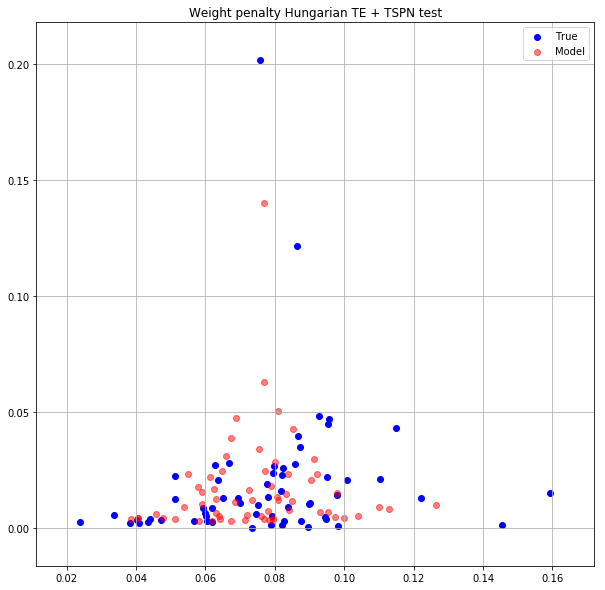

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  23 0.0100133978 0.0091444459


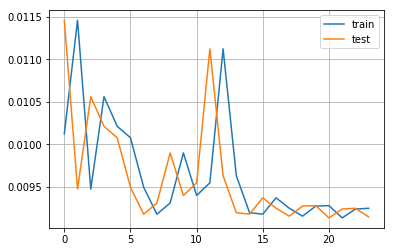

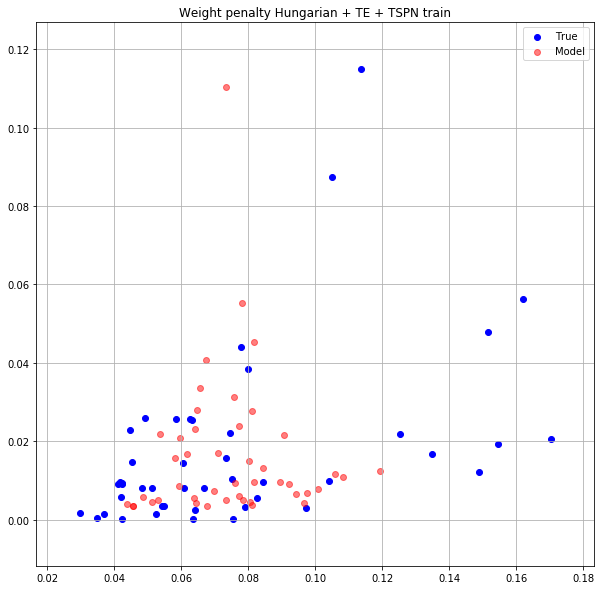

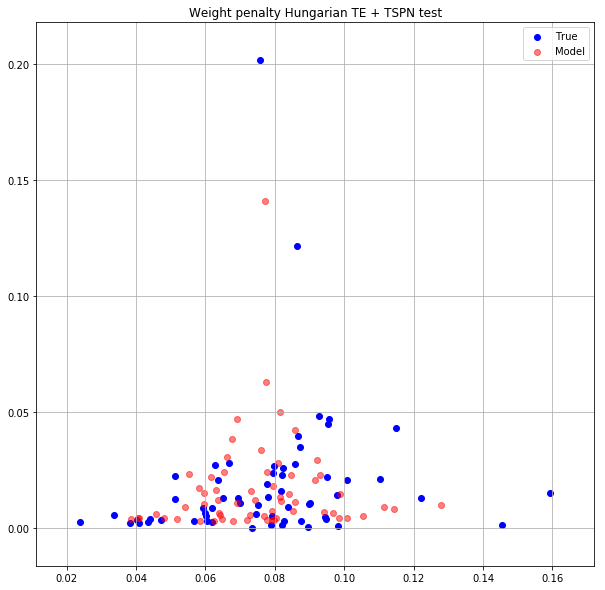

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  24 0.0099367490 0.0091558099


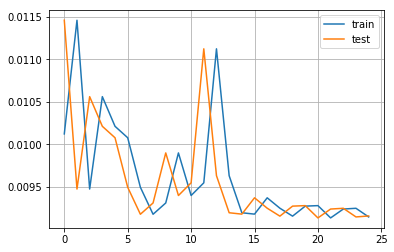

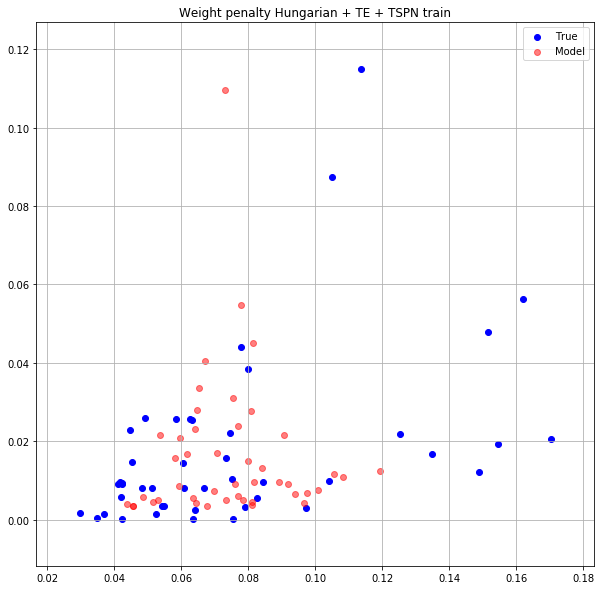

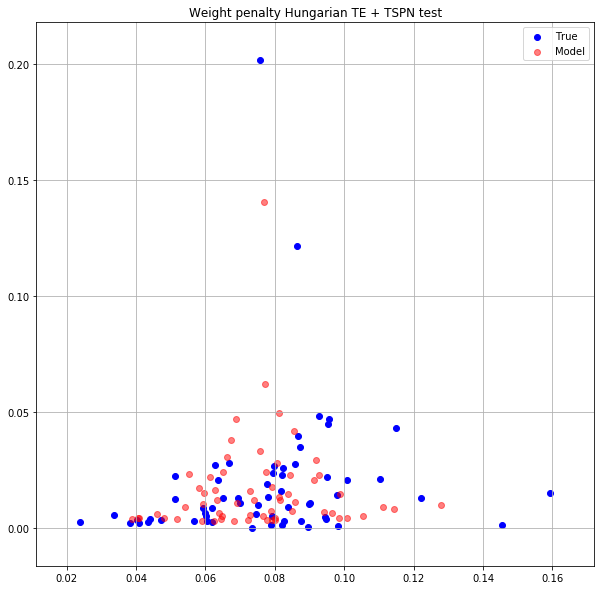

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  25 0.0100285523 0.0092180772


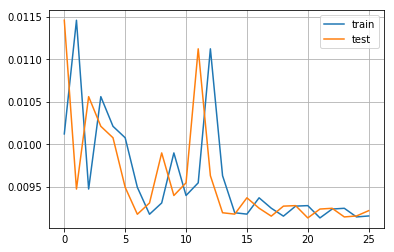

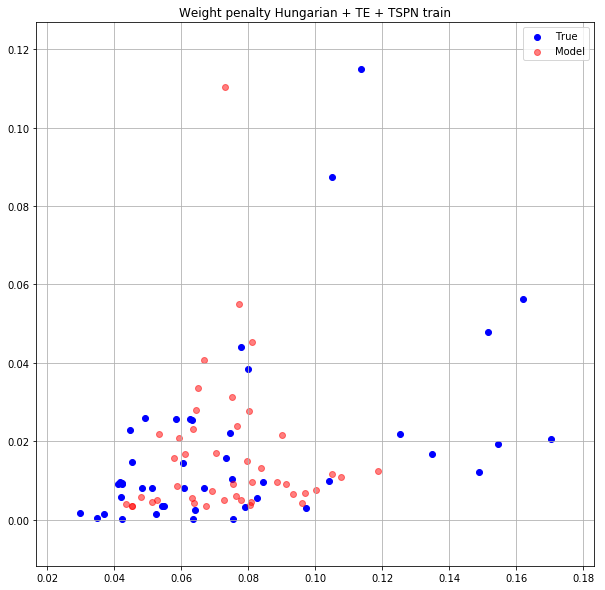

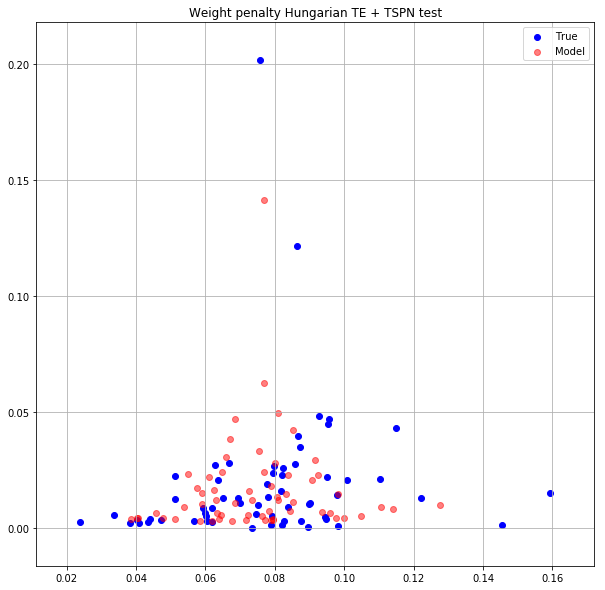

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  26 0.0099558197 0.0090943677


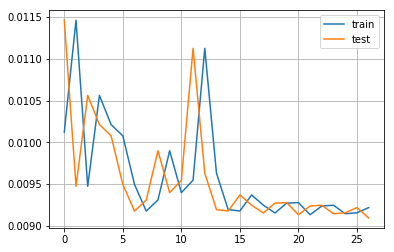

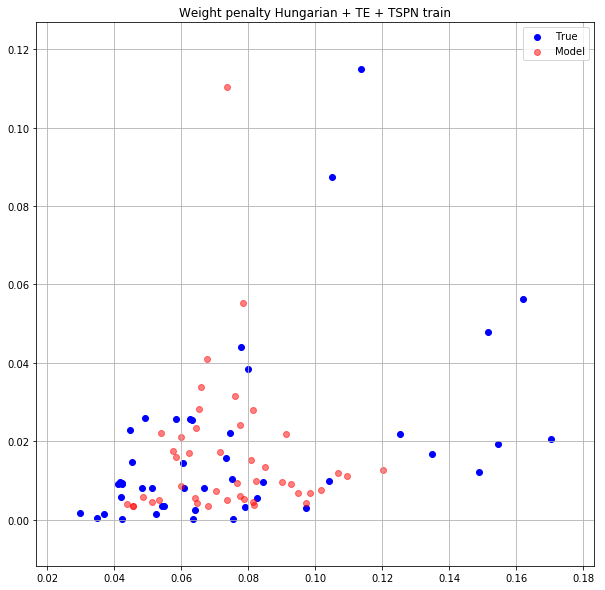

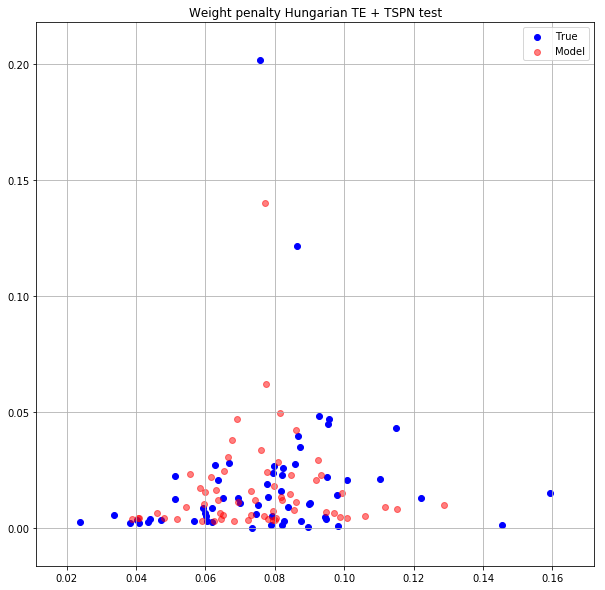

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  27 0.0099425213 0.0092098014


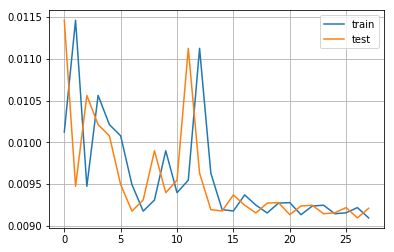

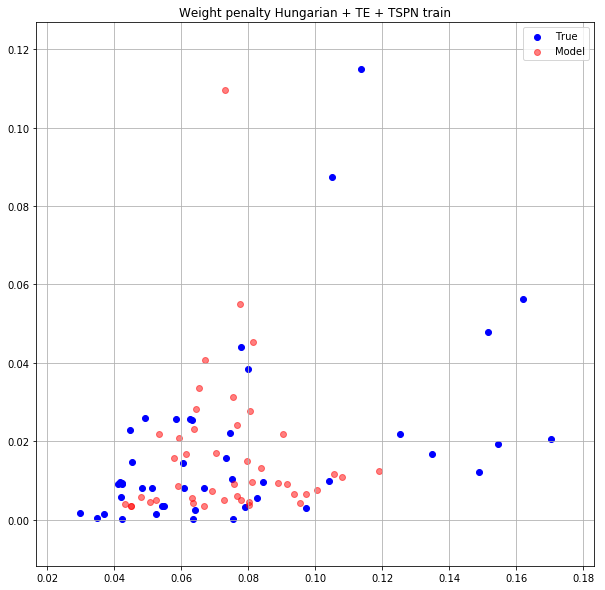

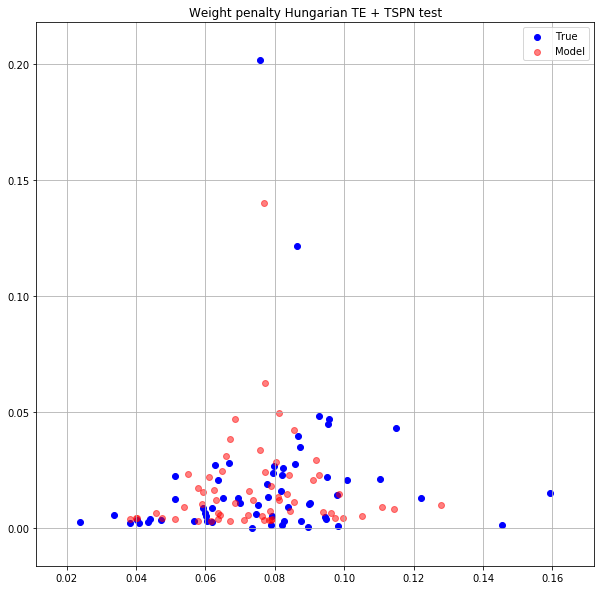

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  28 0.0099633960 0.0091921147


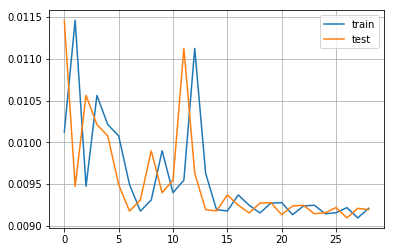

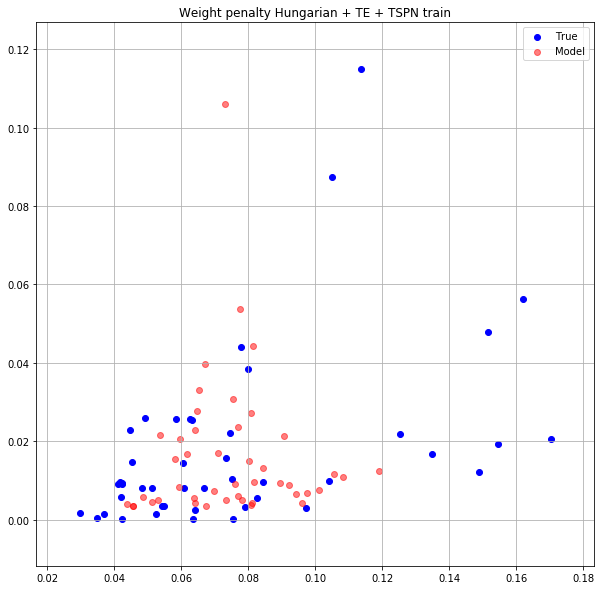

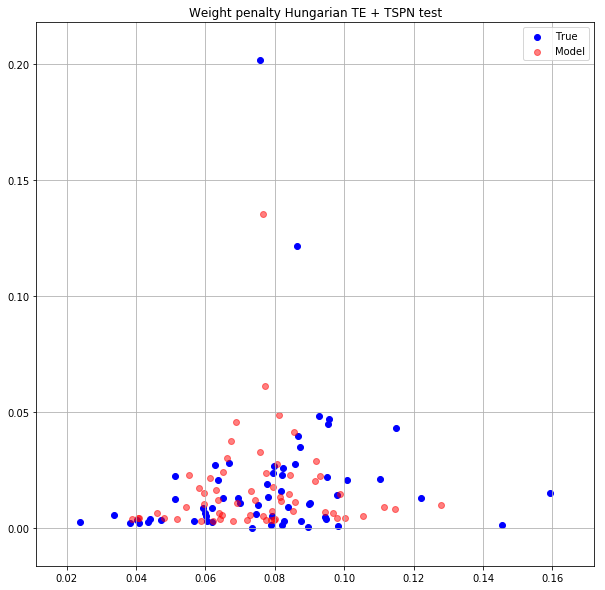

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  29 0.0099800220 0.0091066025


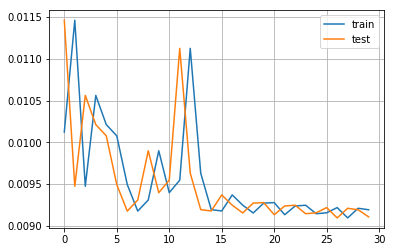

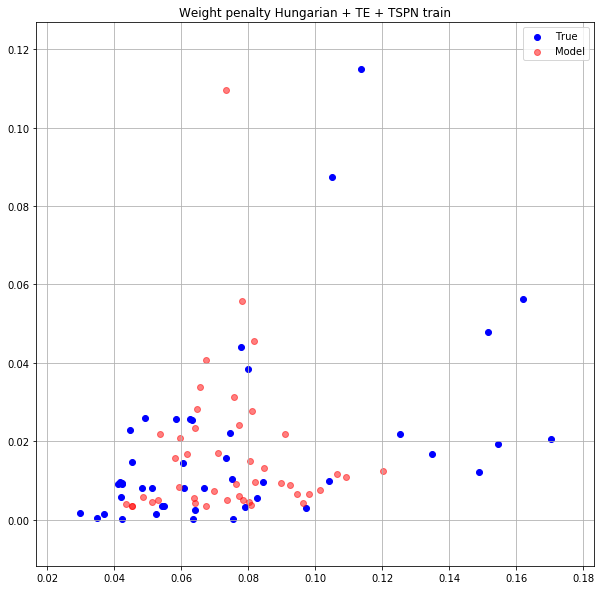

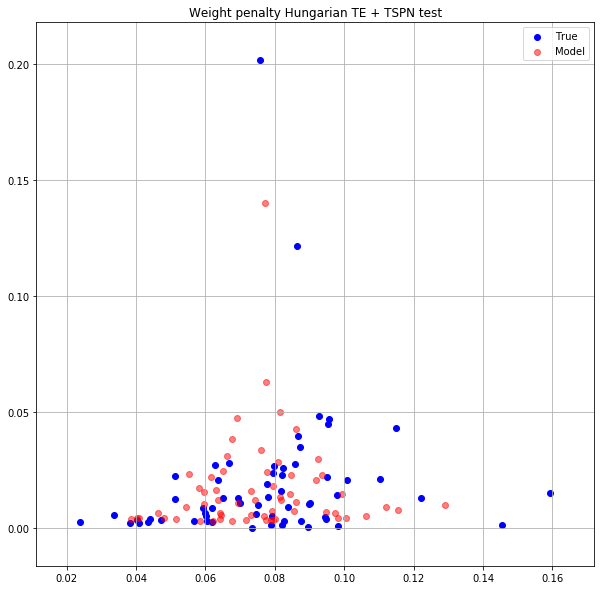

In [49]:
train_loss, val_loss = [], []

for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
    train_loss.append(loss_test)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
    val_loss.append(loss_test)
    scheduler.step(loss_test)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    
    cur_n = len(train_loss)
    plt.plot(np.arange(cur_n), train_loss, label = 'train')
    plt.plot(np.arange(cur_n), val_loss, label = 'test')
    plt.grid()
    plt.legend()
    plt.show()
    
    
    item = dataset_train[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Weight penalty Hungarian + TE + TSPN train")
    plt.show()
    
    
    
    item = dataset_test[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Weight penalty Hungarian TE + TSPN test")
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.7769107819 0.7302809358


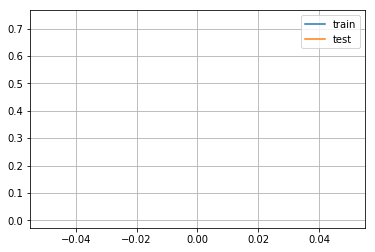

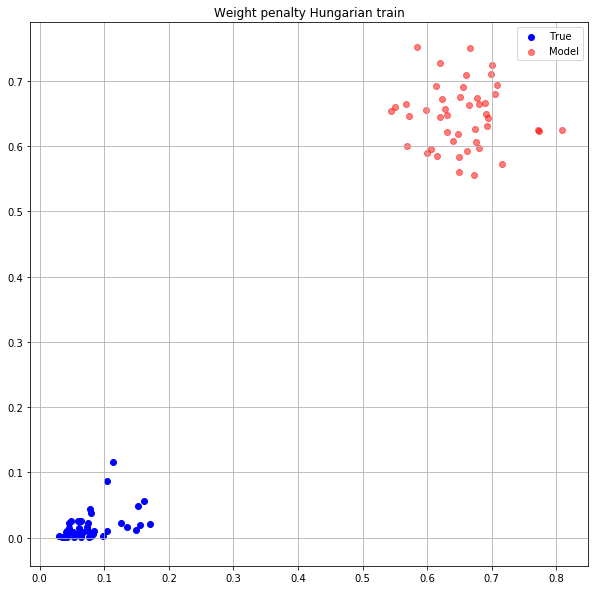

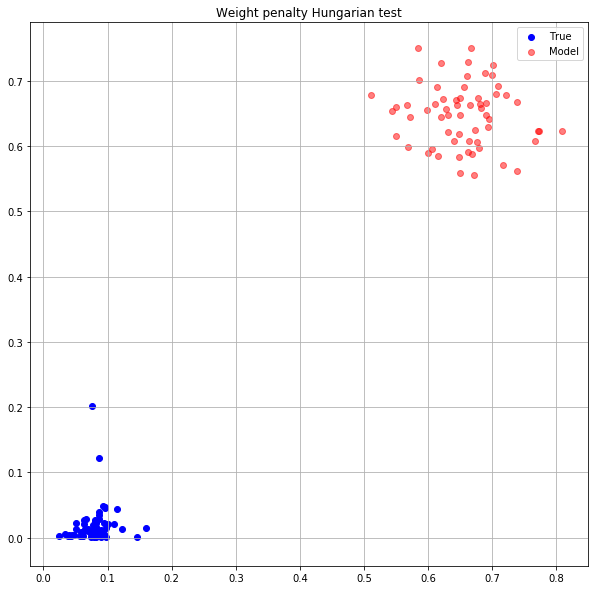

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.7003939748 0.6087836027


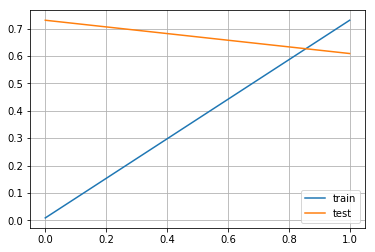

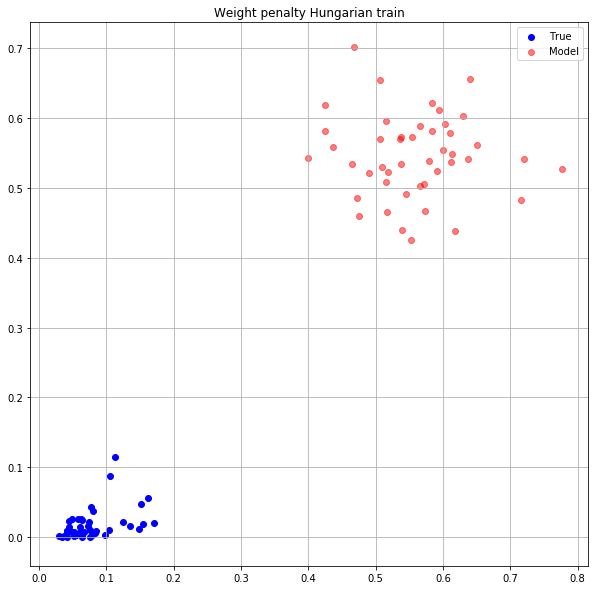

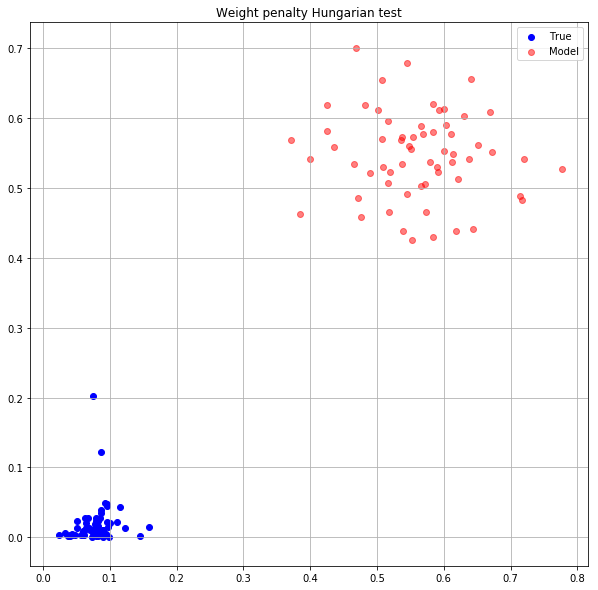

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.5177856684 0.3602882624


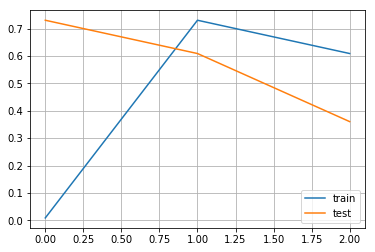

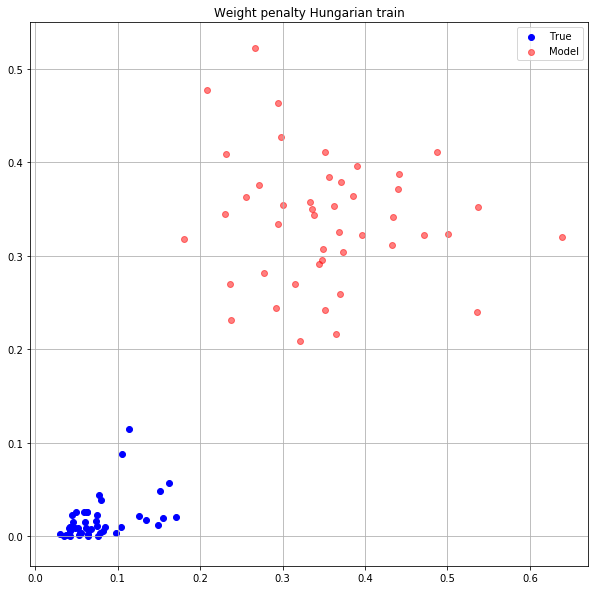

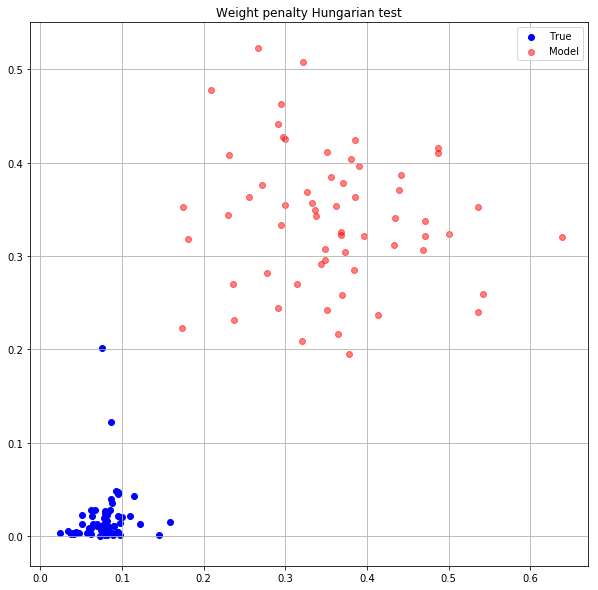

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.2363583446 0.0867229775


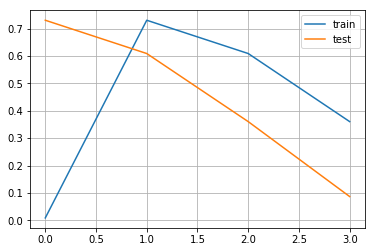

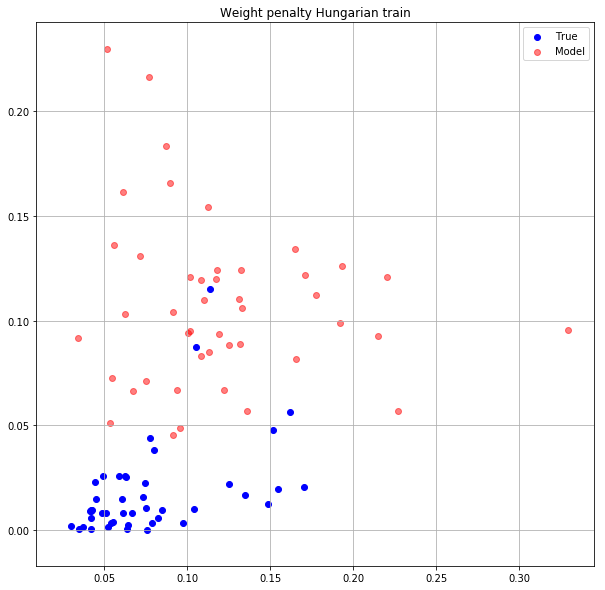

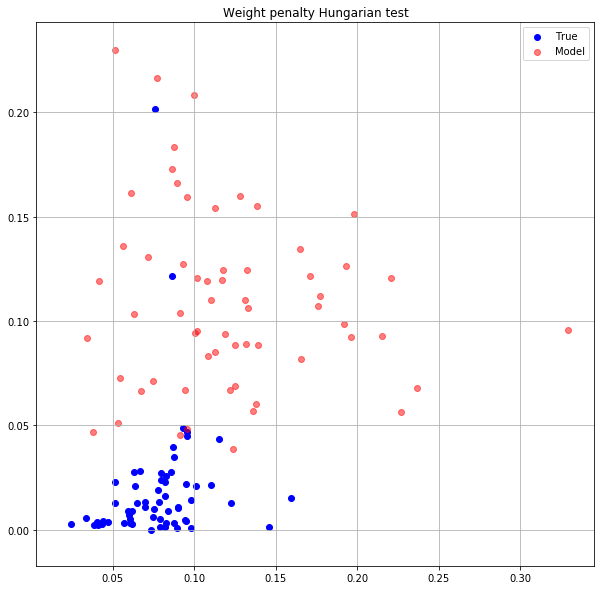

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.0470907837 0.0358766168


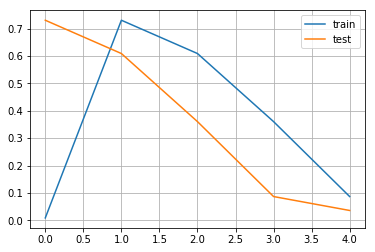

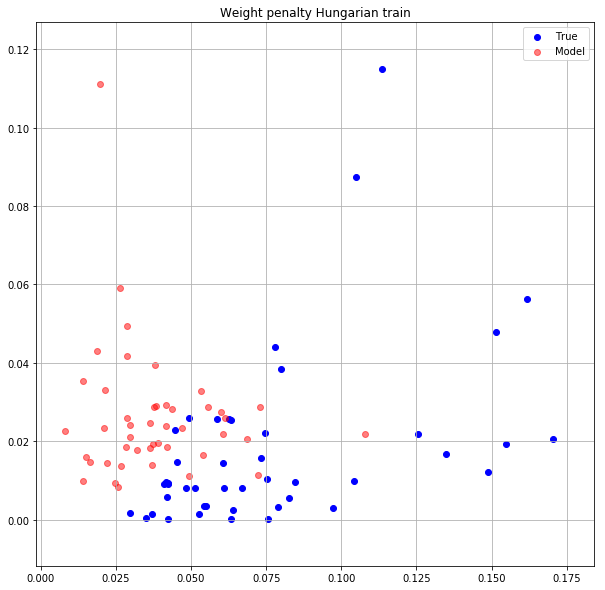

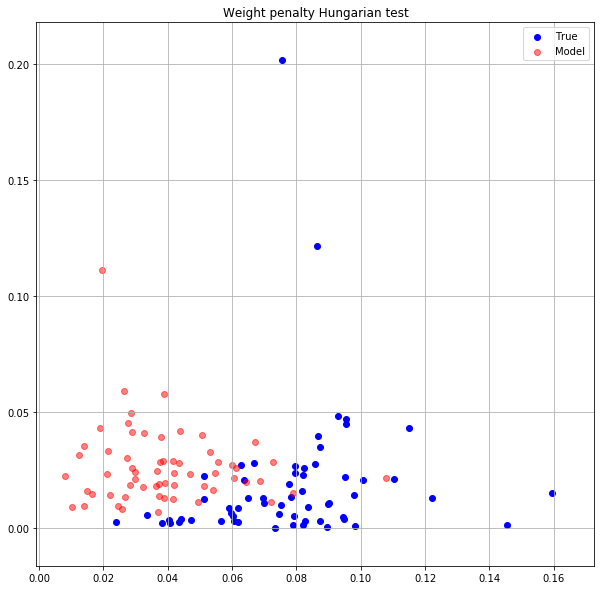

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.0357219875 0.0255141445


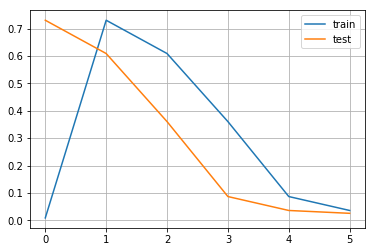

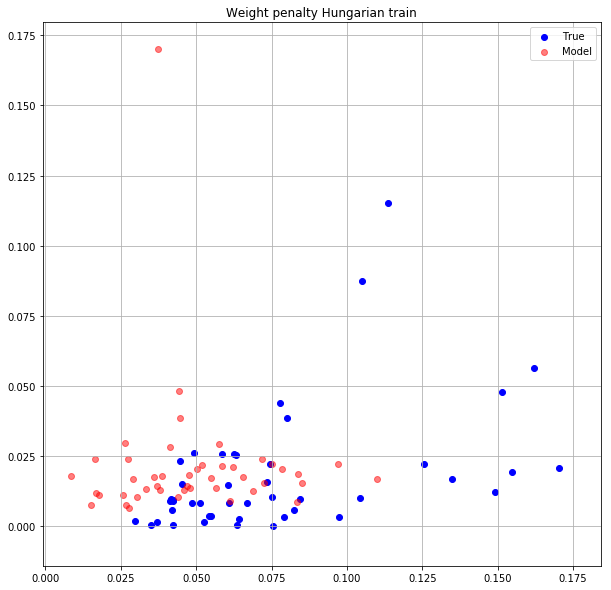

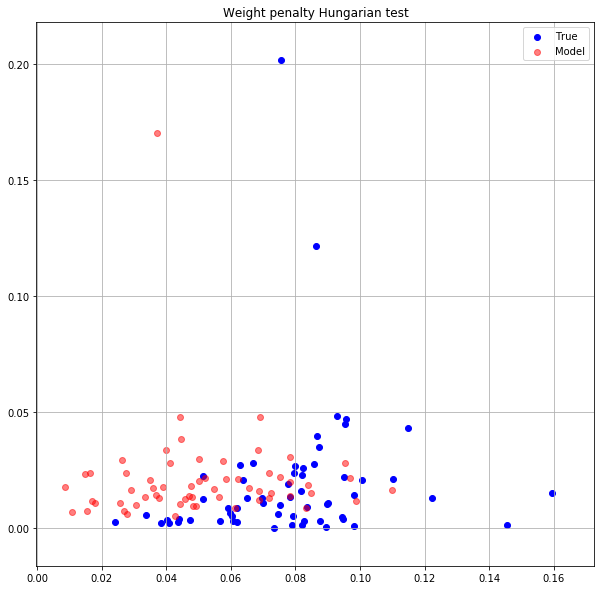

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0186915584 0.0155409388


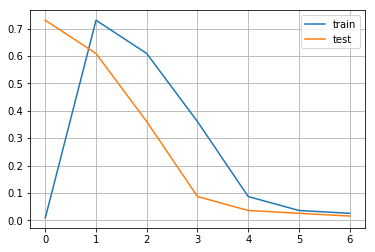

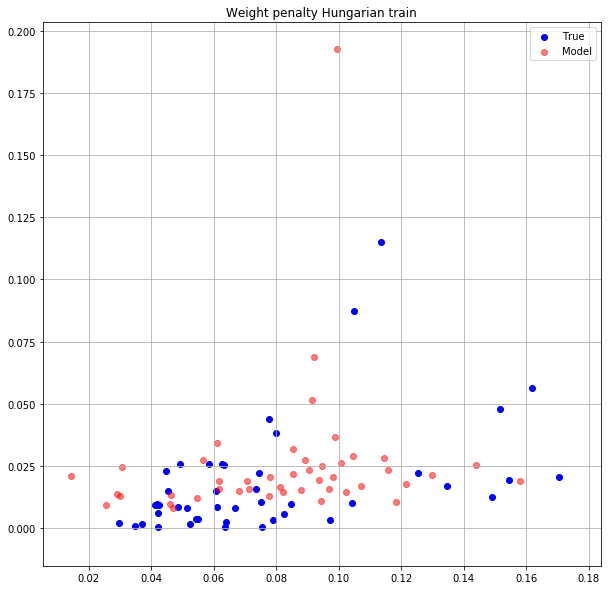

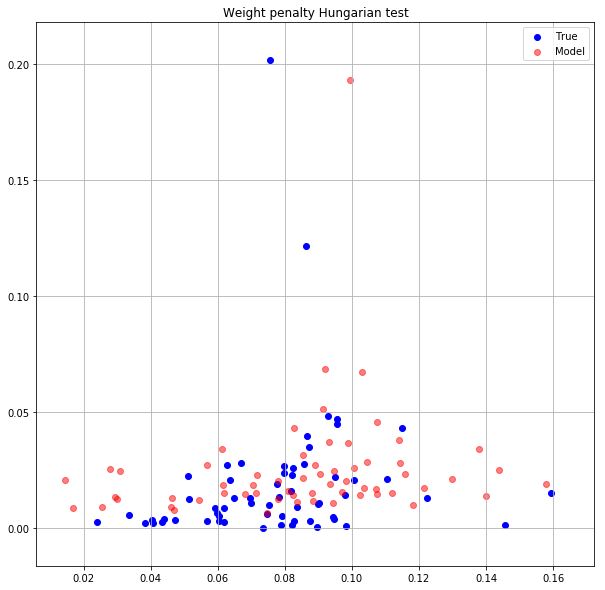

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0131812301 0.0112471832


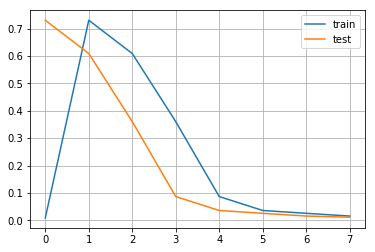

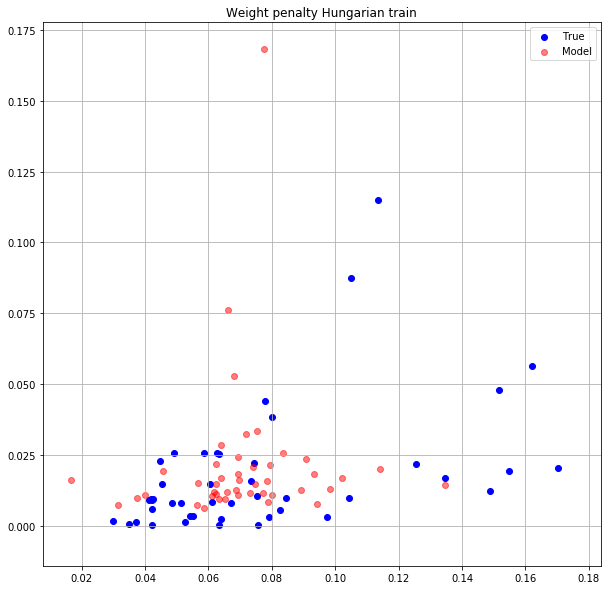

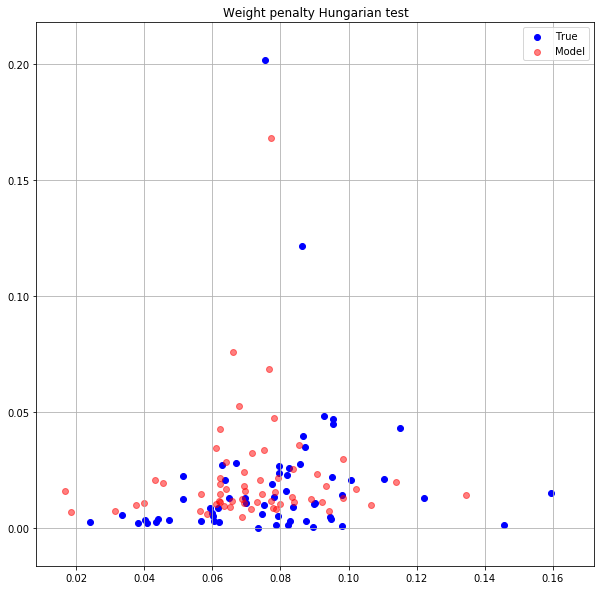

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0108889034 0.0095306598


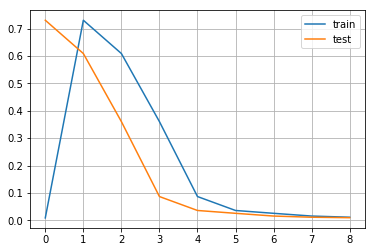

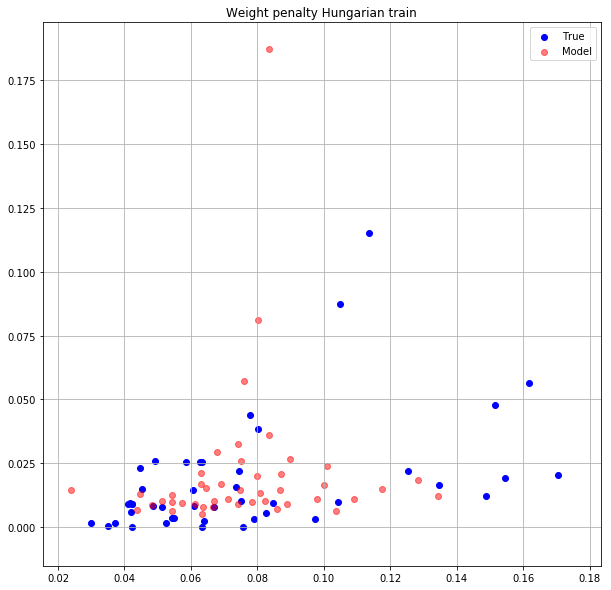

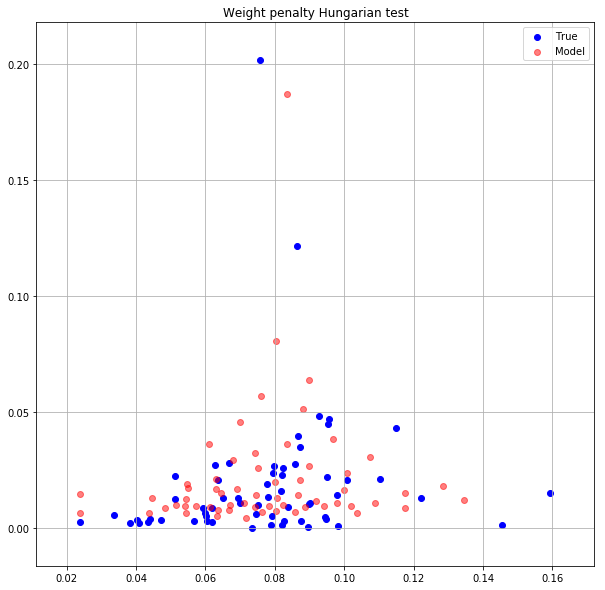

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0100161918 0.0092357639


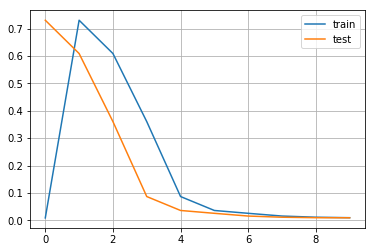

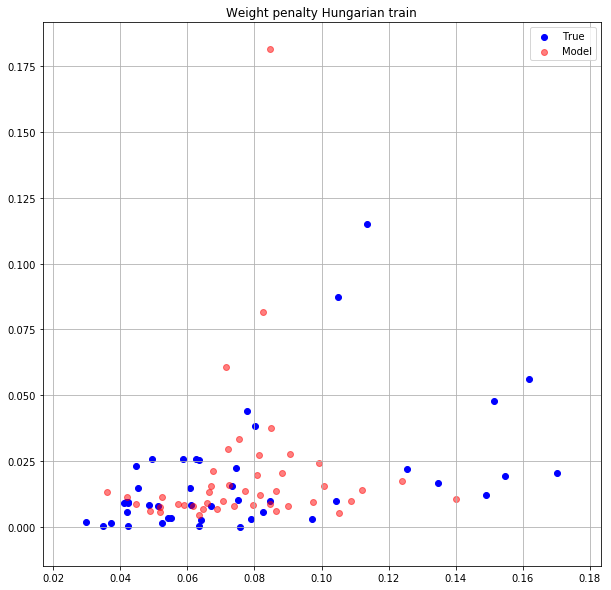

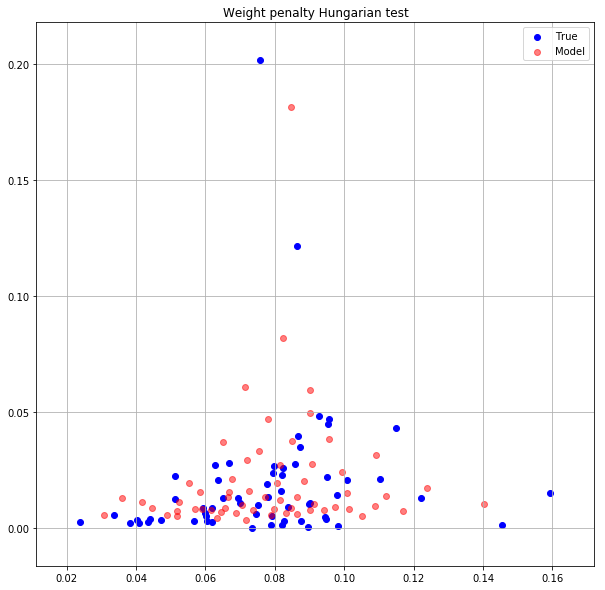

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0096394718 0.0090488009


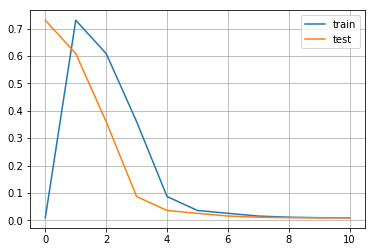

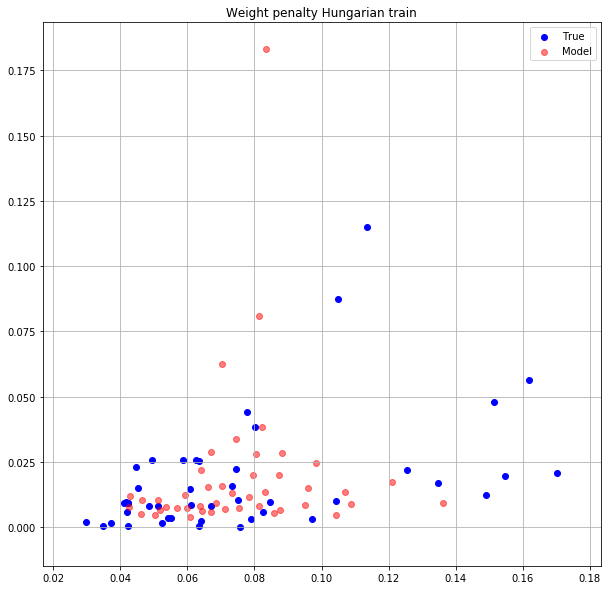

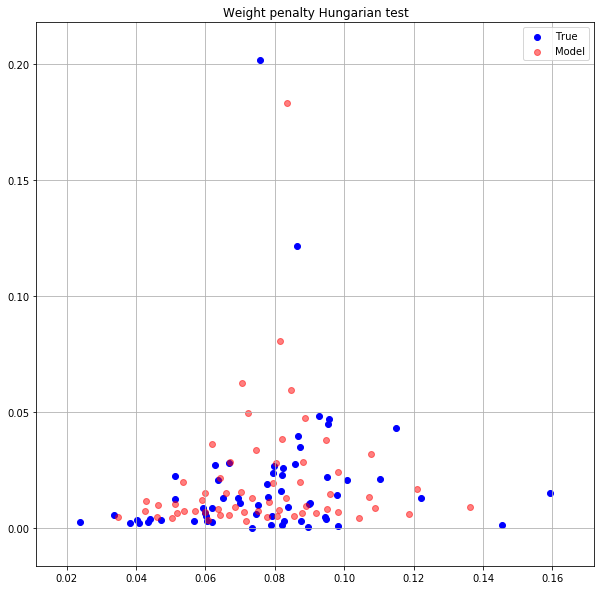

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0095103737 0.0089488858


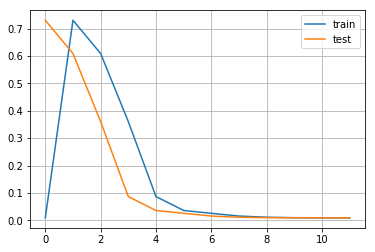

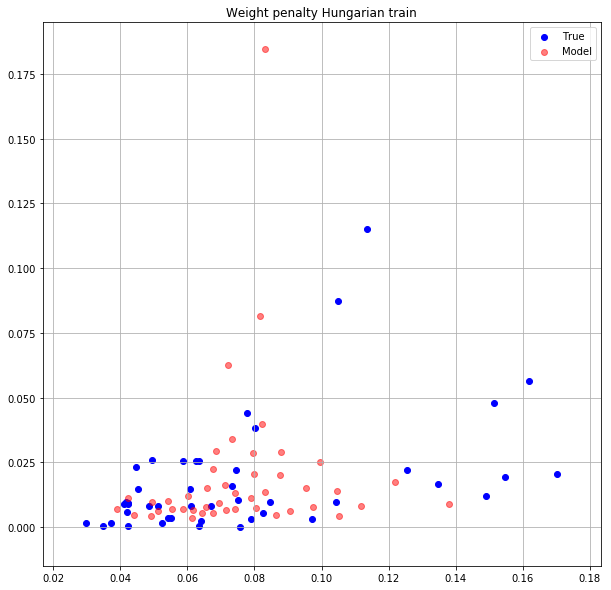

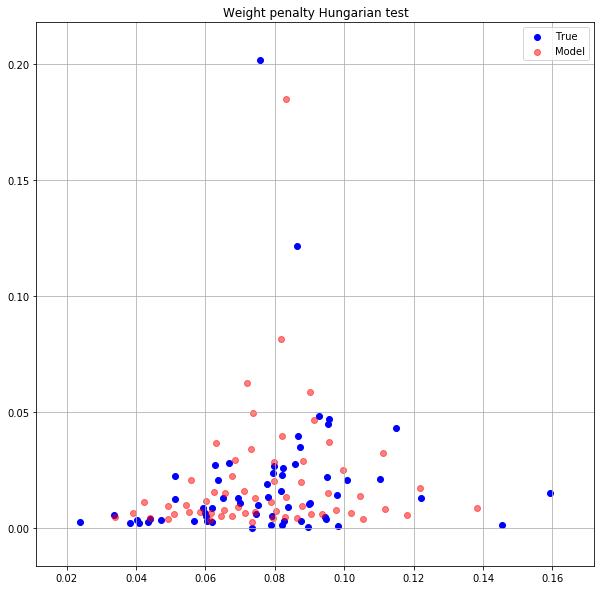

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.0095484722 0.0088938856


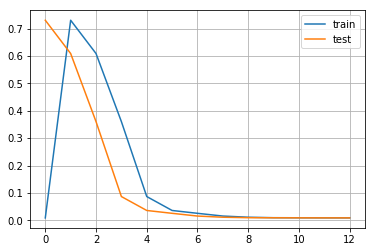

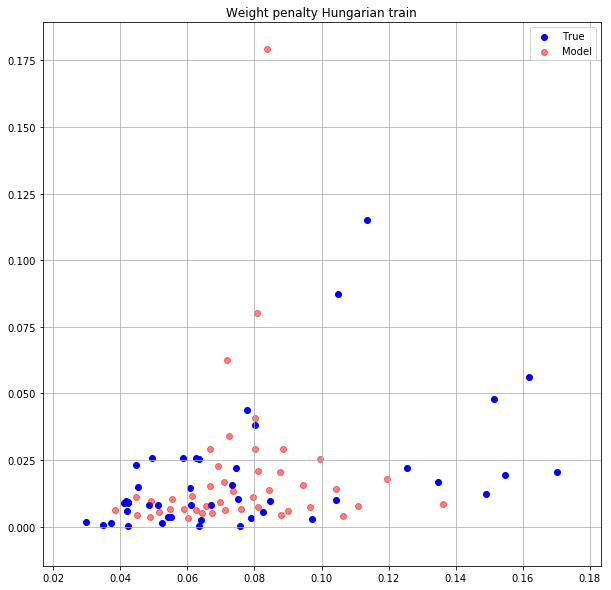

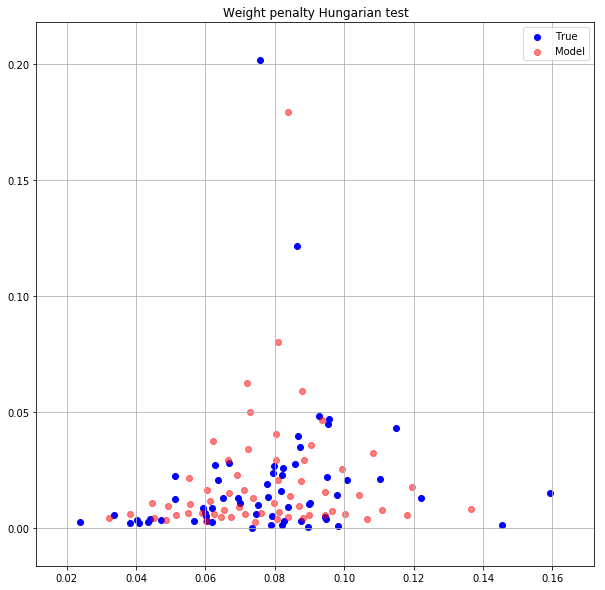

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.0093839196 0.0089078732


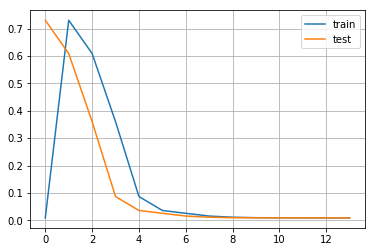

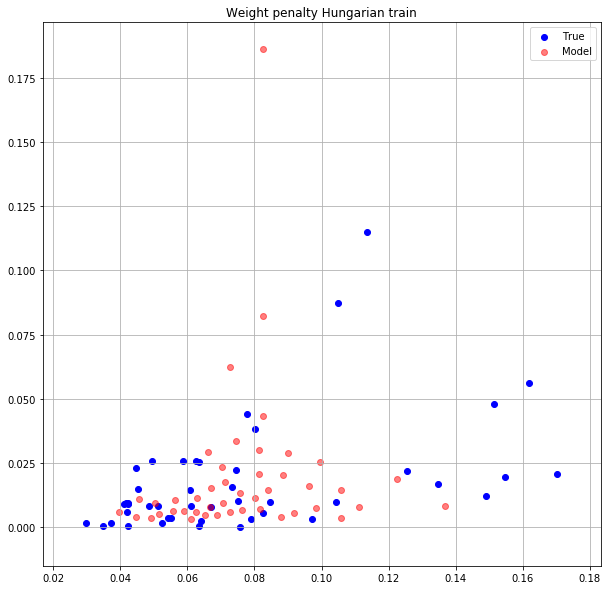

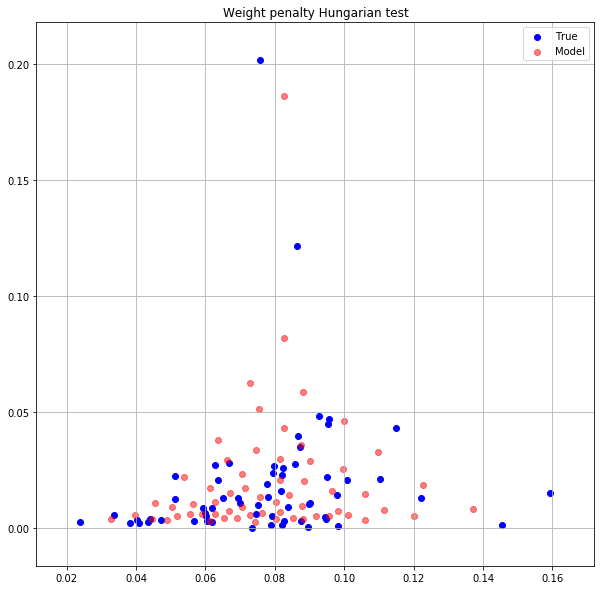

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.0094772466 0.0088430215


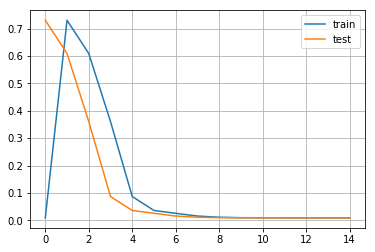

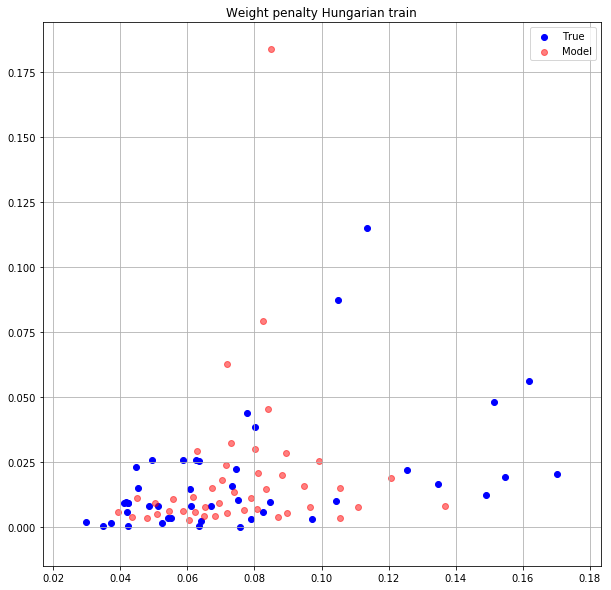

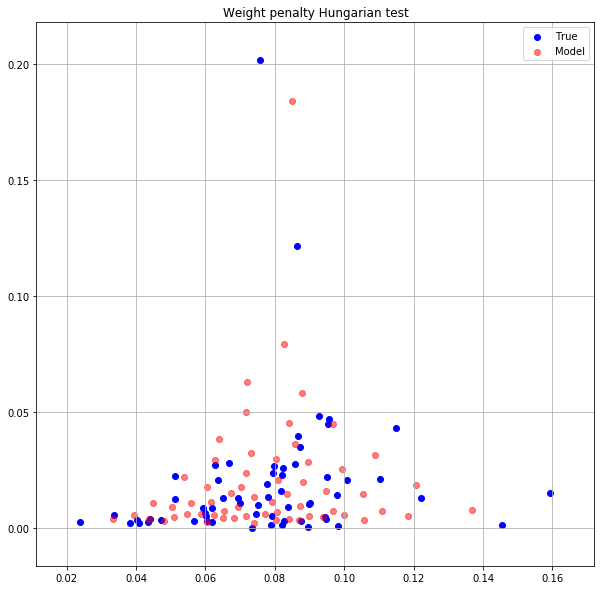

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.0093732346 0.0088182790


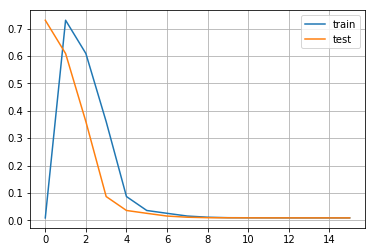

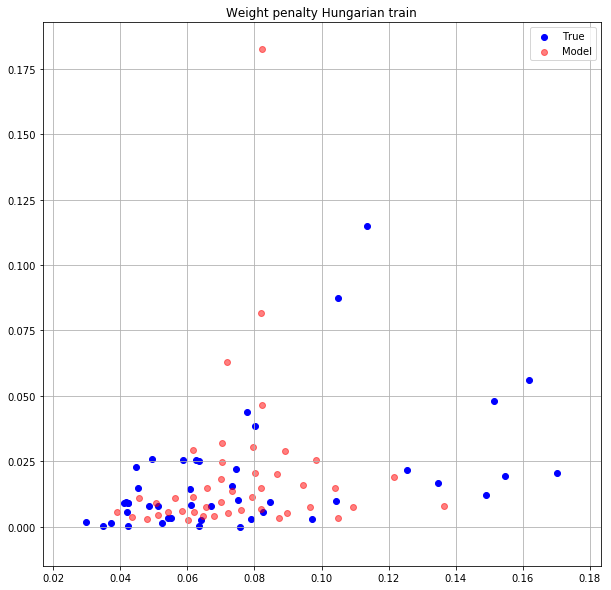

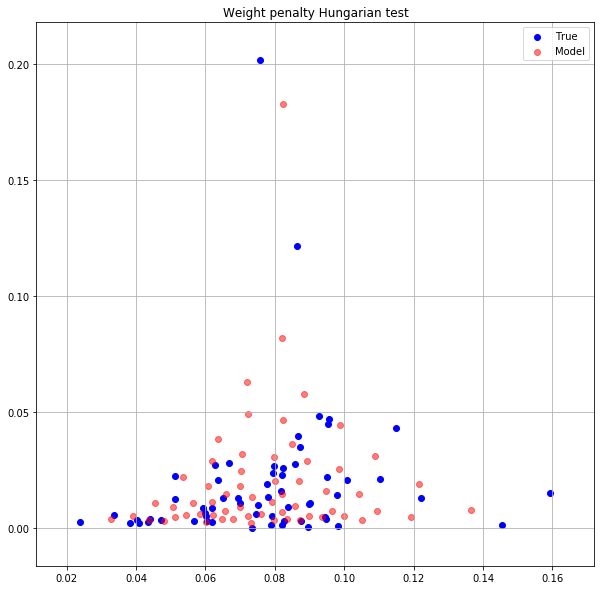

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.0093782516 0.0088220611


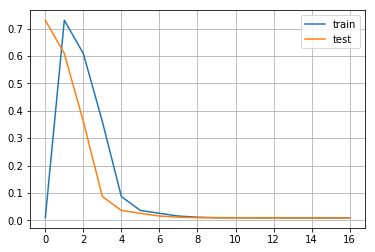

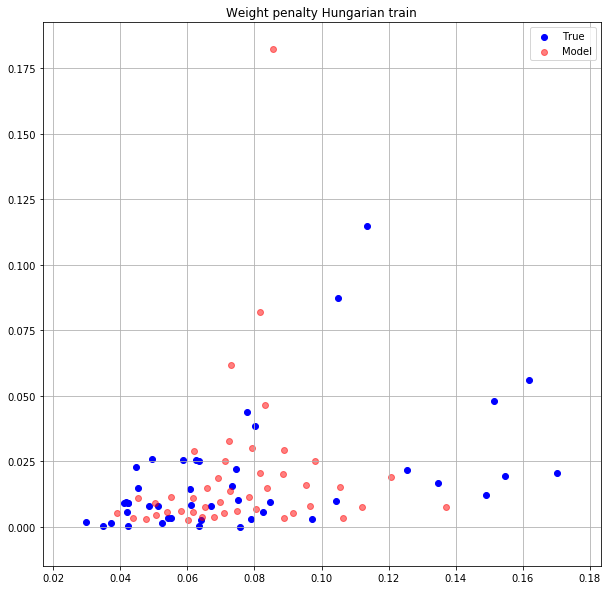

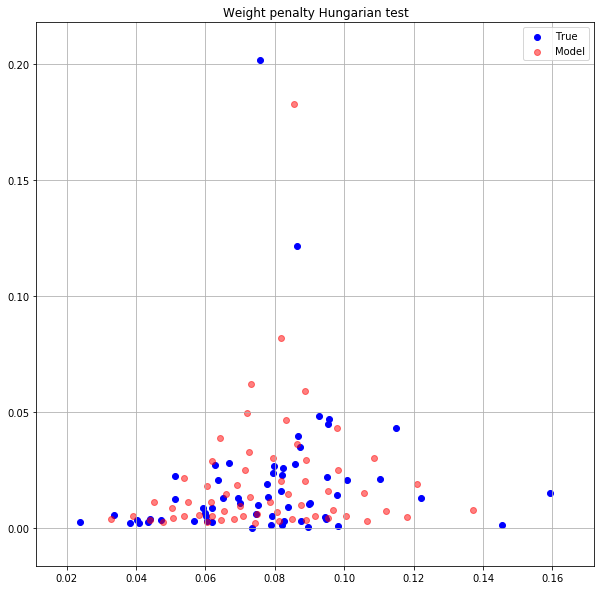

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.0093692066 0.0088046221


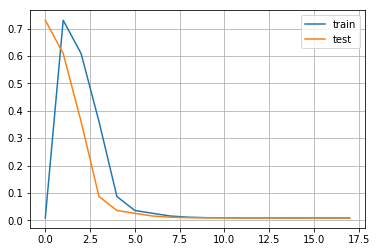

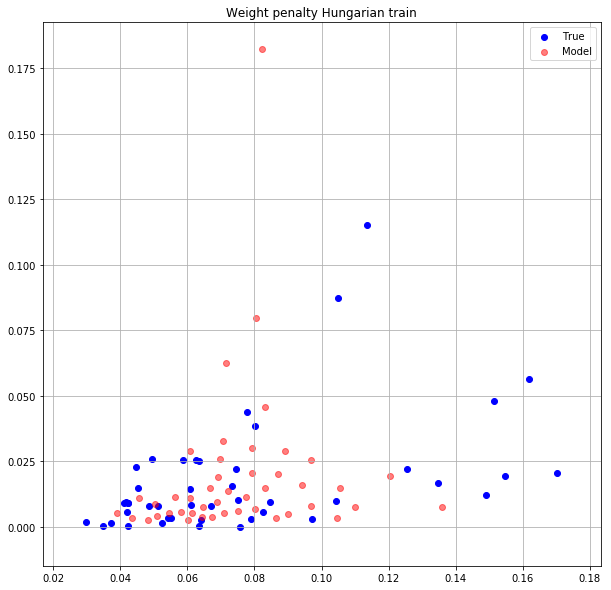

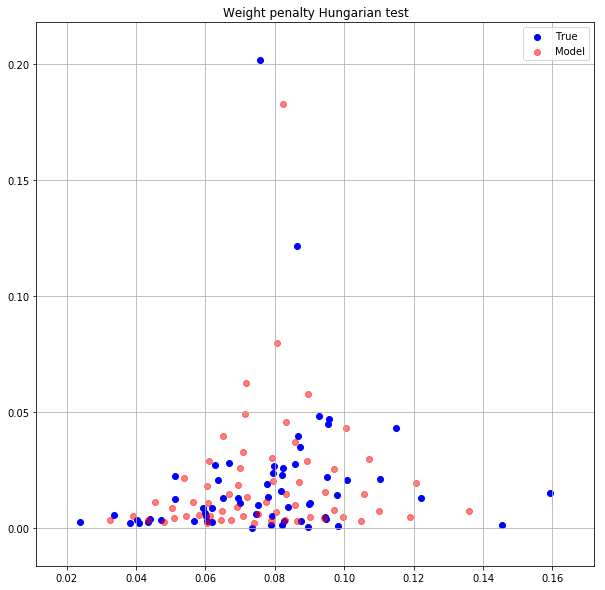

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 0.0093540056 0.0088129630


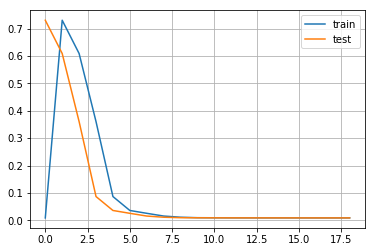

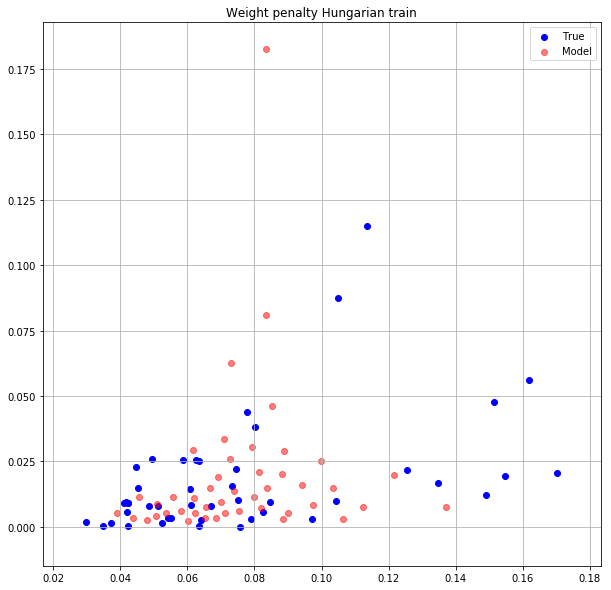

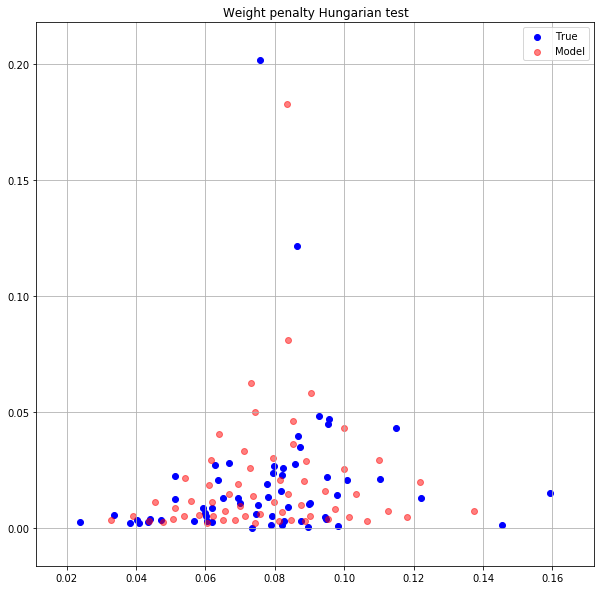

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 0.0092540011 0.0087896548


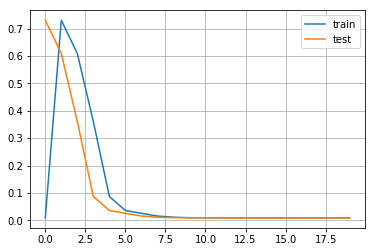

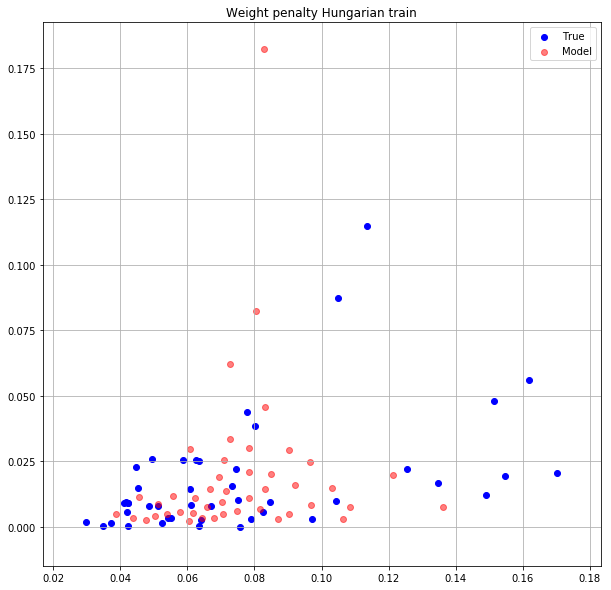

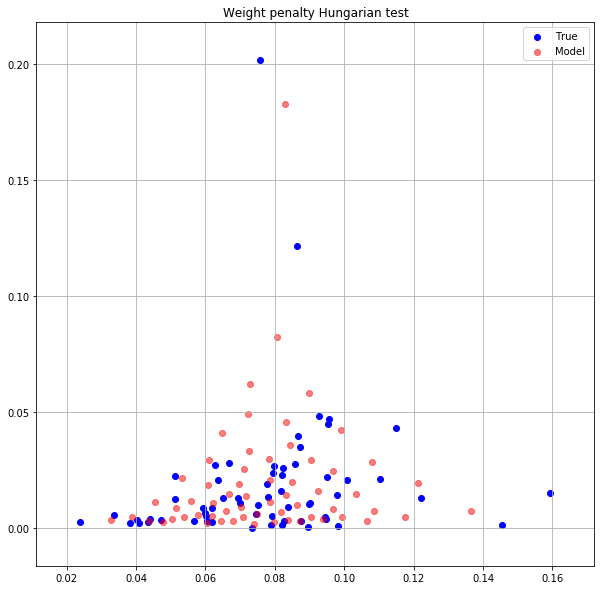

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  20 0.0092978356 0.0087963054


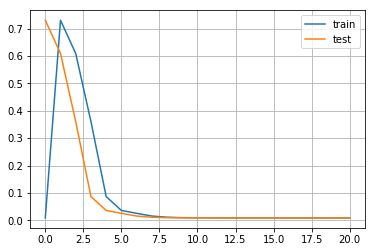

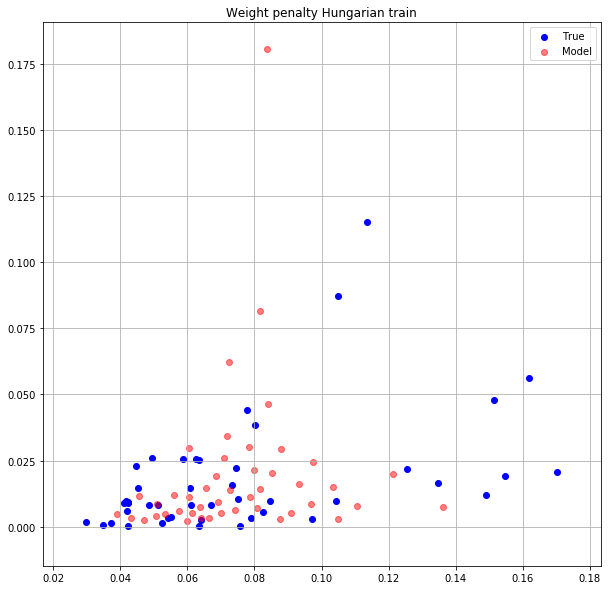

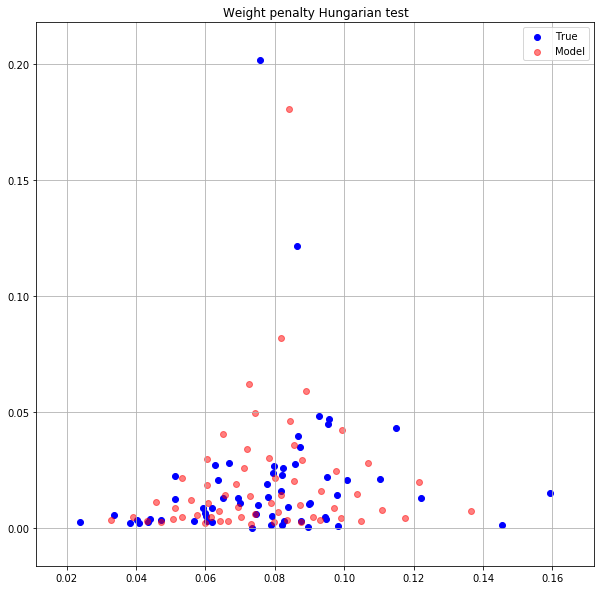

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  21 0.0093279211 0.0087931333


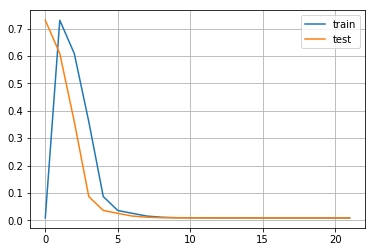

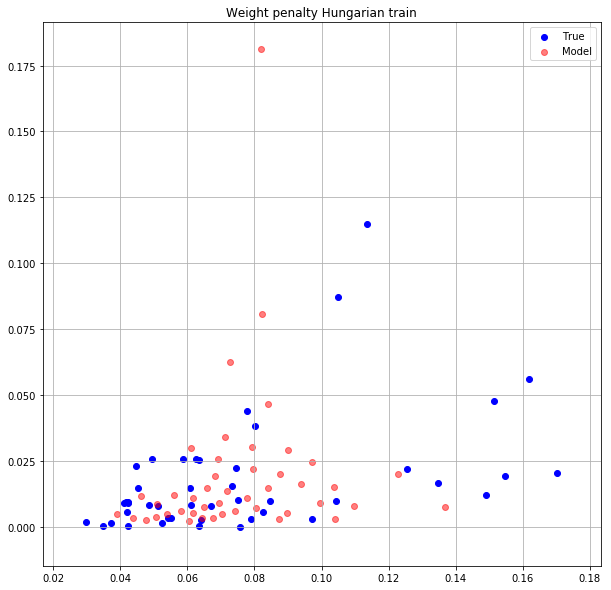

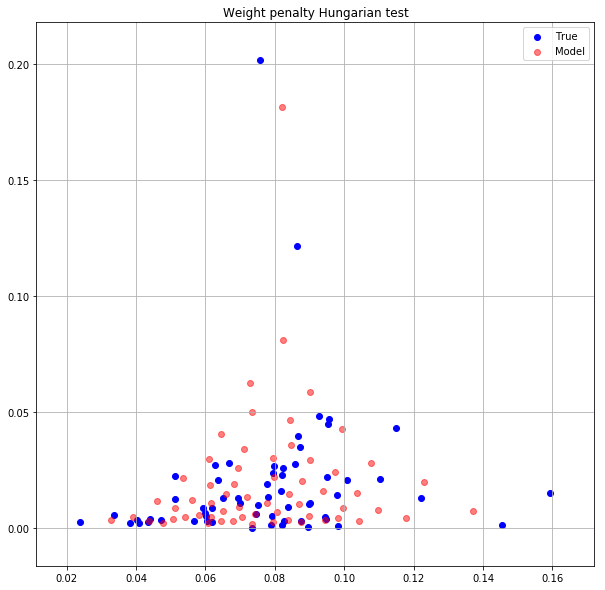

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  22 0.0093350941 0.0088133886


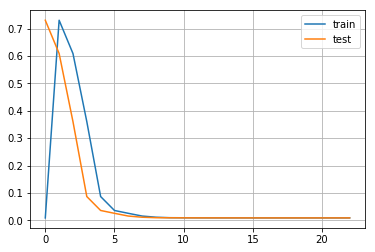

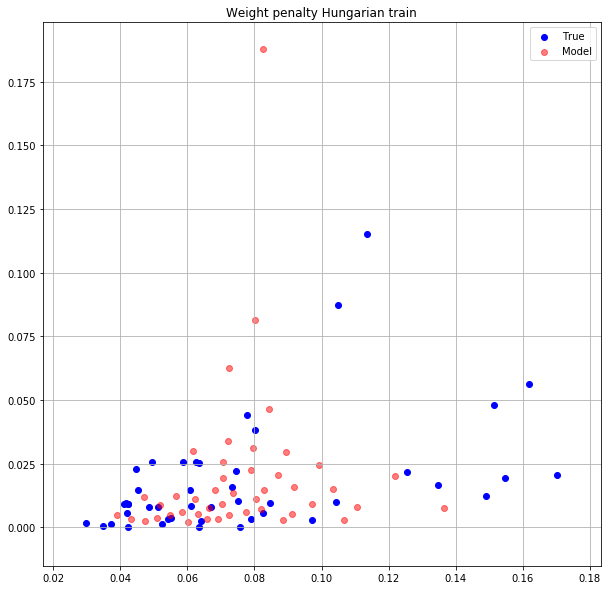

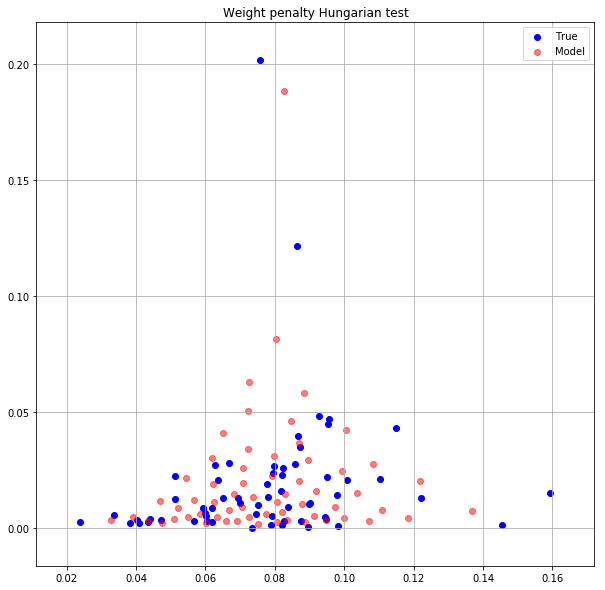

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  23 0.0093175313 0.0088247582


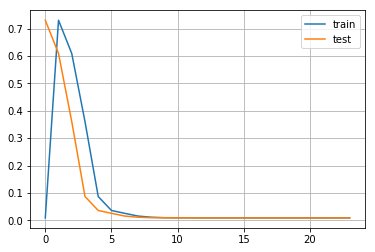

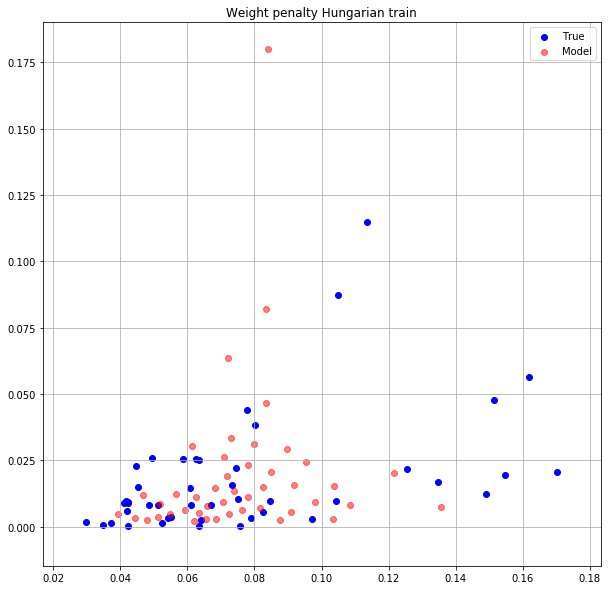

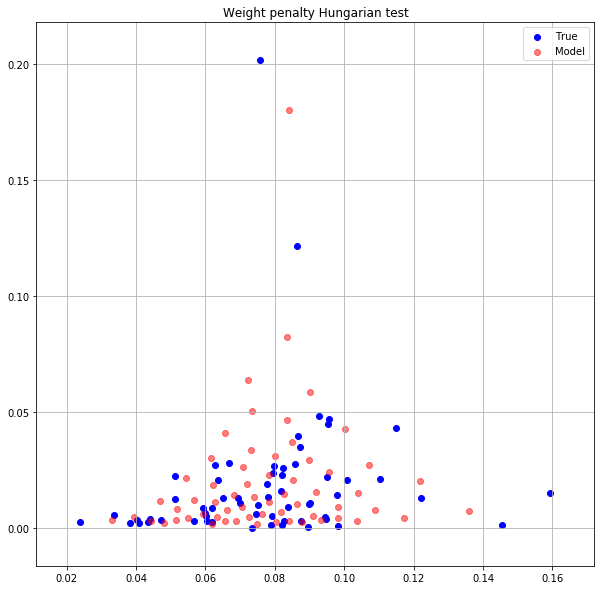

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  24 0.0092750415 0.0088549545


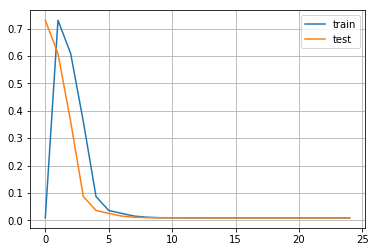

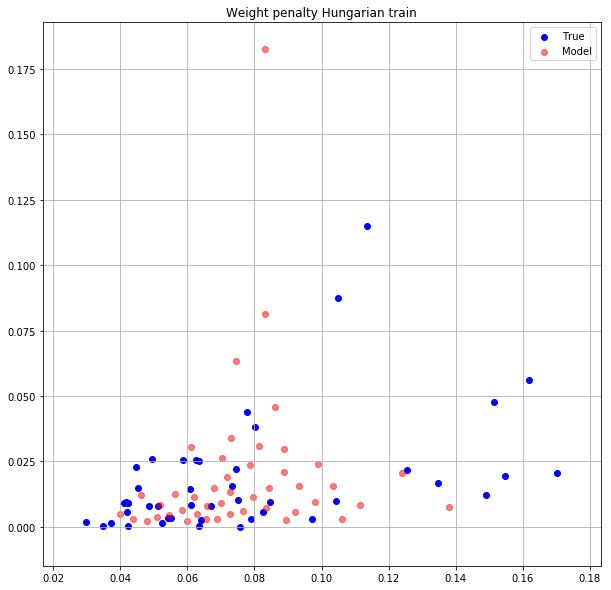

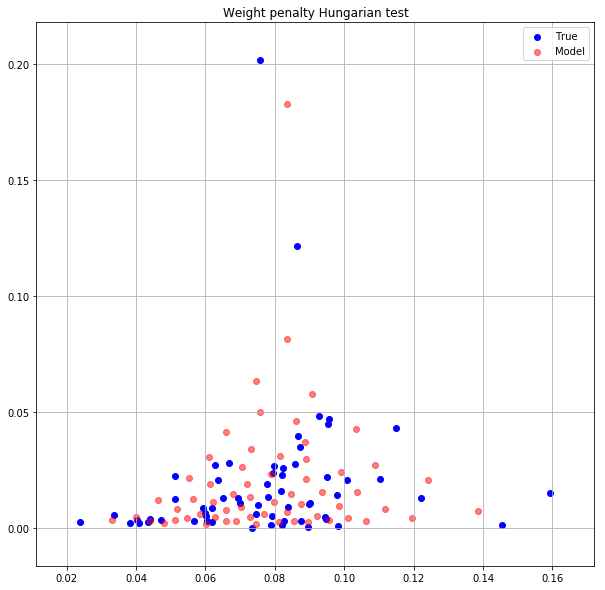

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  25 0.0093556065 0.0087861242


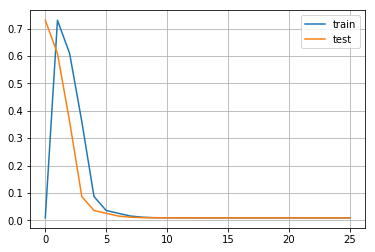

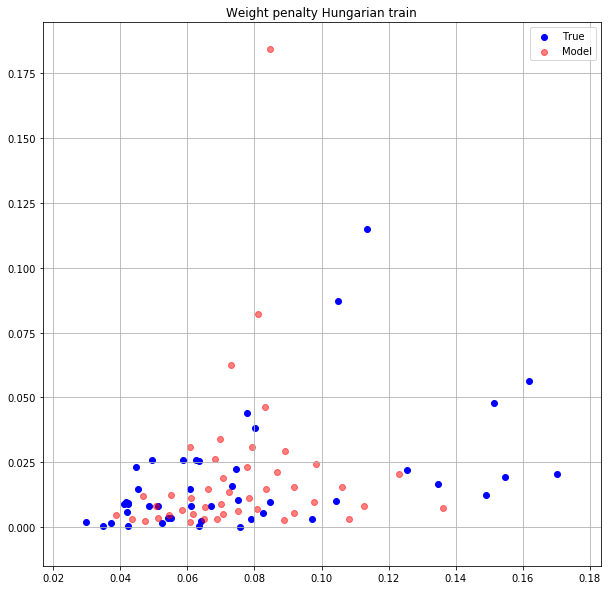

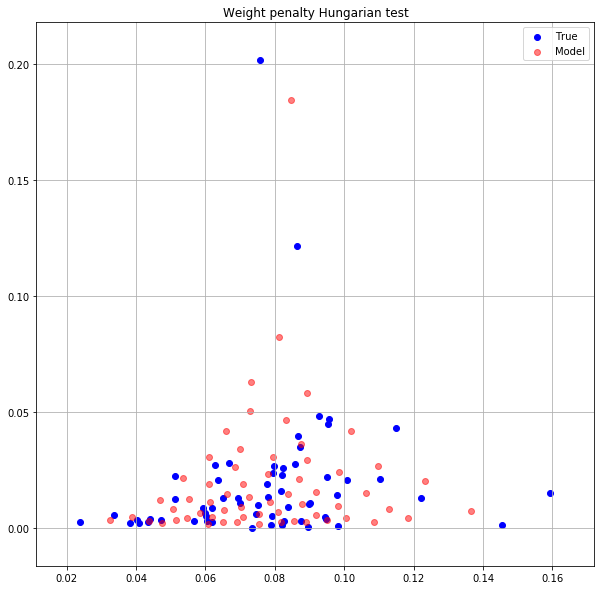

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  26 0.0093116704 0.0088270232


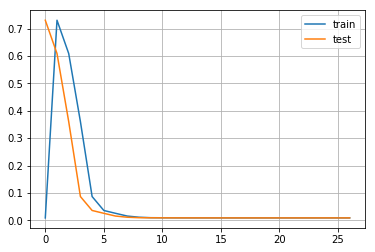

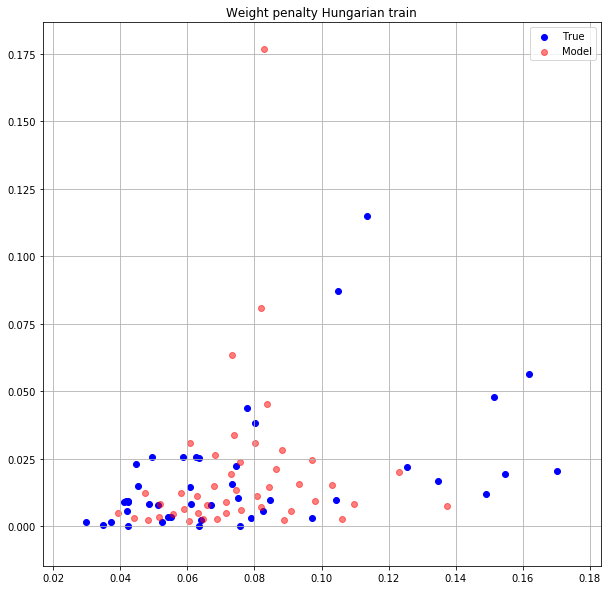

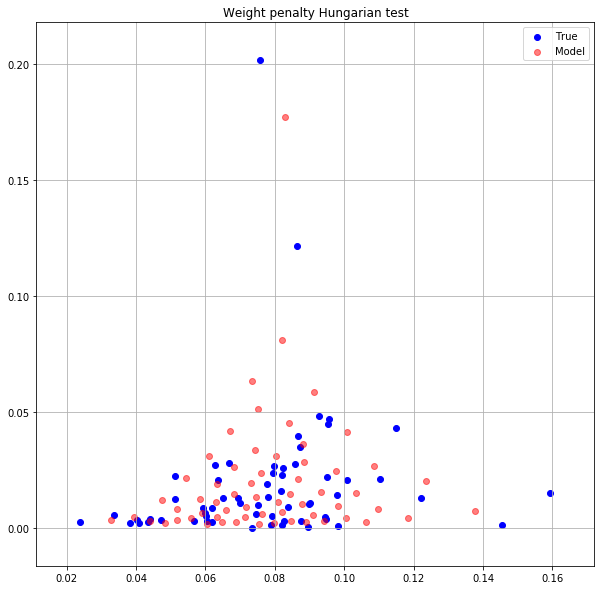

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  27 0.0093315663 0.0087958630


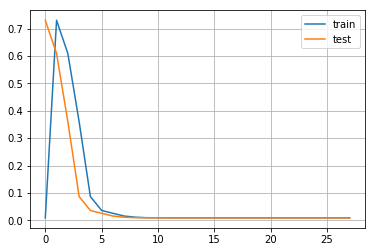

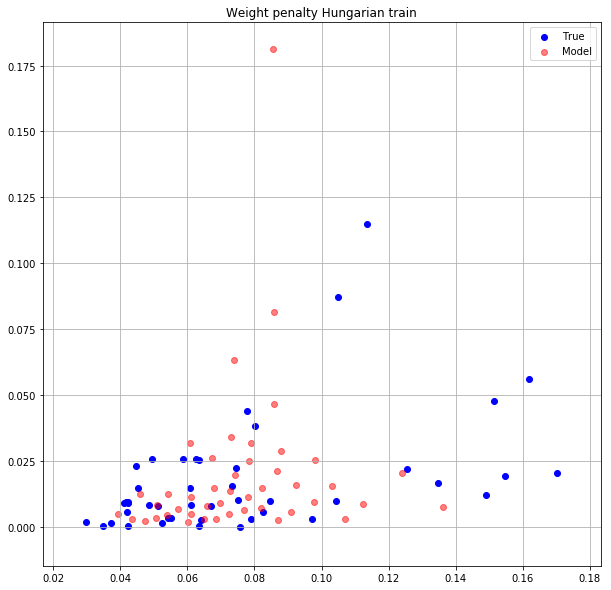

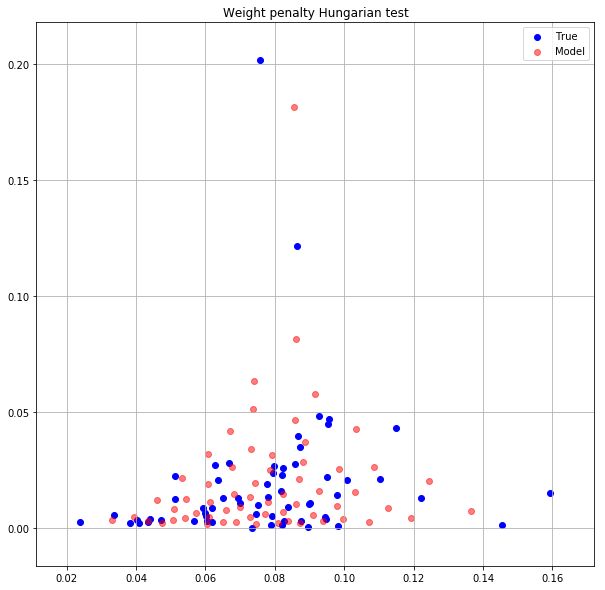

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  28 0.0093094781 0.0087890569


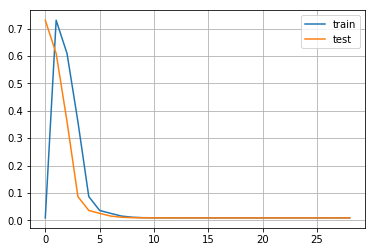

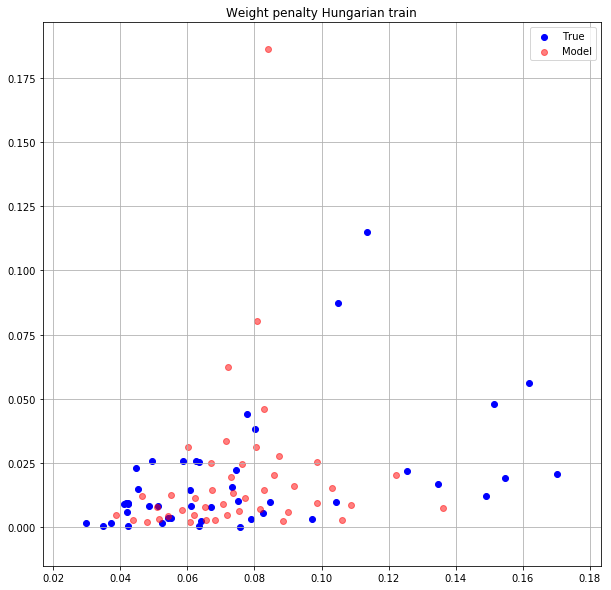

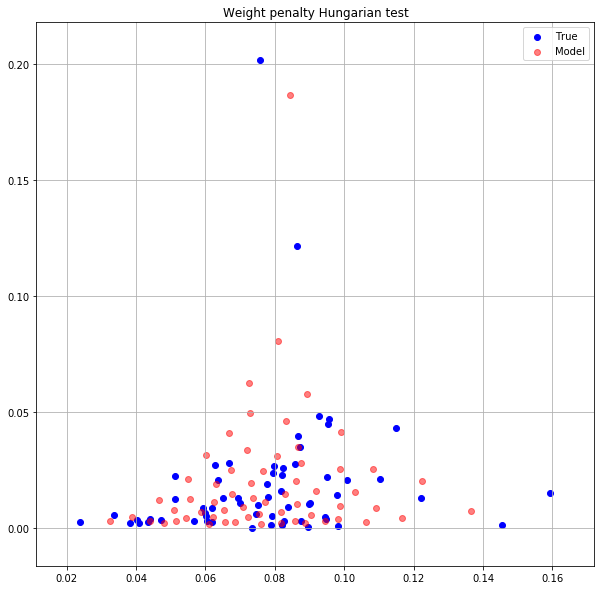

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  29 0.0093728537 0.0087784799


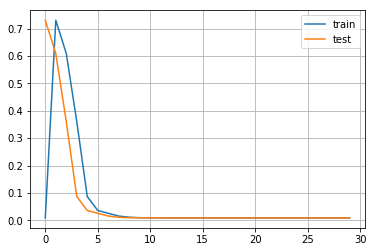

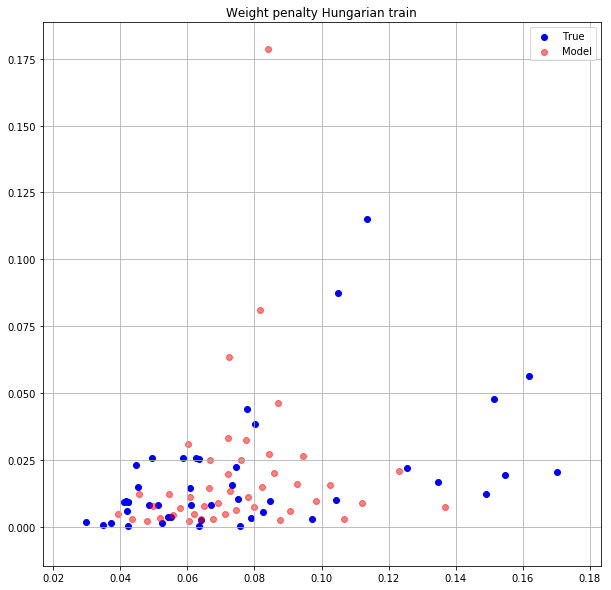

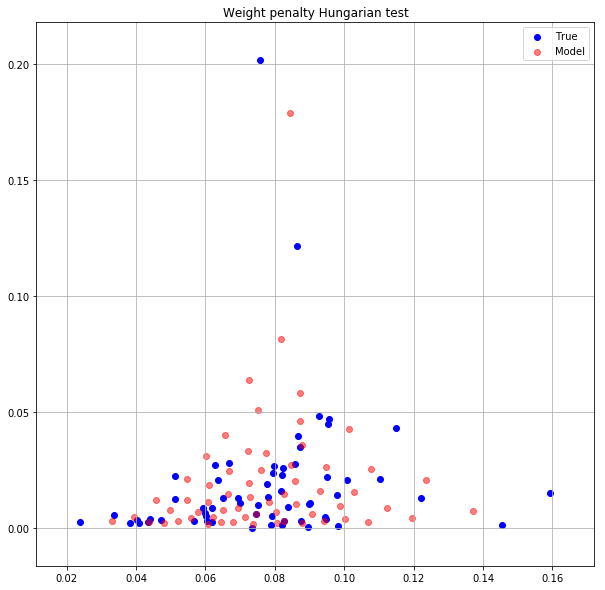

In [41]:
train_loss, val_loss = [], []

for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
    train_loss.append(loss_test)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
    val_loss.append(loss_test)
    scheduler.step(loss_test)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    
    cur_n = len(train_loss)
    plt.plot(np.arange(cur_n), train_loss, label = 'train')
    plt.plot(np.arange(cur_n), val_loss, label = 'test')
    plt.grid()
    plt.legend()
    plt.show()
    
    
    item = dataset_train[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Weight penalty Hungarian train")
    plt.show()
    
    
    
    item = dataset_test[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Weight penalty Hungarian test")
    plt.show()

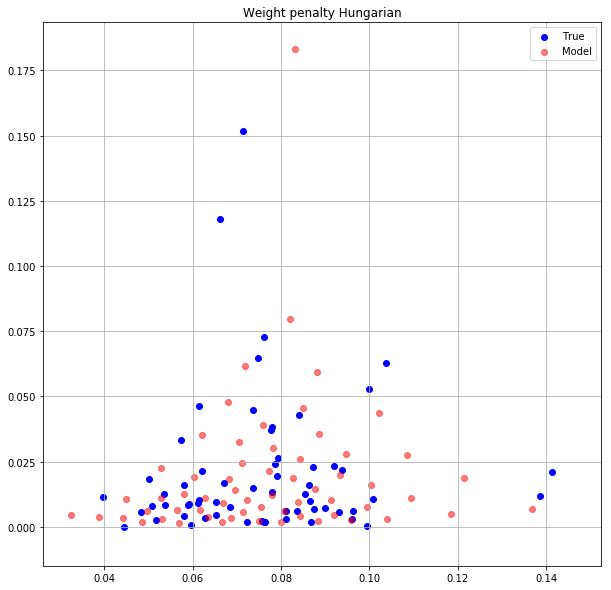

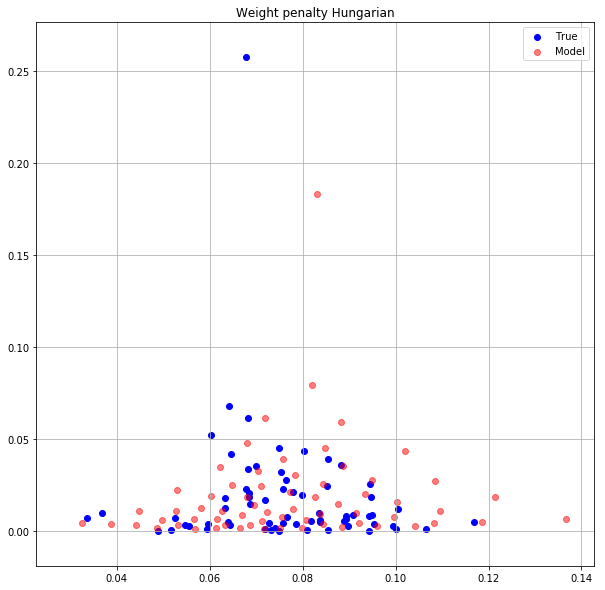

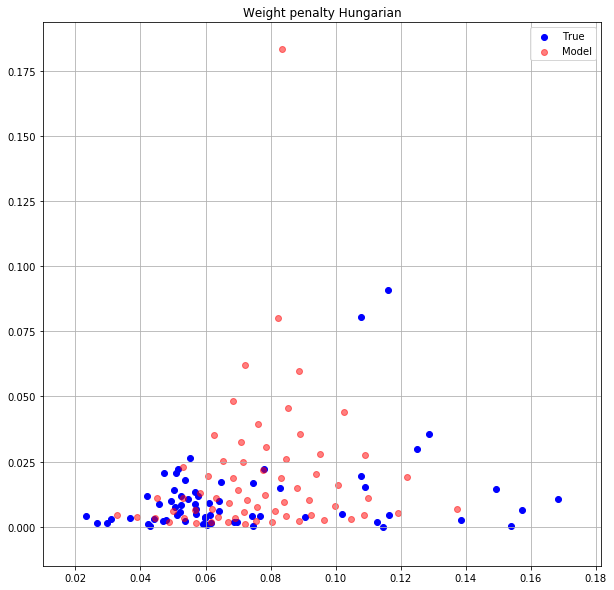

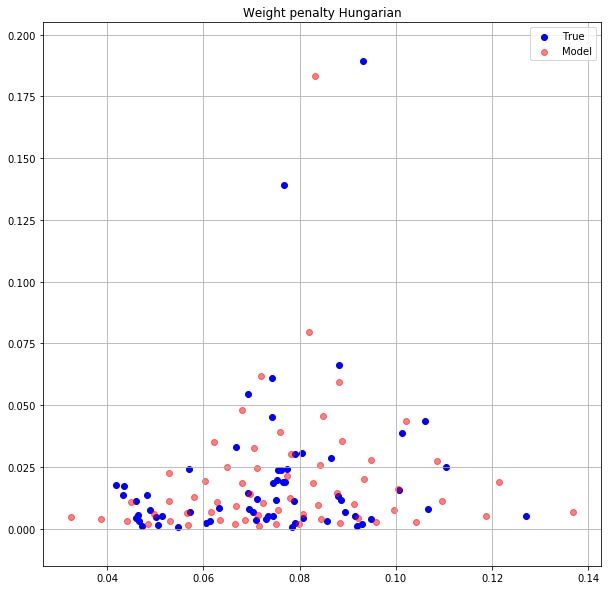

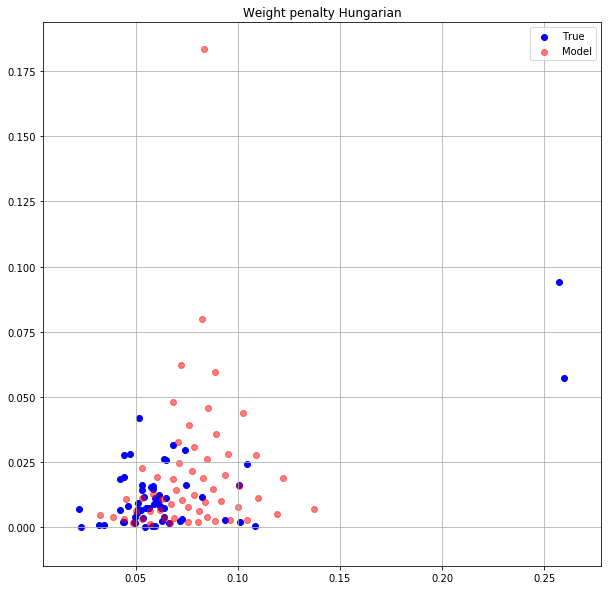

...

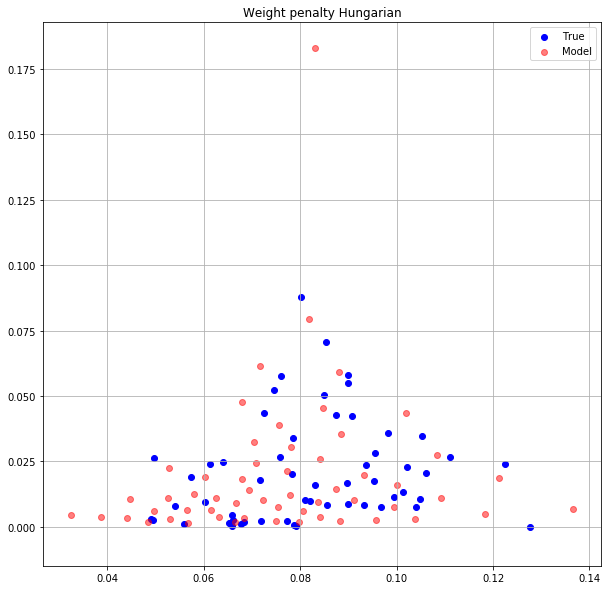

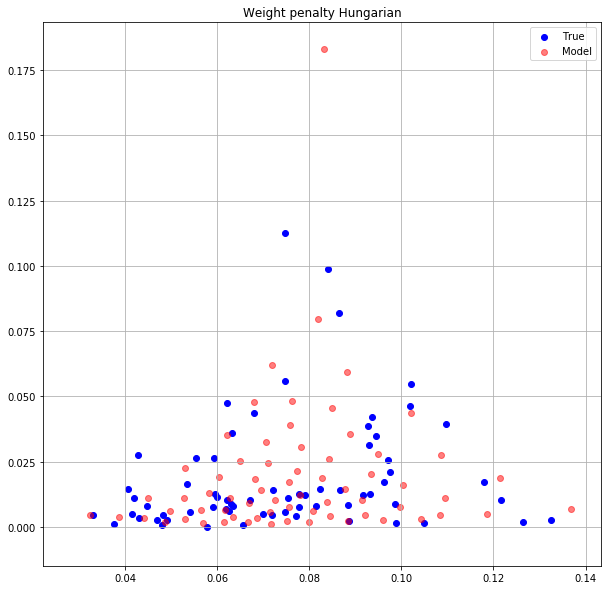

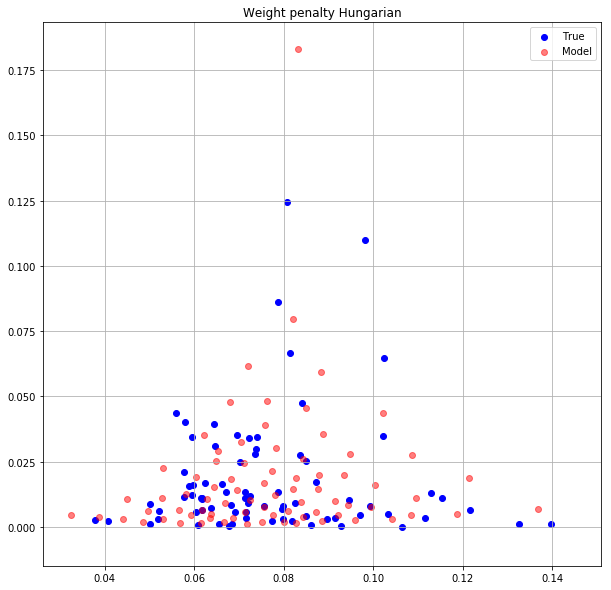

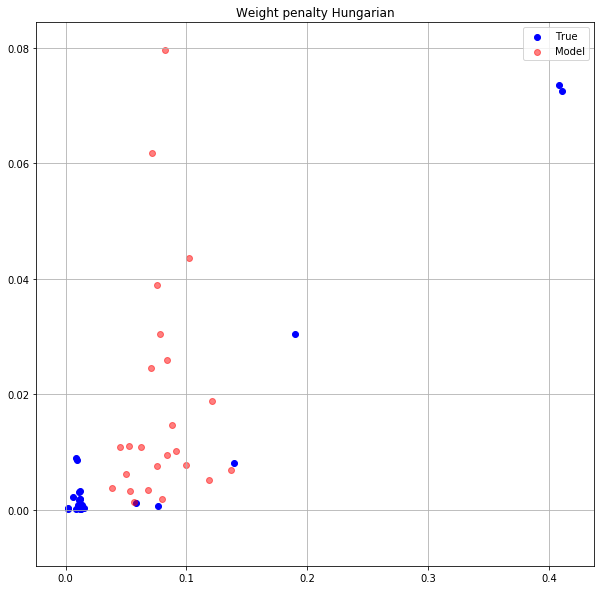

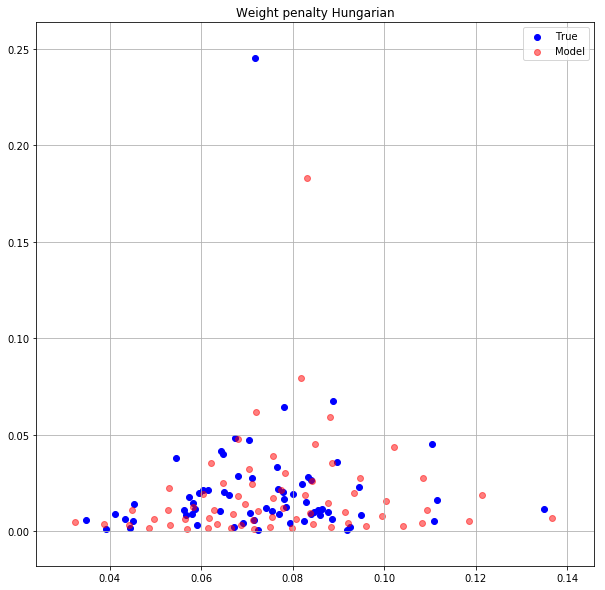

In [8]:
for i in range(15):
    item = dataset_test[i].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Weight penalty Hungarian")
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.7066168785 0.6590770483


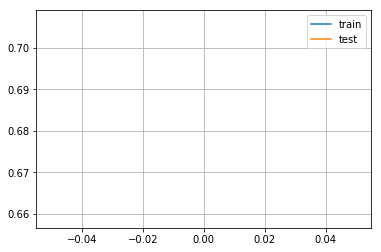

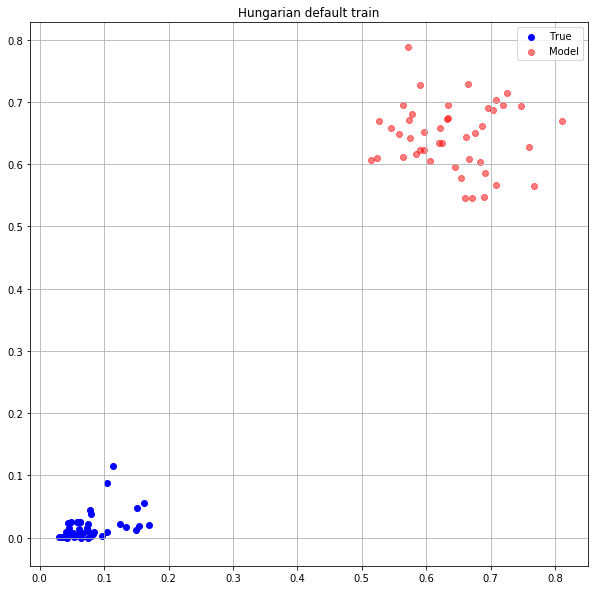

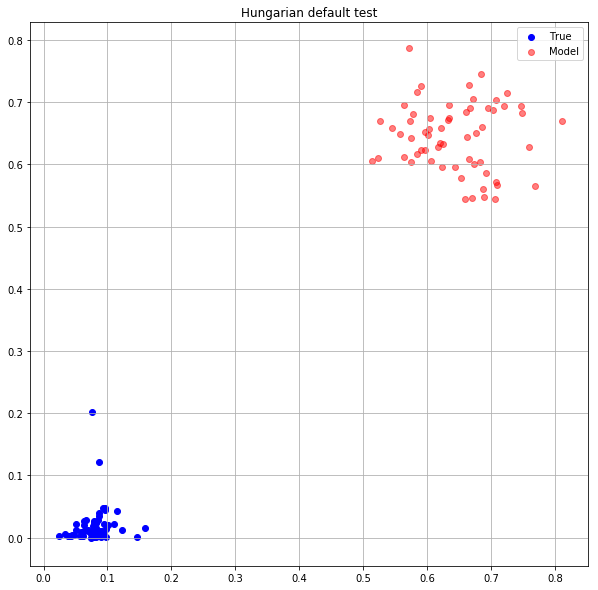

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.6201784611 0.5332494974


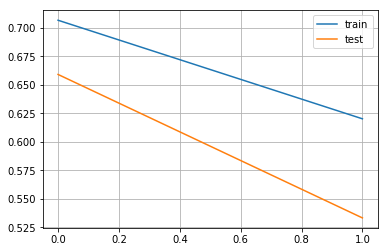

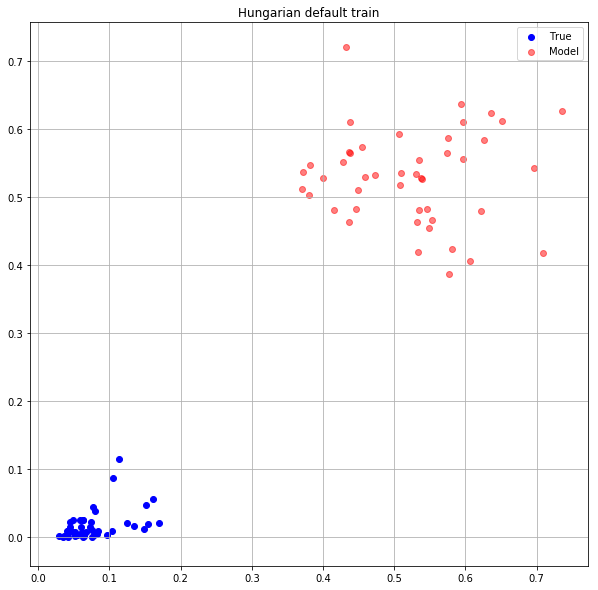

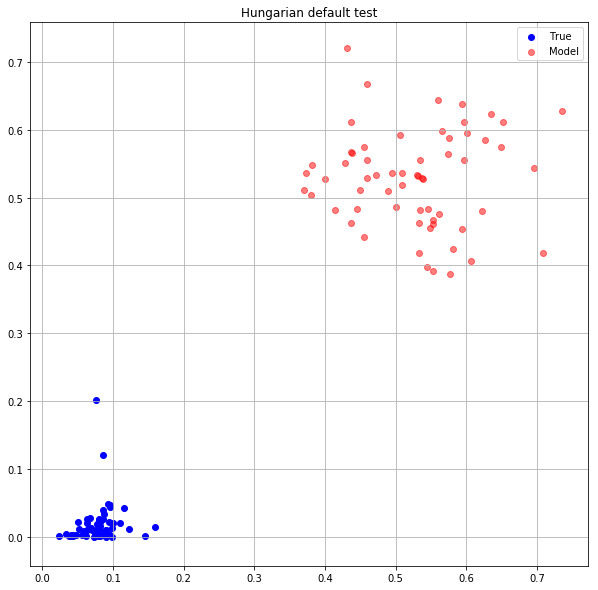

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.4435860515 0.2975595295


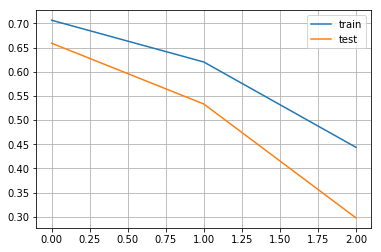

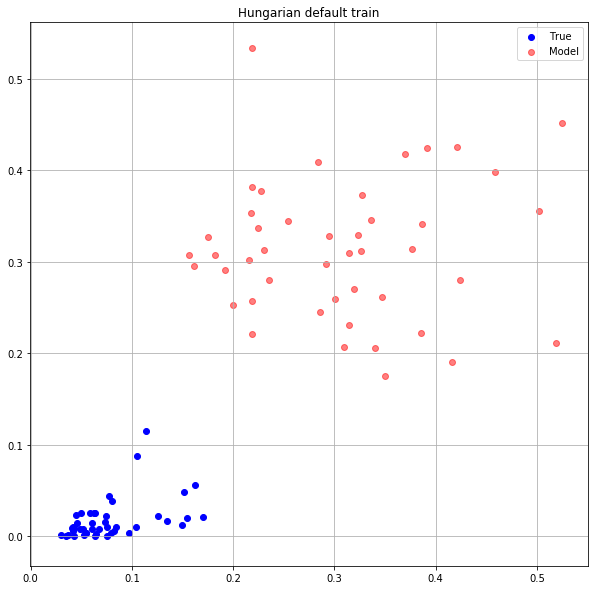

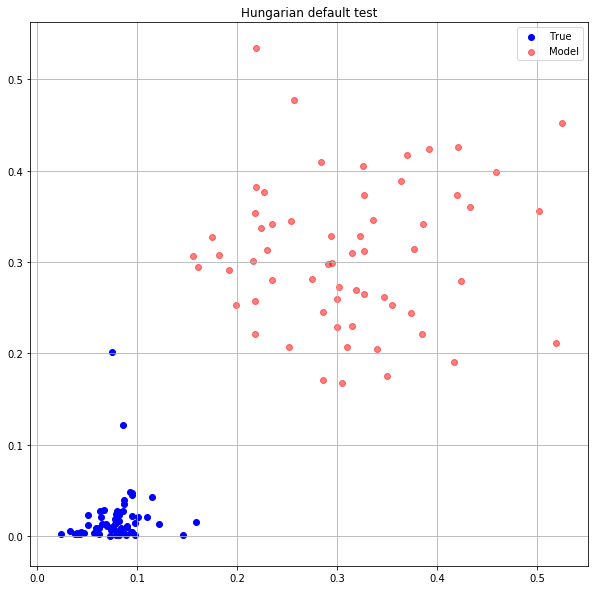

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.1891364157 0.0674229413


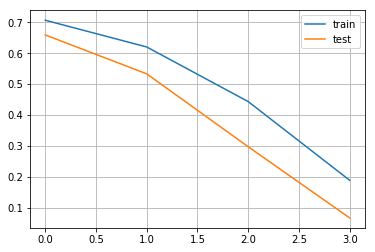

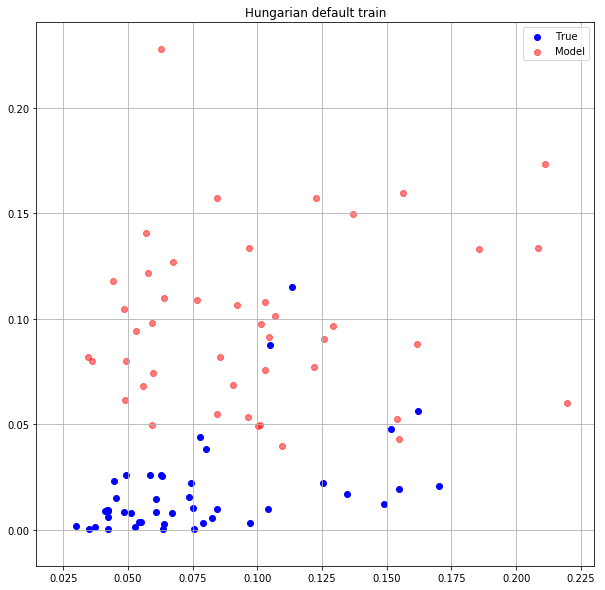

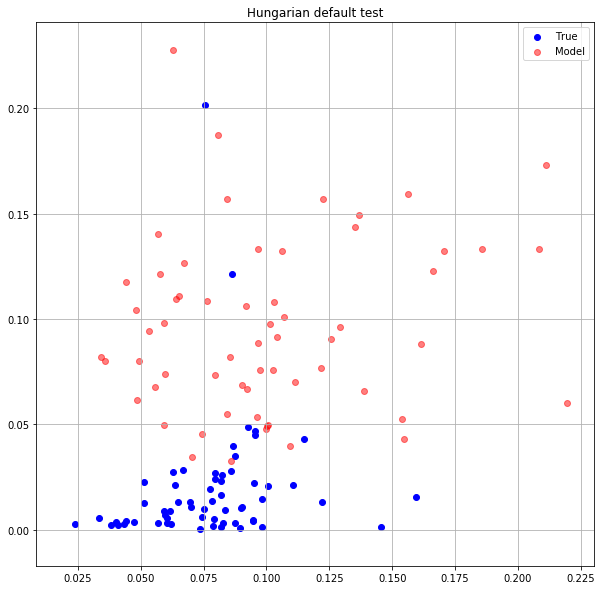

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.0388485193 0.0315627679


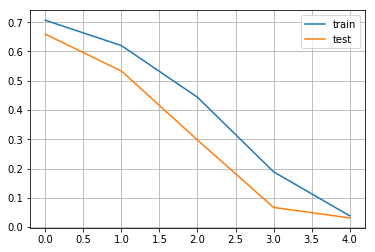

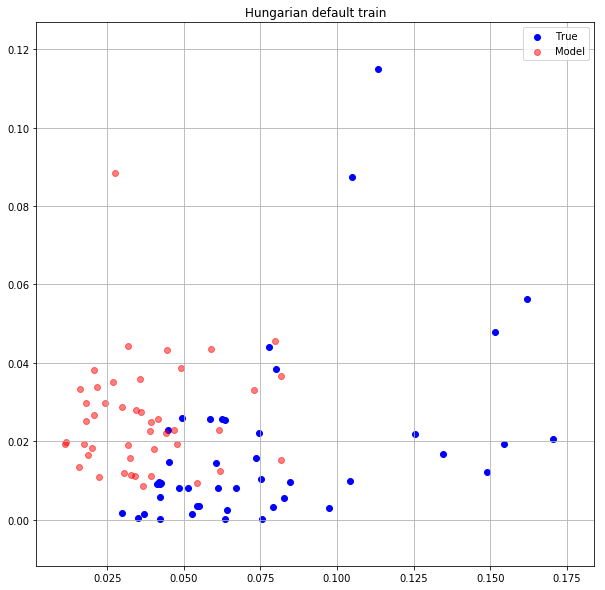

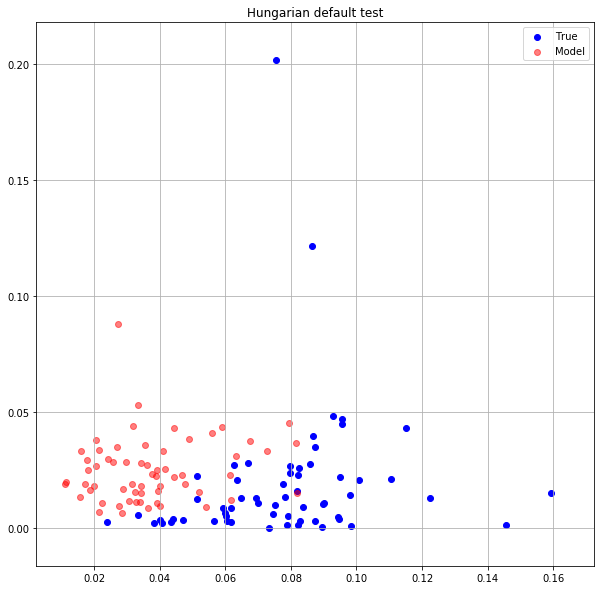

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.0302962754 0.0205213800


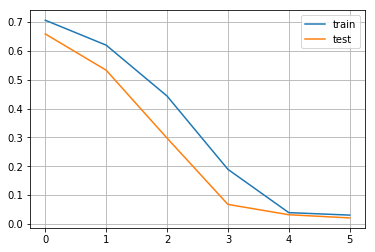

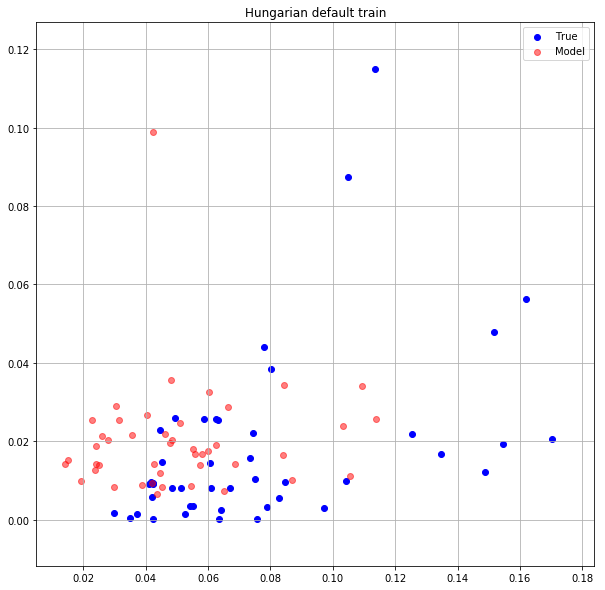

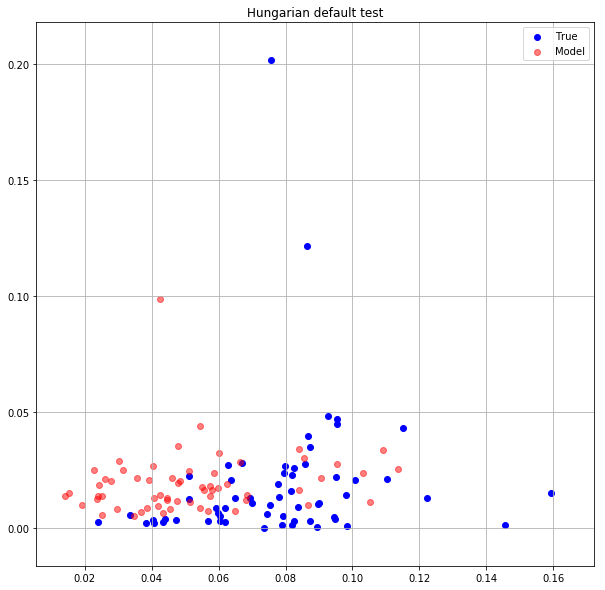

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0148525080 0.0118172970


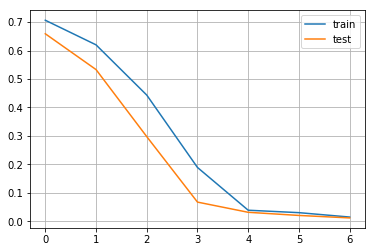

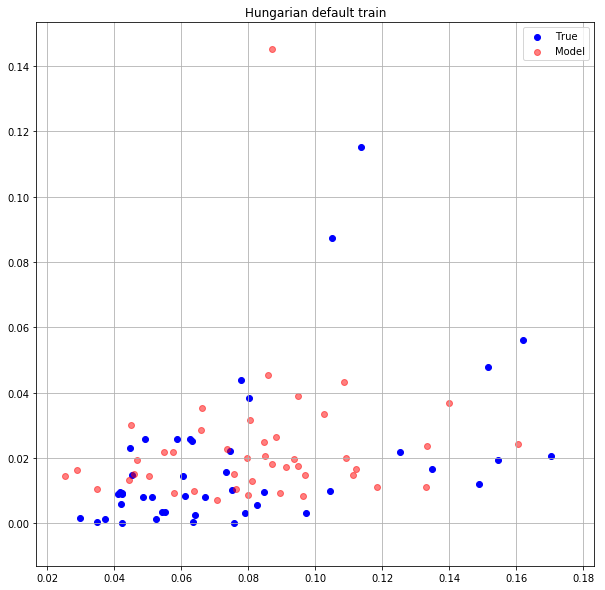

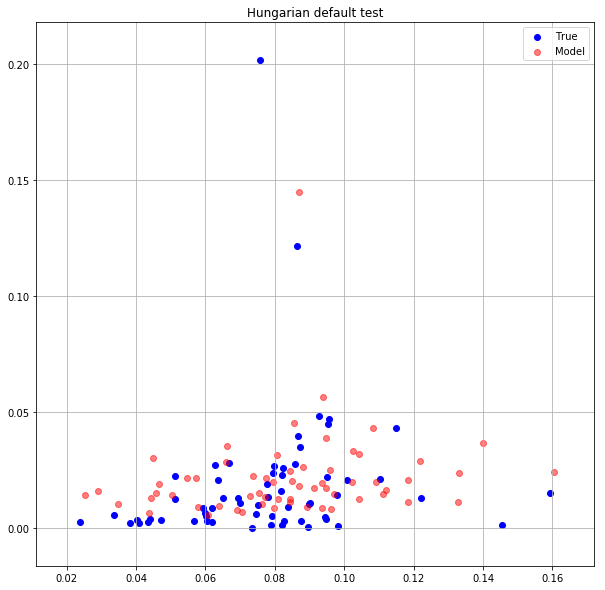

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0098601878 0.0084737465


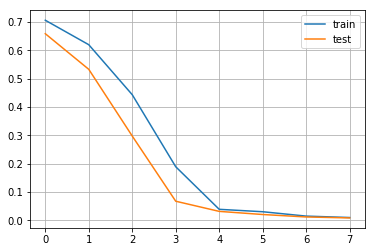

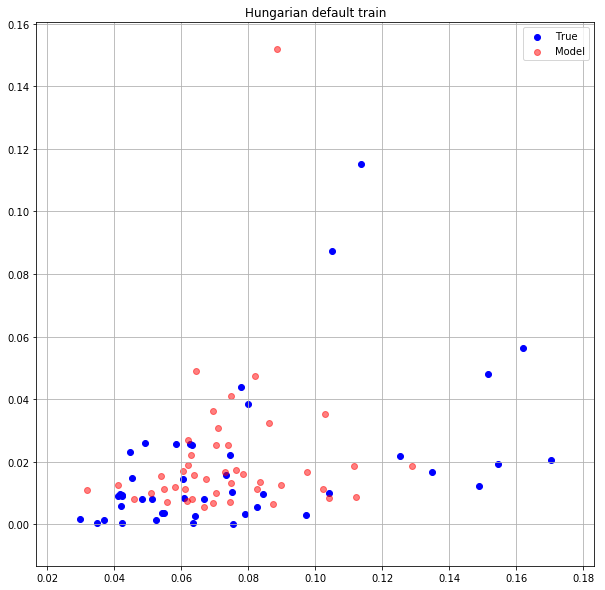

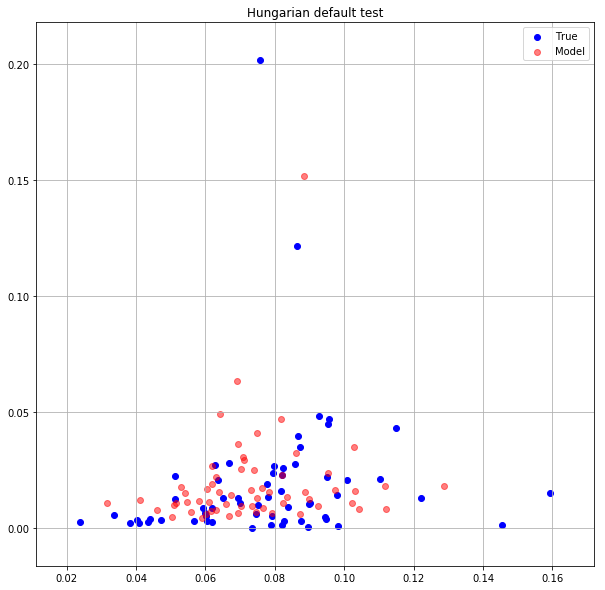

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0084810285 0.0076218275


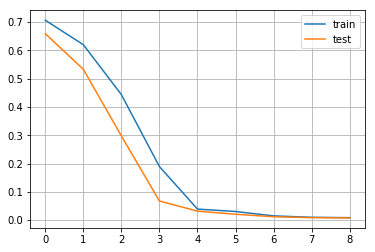

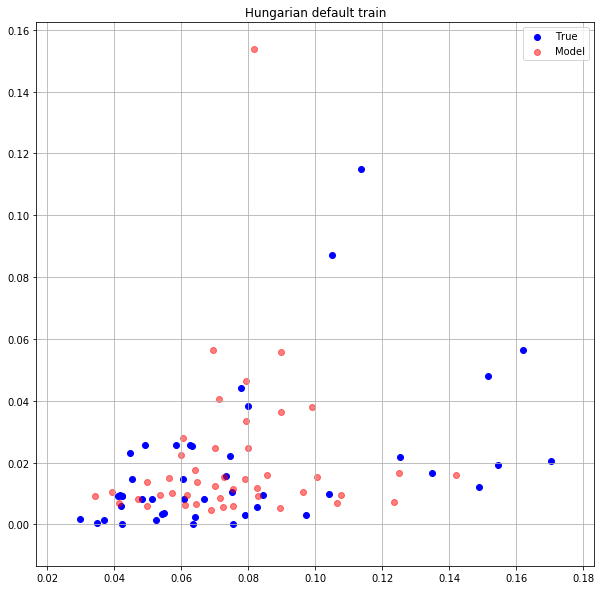

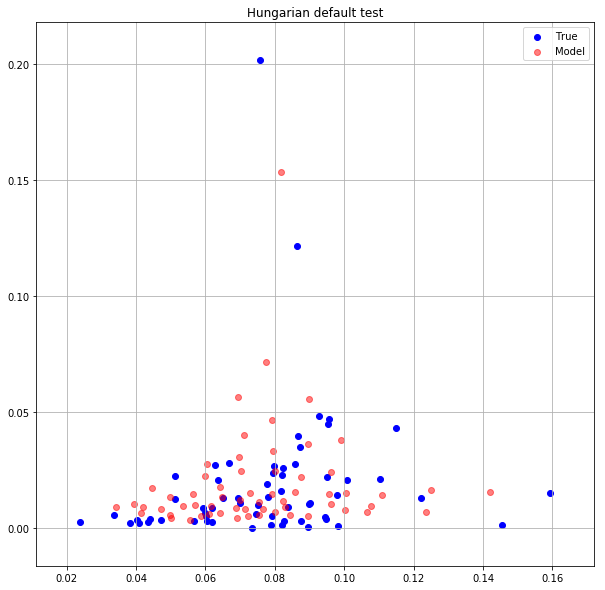

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0080005834 0.0074097235


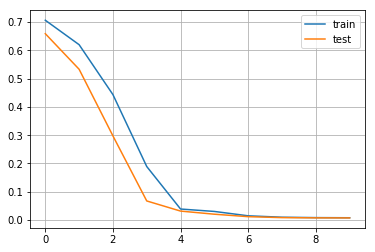

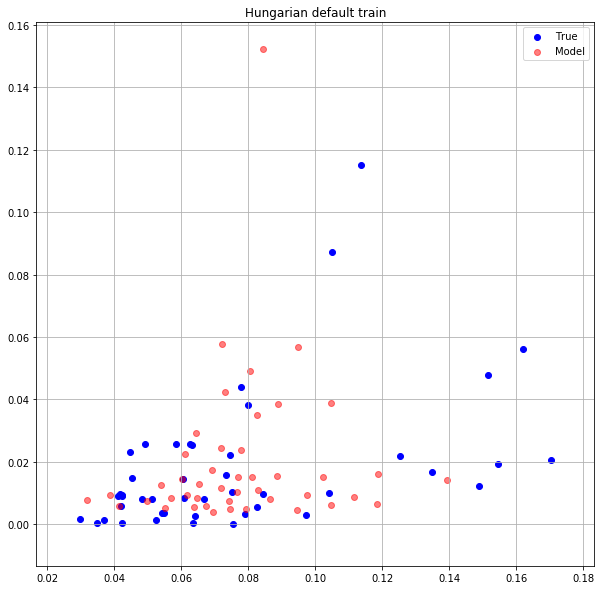

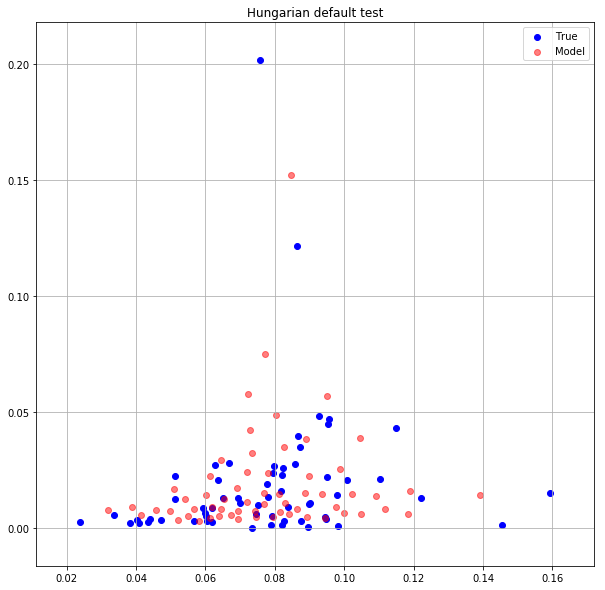

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0078084408 0.0072850180


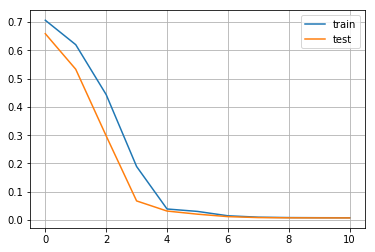

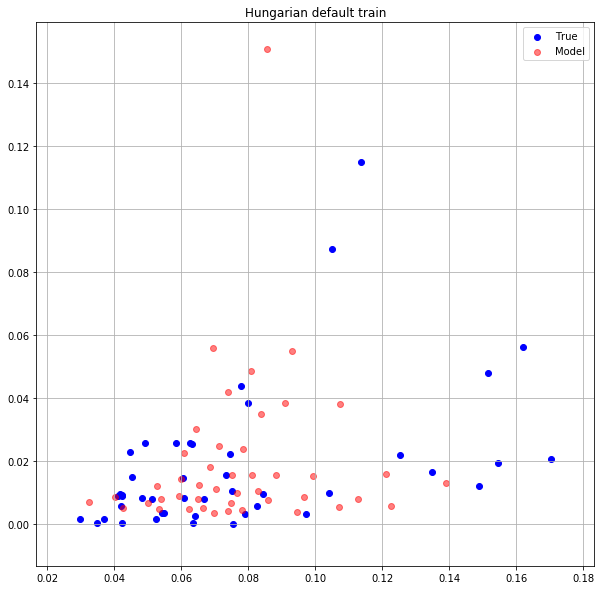

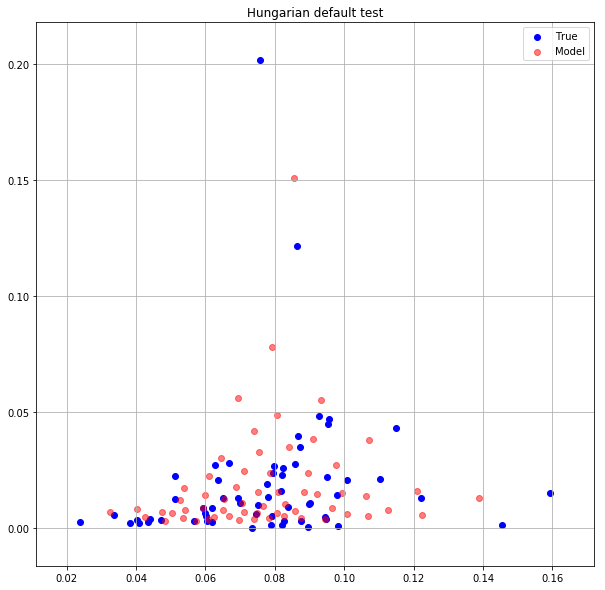

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0077042859 0.0072236871


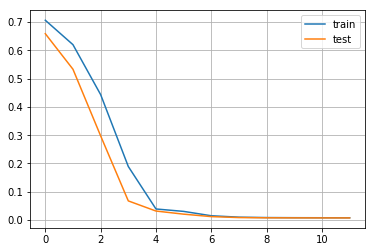

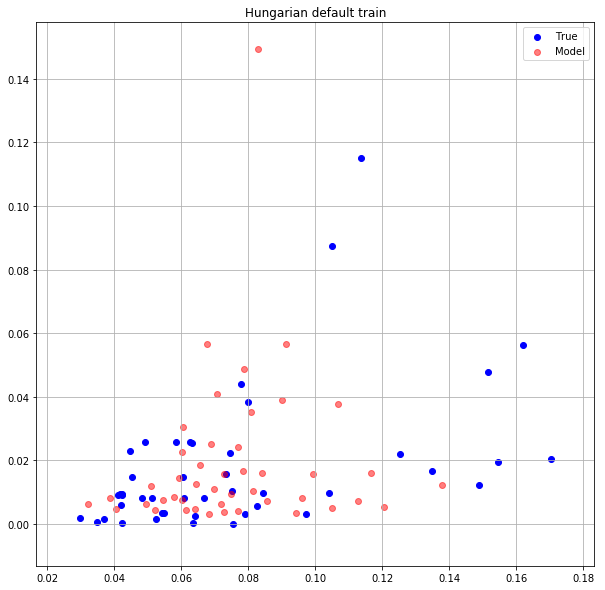

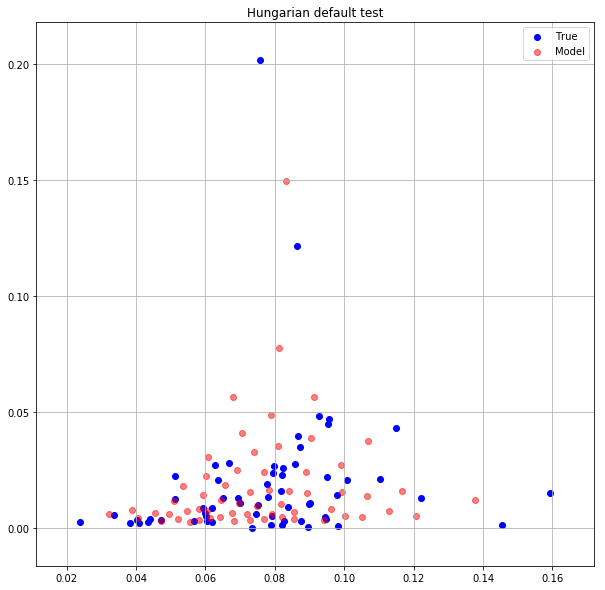

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.0077648307 0.0071846135


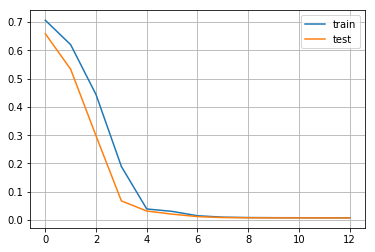

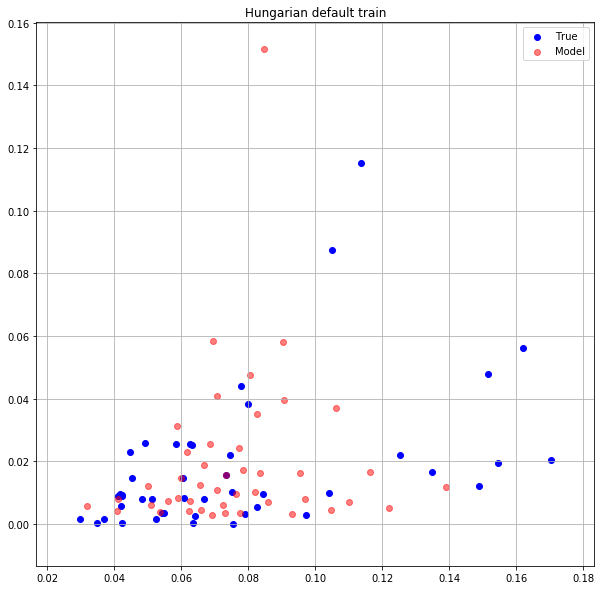

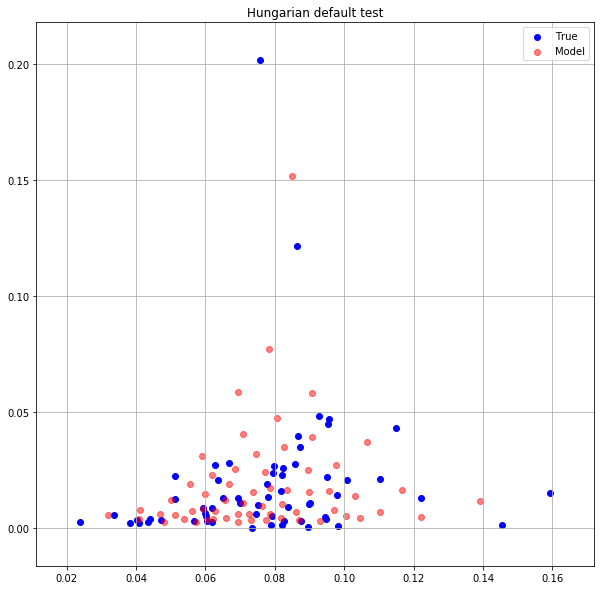

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.0075774249 0.0071527911


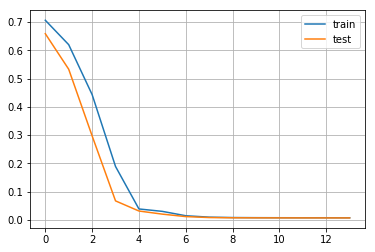

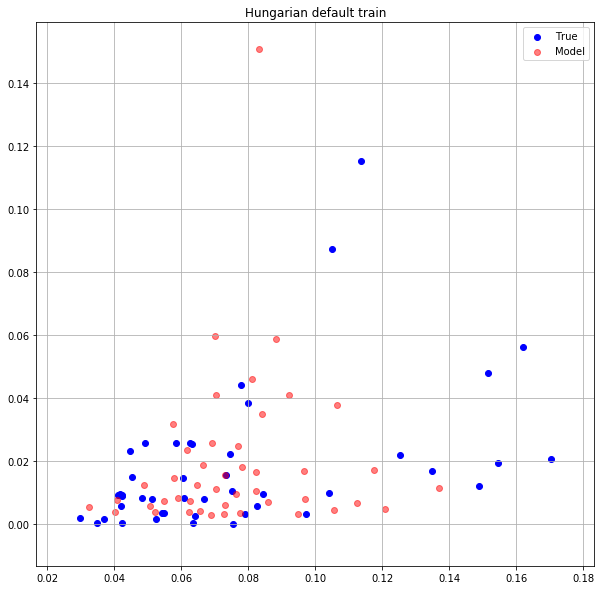

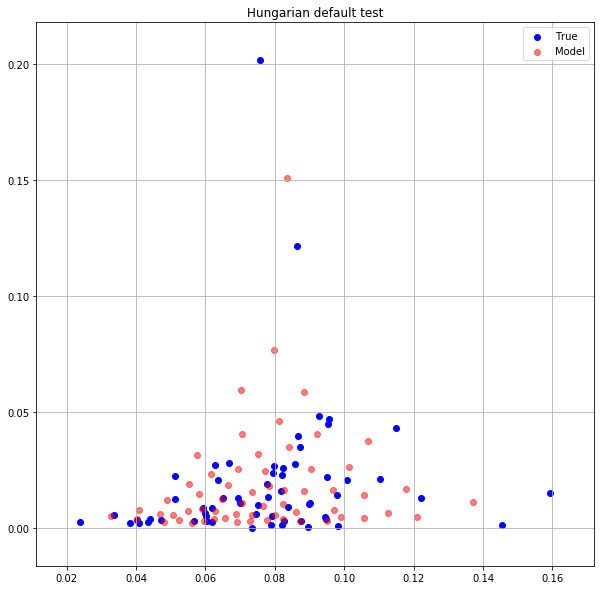

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.0076336986 0.0071386523


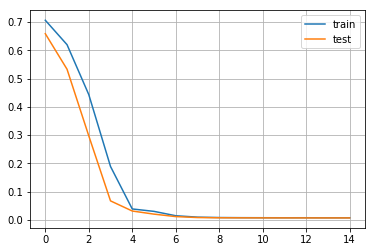

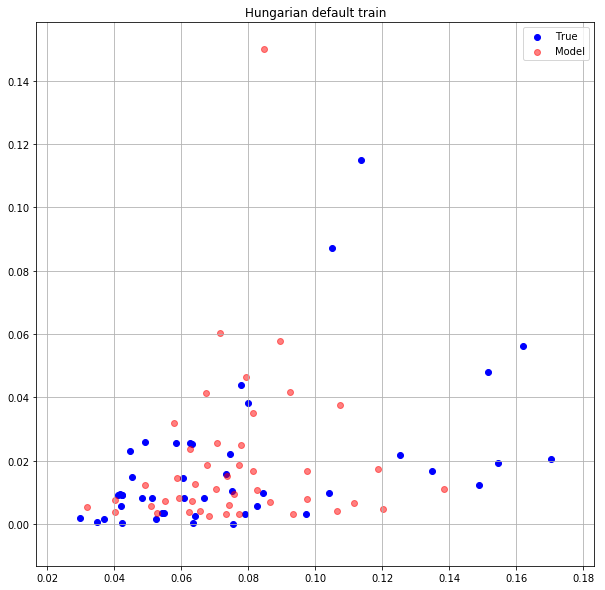

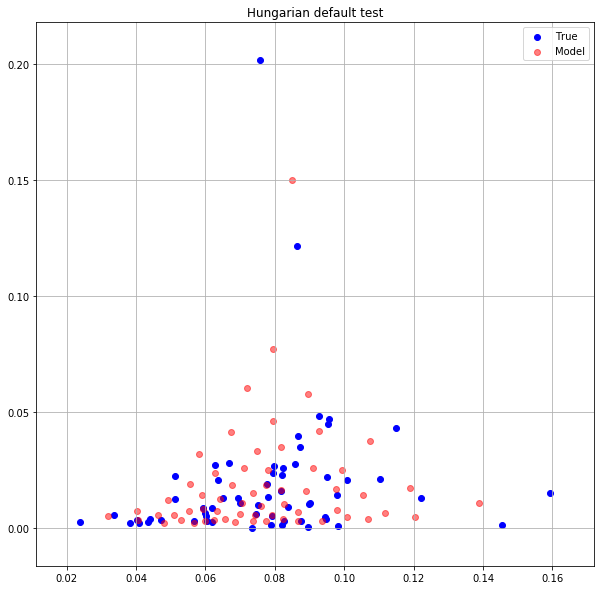

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.0076205567 0.0071309400


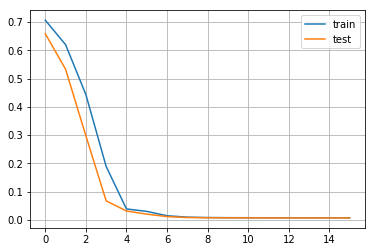

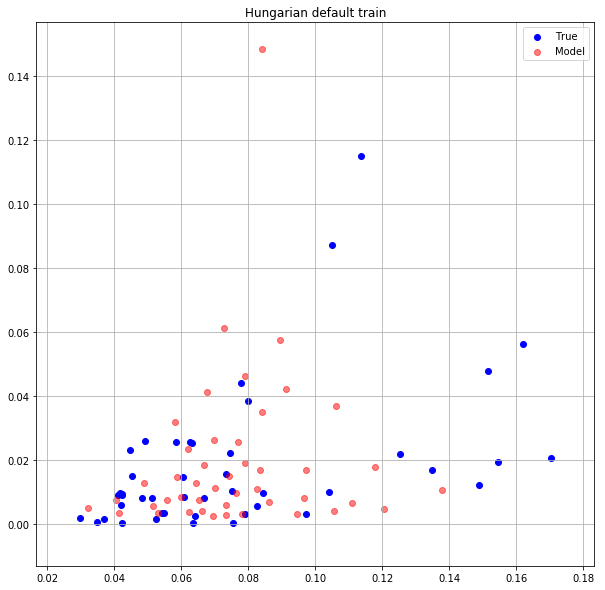

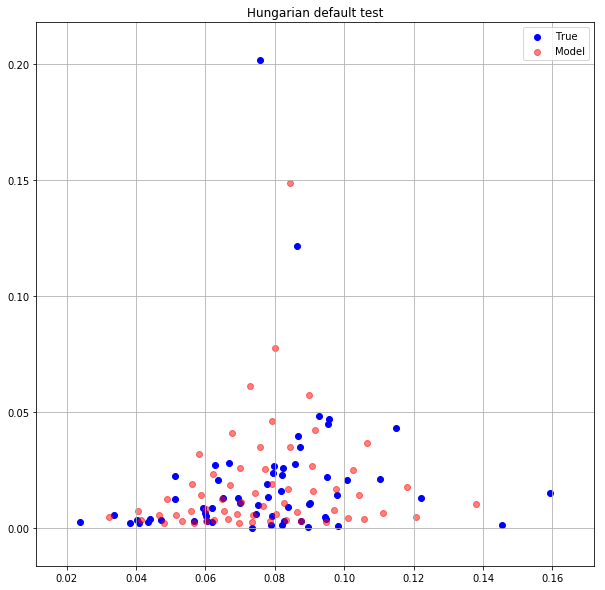

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.0075713098 0.0071240212


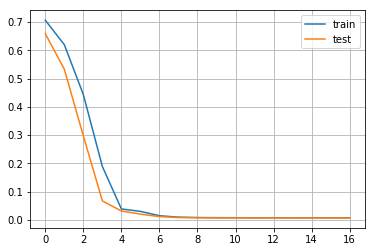

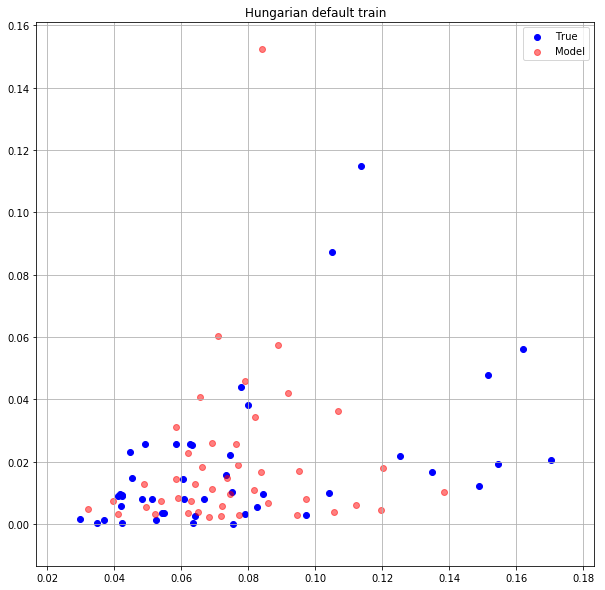

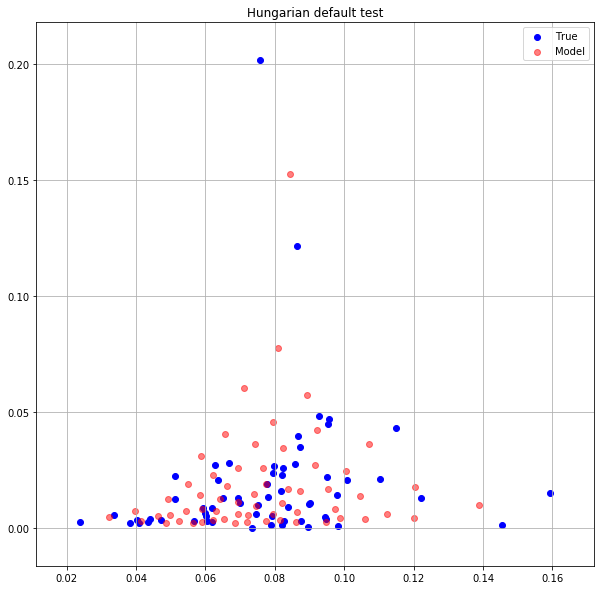

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.0075402576 0.0071212822


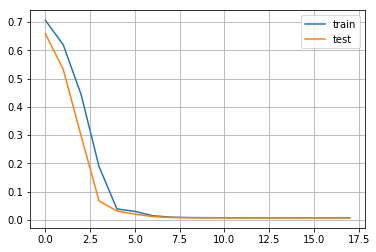

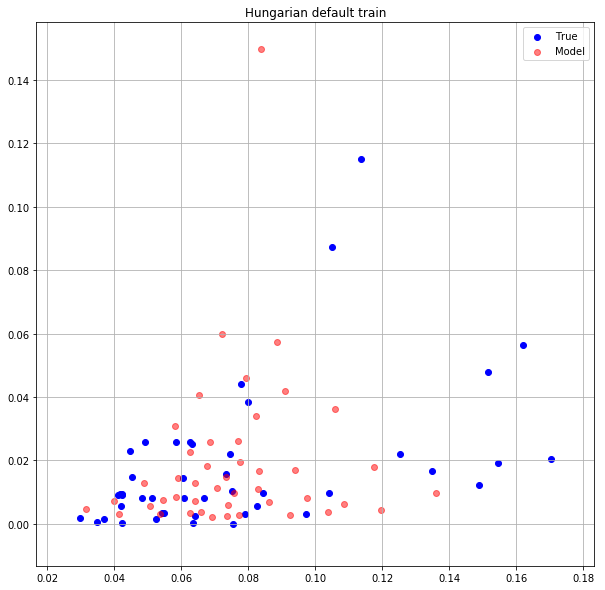

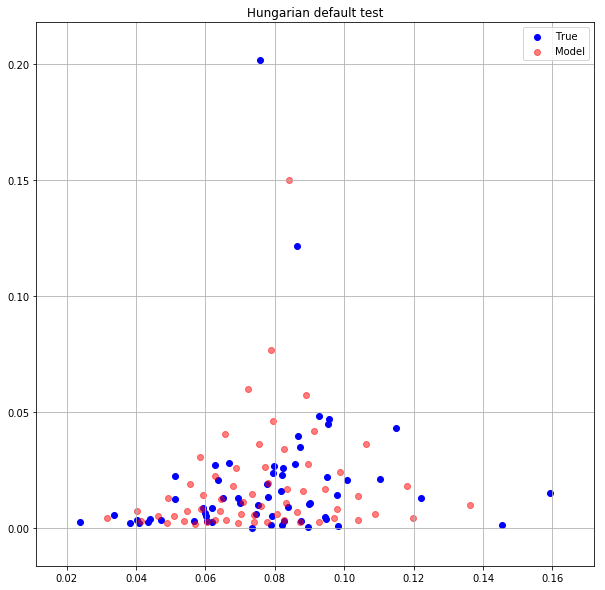

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 0.0076220538 0.0071120709


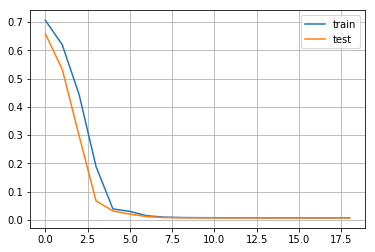

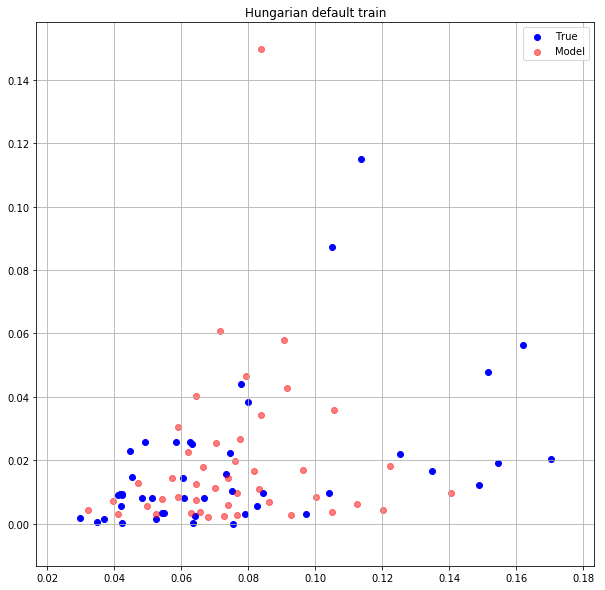

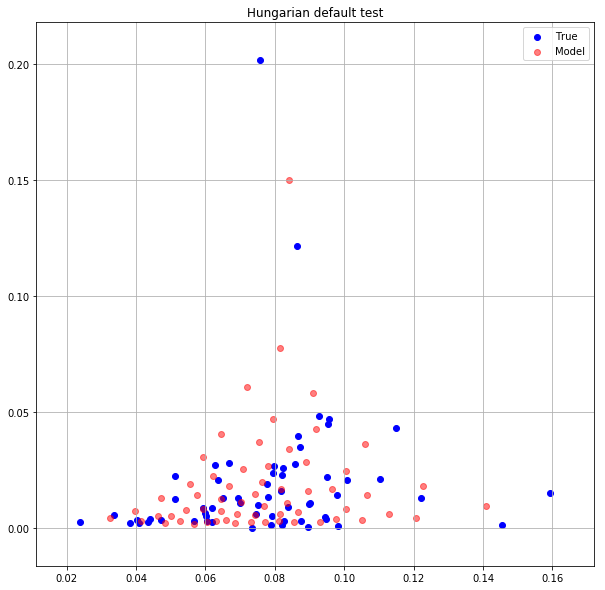

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 0.0075449799 0.0071122819


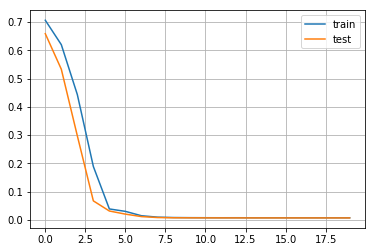

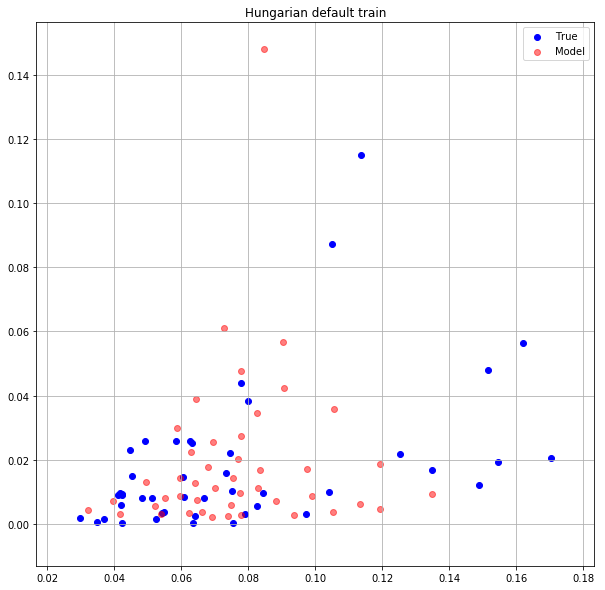

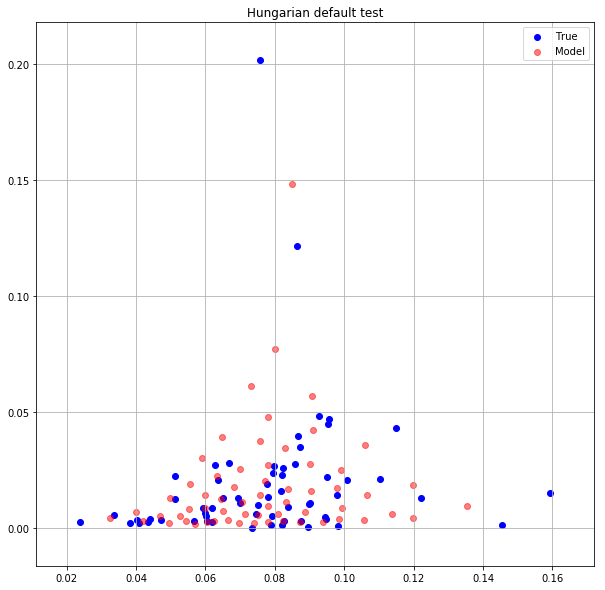

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  20 0.0075424802 0.0071342494


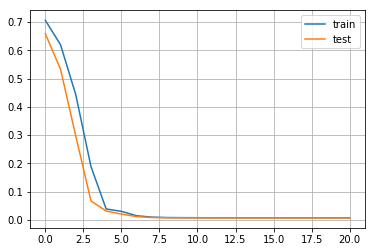

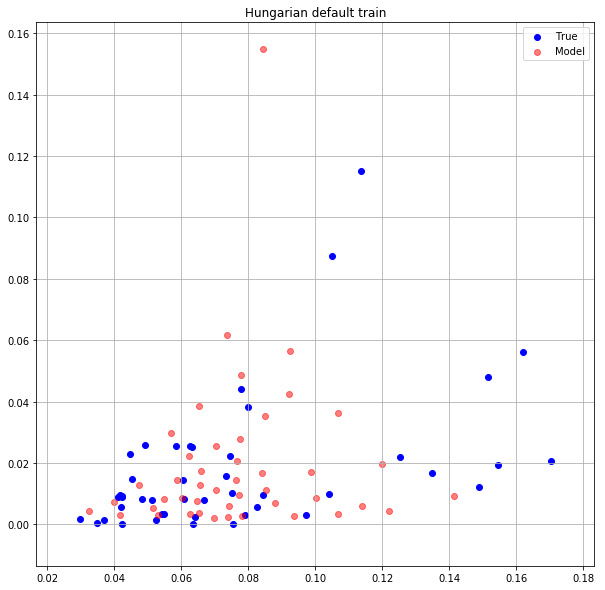

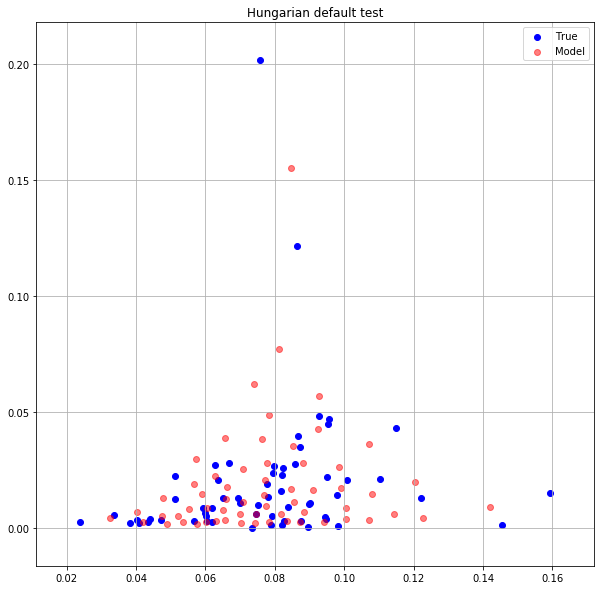

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  21 0.0075904620 0.0071159624


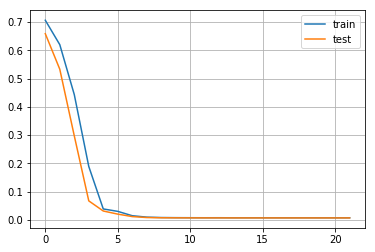

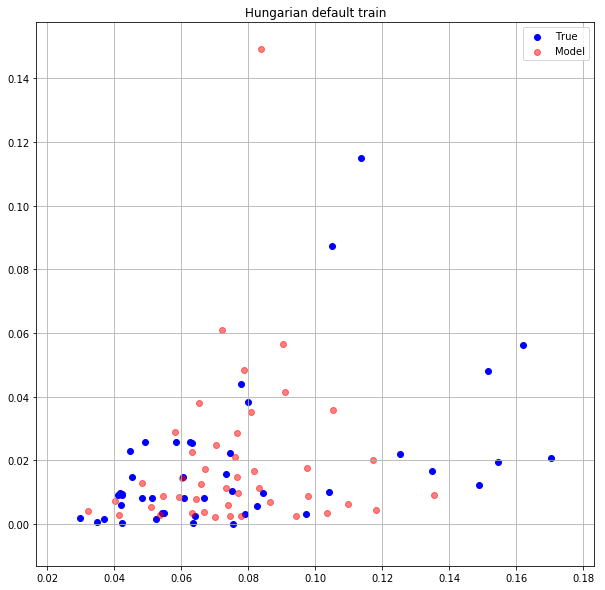

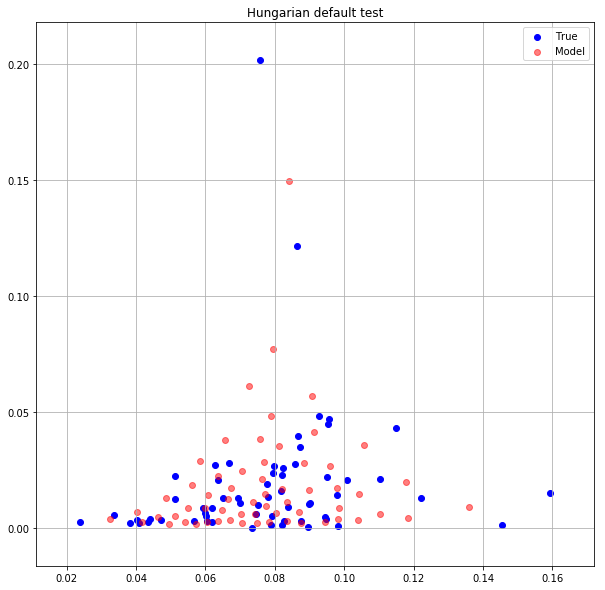

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  22 0.0074833469 0.0071033724


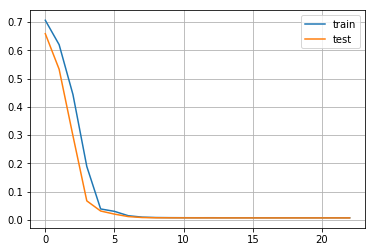

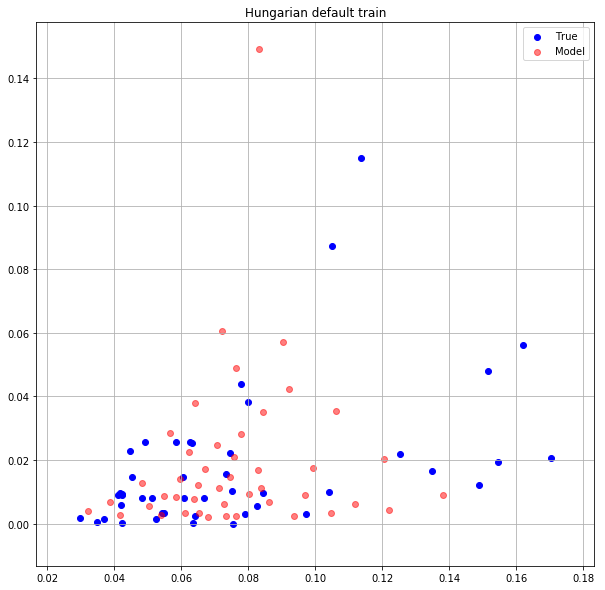

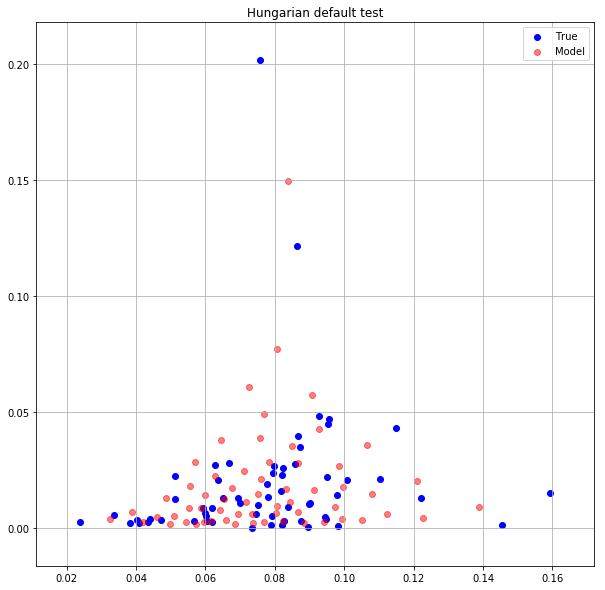

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  23 0.0075107175 0.0071048397


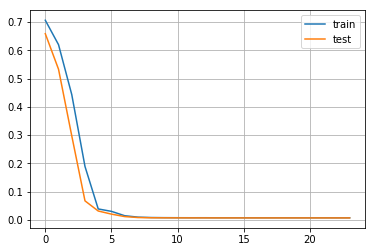

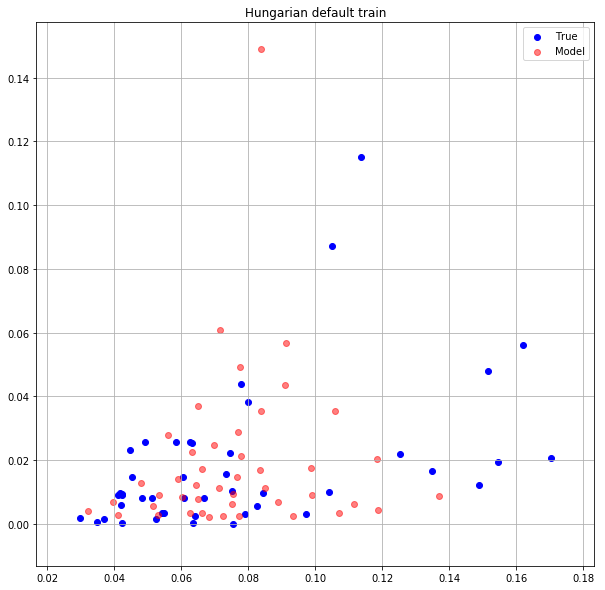

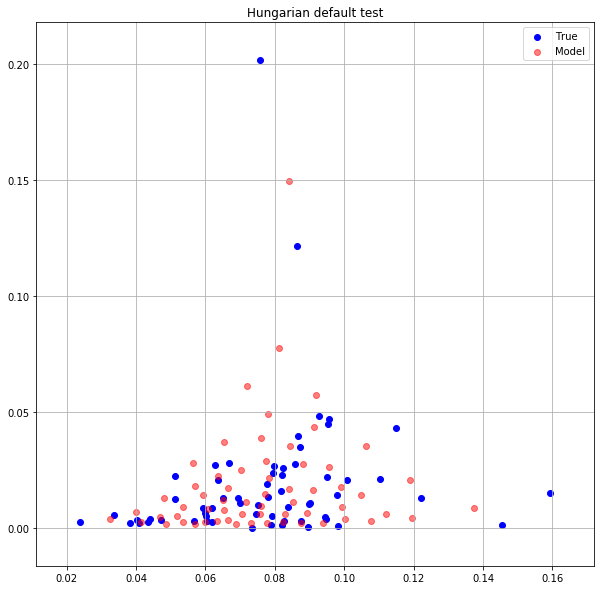

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  24 0.0075243949 0.0071191434


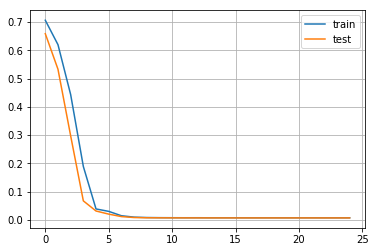

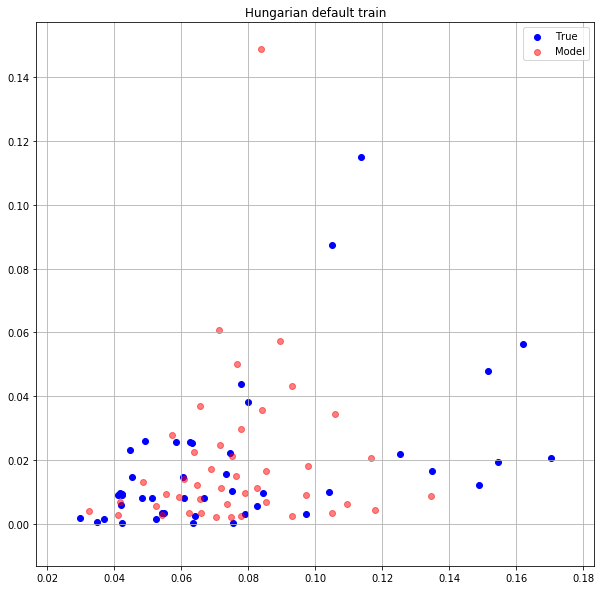

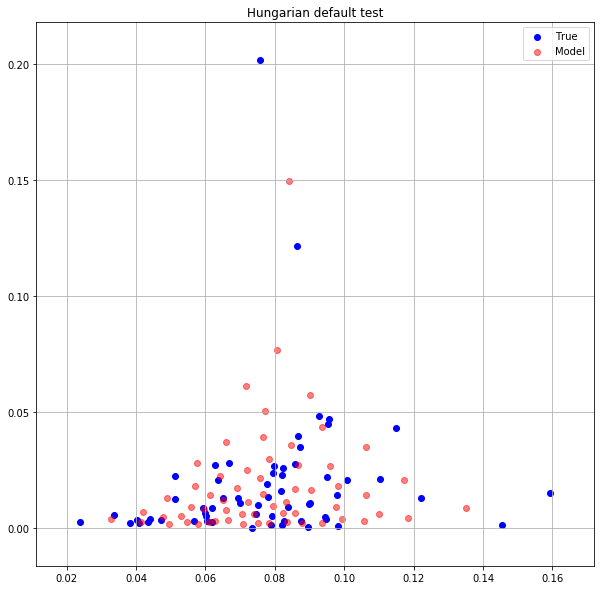

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  25 0.0075279684 0.0071011689


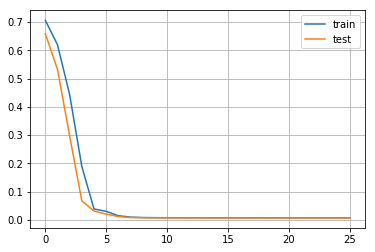

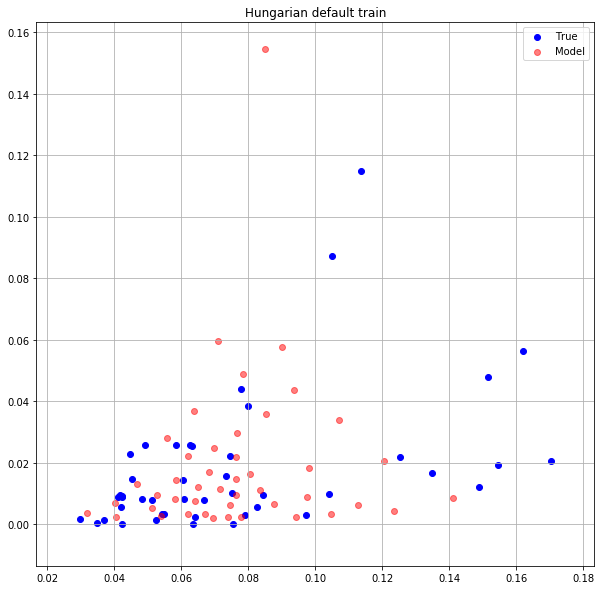

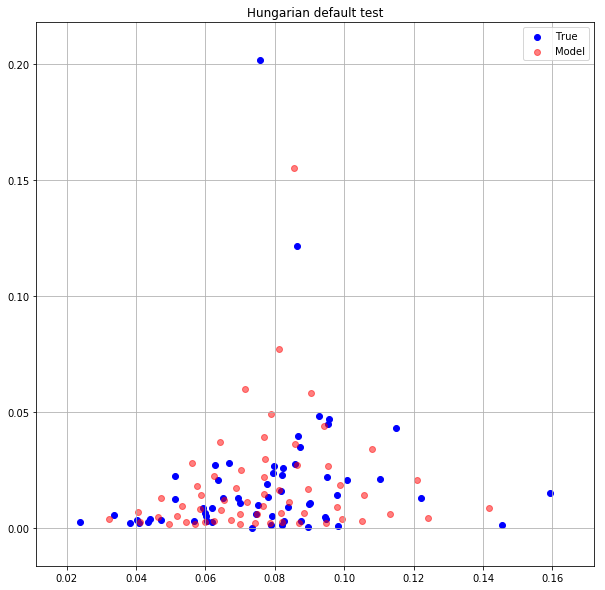

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  26 0.0076110293 0.0070991963


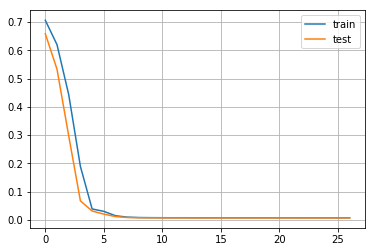

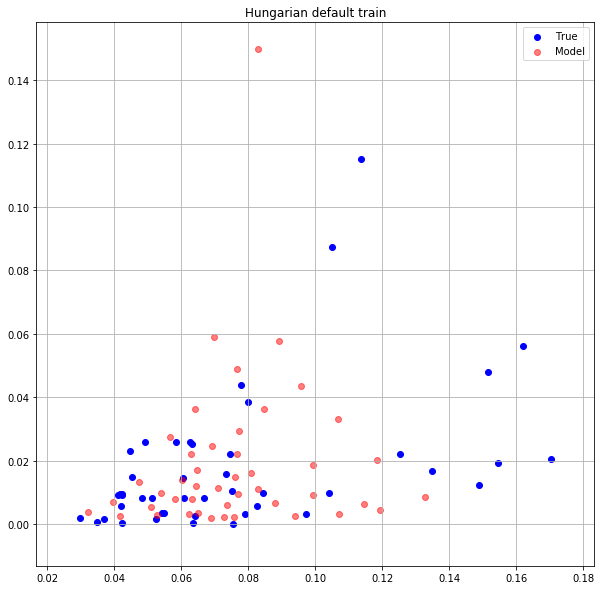

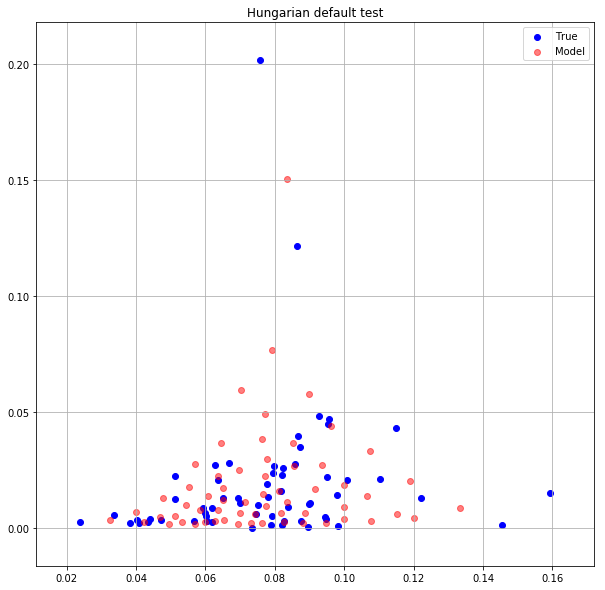

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  27 0.0075499760 0.0070929234


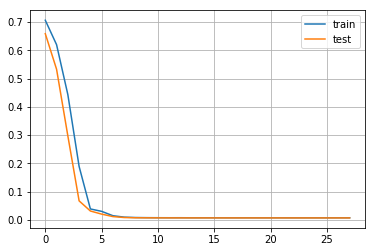

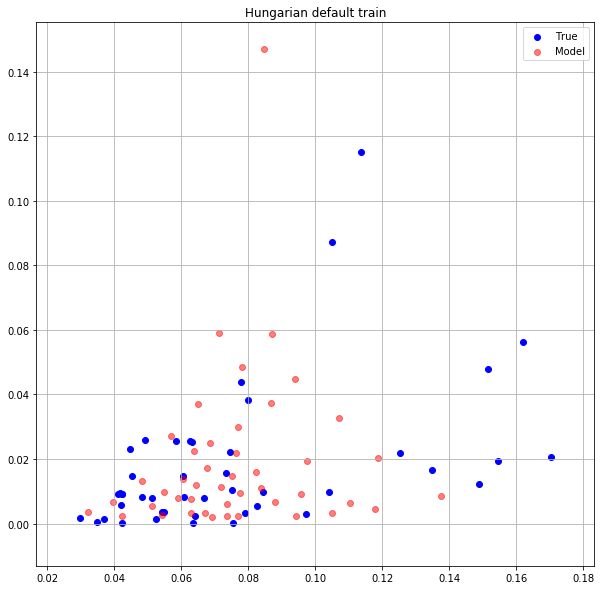

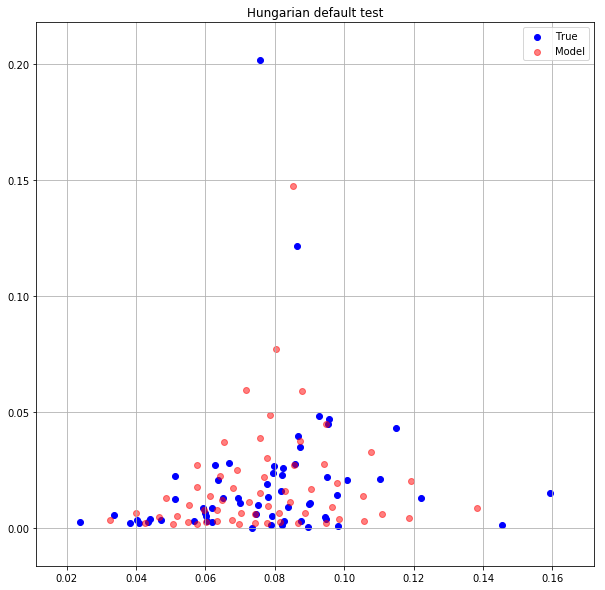

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  28 0.0074981148 0.0070772413


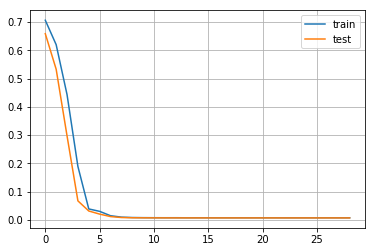

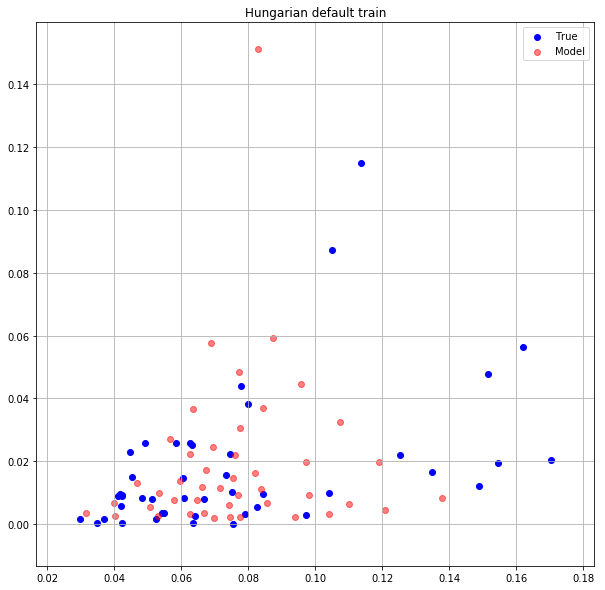

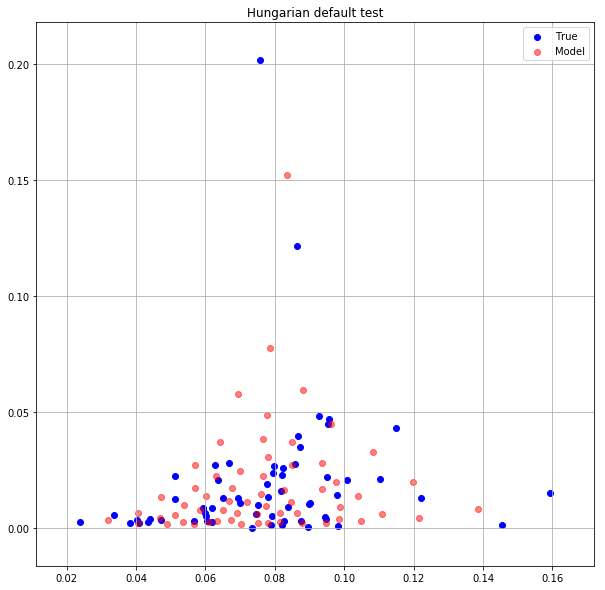

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  29 0.0074942801 0.0070957760


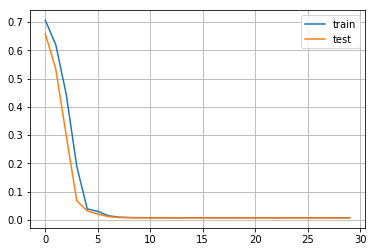

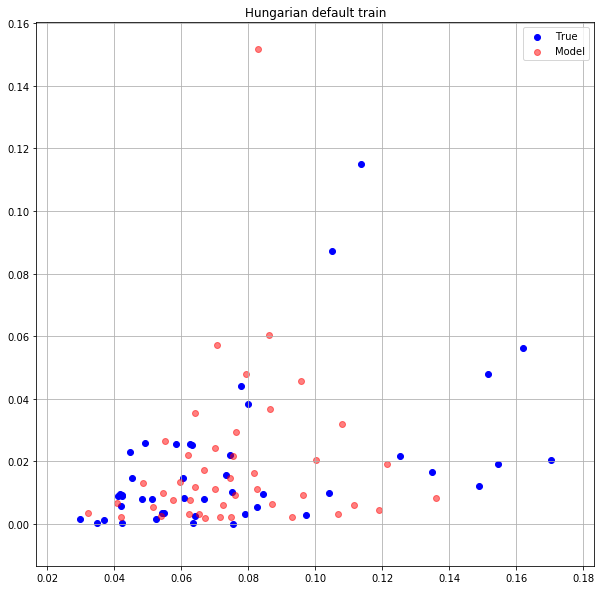

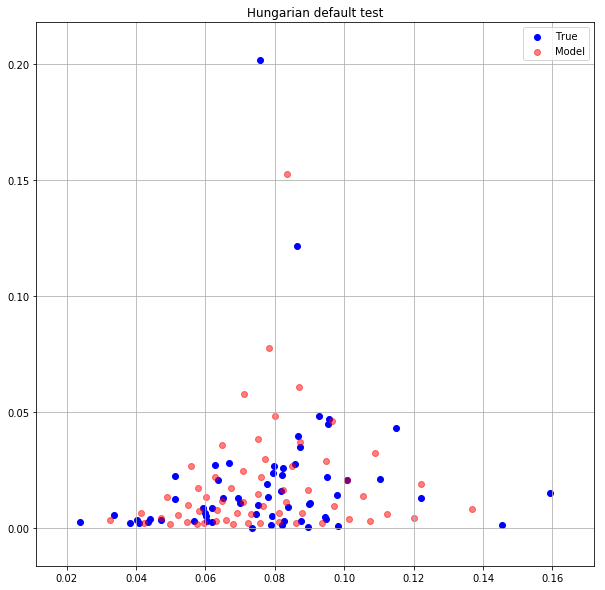

In [43]:
train_loss, val_loss = [], []

for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian_default(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
    train_loss.append(loss_train)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian_default(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
    val_loss.append(loss_test)
    scheduler.step(loss_test)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    
    cur_n = len(train_loss)
    plt.plot(np.arange(cur_n), train_loss, label = 'train')
    plt.plot(np.arange(cur_n), val_loss, label = 'test')
    plt.grid()
    plt.legend()
    plt.show()
    
    
    item = dataset_train[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Hungarian default train")
    plt.show()
    
    
    
    item = dataset_test[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Hungarian default test")
    plt.show()

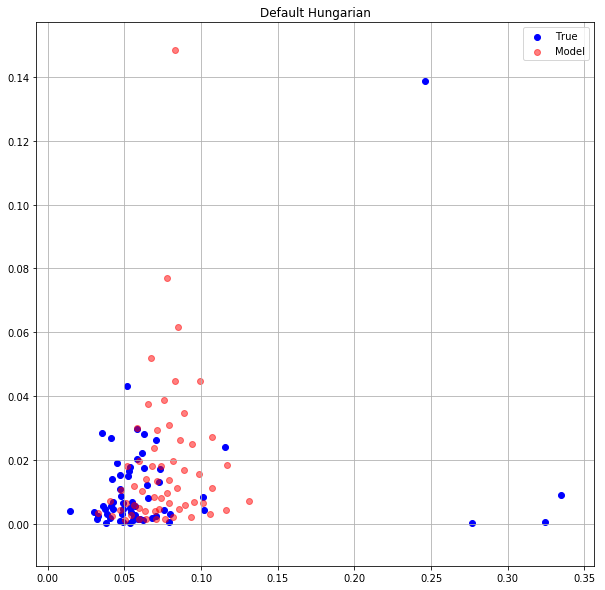

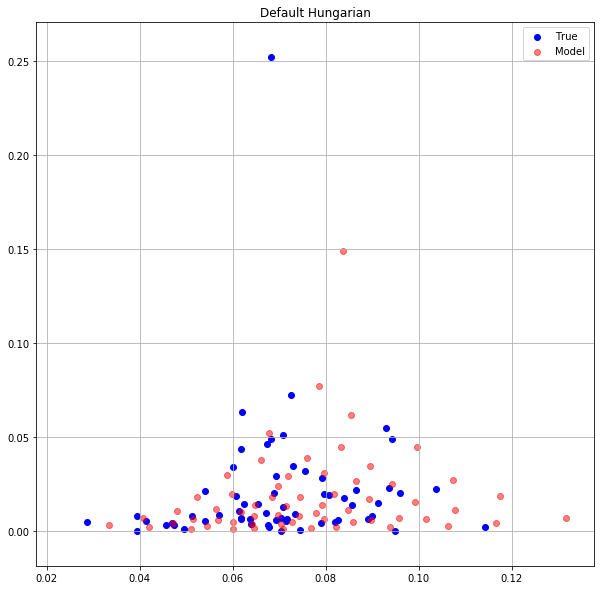

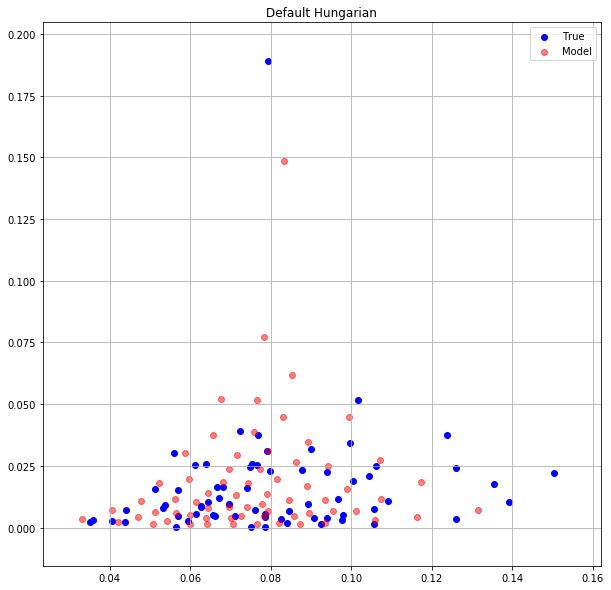

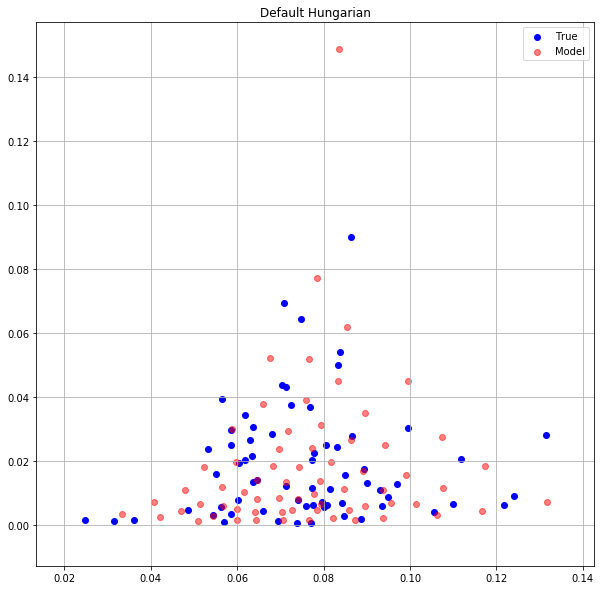

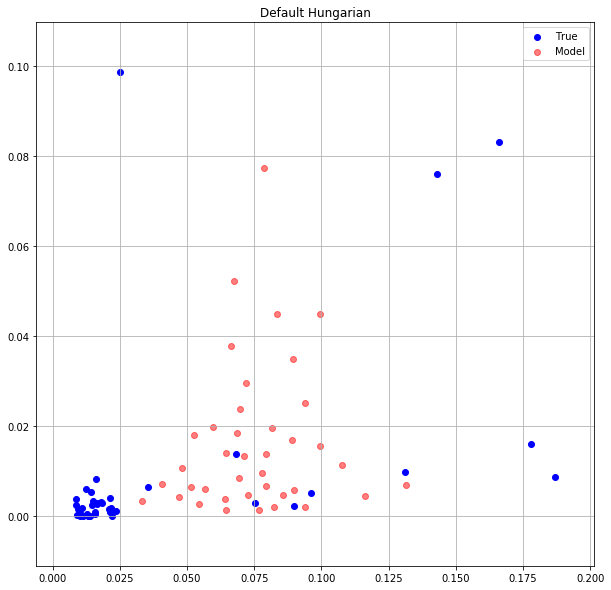

...

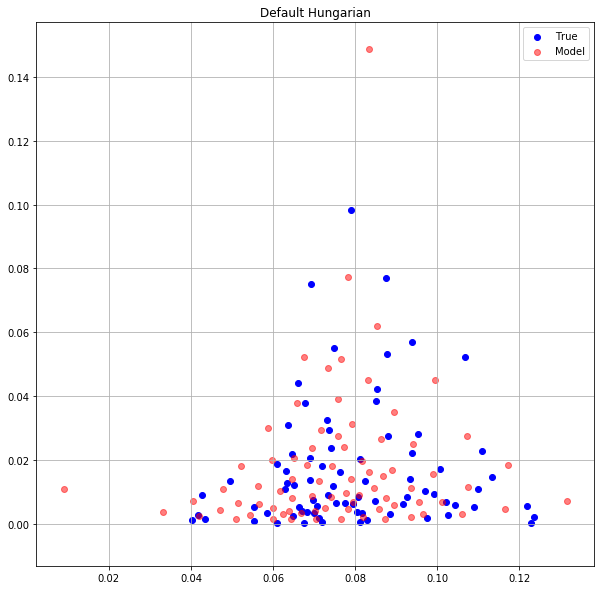

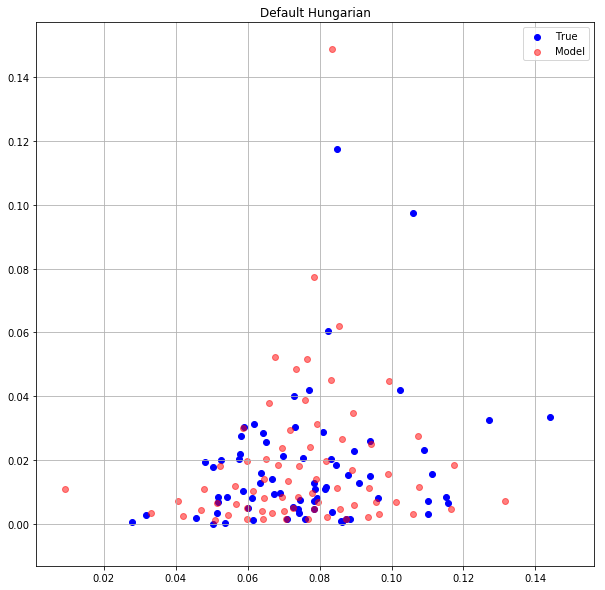

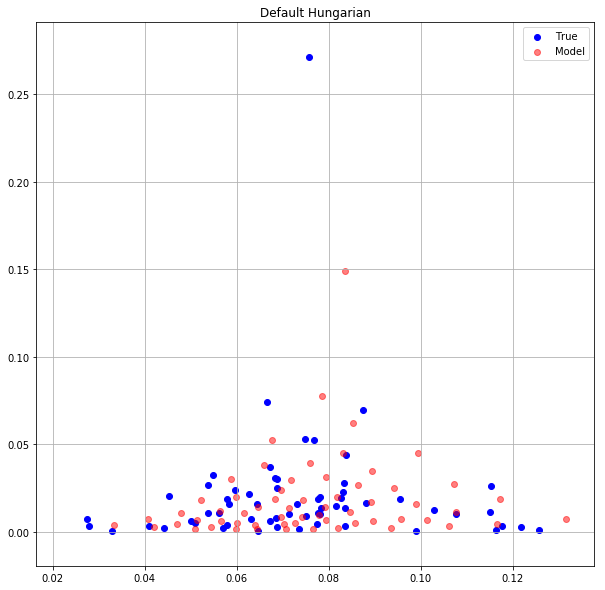

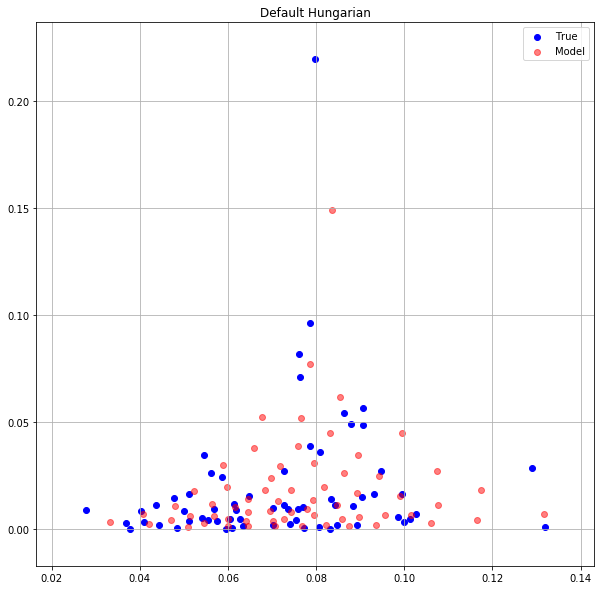

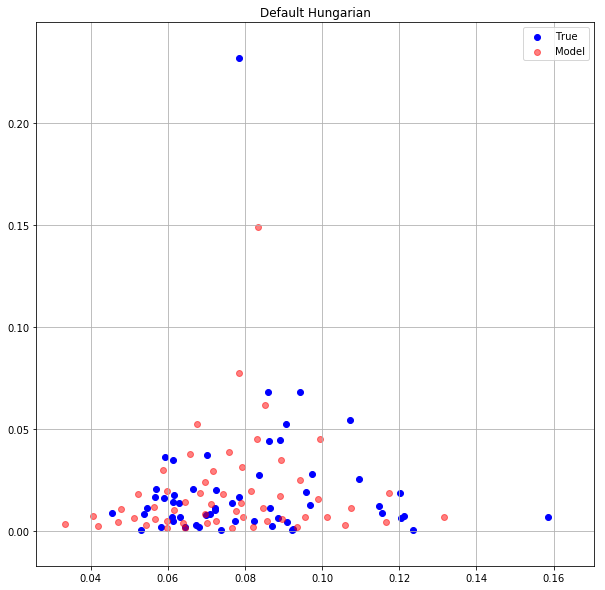

In [13]:
for i in range(15):
    item = dataset_test[i].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Default Hungarian")
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.4365819097 0.4234761298


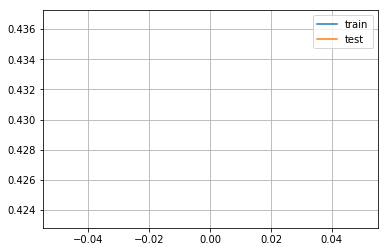

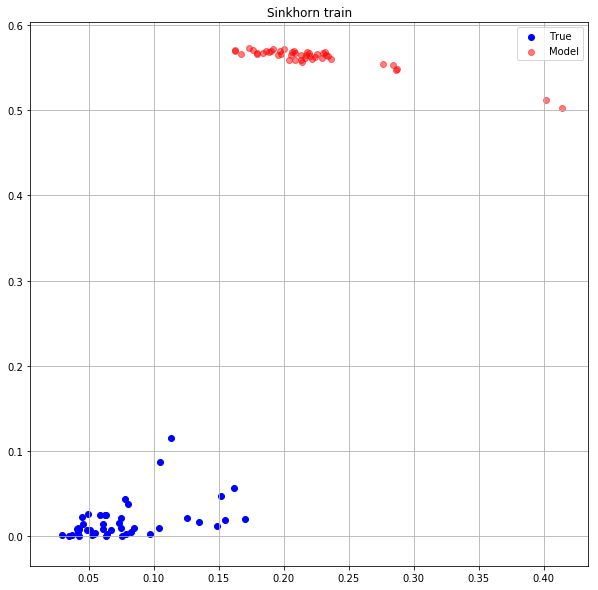

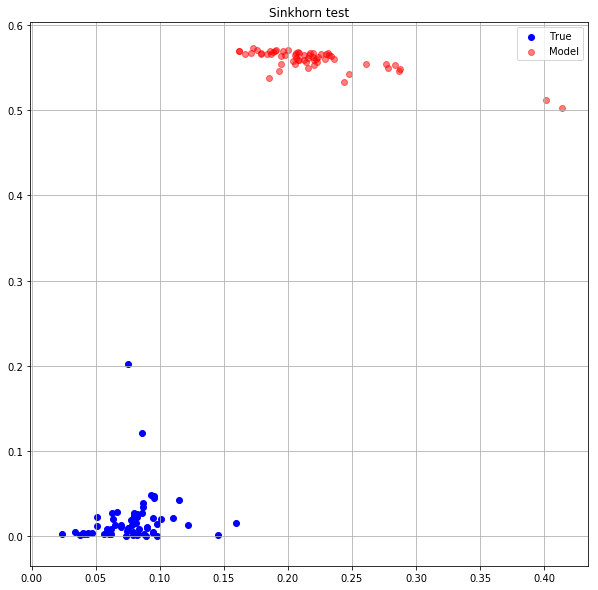

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.4324776530 0.4177191257


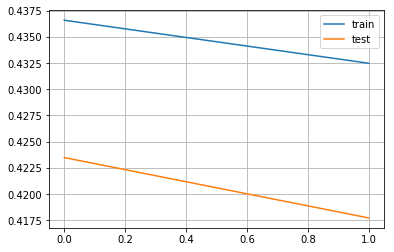

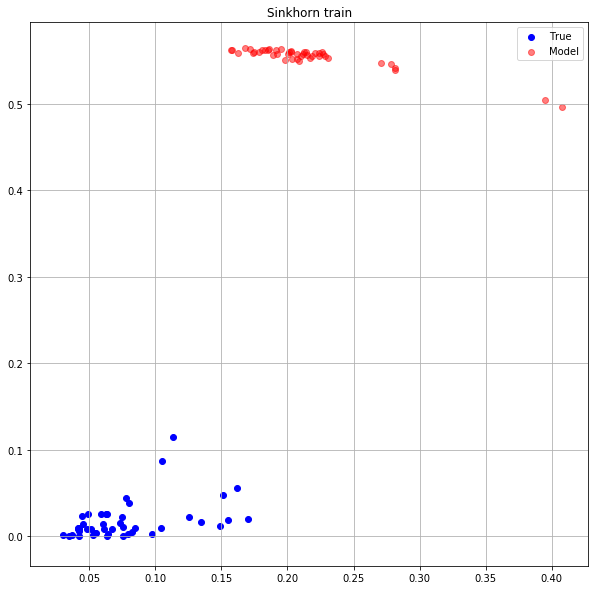

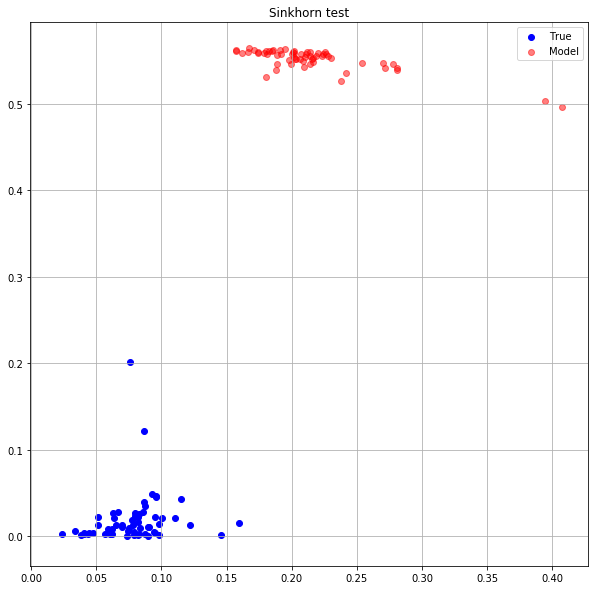

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.4255287051 0.4125953913


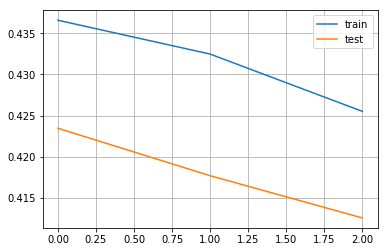

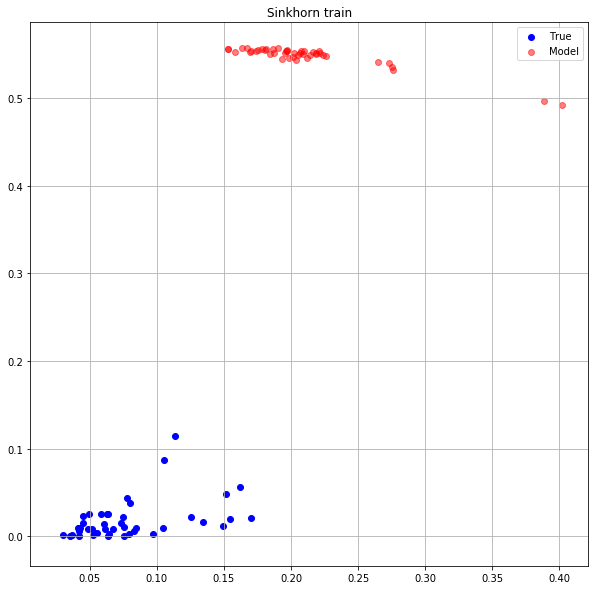

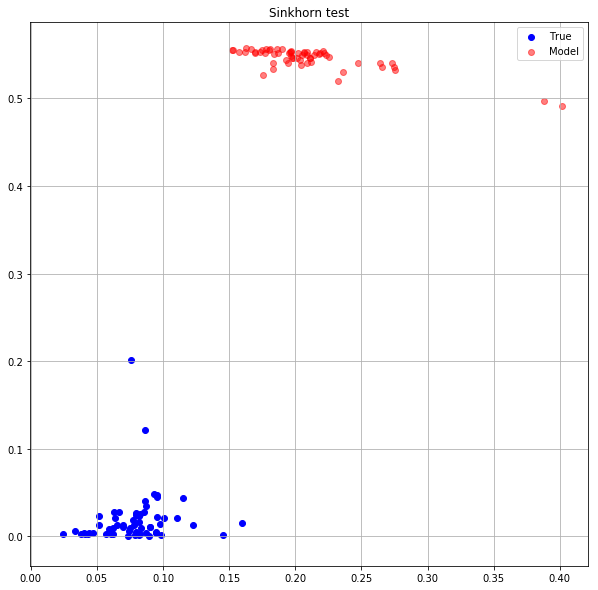

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.4233156145 0.4080651402


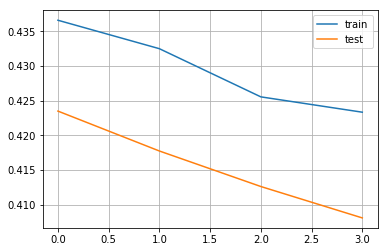

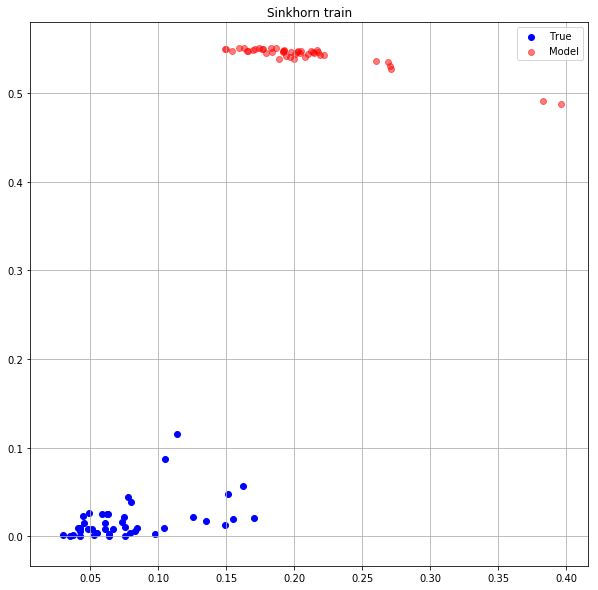

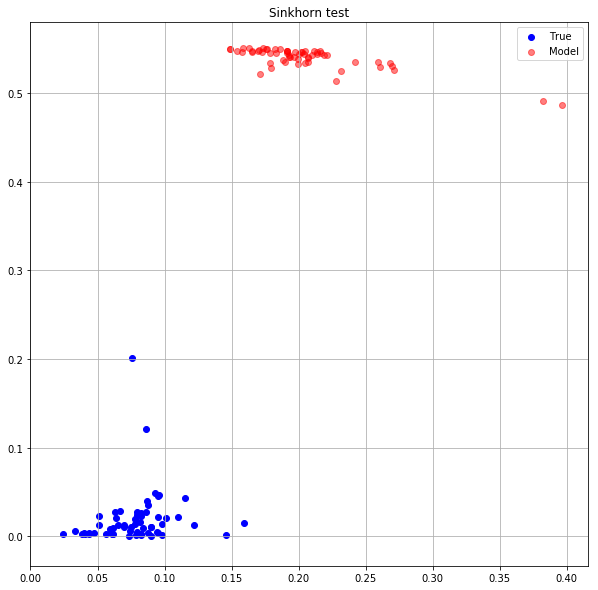

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.4164769650 0.4039484859


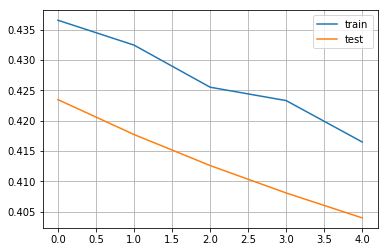

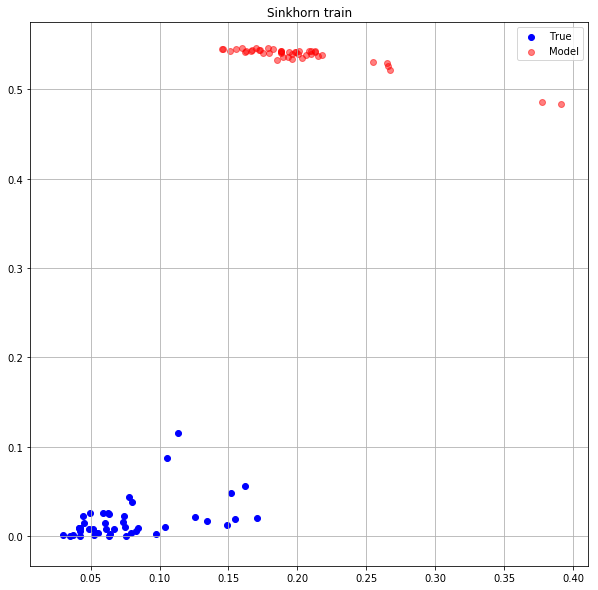

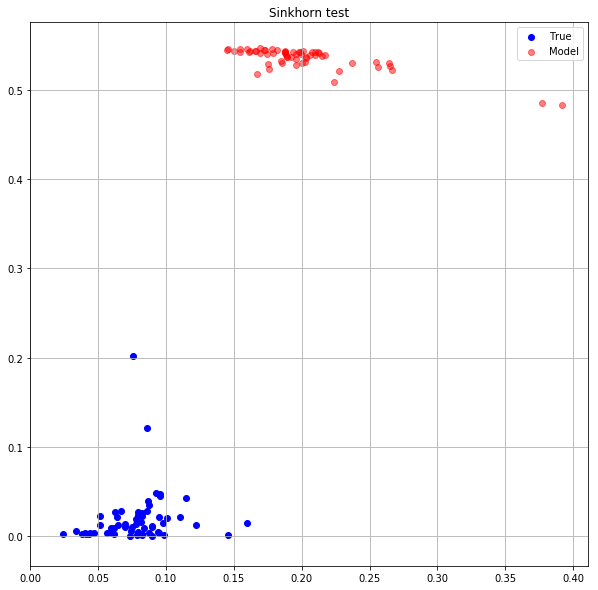

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.4115607142 0.4001685977


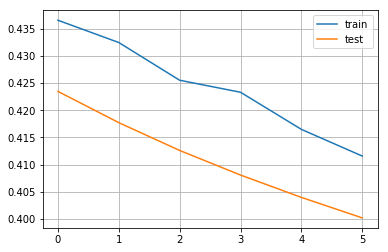

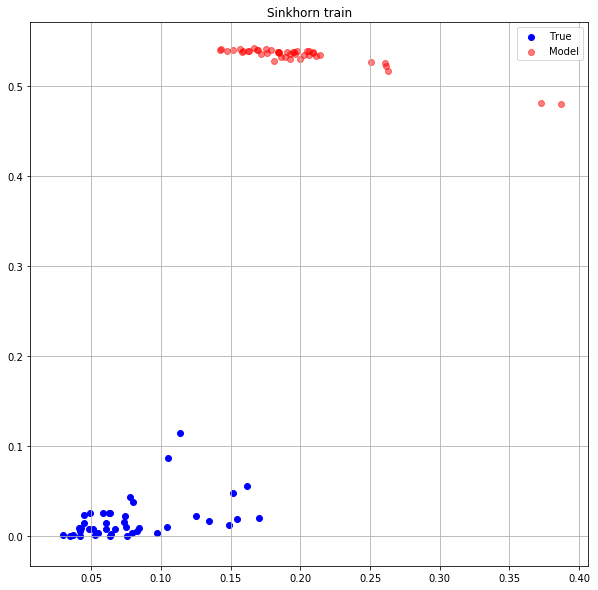

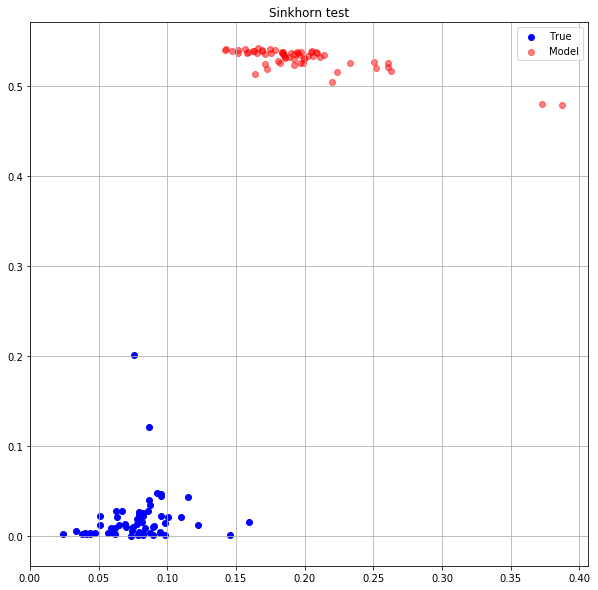

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.4104200006 0.3998140395


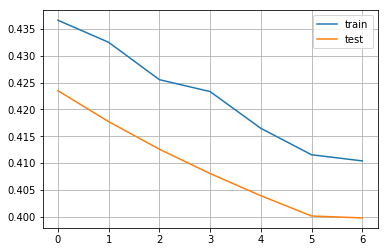

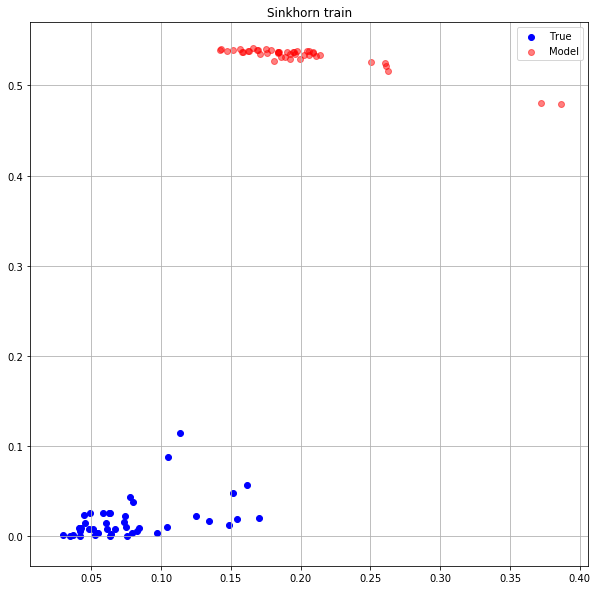

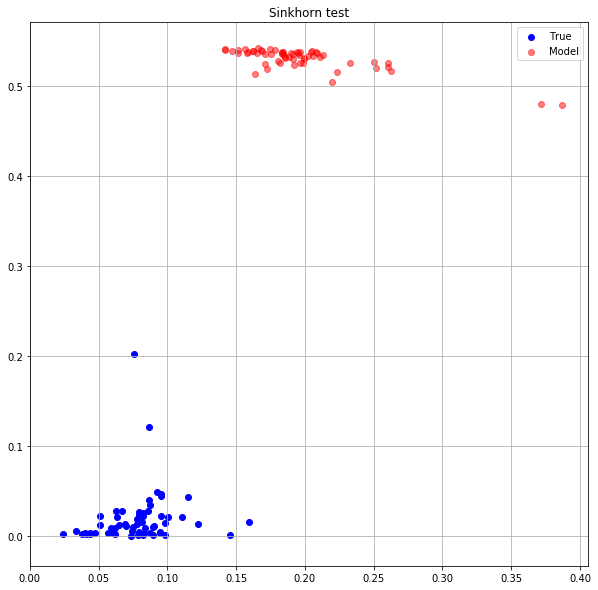

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.4104667306 0.3994787931


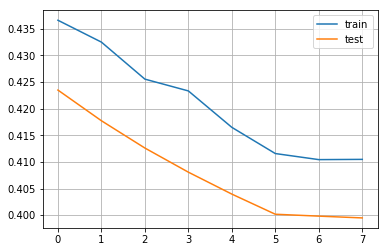

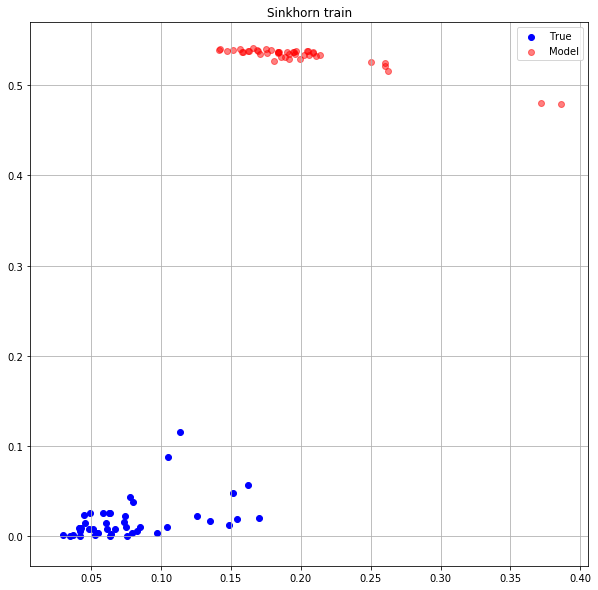

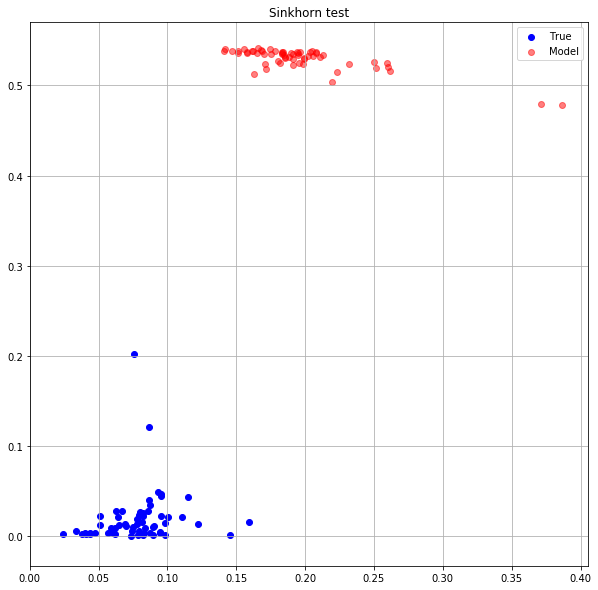

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.4090386629 0.3991590738


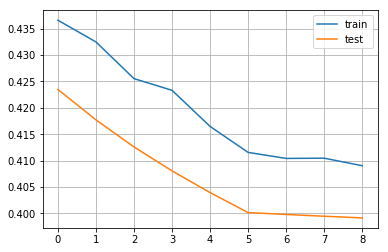

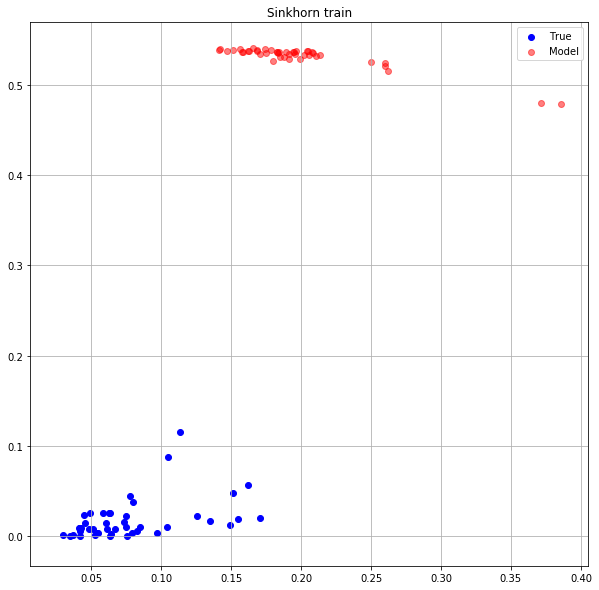

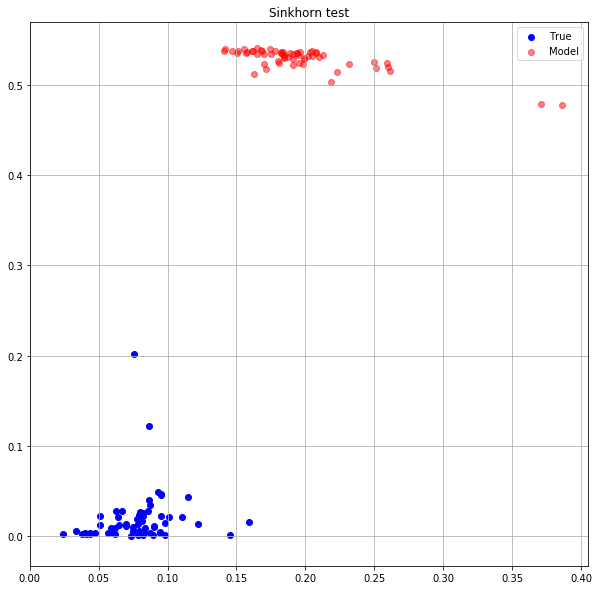

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.4086564779 0.3988551199


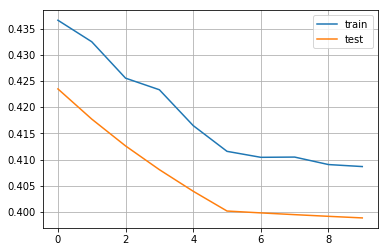

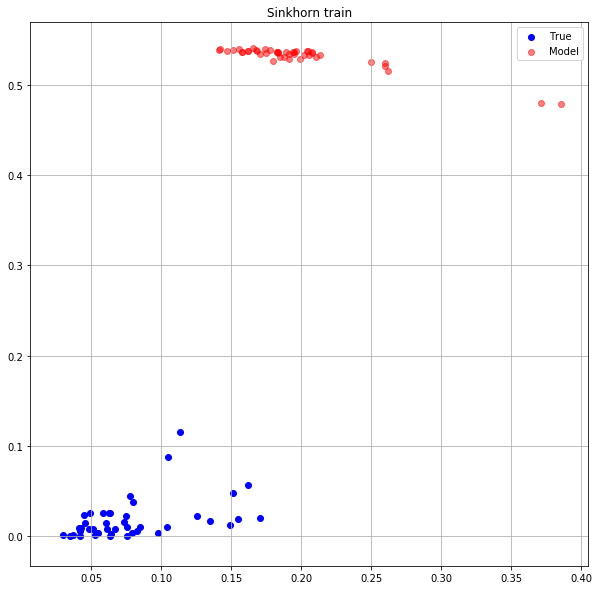

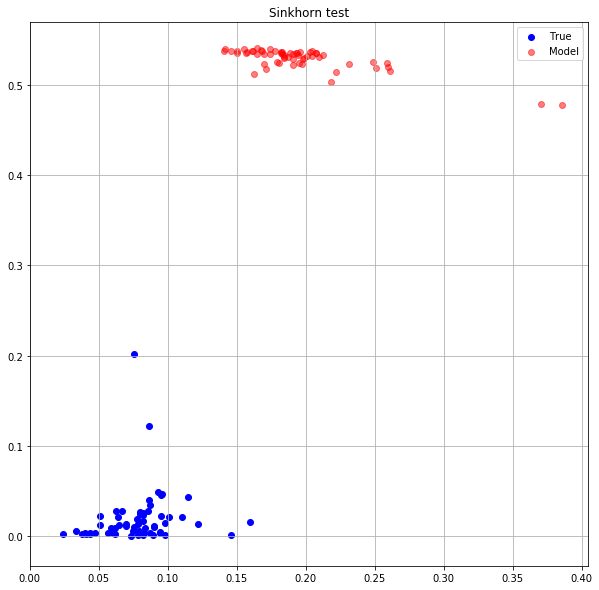

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.4095894694 0.3985610902


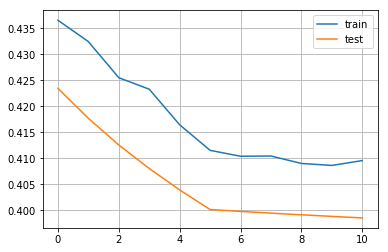

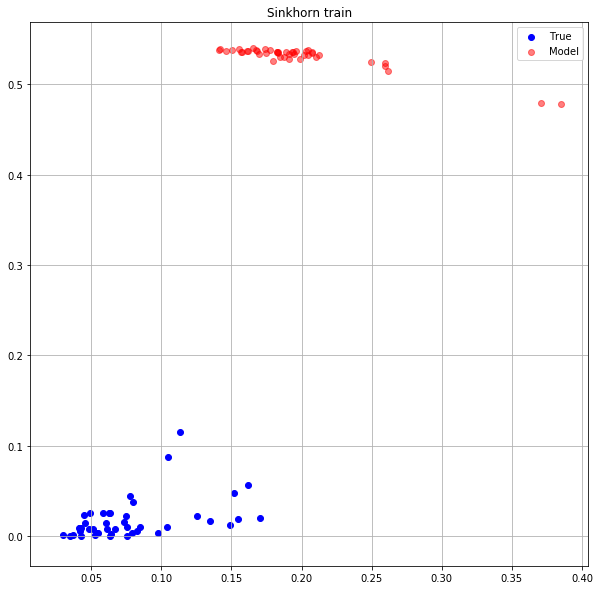

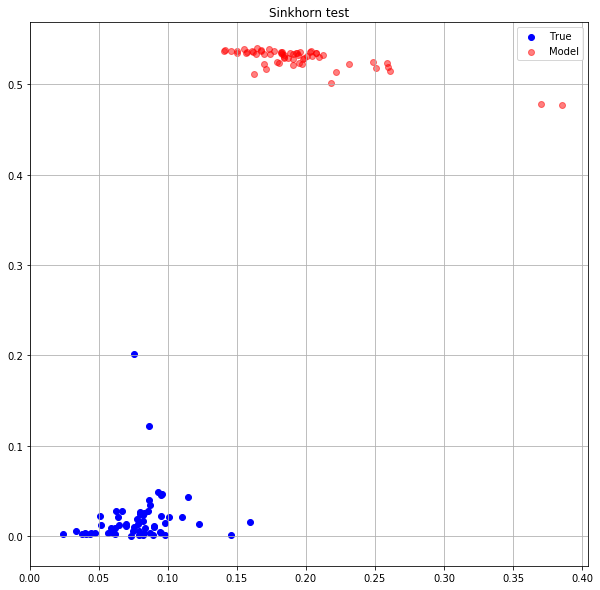

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.4092496037 0.3982777297


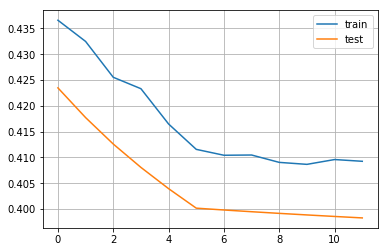

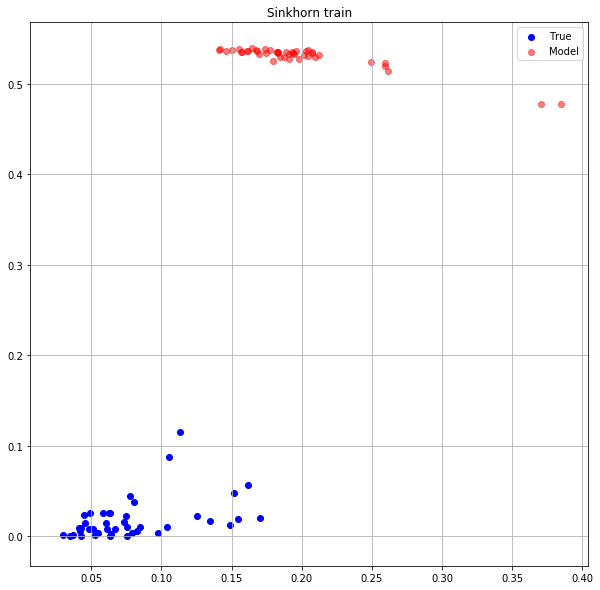

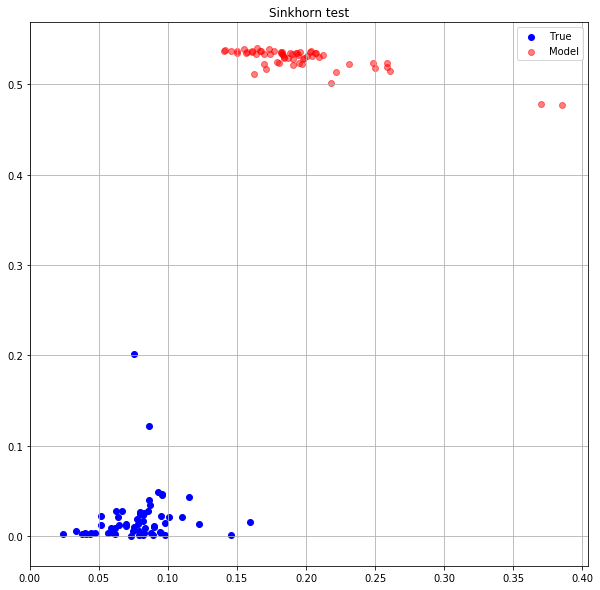

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.4062732458 0.3980020881


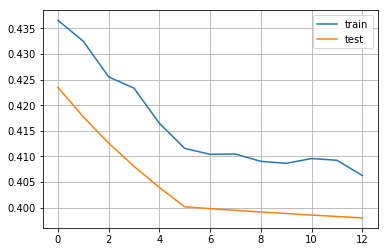

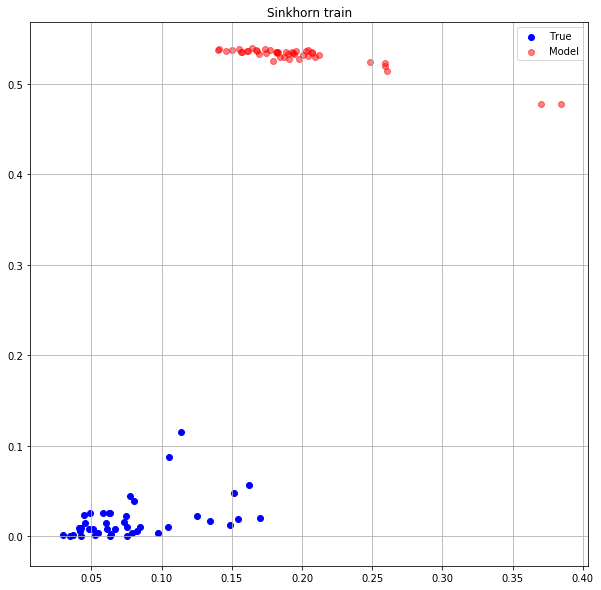

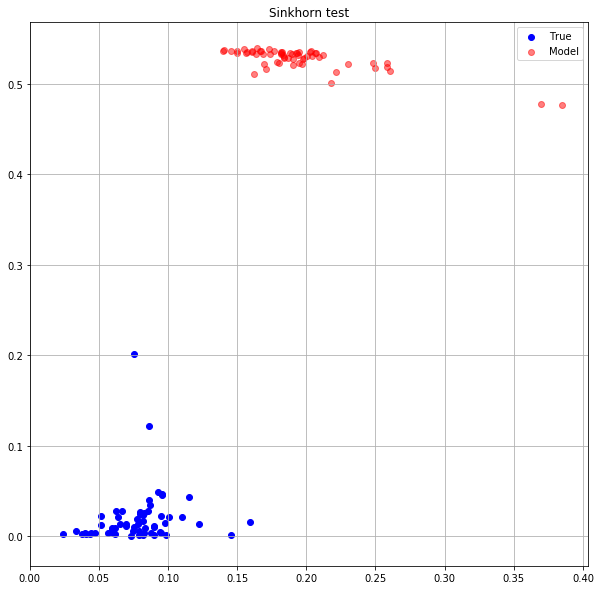

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.4080936313 0.3977356255


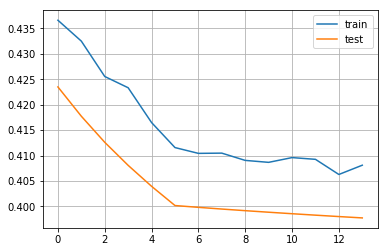

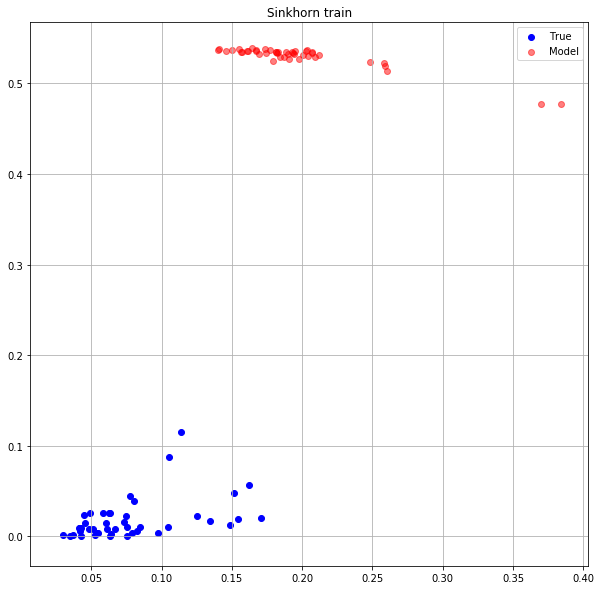

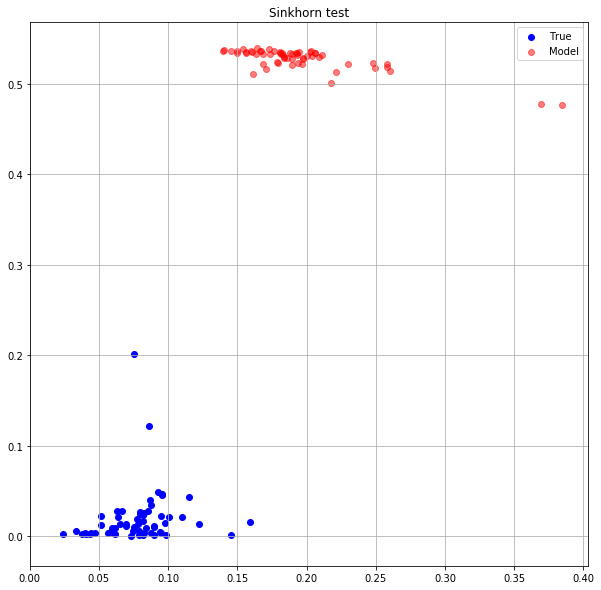

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.4069619775 0.3974741101


KeyboardInterrupt: 

In [31]:
train_loss, val_loss = [], []

for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        #print(src.shape, mask.shape)
        tgt = model(src, mask)
        loss_batch = 0
        for val, pred, cur_mask in zip(src, tgt, mask):
            #print(pred)
            val = val * cur_mask.unsqueeze(1).repeat(1, 2)
            pred = pred * cur_mask.unsqueeze(1).repeat(1, 2)
            a = (val[:, 1]**2 / torch.sum(val[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
            b = (pred[:, 1]**2 / torch.sum(pred[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
            #print(a, b)
            M = torch.cdist(val, pred, 2)
            loss_batch += ot.sinkhorn2(a, b, M, reg=10)
        
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
    train_loss.append(loss_train)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            for val, pred, cur_mask in zip(src, tgt, mask):
                #print(pred)
                val = val * cur_mask.unsqueeze(1).repeat(1, 2)
                pred = pred * cur_mask.unsqueeze(1).repeat(1, 2)
                a = (val[:, 1]**2 / torch.sum(val[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
                b = (pred[:, 1]**2 / torch.sum(pred[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
                M = torch.cdist(val, pred, 2)
                loss += ot.sinkhorn2(a, b, M, reg=10)
            
            
    loss_test = loss / len(dataloader_test.dataset)
    val_loss.append(loss_test)
    scheduler.step(loss_test)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    
    cur_n = len(train_loss)
    plt.plot(np.arange(cur_n), train_loss, label = 'train')
    plt.plot(np.arange(cur_n), val_loss, label = 'test')
    plt.grid()
    plt.legend()
    plt.show()
    
    
    item = dataset_train[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Sinkhorn train")
    plt.show()
    
    
    
    item = dataset_test[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Sinkhorn test")
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.6101438403 0.5891193151


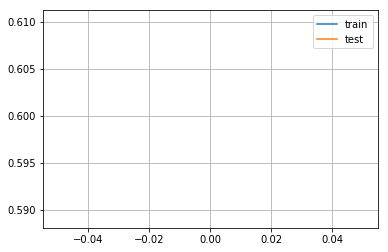

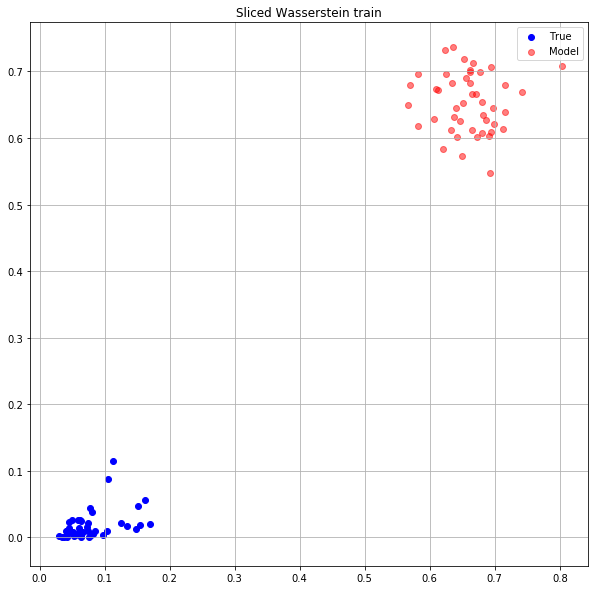

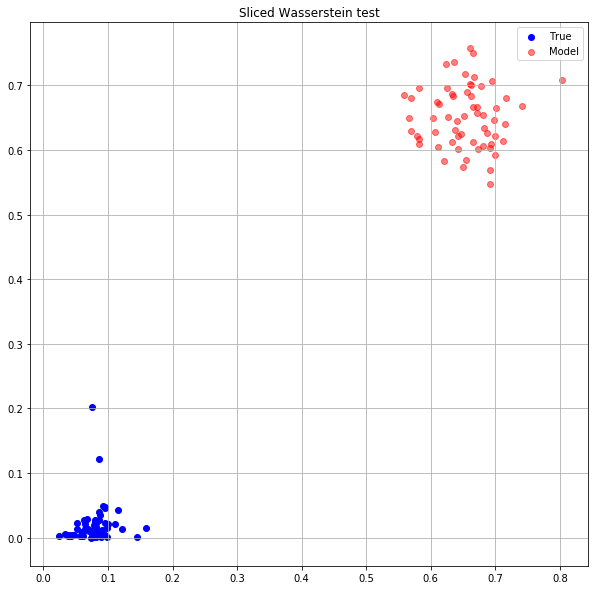

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.5565432906 0.5083090067


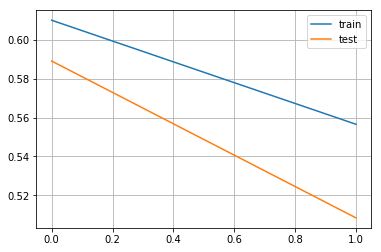

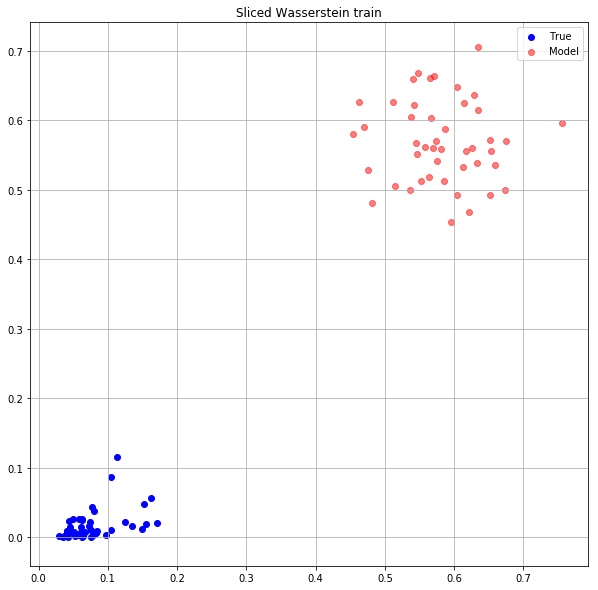

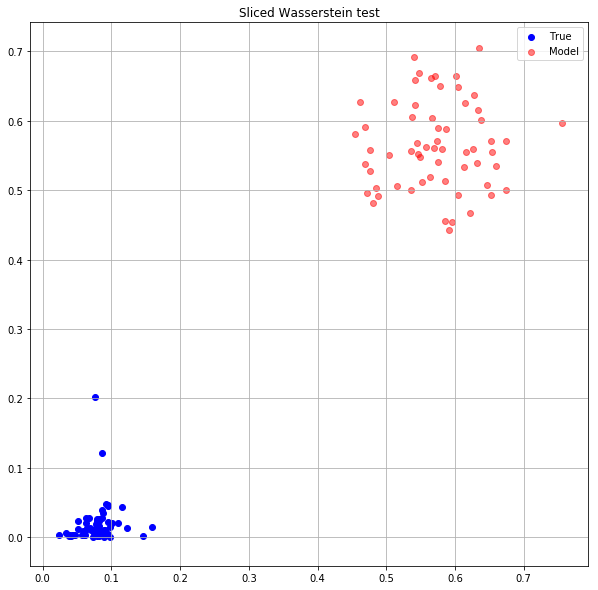

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.4405016303 0.3405979872


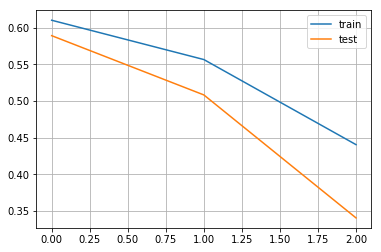

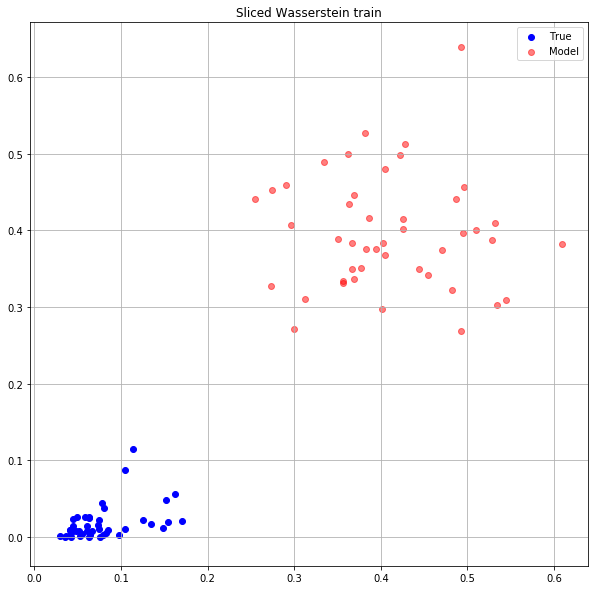

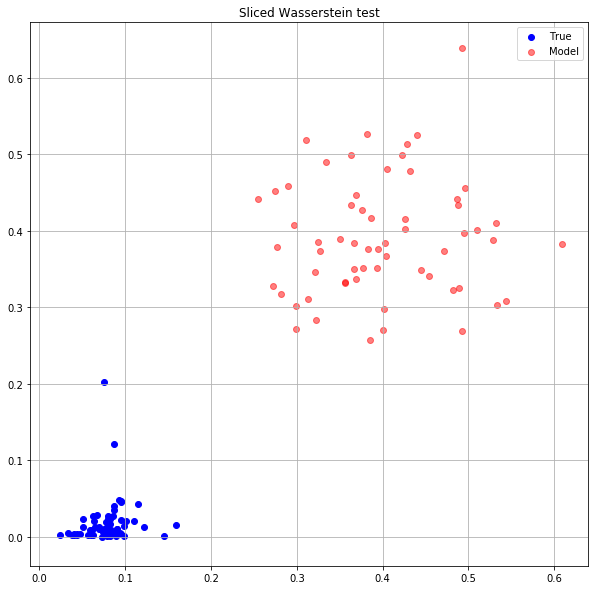

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.2373792231 0.1134653464


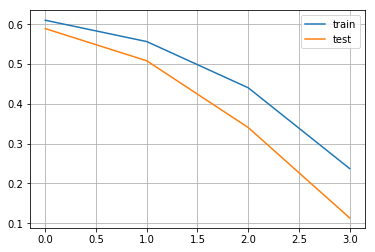

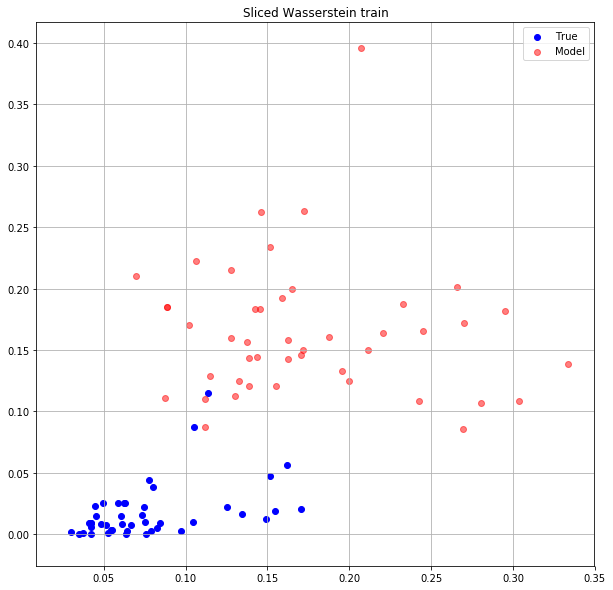

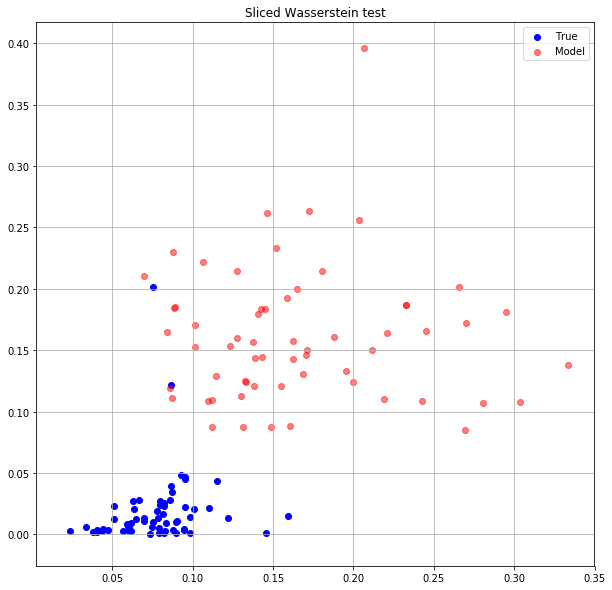

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.0638392568 0.0489367358


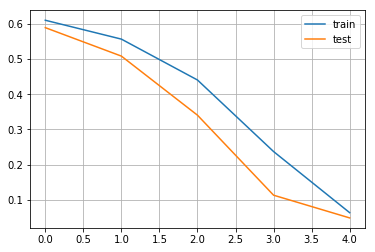

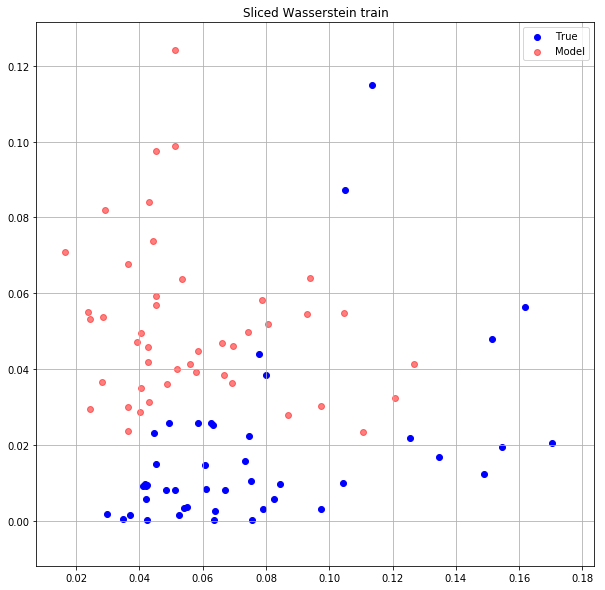

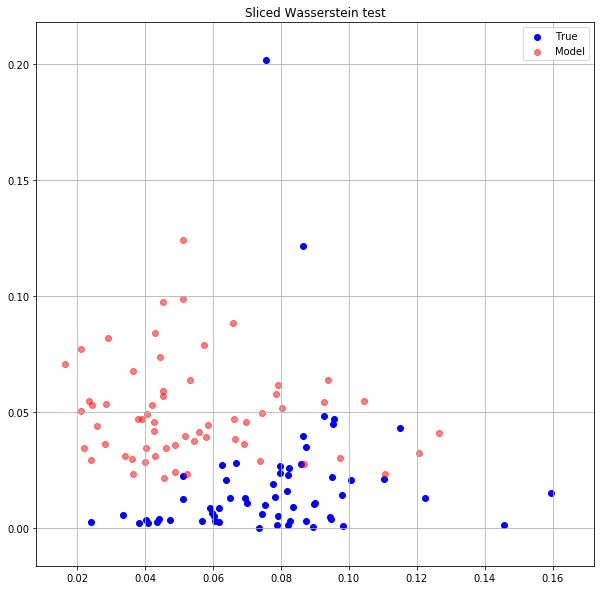

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.0523871854 0.0414943844


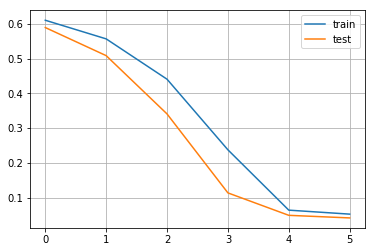

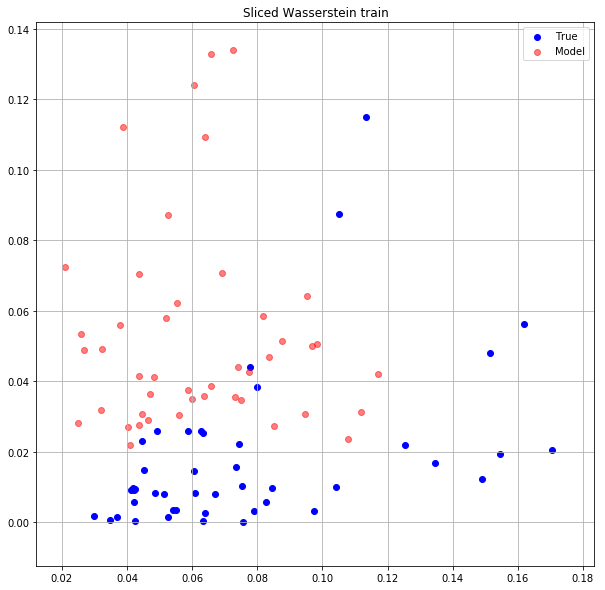

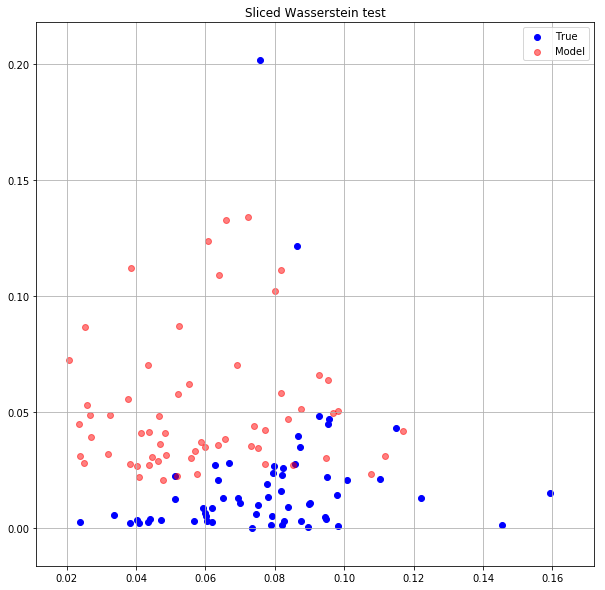

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0419538580 0.0389929451


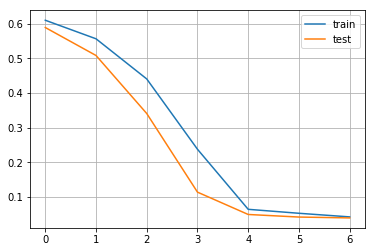

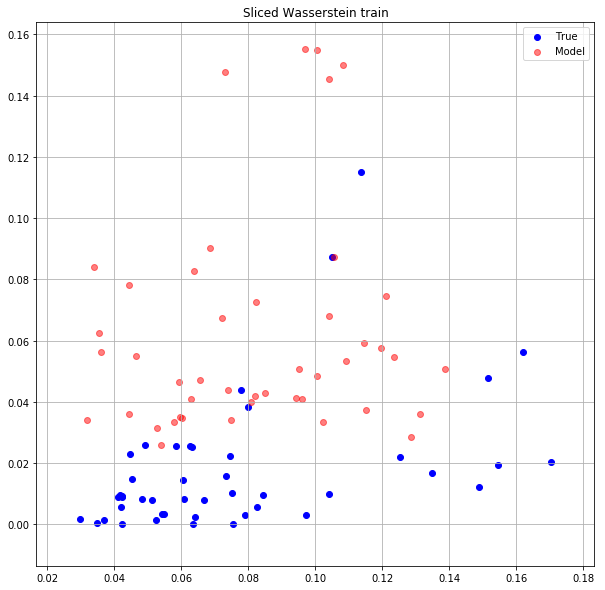

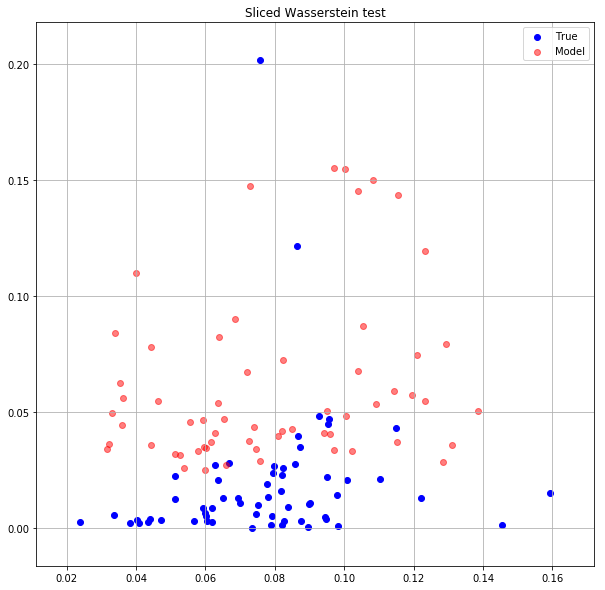

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0401584730 0.0371987708


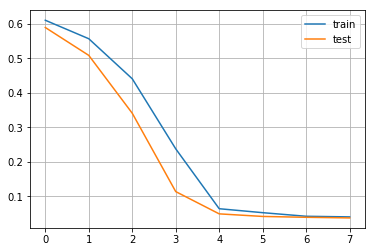

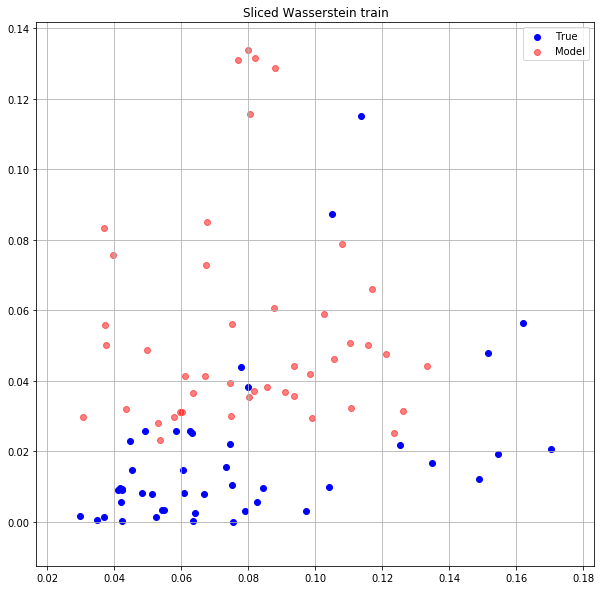

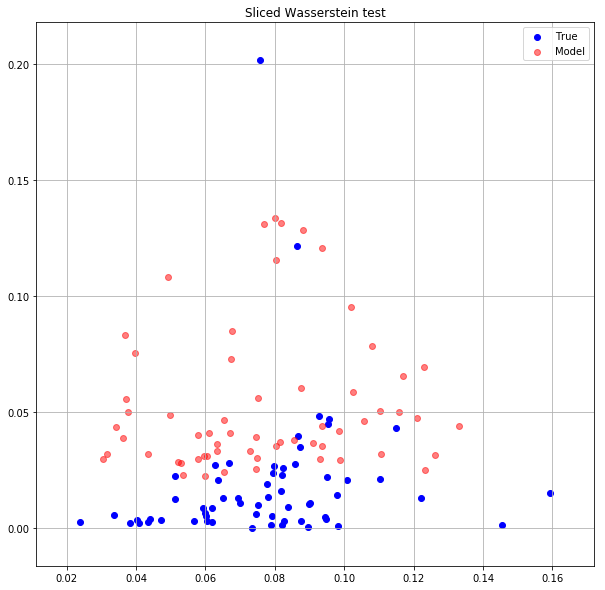

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0393241756 0.0368871950


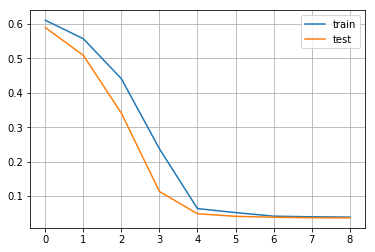

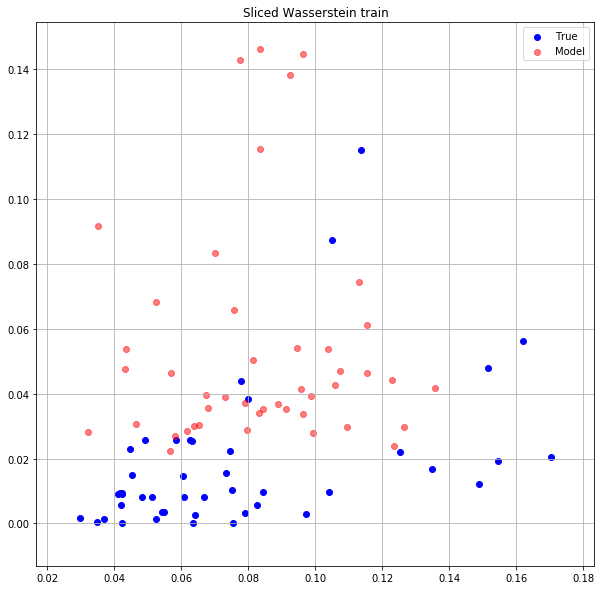

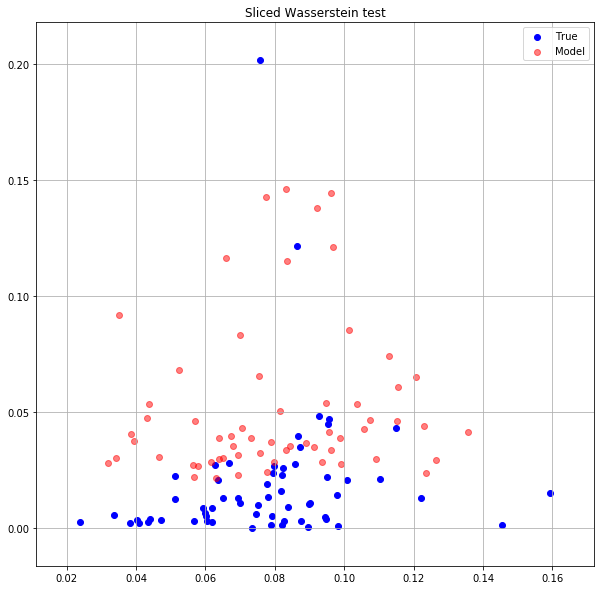

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0392013937 0.0365512967


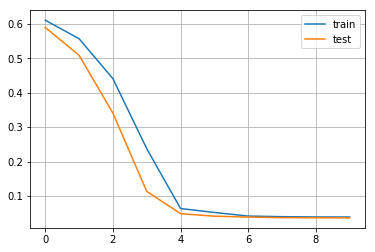

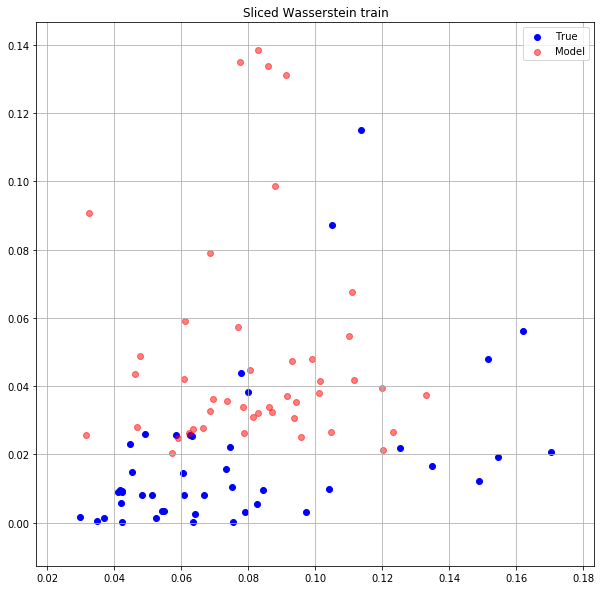

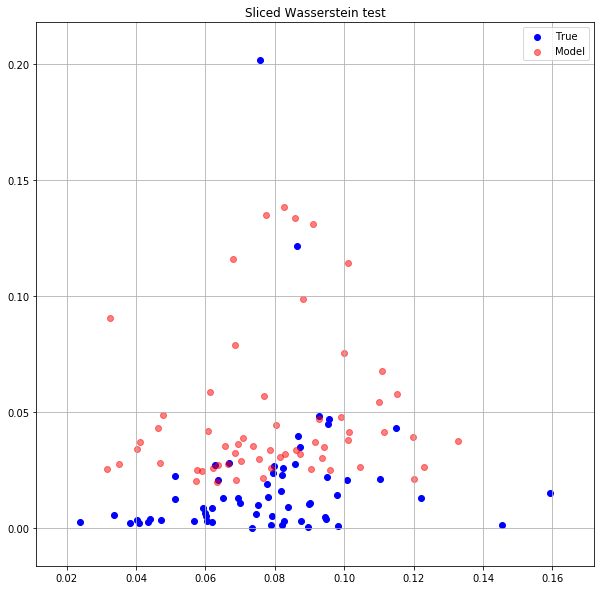

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0388856828 0.0365650803


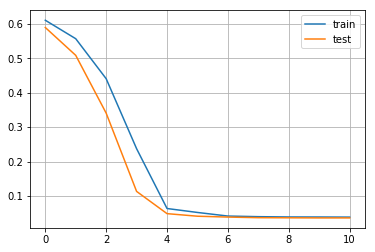

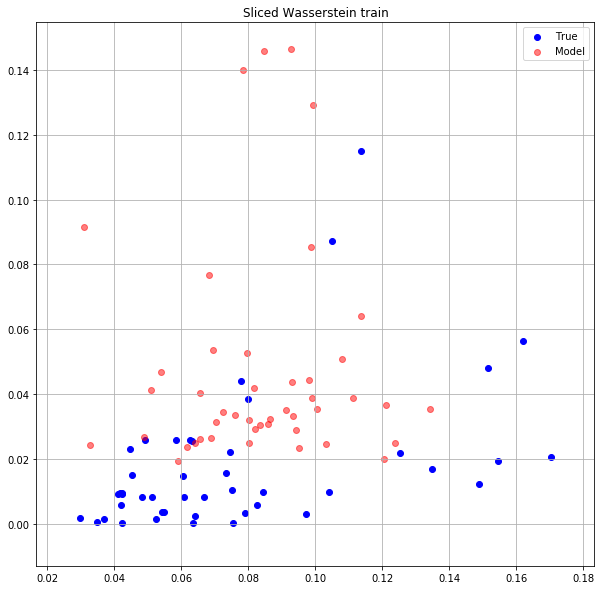

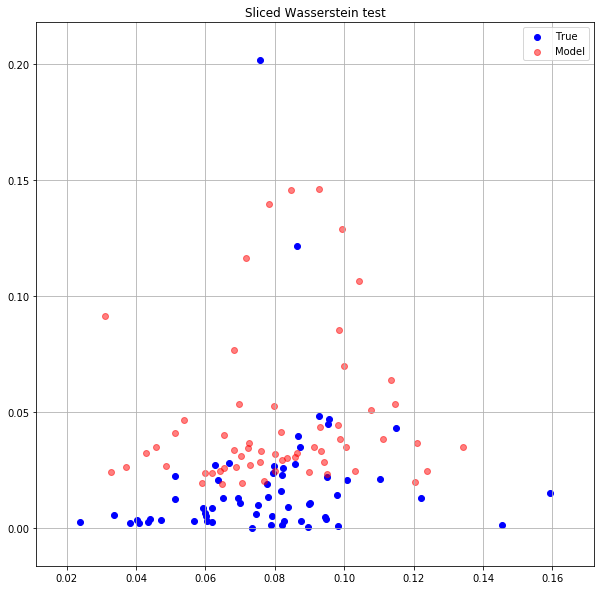

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0388637558 0.0364011079


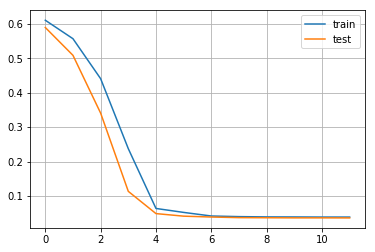

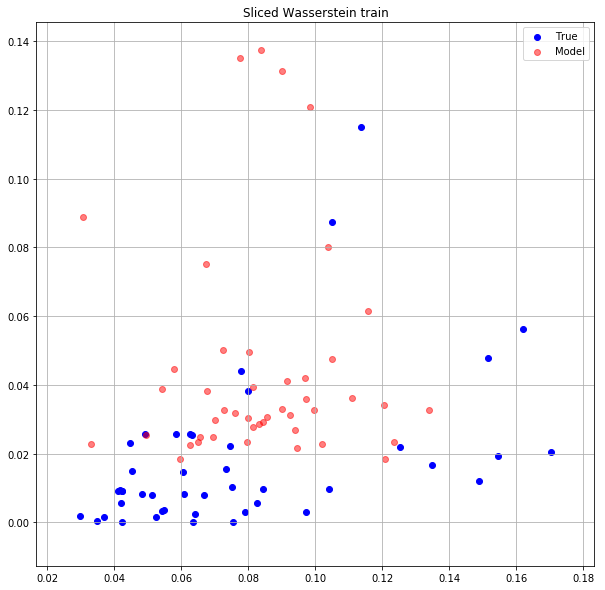

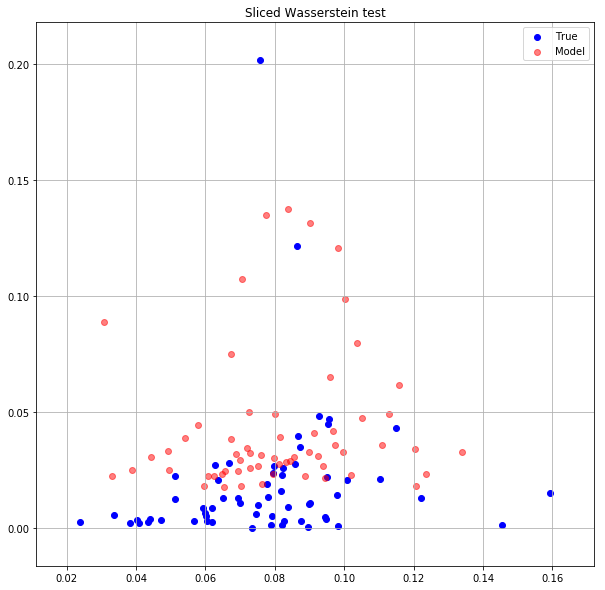

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.0388000123 0.0364739858


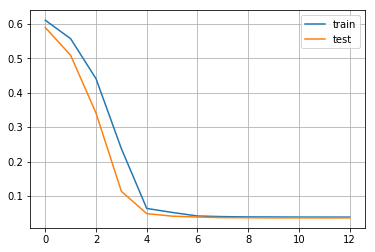

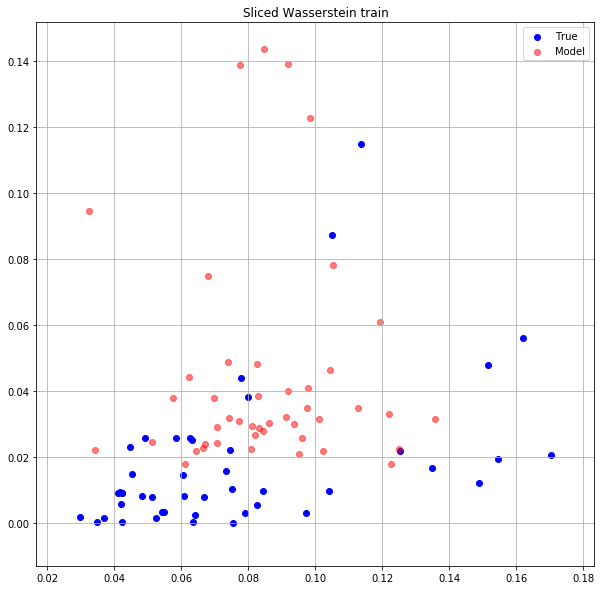

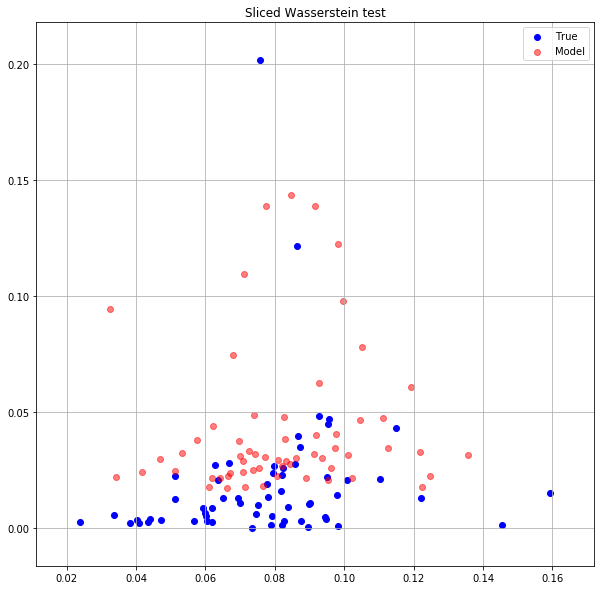

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.0387580357 0.0364003032


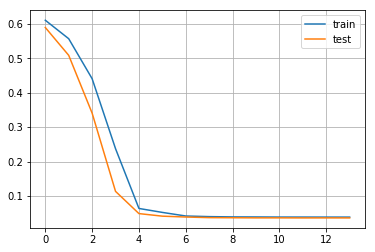

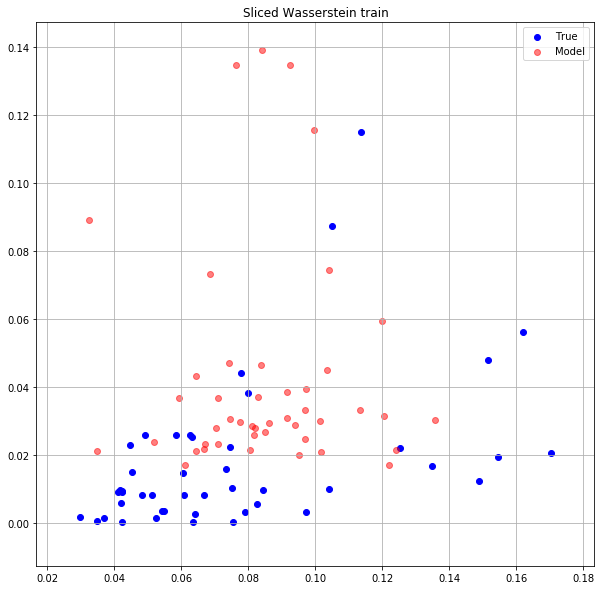

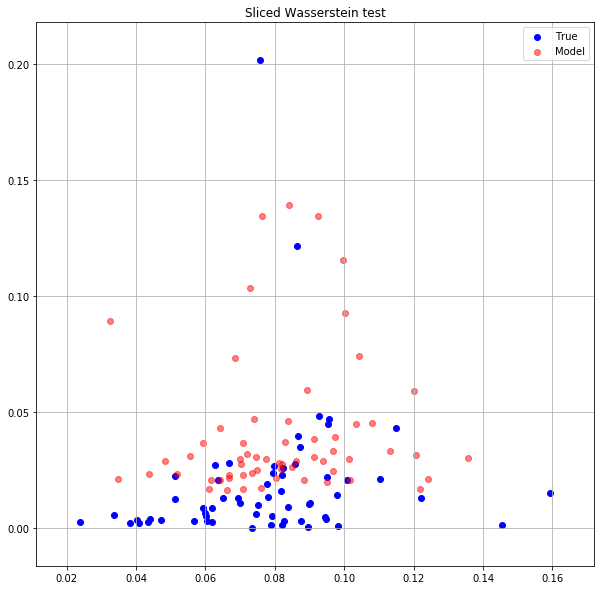

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.0387722887 0.0364309698


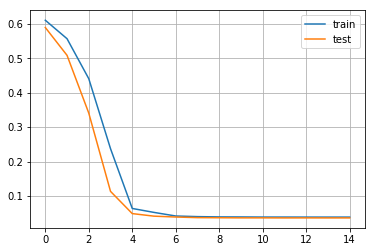

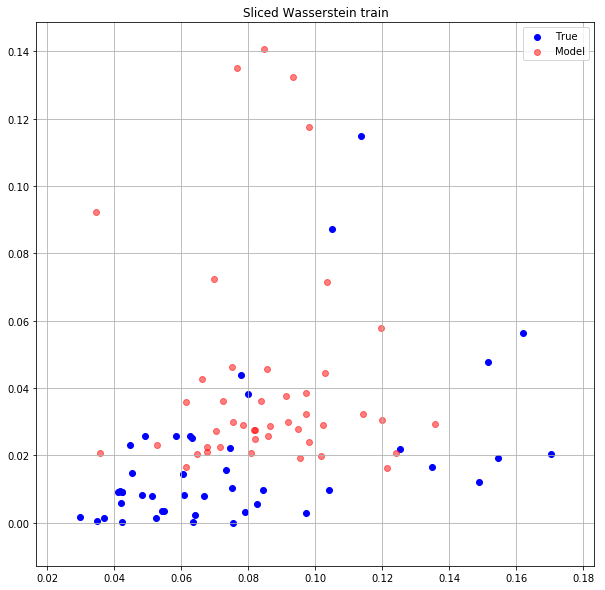

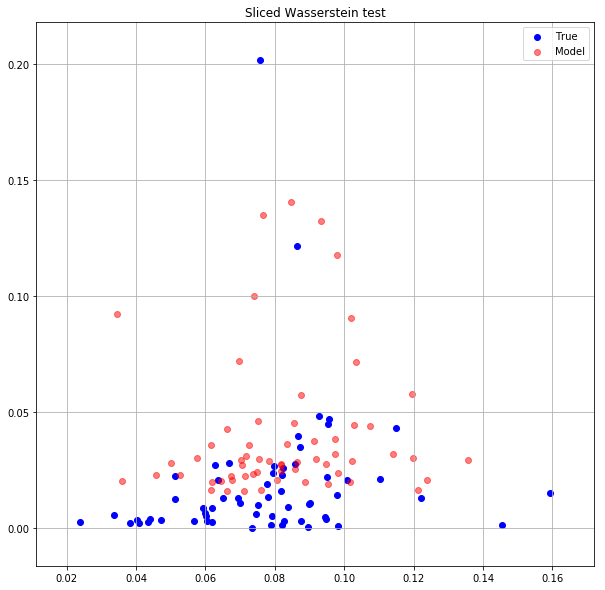

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.0387300029 0.0364997089


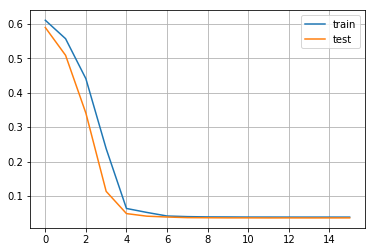

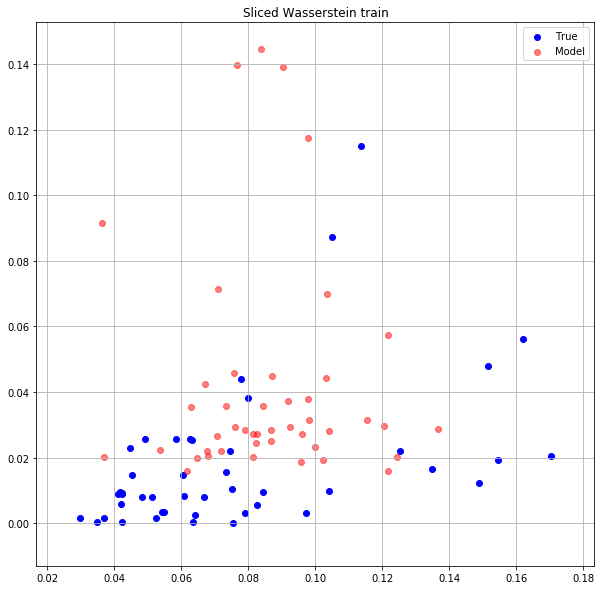

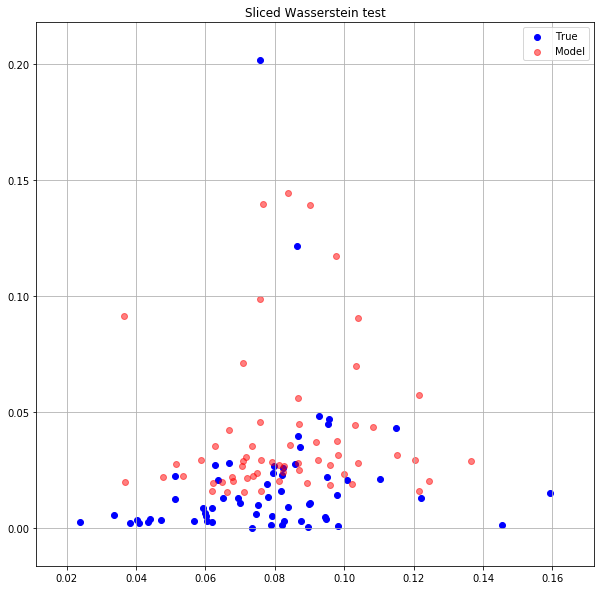

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.0387929790 0.0365075916


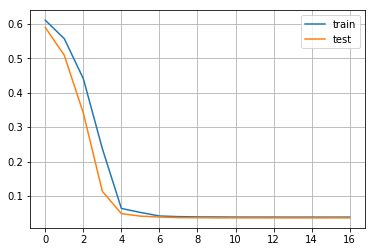

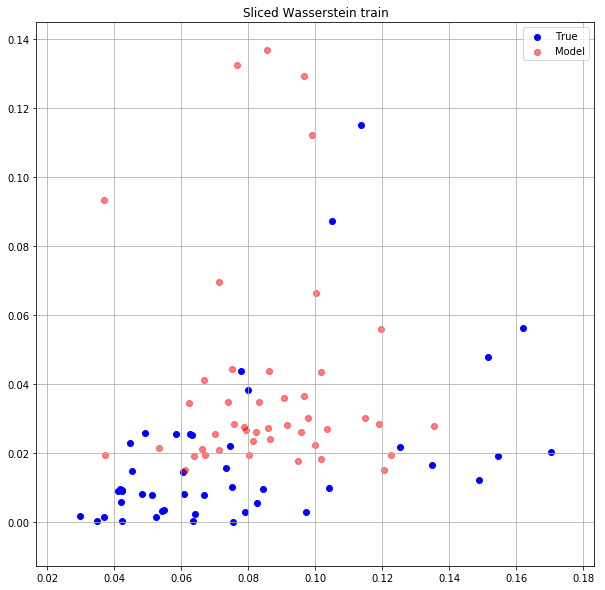

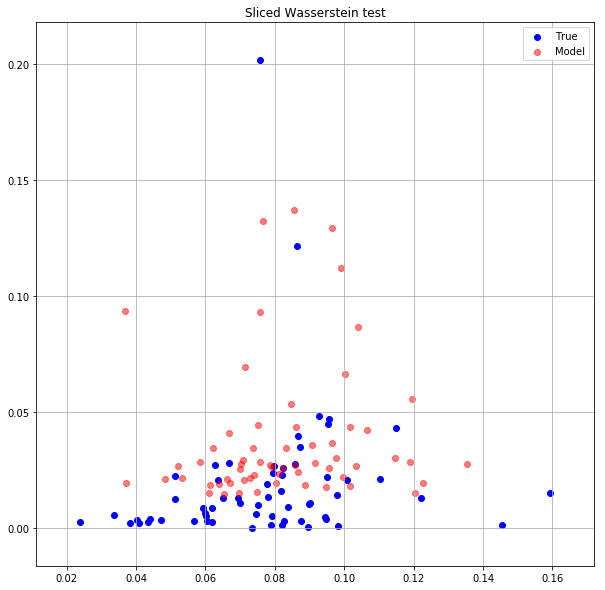

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.0389936380 0.0366497524


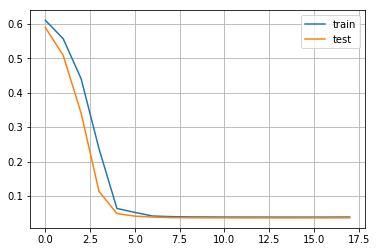

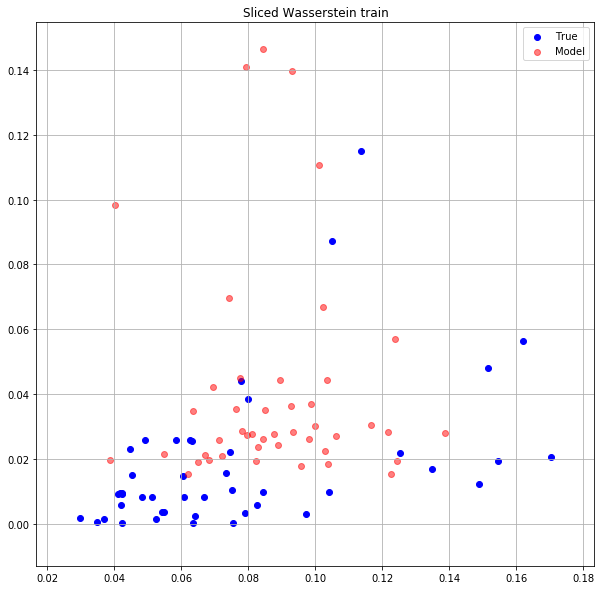

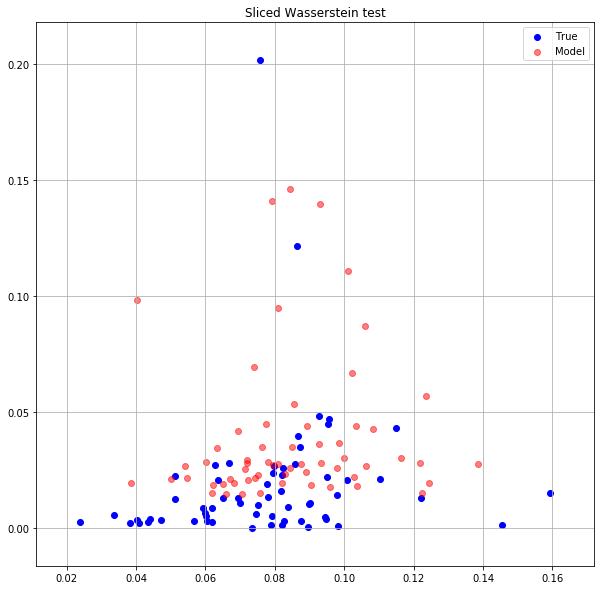

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 0.0388768688 0.0366137736


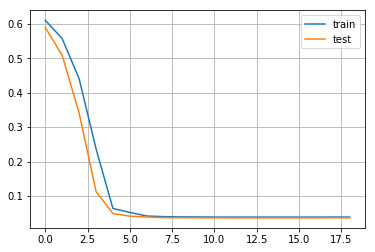

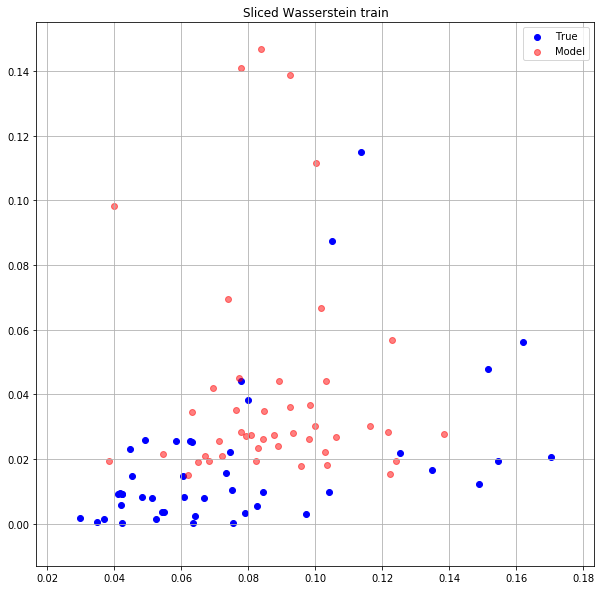

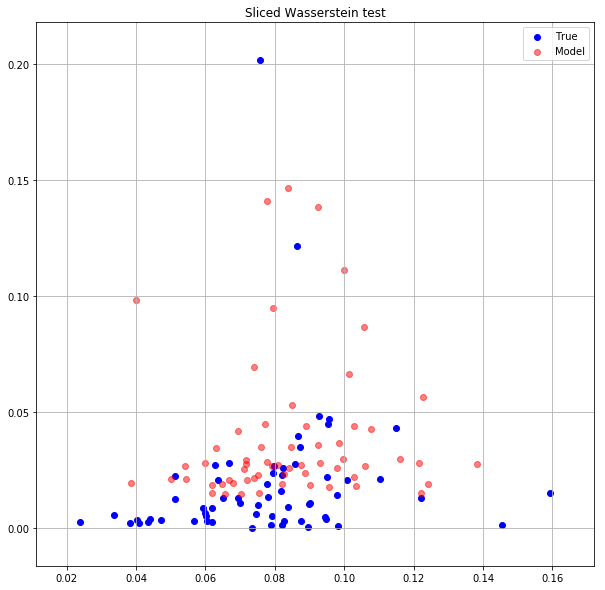

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 0.0387679040 0.0364922695


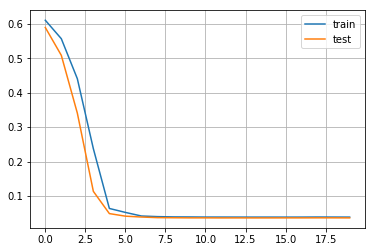

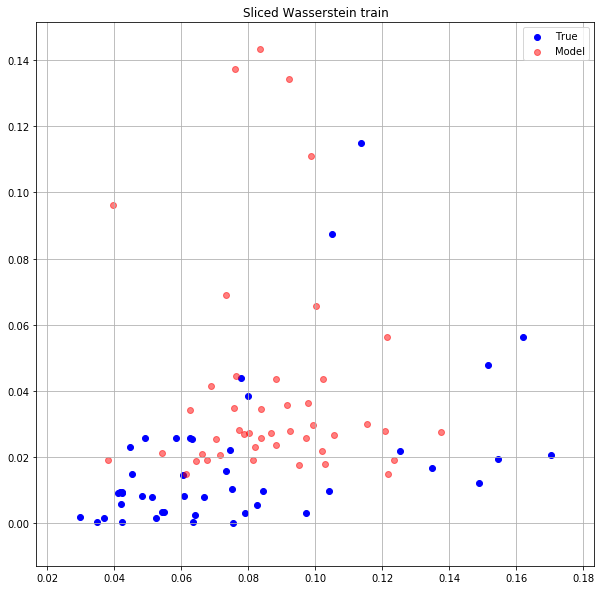

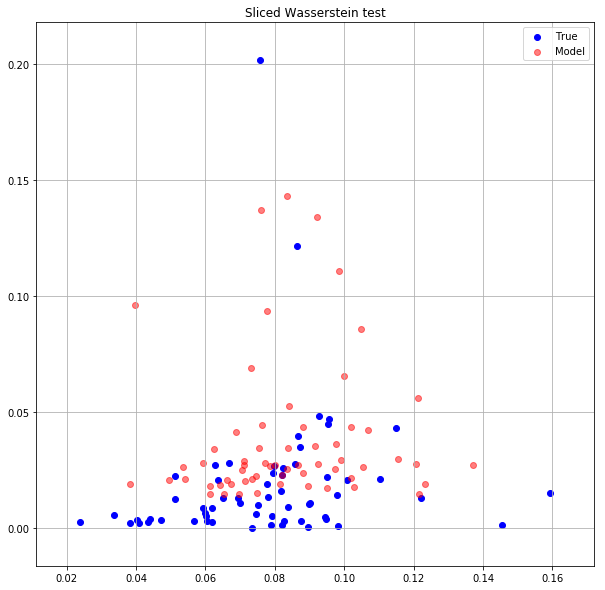

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  20 0.0387262665 0.0364600942


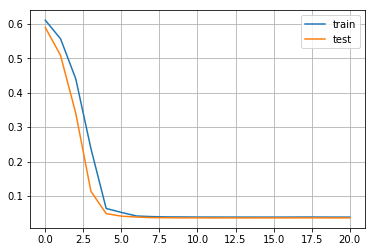

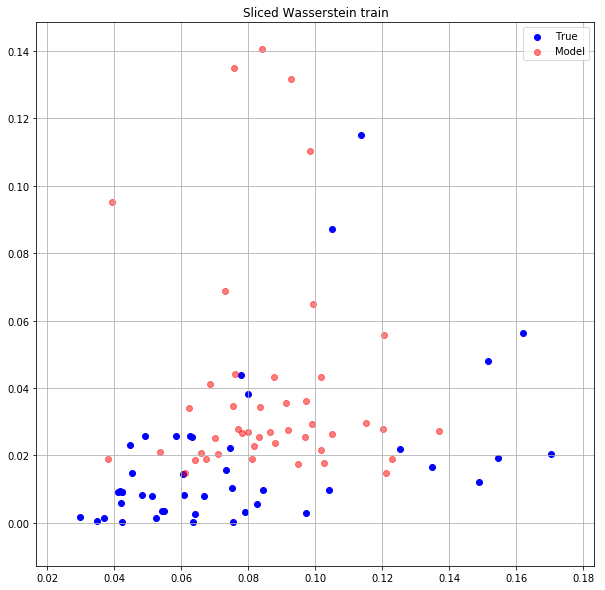

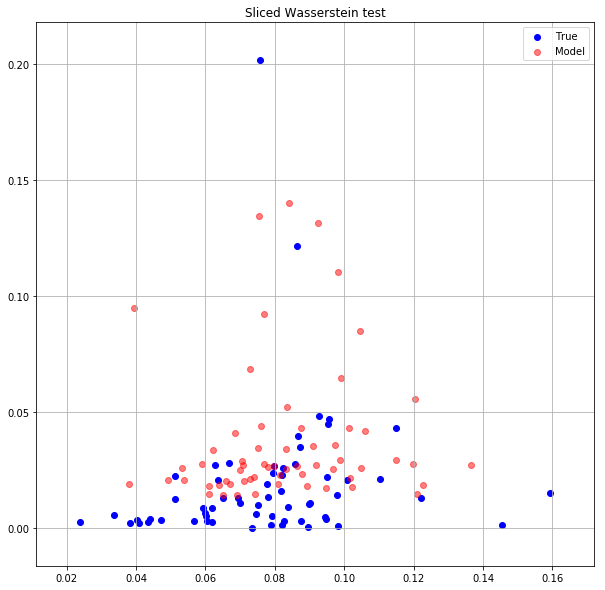

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  21 0.0386981815 0.0364648253


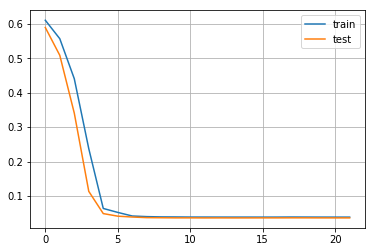

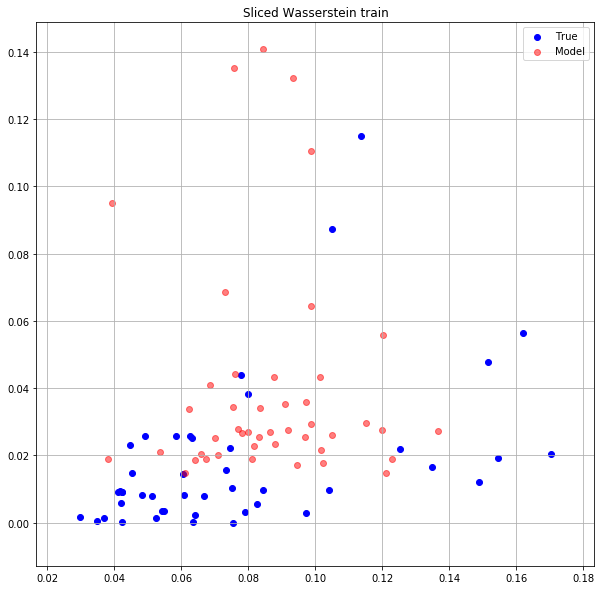

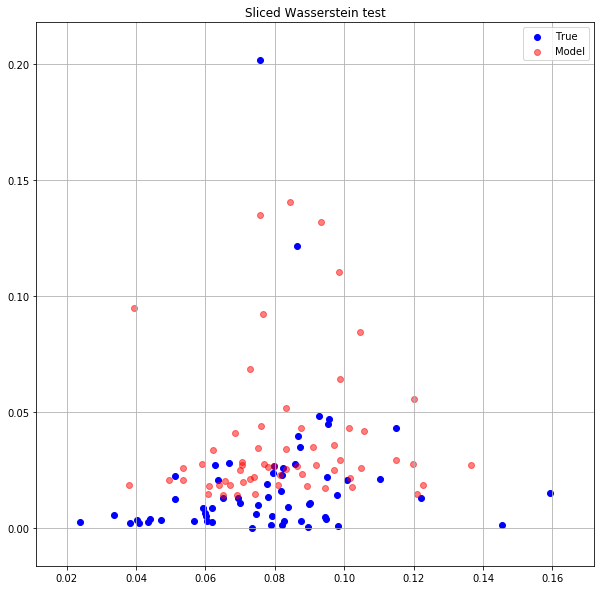

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  22 0.0387041271 0.0364761576


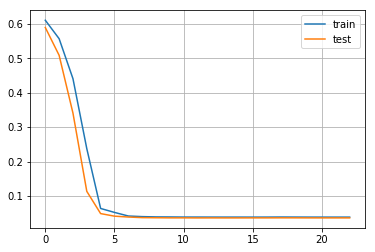

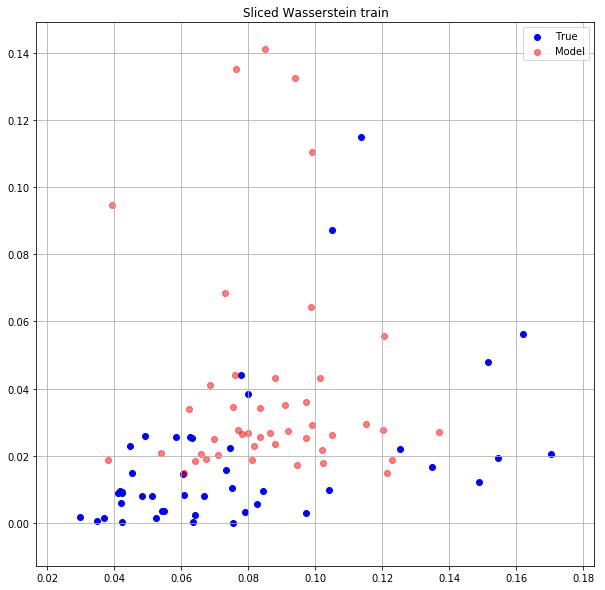

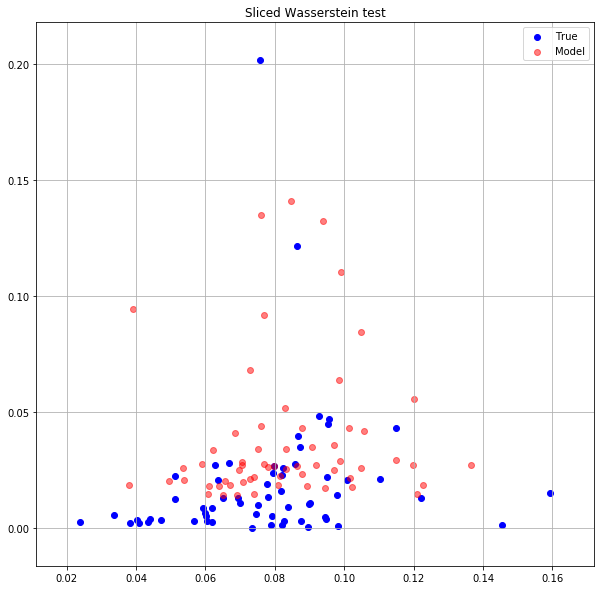

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  23 0.0387142152 0.0364594422


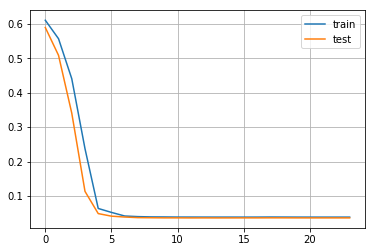

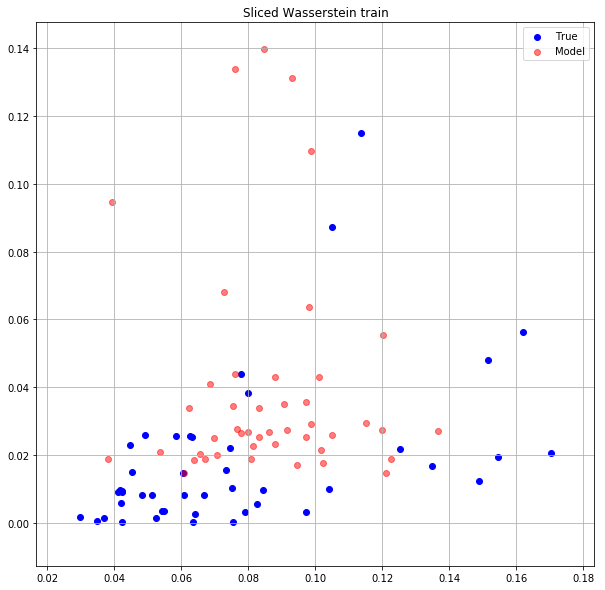

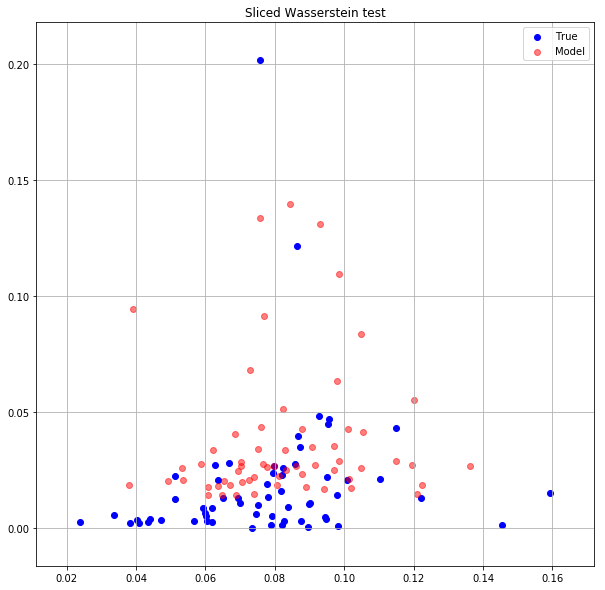

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  24 0.0386947021 0.0364612751


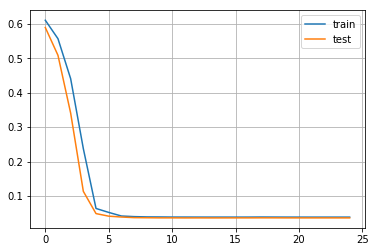

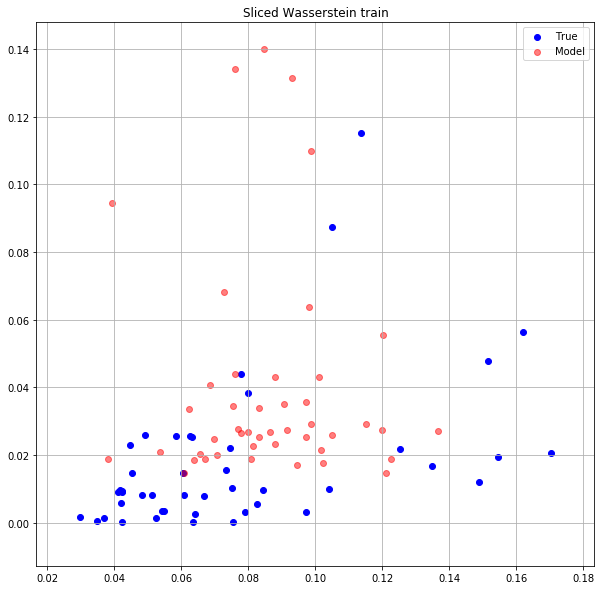

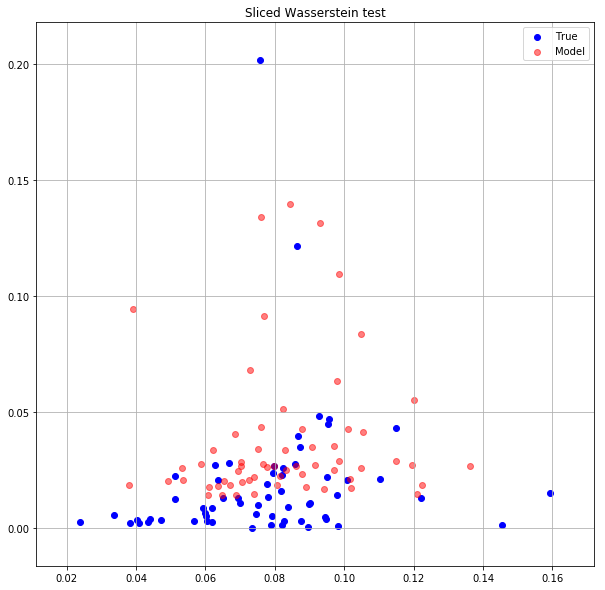

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  25 0.0386935249 0.0364613310


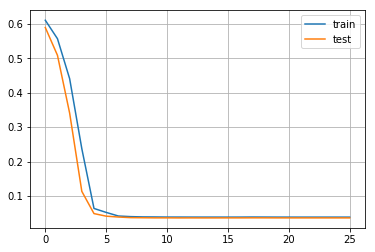

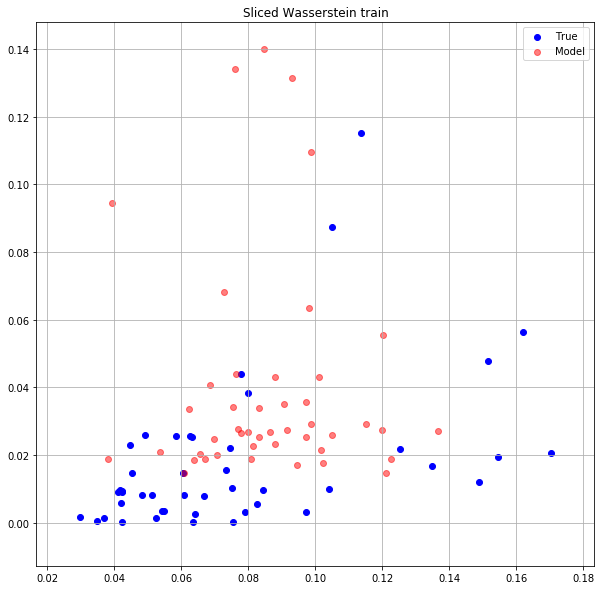

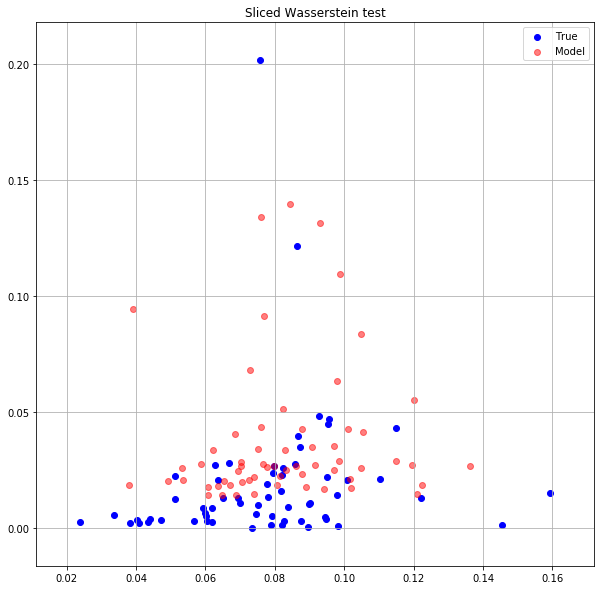

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  26 0.0386938043 0.0364616401


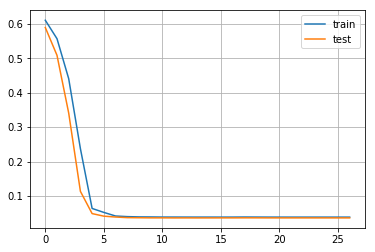

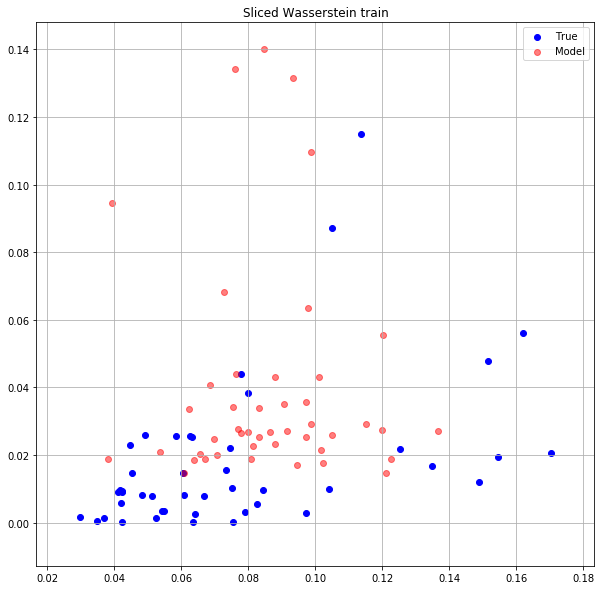

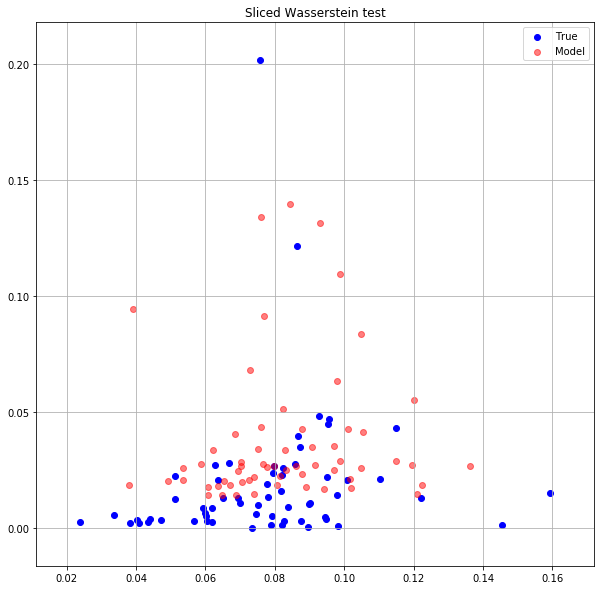

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  27 0.0386934914 0.0364623442


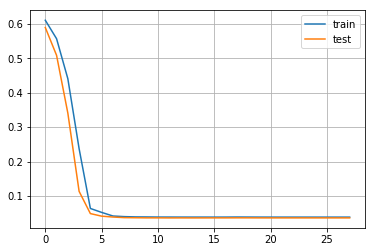

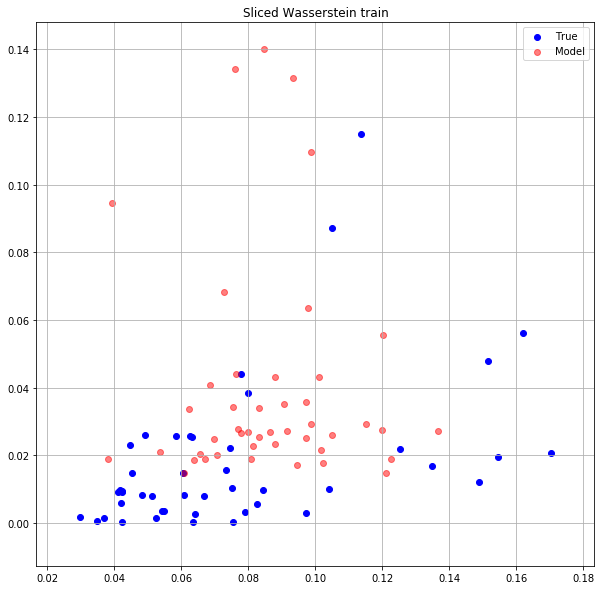

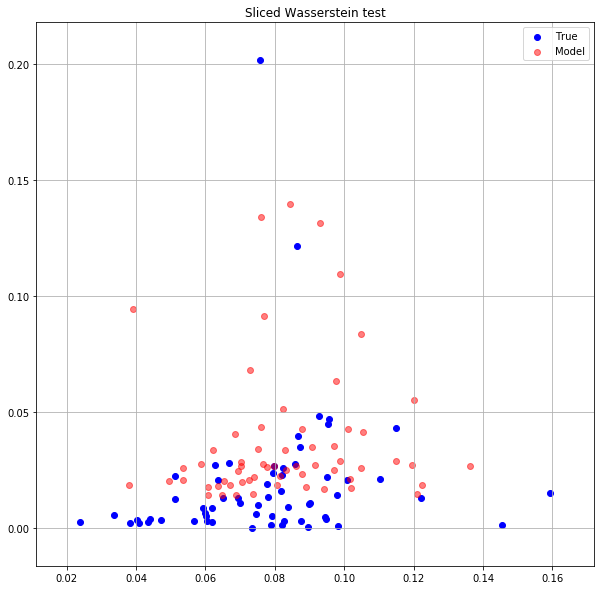

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  28 0.0386944301 0.0364632867


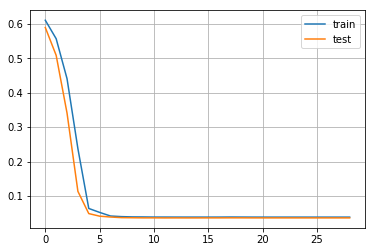

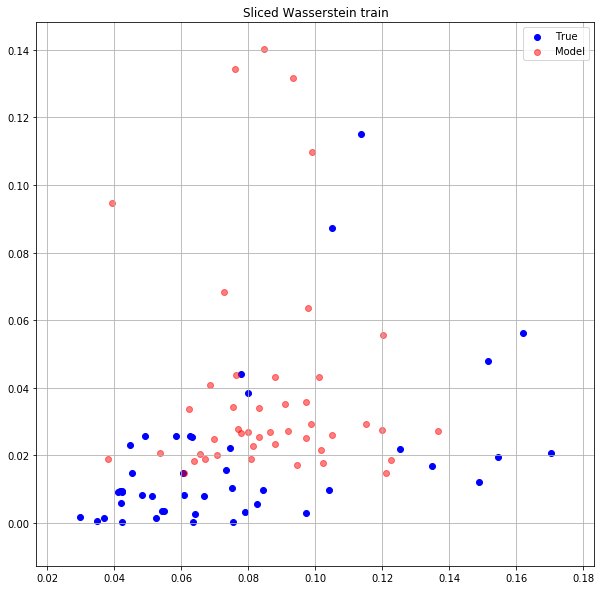

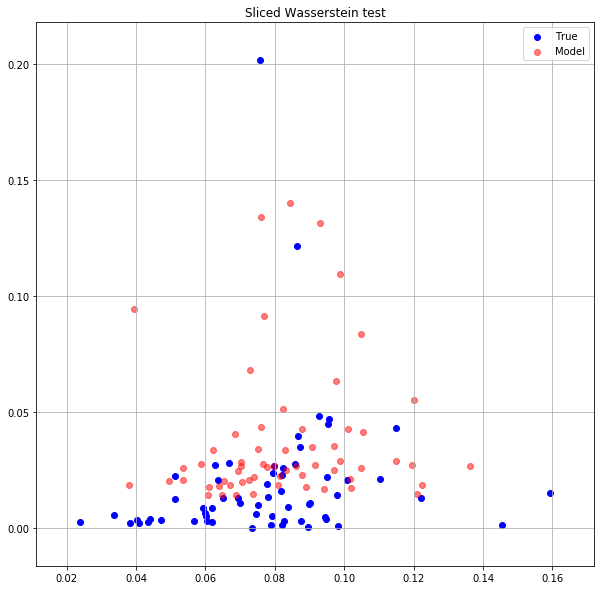

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  29 0.0386938006 0.0364639759


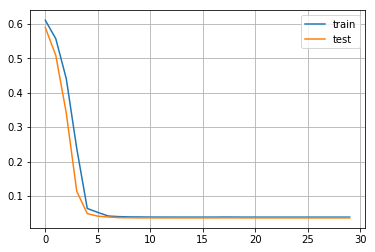

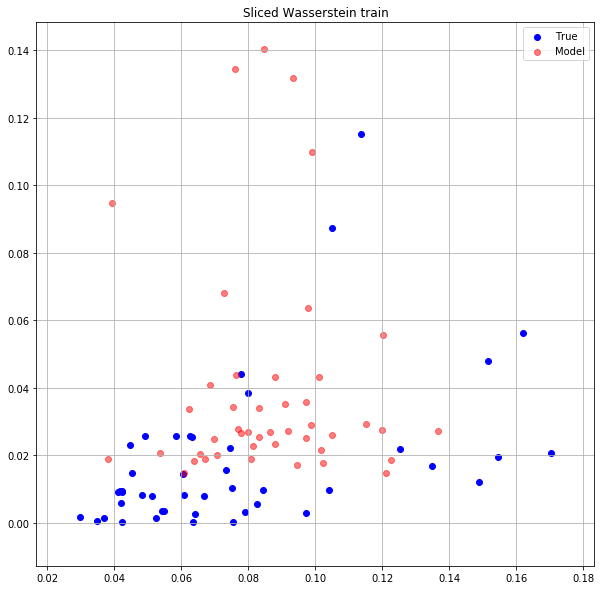

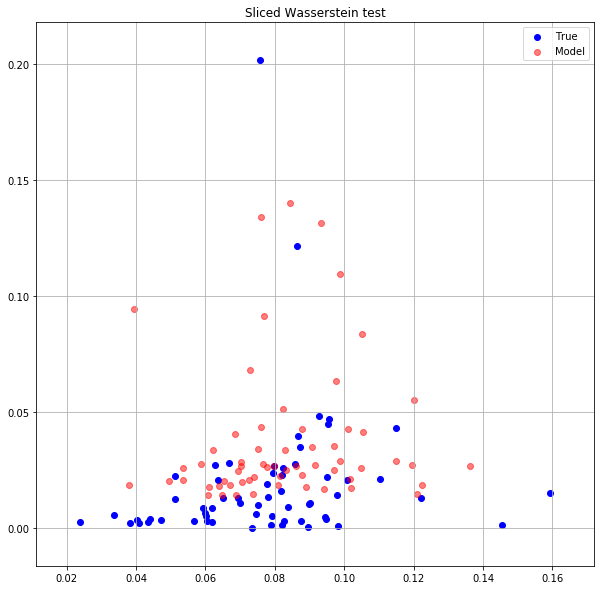

In [34]:
from ot.sliced import sliced_wasserstein_distance


train_loss, val_loss = [], []

for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        #print(src.shape, mask.shape)
        tgt = model(src, mask)
        loss_batch = 0
        for val, pred, cur_mask in zip(src, tgt, mask):
            #print(pred)
            val = val * cur_mask.unsqueeze(1).repeat(1, 2)
            pred = pred * cur_mask.unsqueeze(1).repeat(1, 2)
            a = (val[:, 1]**2 / torch.sum(val[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
            b = (pred[:, 1]**2 / torch.sum(pred[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
            #print(a, b)
            loss_batch += sliced_wasserstein_distance(val, pred, a, b, seed=54, n_projections=100)
        
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
    train_loss.append(loss_train)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            for val, pred, cur_mask in zip(src, tgt, mask):
                #print(pred)
                val = val * cur_mask.unsqueeze(1).repeat(1, 2)
                pred = pred * cur_mask.unsqueeze(1).repeat(1, 2)
                a = (val[:, 1]**2 / torch.sum(val[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
                b = (pred[:, 1]**2 / torch.sum(pred[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
                loss += sliced_wasserstein_distance(val, pred, a, b, seed=54, n_projections=100)
            
            
    loss_test = loss / len(dataloader_test.dataset)
    val_loss.append(loss_test)
    scheduler.step(loss_test)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    
    cur_n = len(train_loss)
    plt.plot(np.arange(cur_n), train_loss, label = 'train')
    plt.plot(np.arange(cur_n), val_loss, label = 'test')
    plt.grid()
    plt.legend()
    plt.show()
    
    
    item = dataset_train[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Sliced Wasserstein train")
    plt.show()
    
    
    
    item = dataset_test[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Sliced Wasserstein test")
    plt.show()

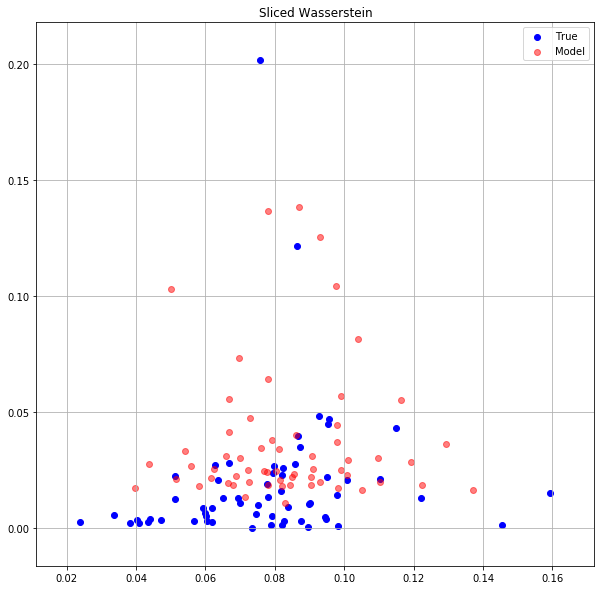

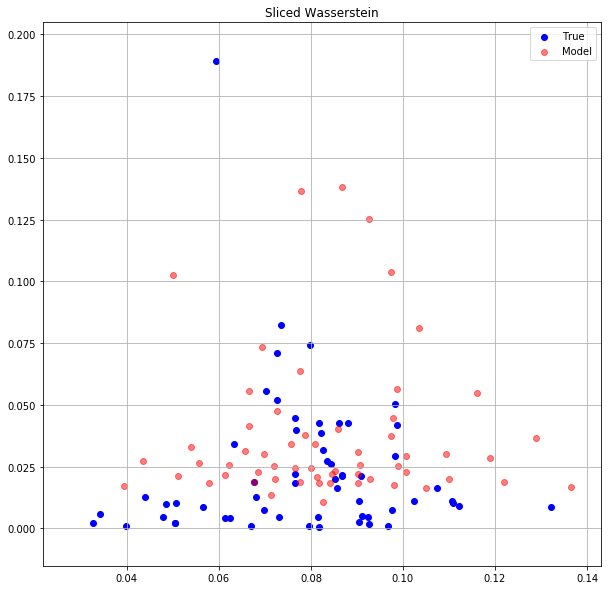

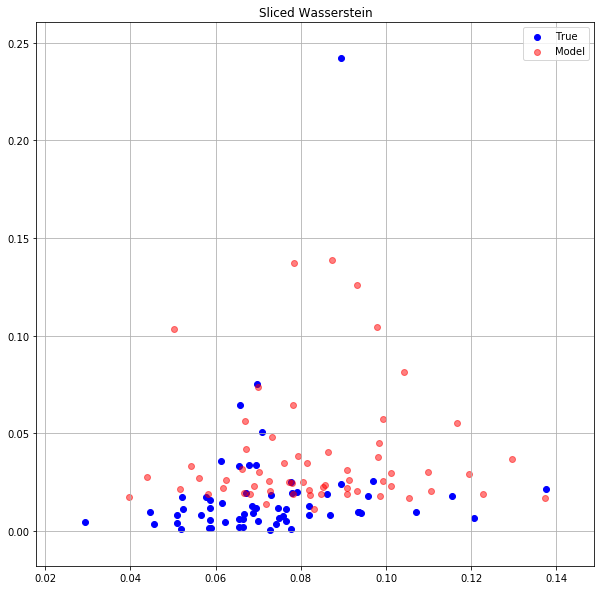

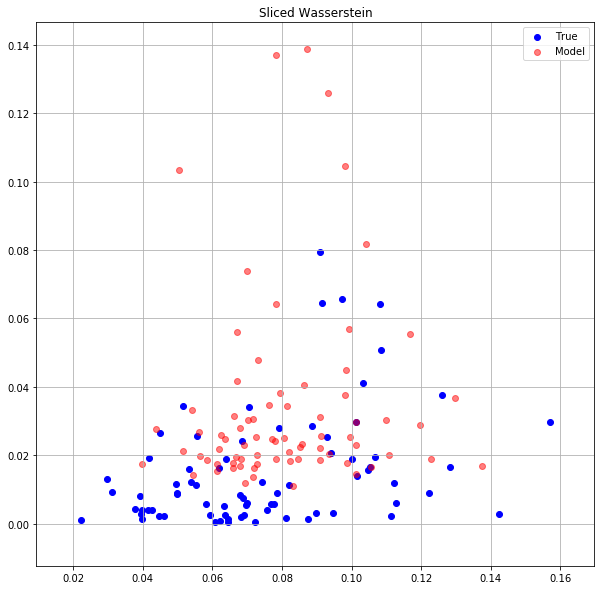

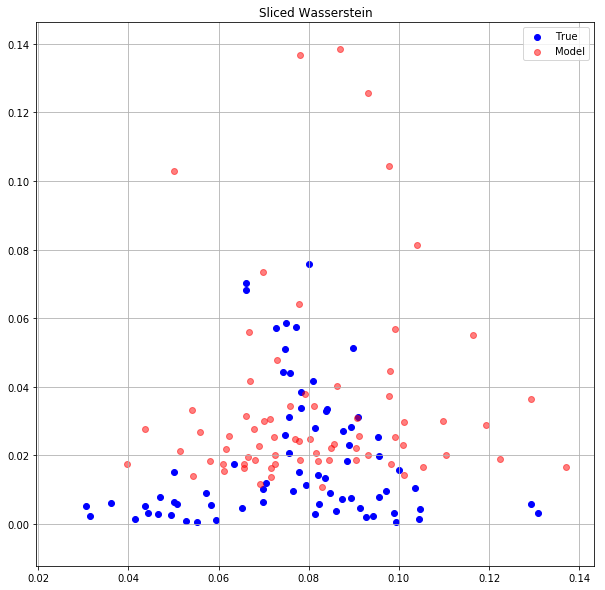

...

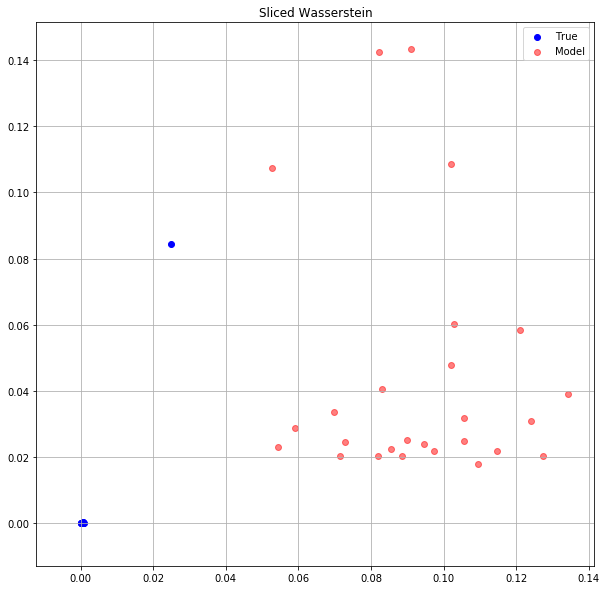

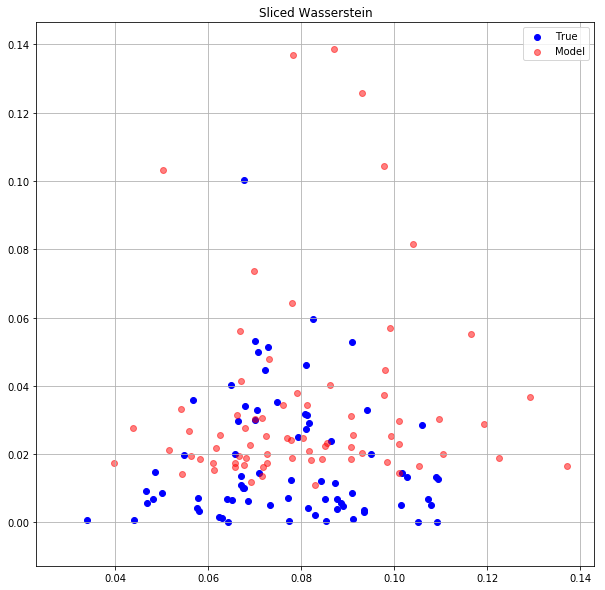

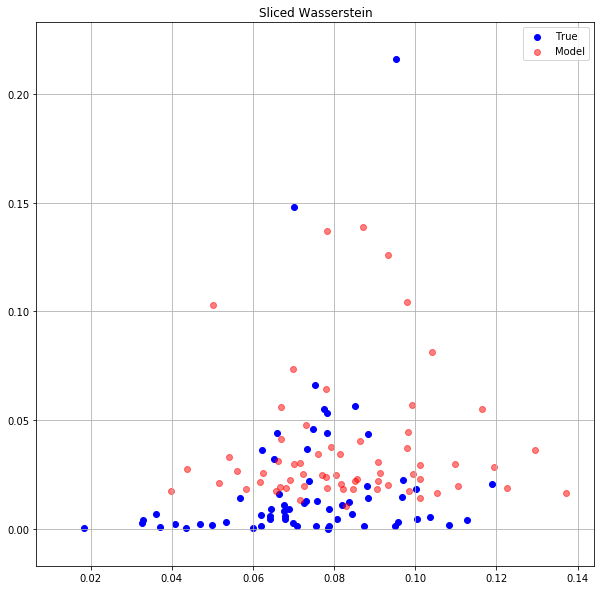

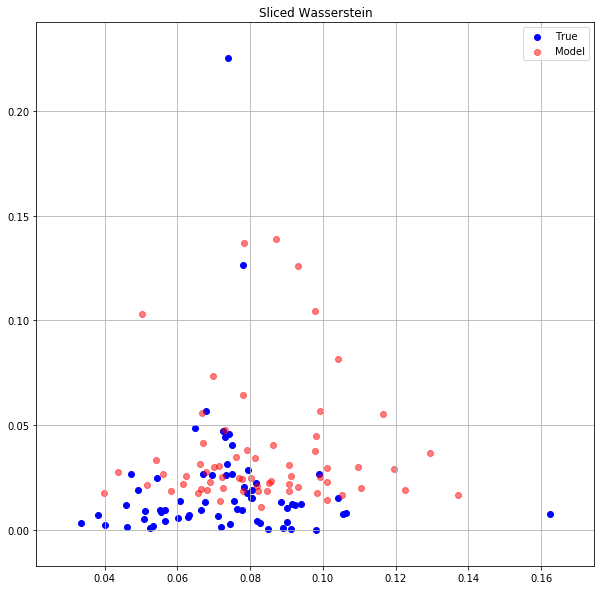

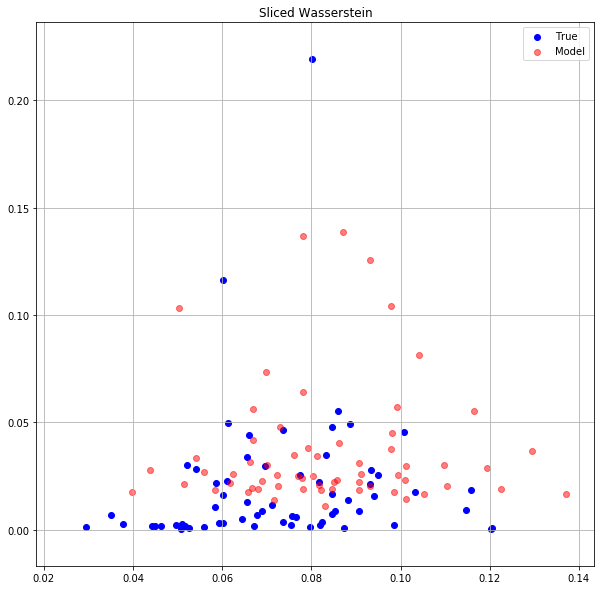

In [9]:
#sliced wasserstein smaller
for i in range(15):
    item = dataset_test[i].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Sliced Wasserstein")
    plt.show()

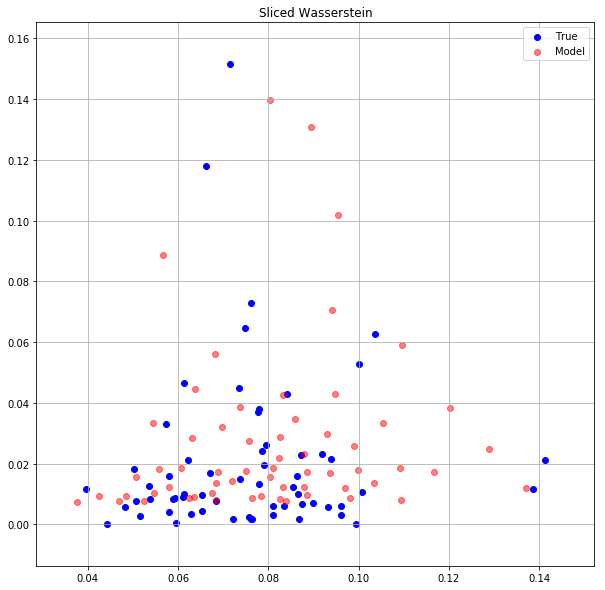

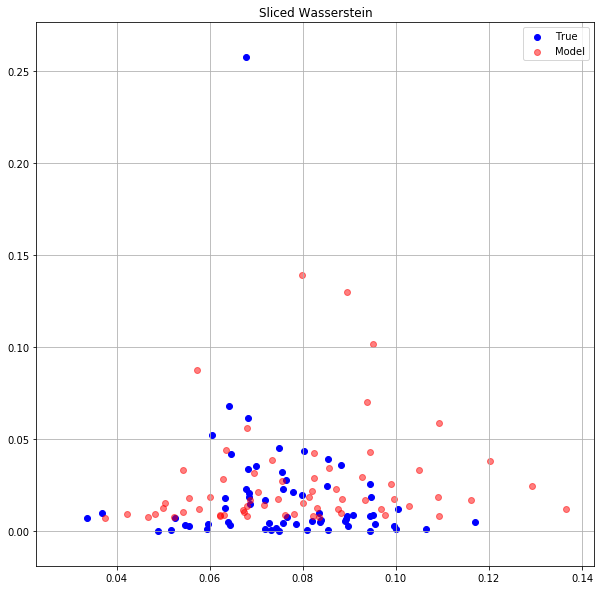

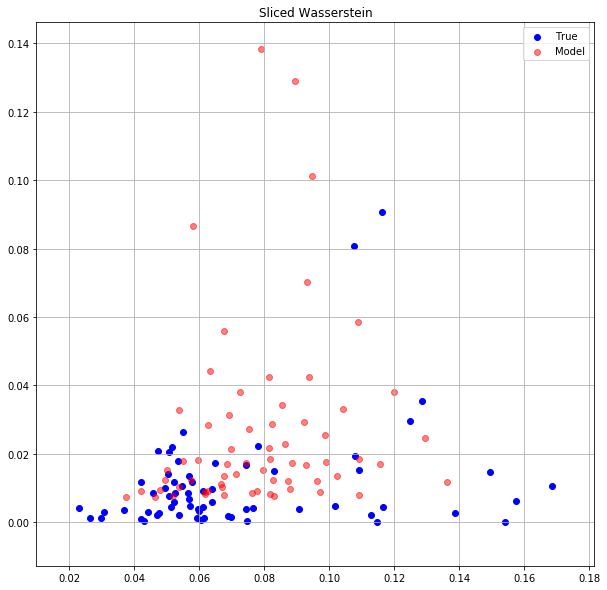

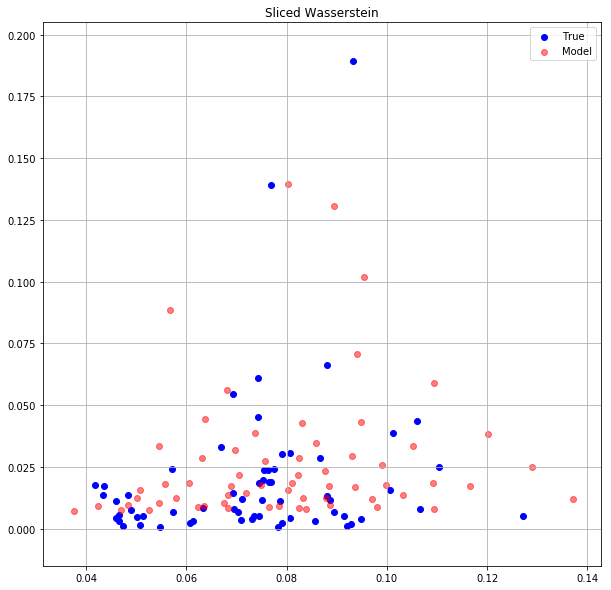

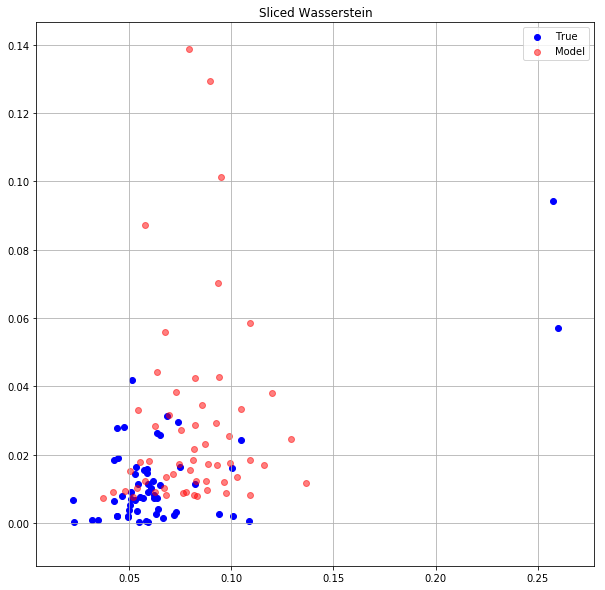

...

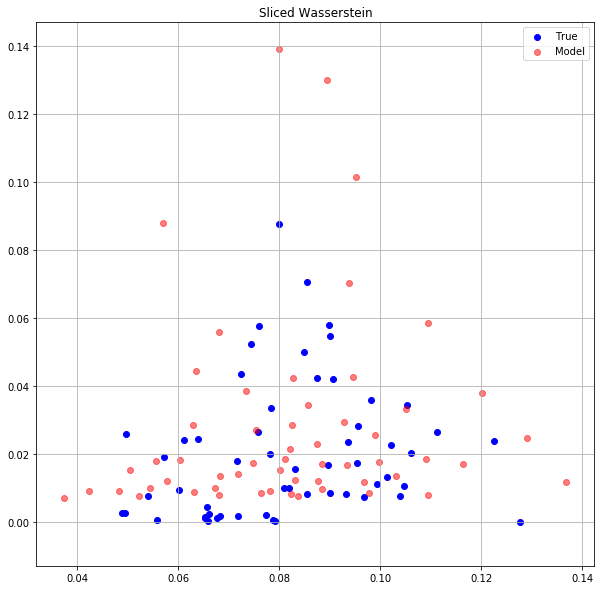

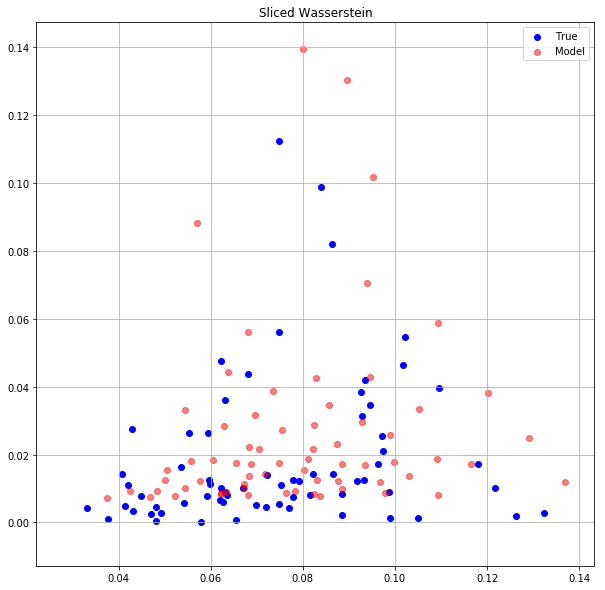

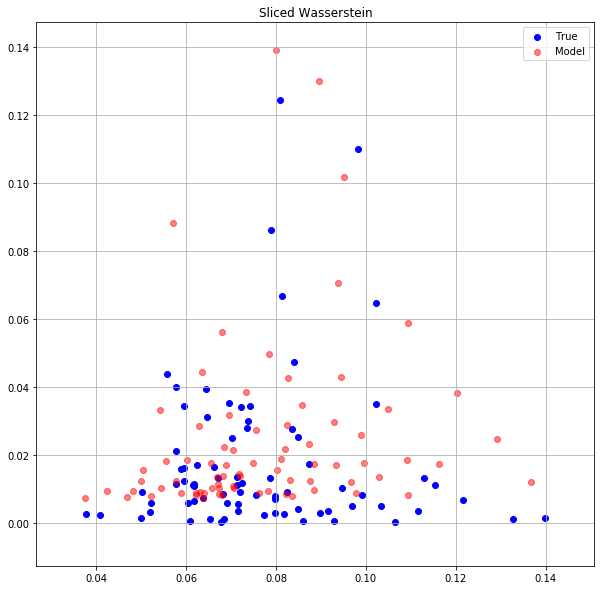

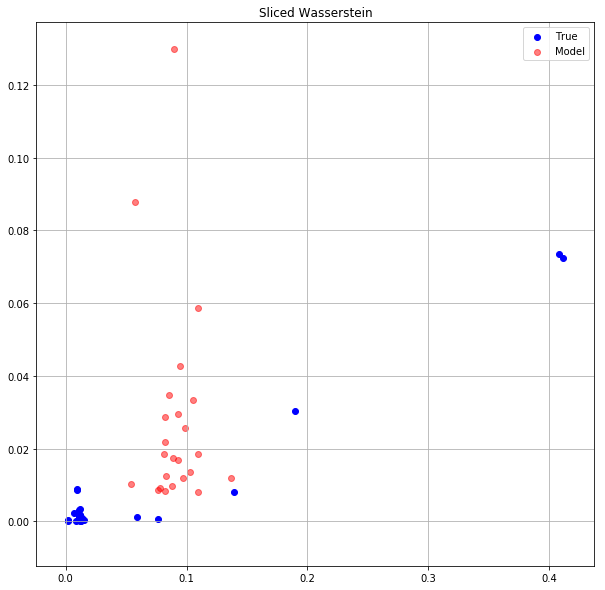

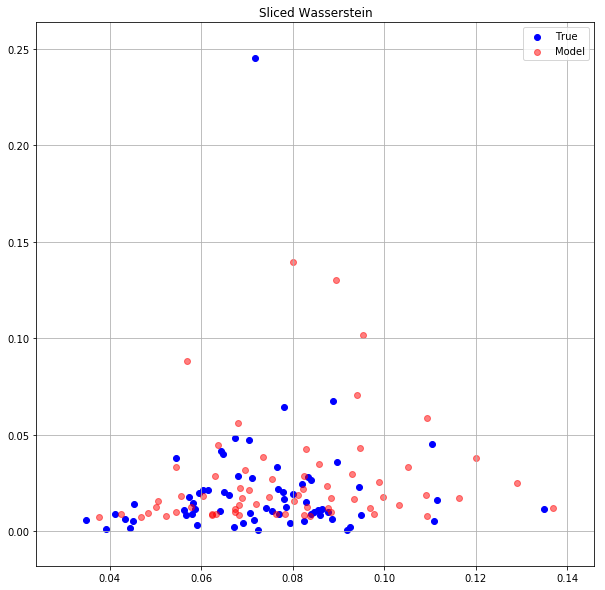

In [43]:
#sliced wasserstein bigger model
for i in range(15):
    item = dataset_test[i].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Sliced Wasserstein")
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.0239822604 0.0228446107


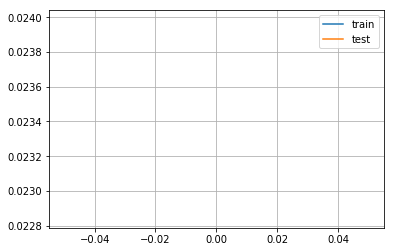

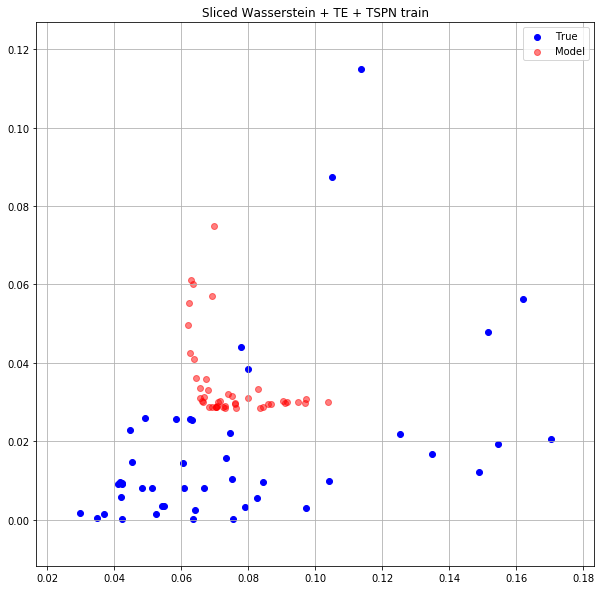

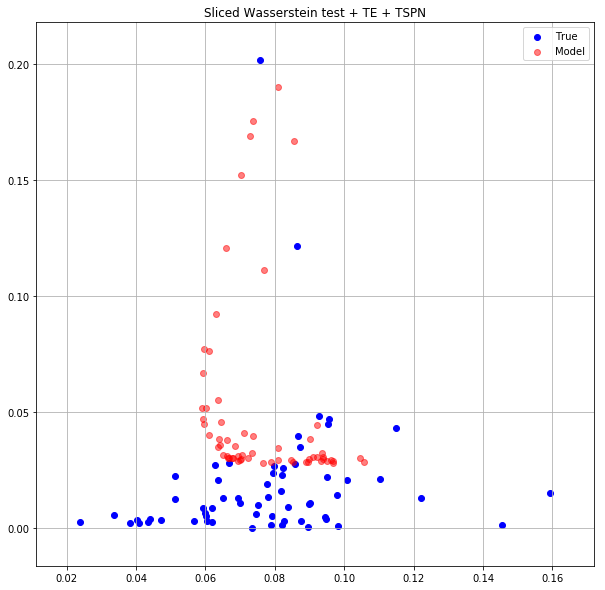

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.0238988288 0.0228227805


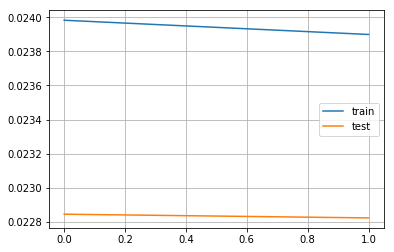

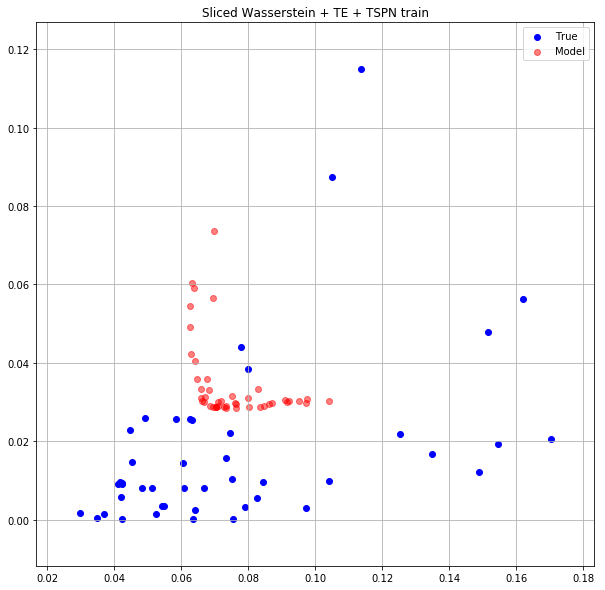

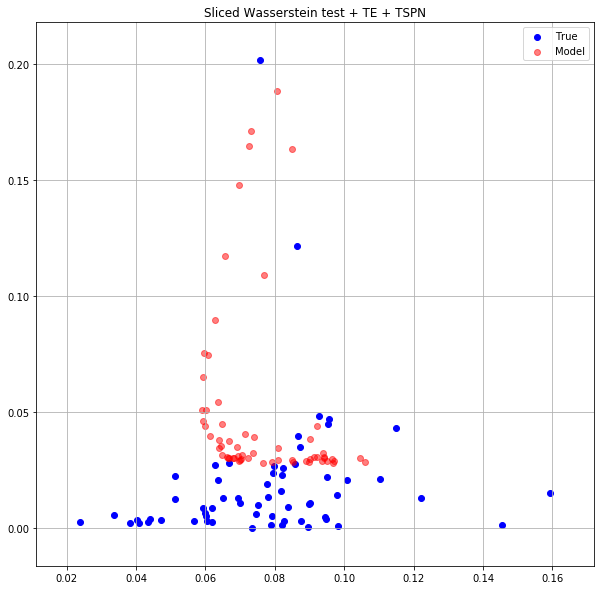

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.0237238389 0.0227762219


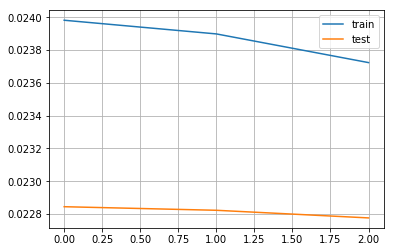

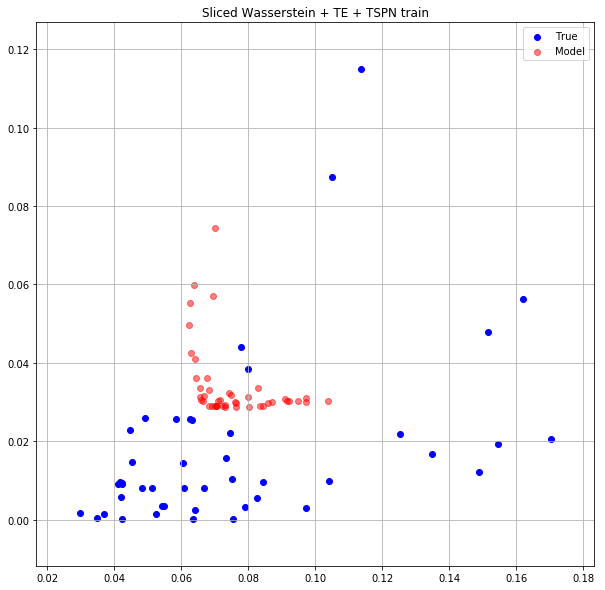

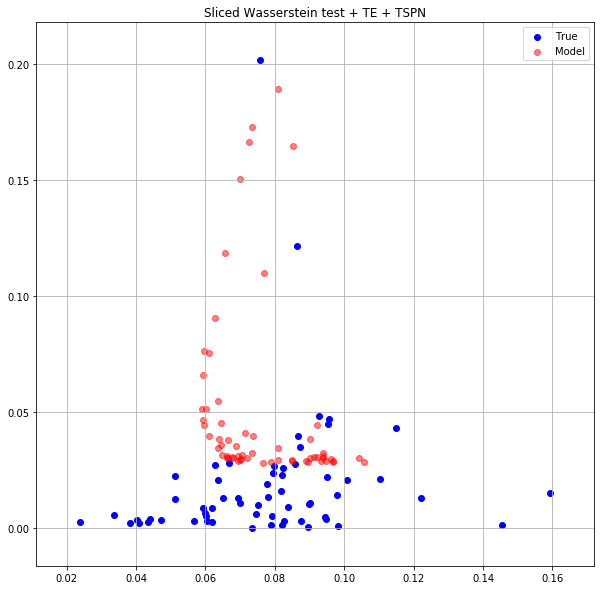

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.0238211062 0.0227716118


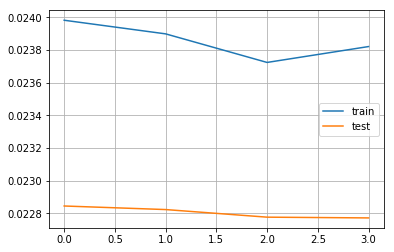

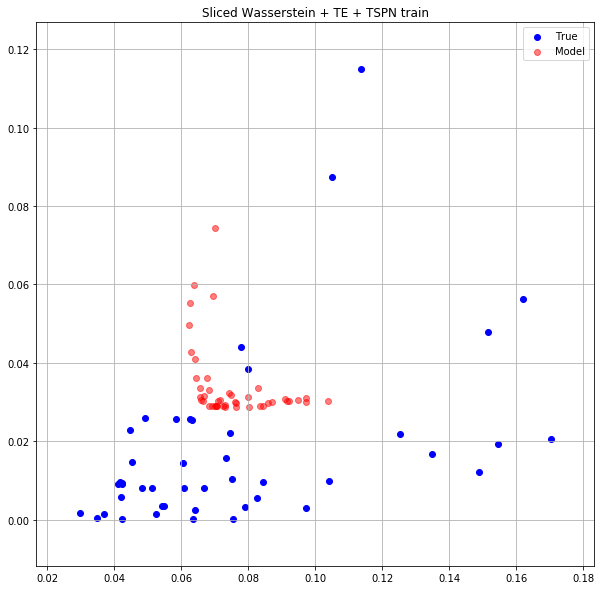

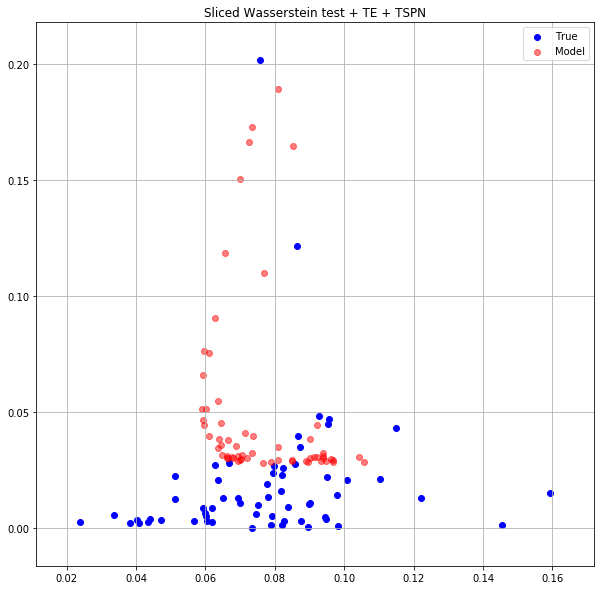

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.0239799898 0.0227706917


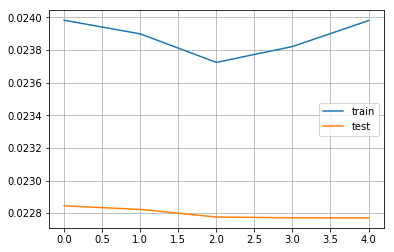

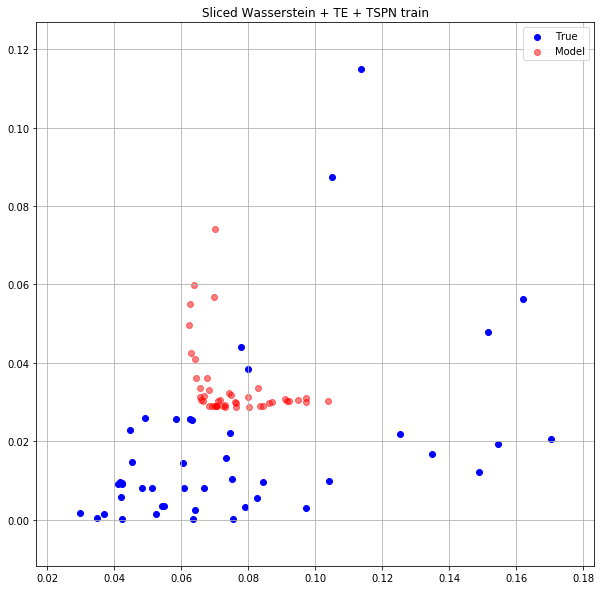

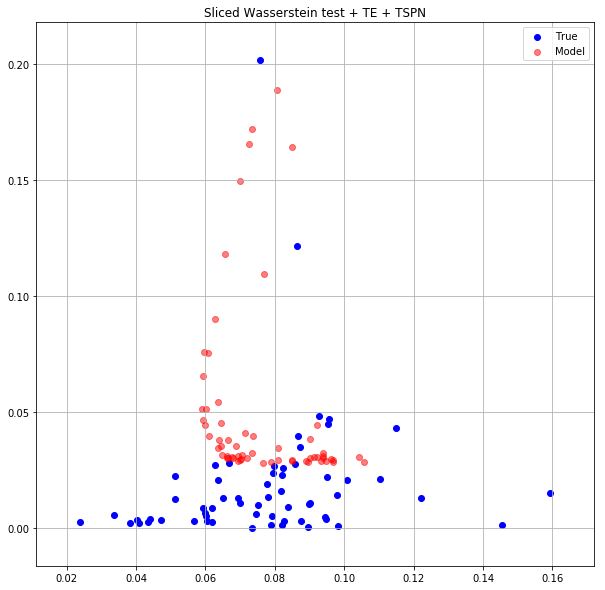

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.0239961036 0.0227640979


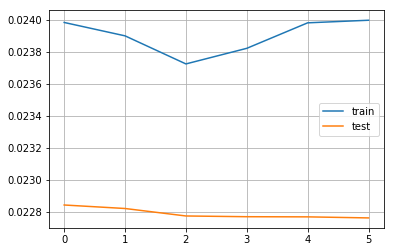

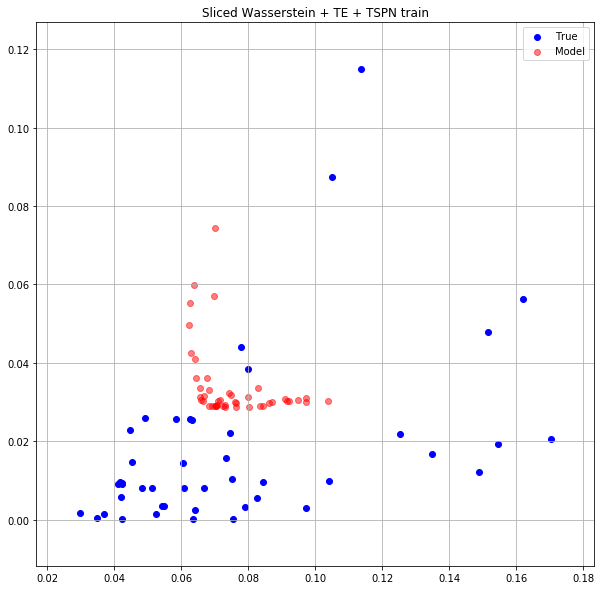

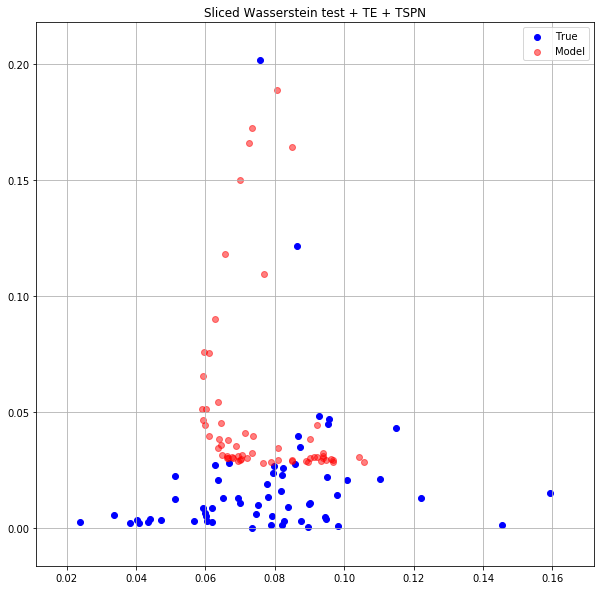

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0239178687 0.0227627680


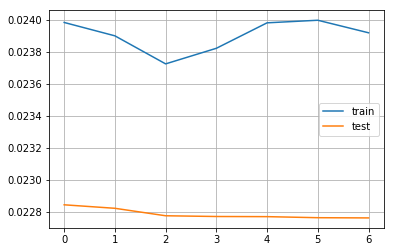

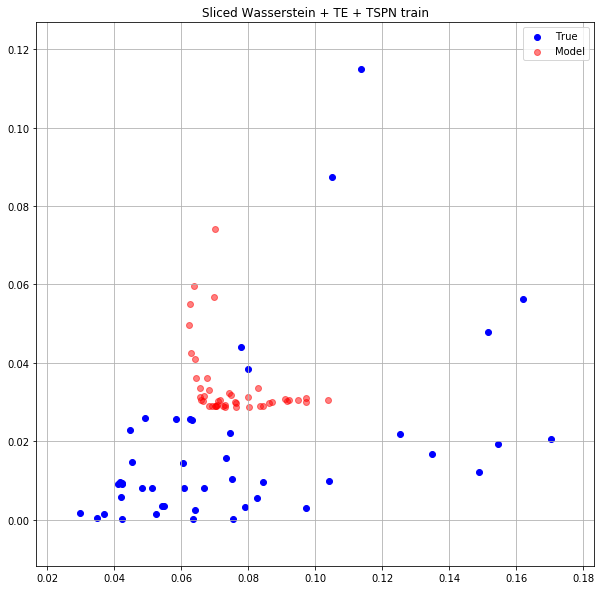

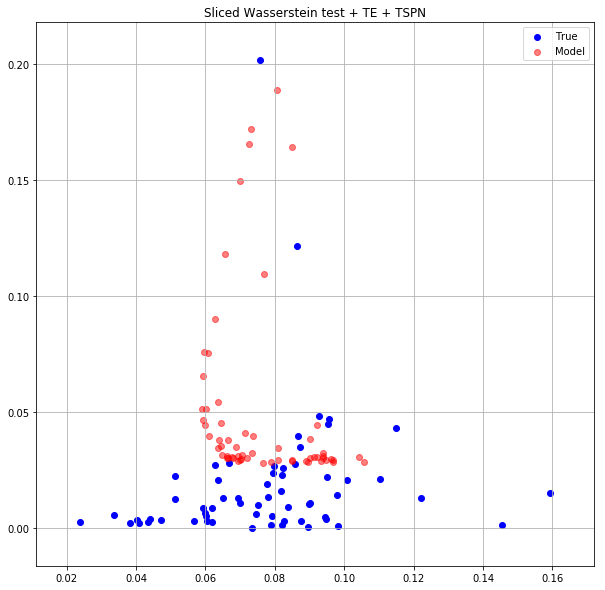

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0237557665 0.0227635652


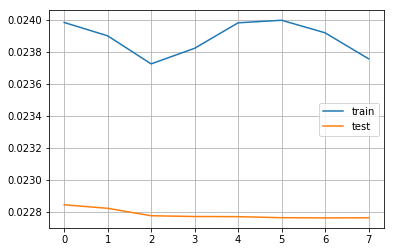

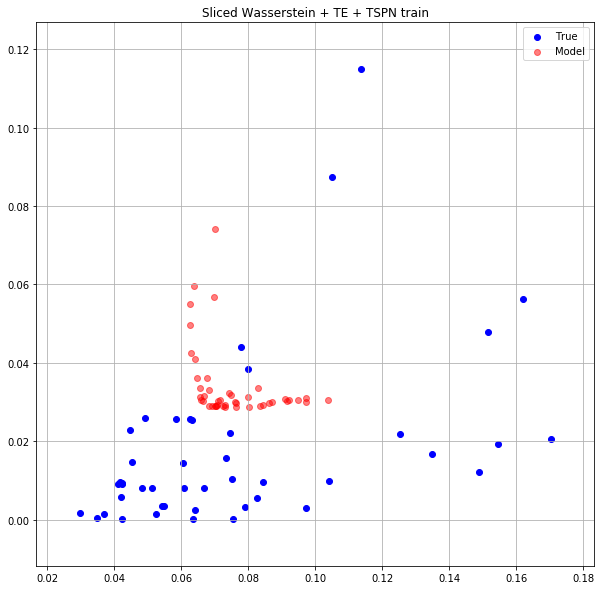

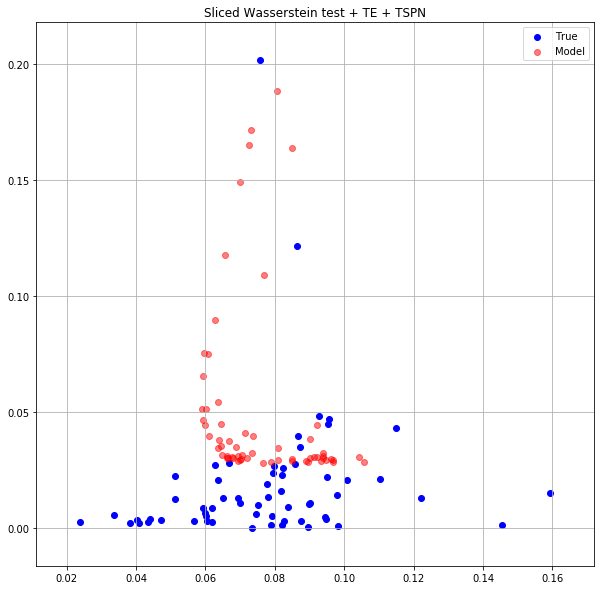

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0238924790 0.0227524452


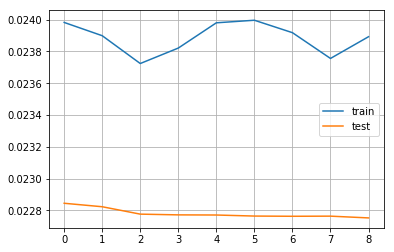

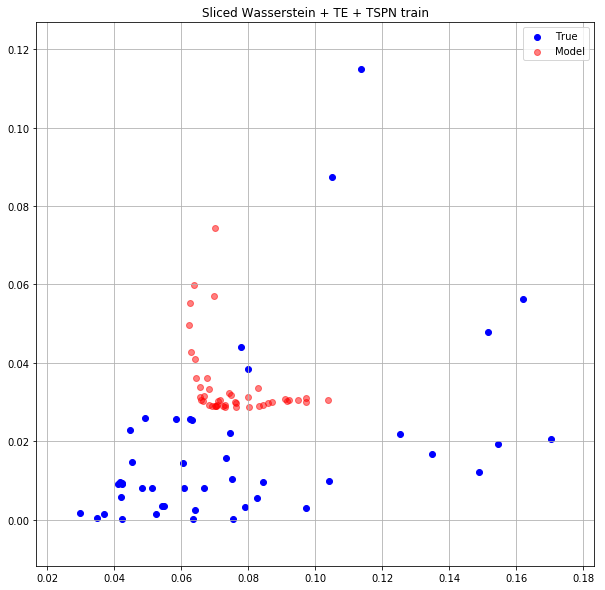

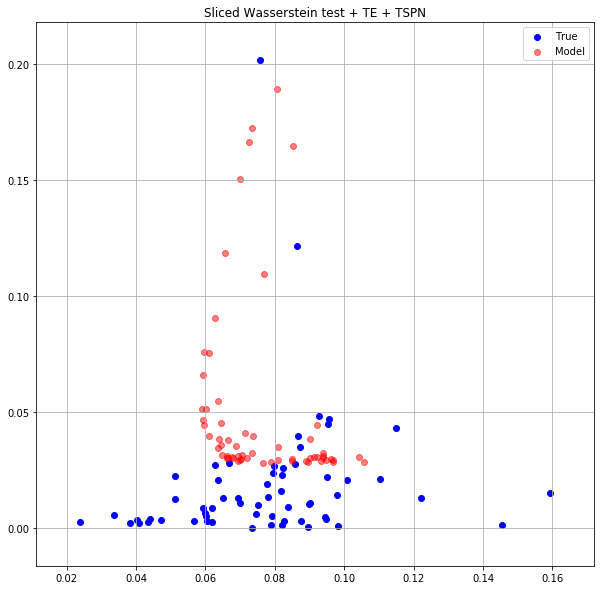

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0237602368 0.0227502063


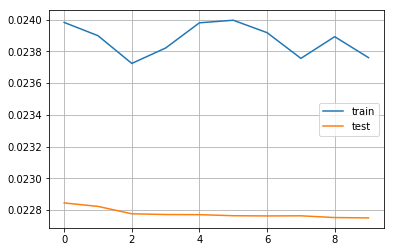

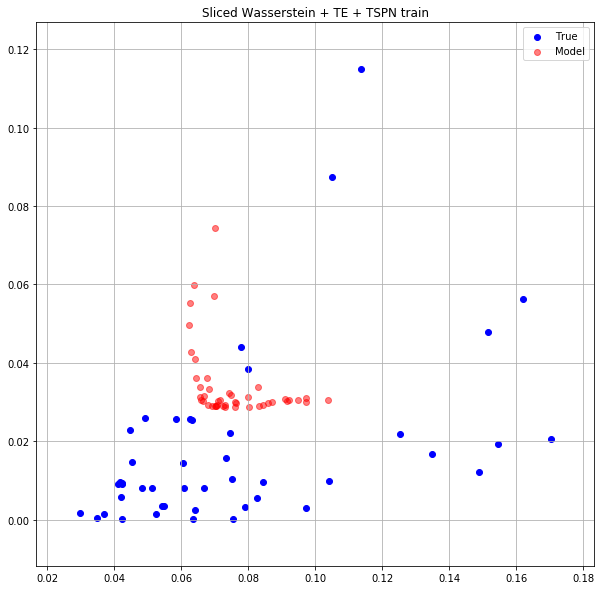

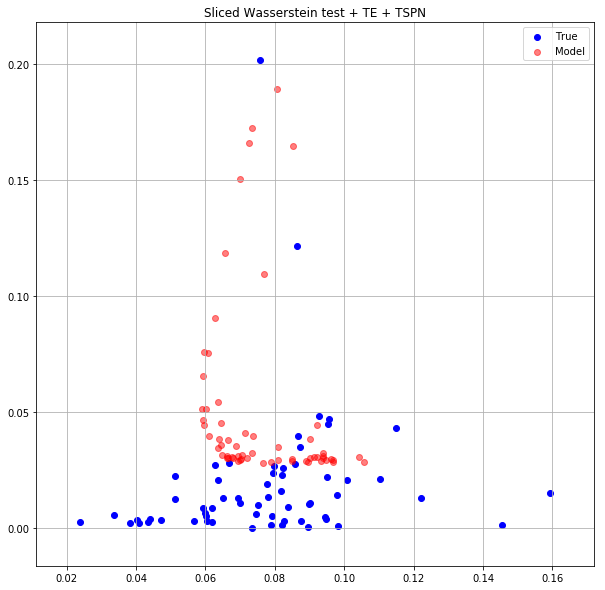

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0240190122 0.0227463841


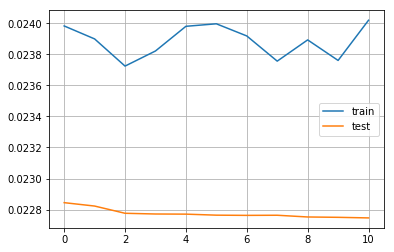

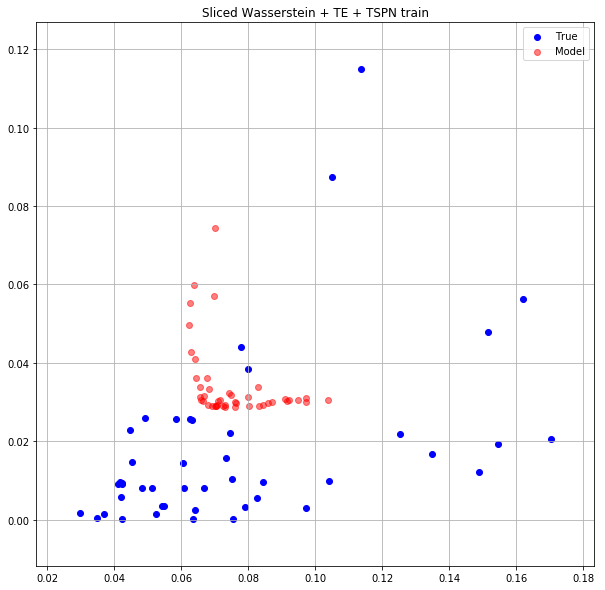

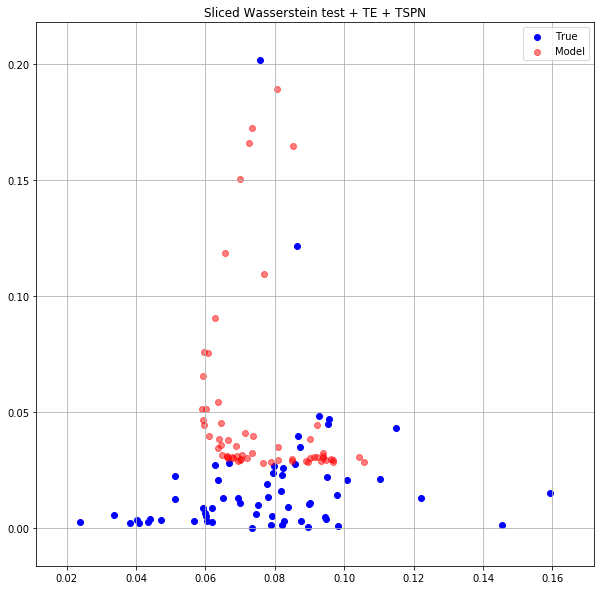

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0239286758 0.0227483585


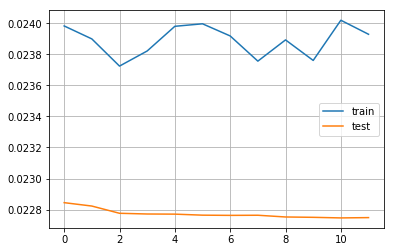

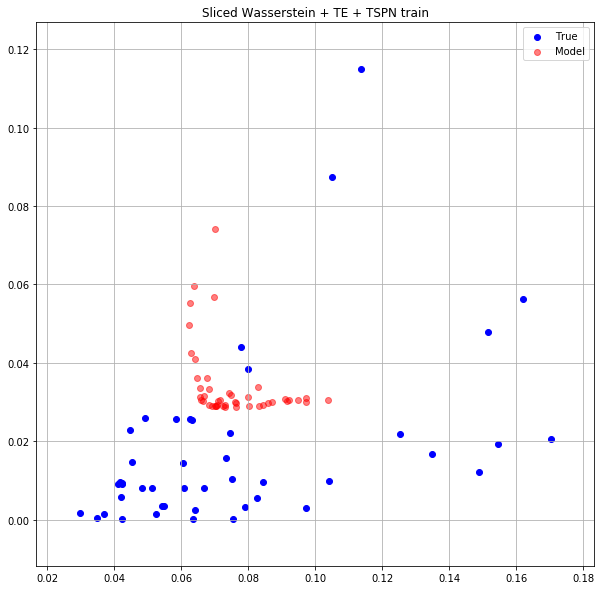

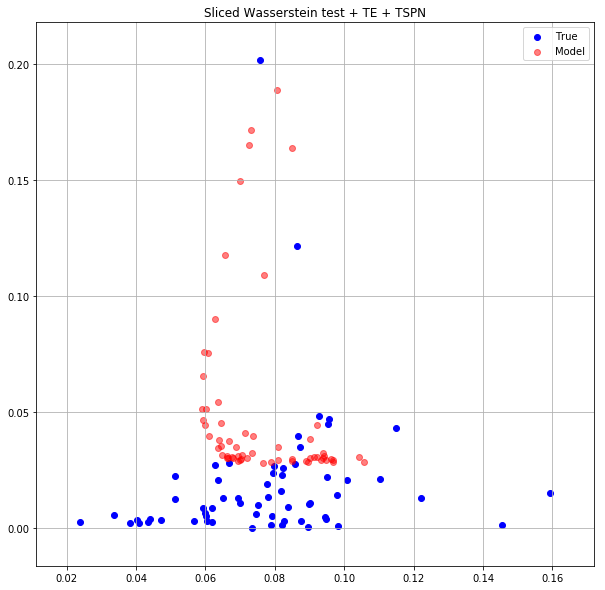

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.0237071440 0.0227390304


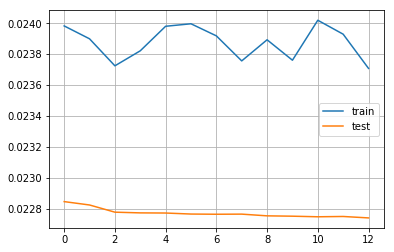

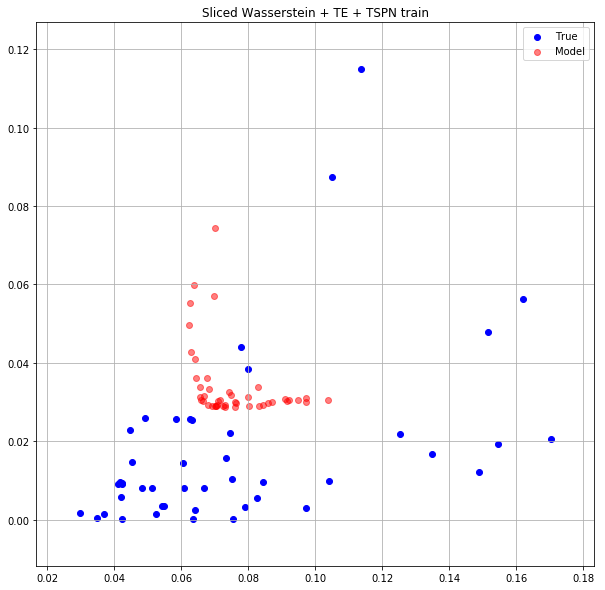

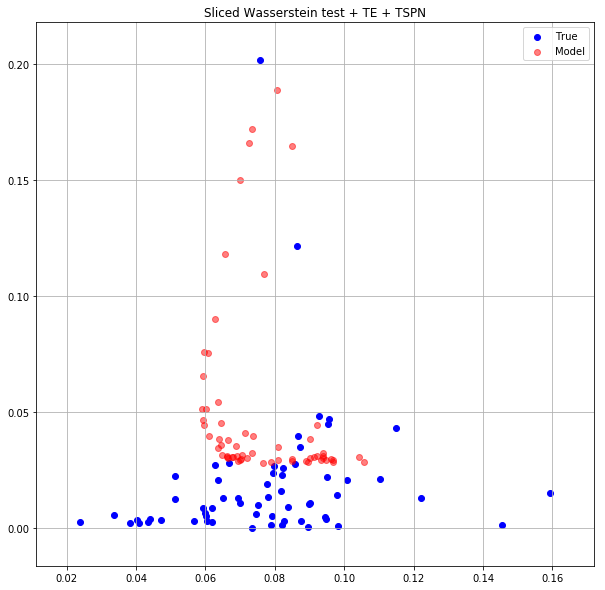

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.0238107927 0.0227232724


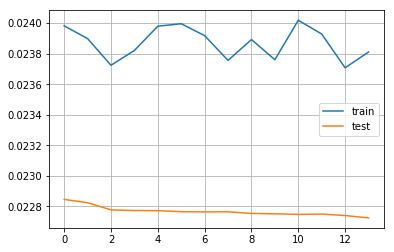

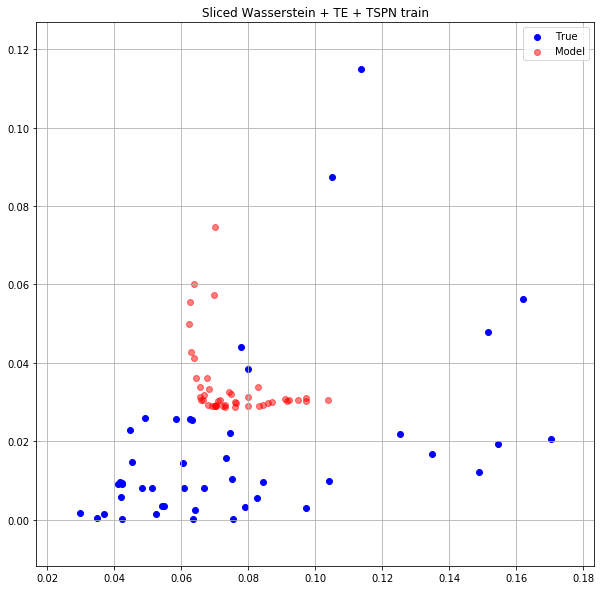

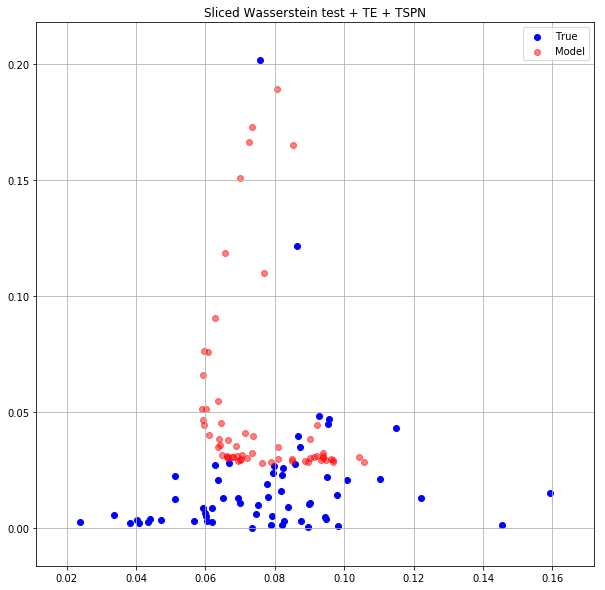

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.0236607138 0.0227167420


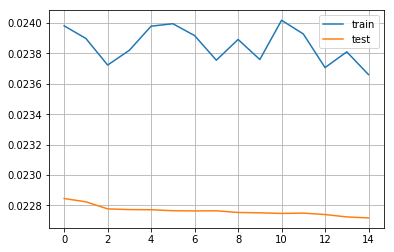

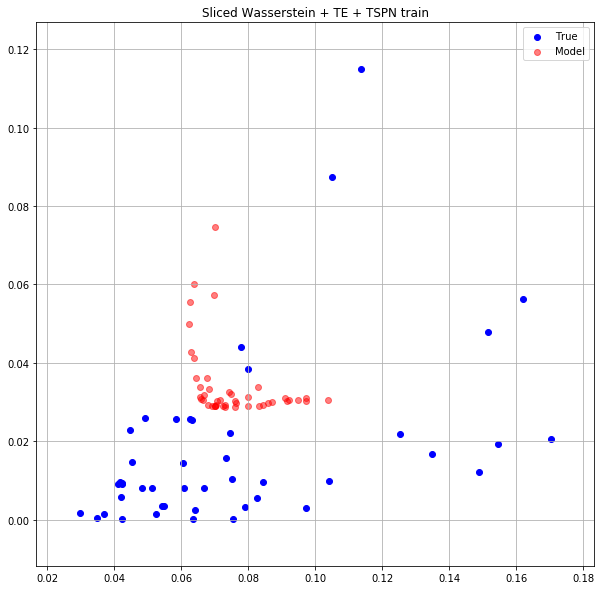

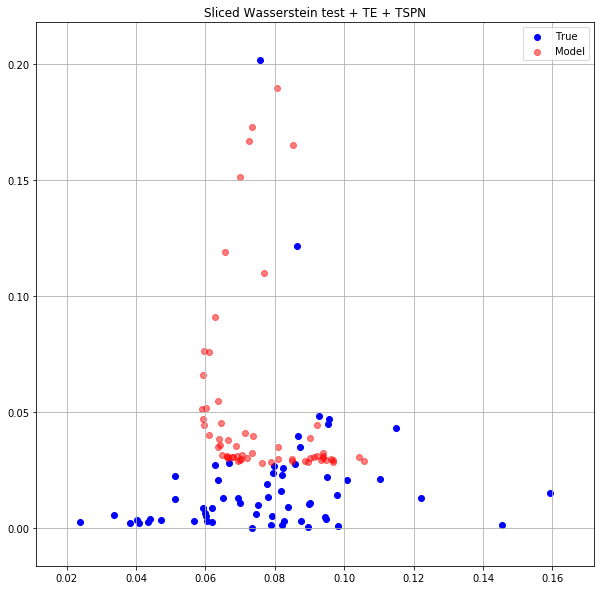

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.0238823704 0.0227174852


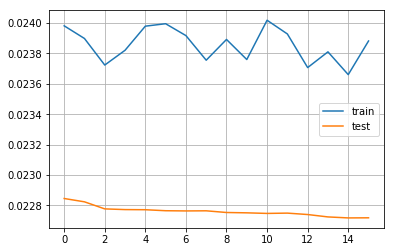

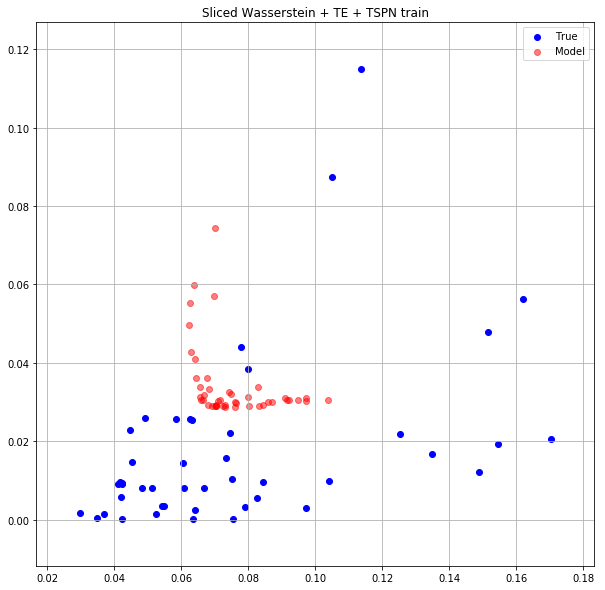

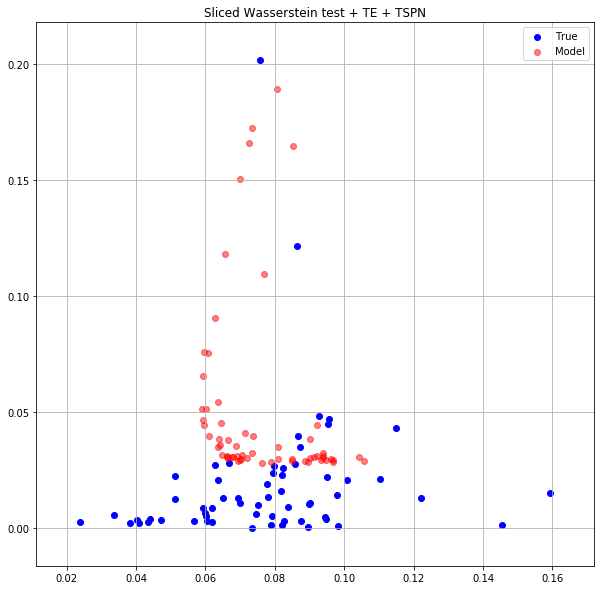

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.0236632507 0.0227222554


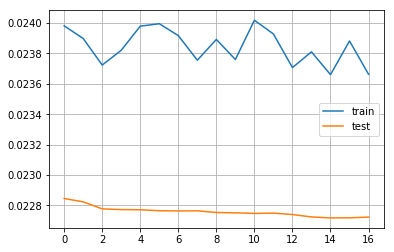

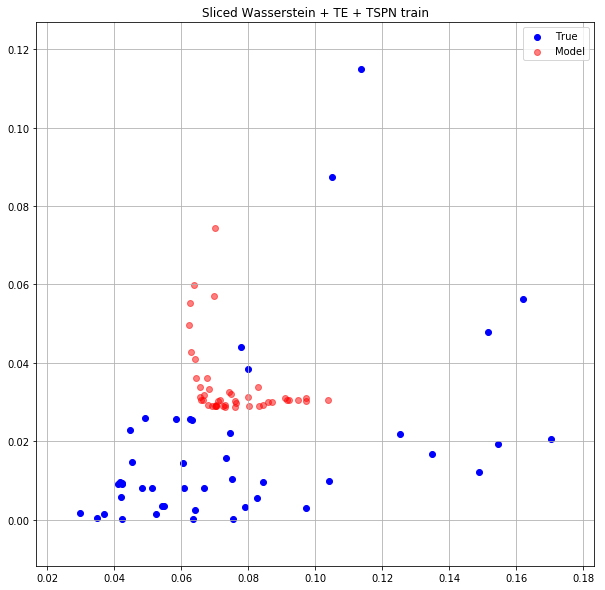

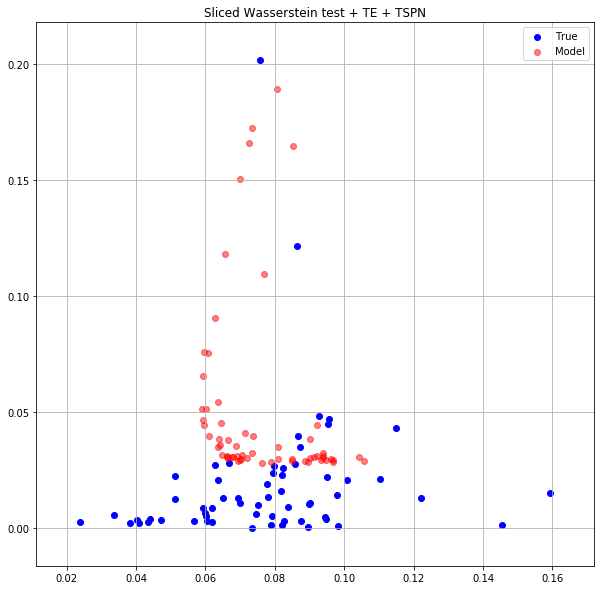

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.0238383263 0.0227232594


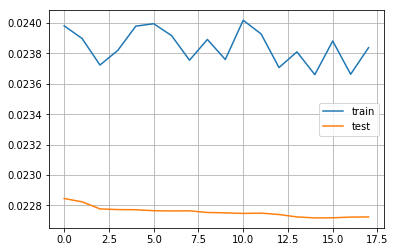

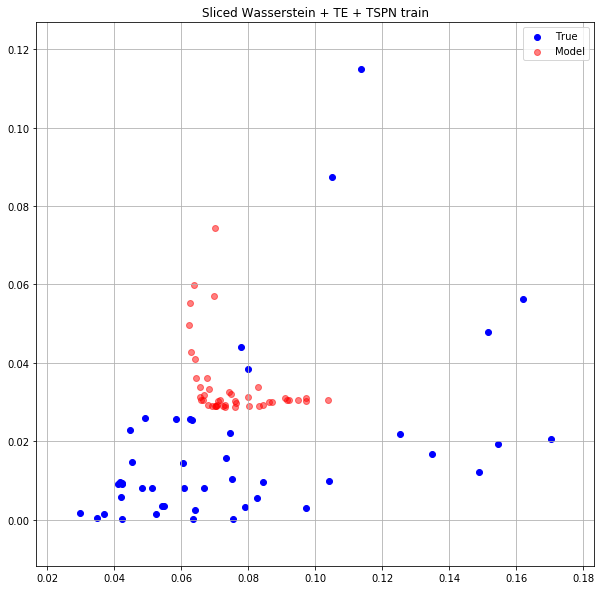

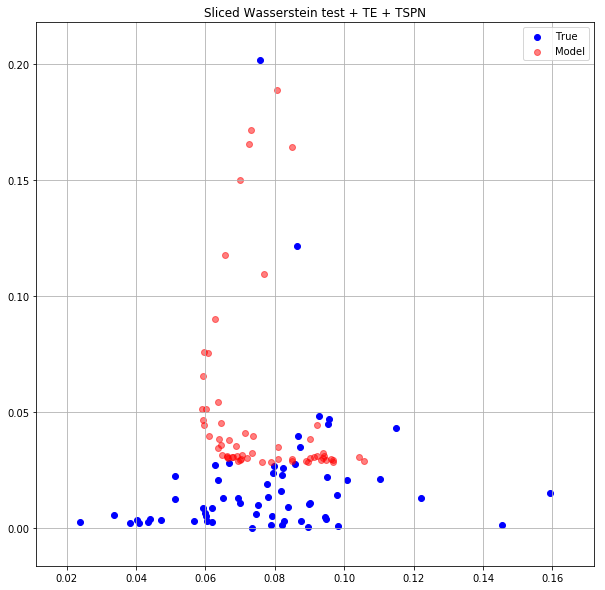

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 0.0238734204 0.0227161199


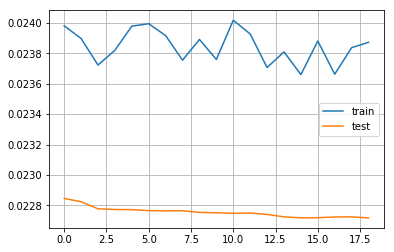

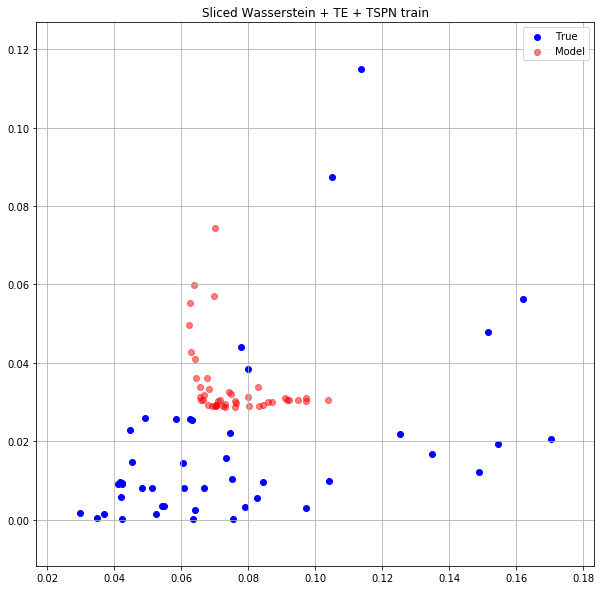

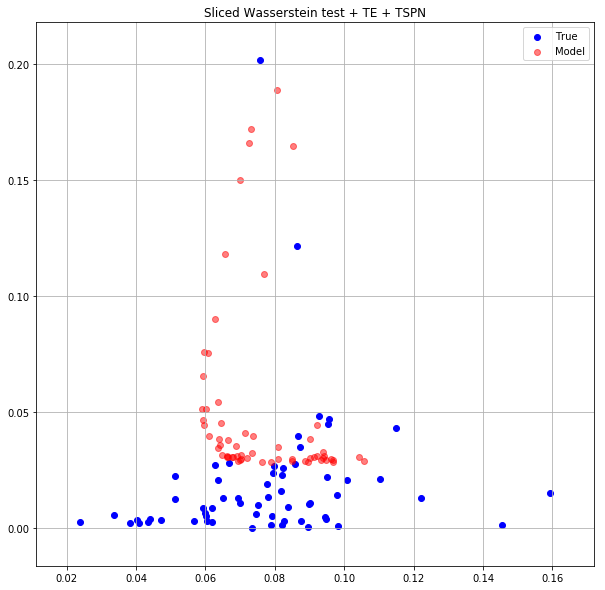

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 0.0238899477 0.0227232035


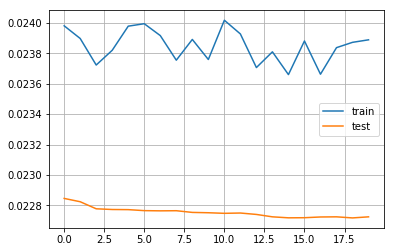

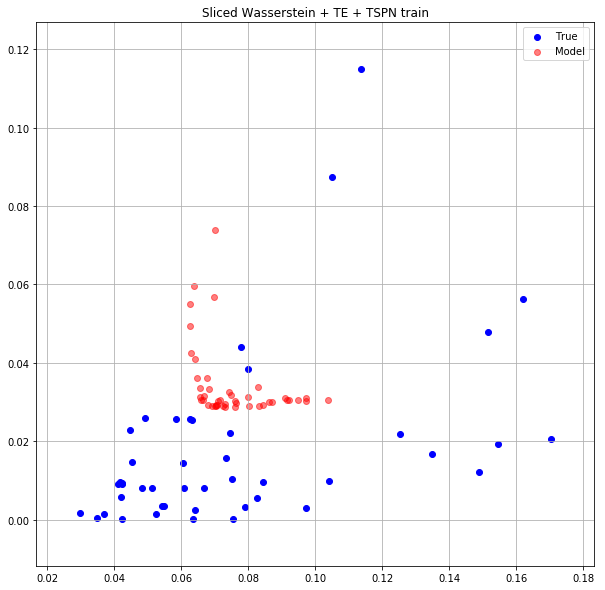

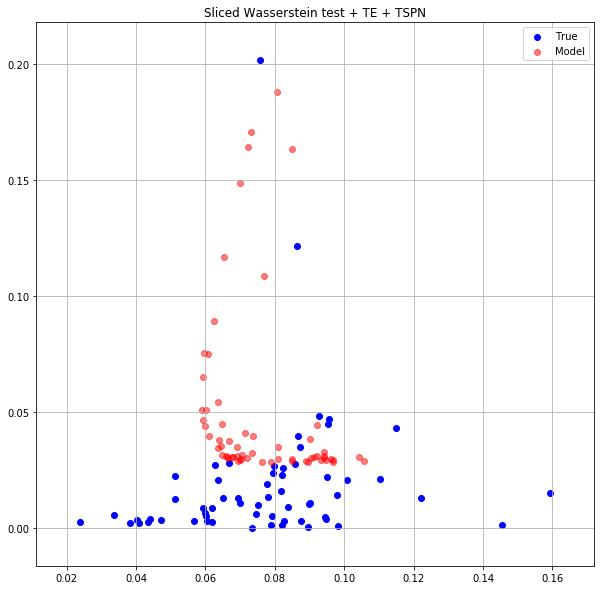

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  20 0.0239590853 0.0227085017


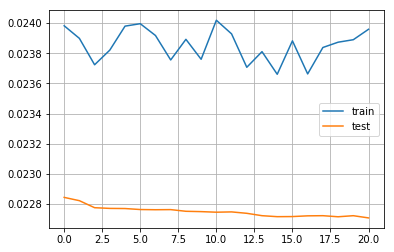

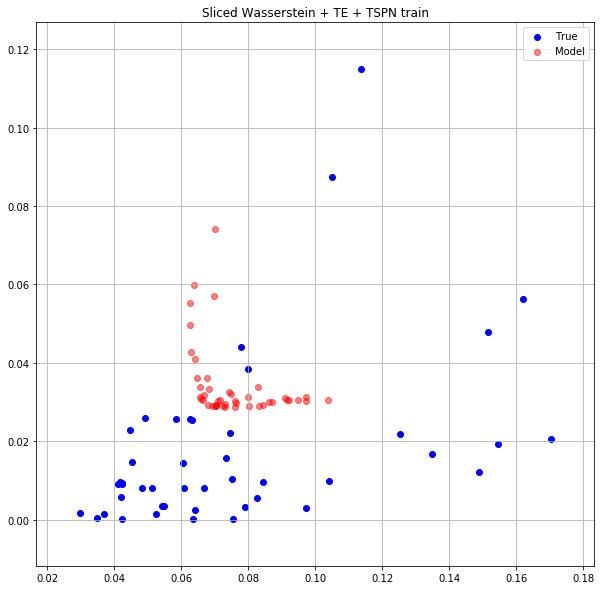

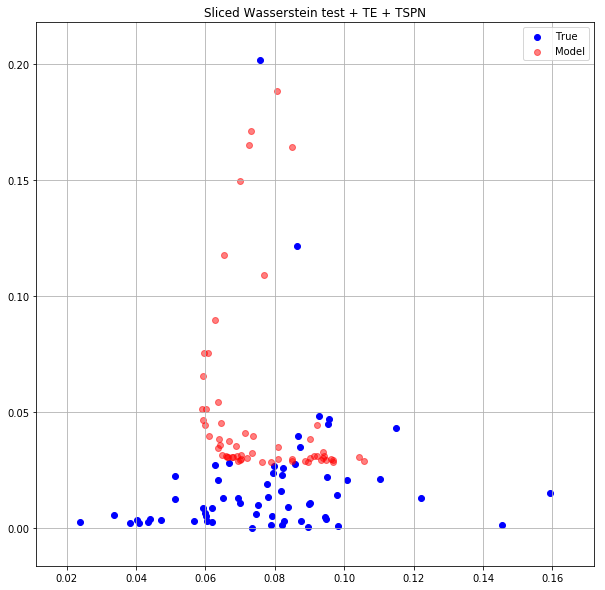

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  21 0.0236981995 0.0227034949


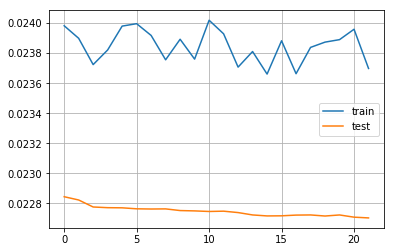

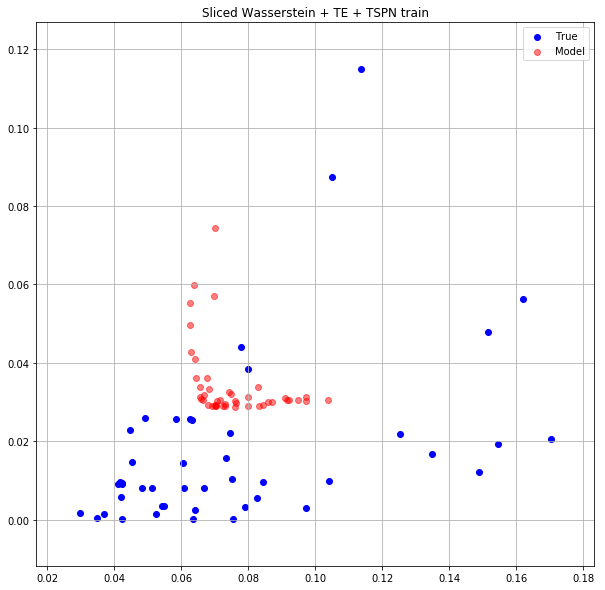

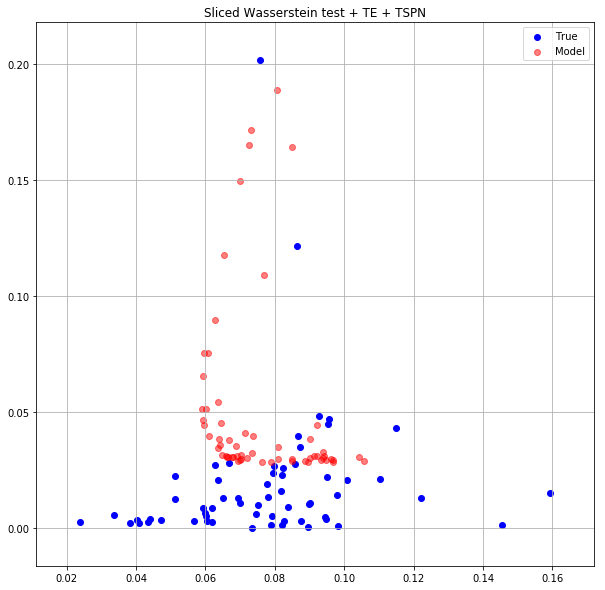

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  22 0.0239160396 0.0227033738


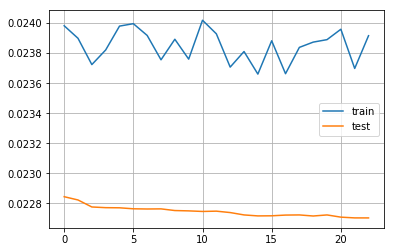

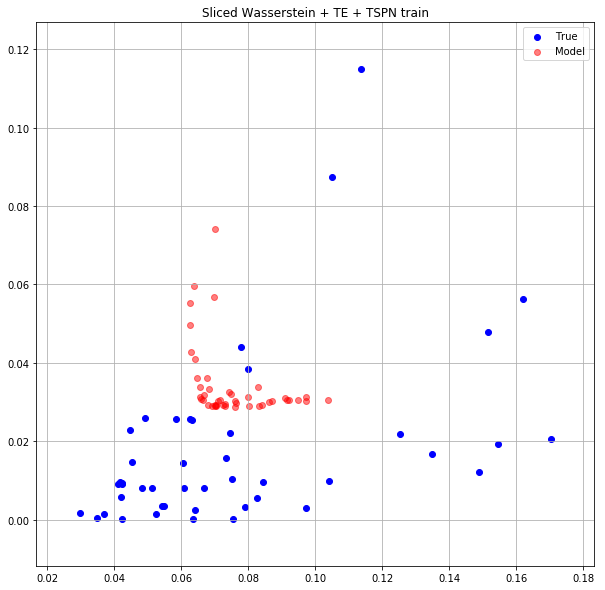

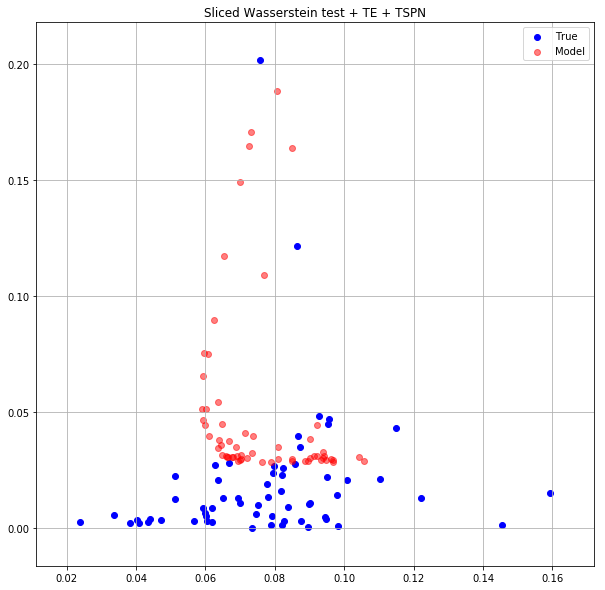

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  23 0.0237329081 0.0226964969


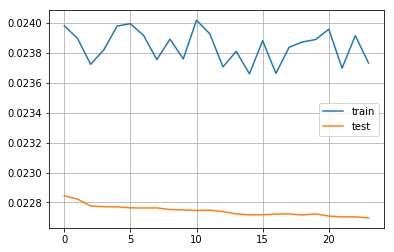

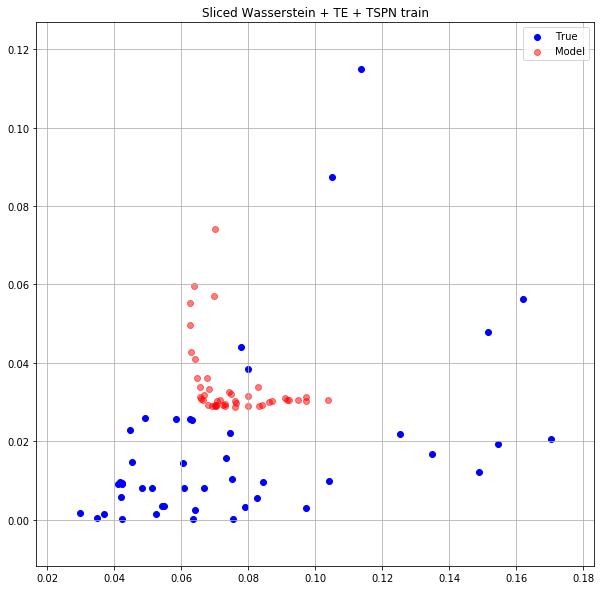

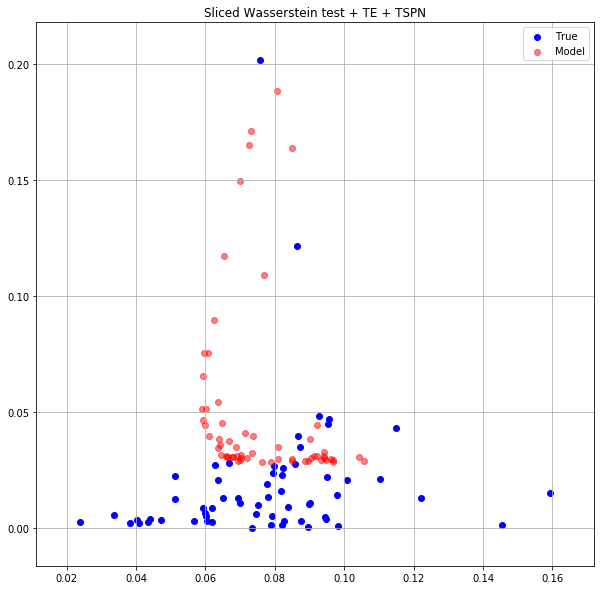

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  24 0.0236673113 0.0226969775


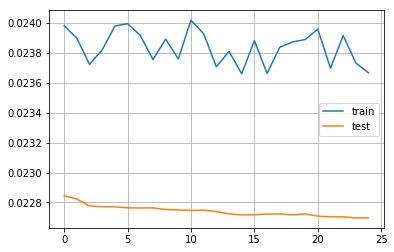

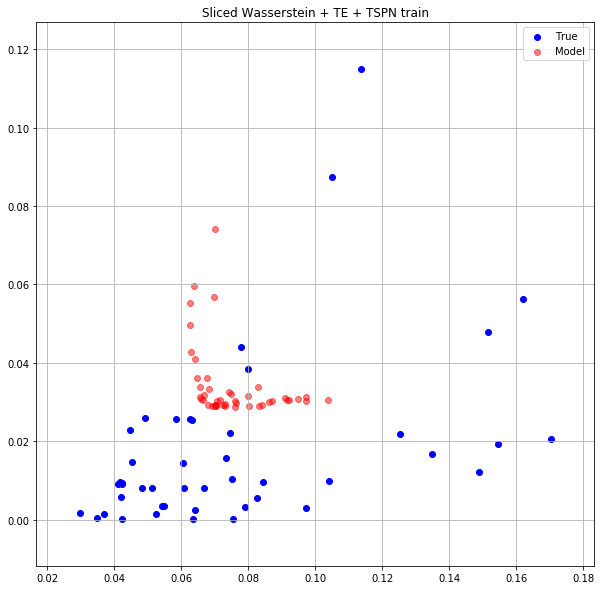

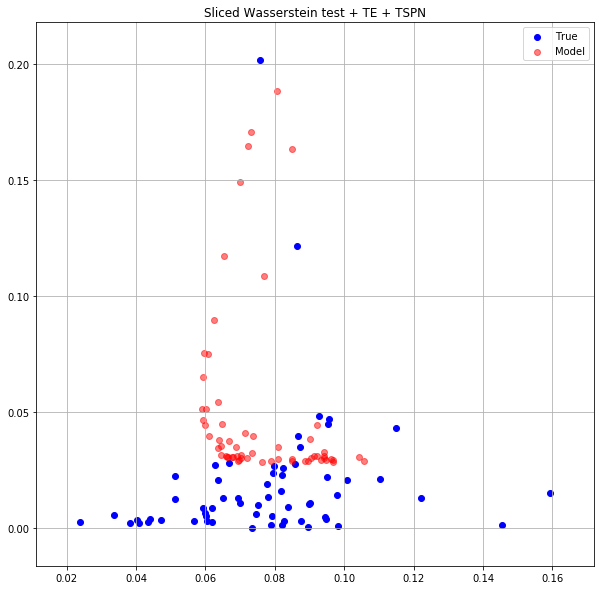

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  25 0.0238453131 0.0226869676


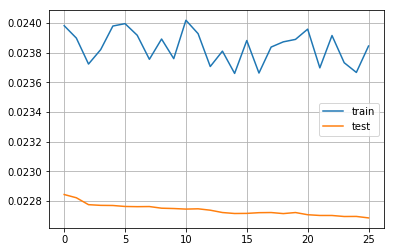

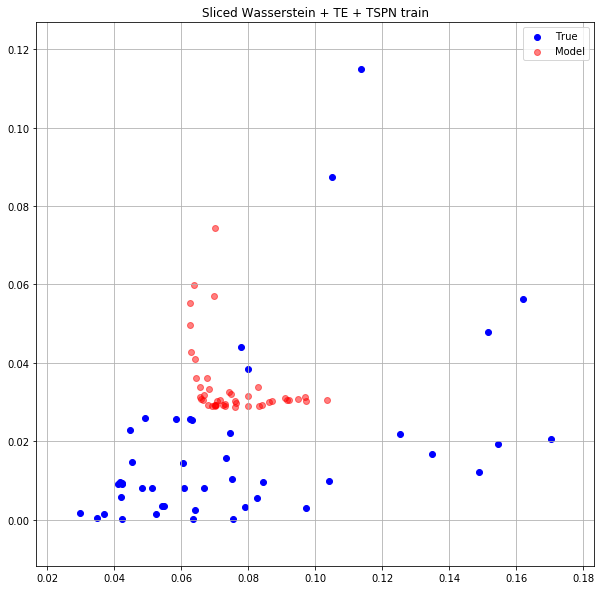

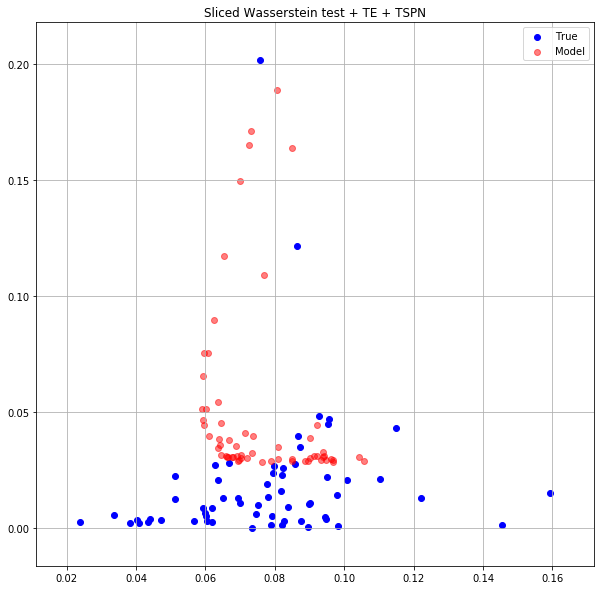

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  26 0.0237218793 0.0226704217


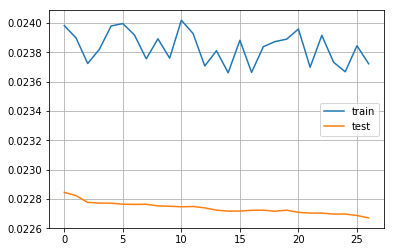

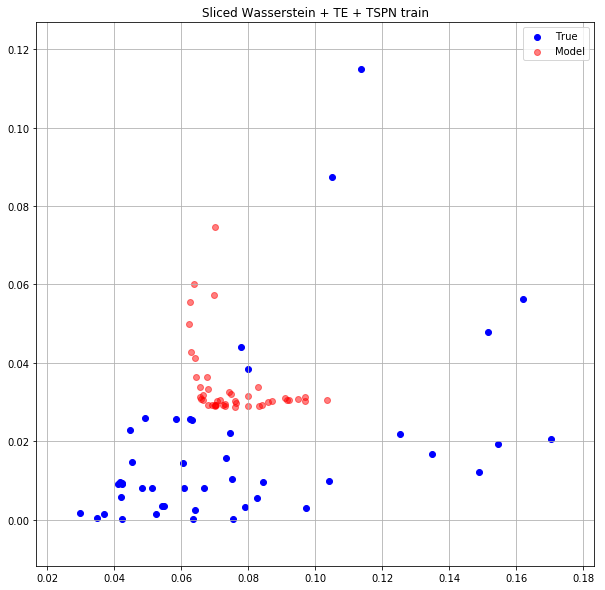

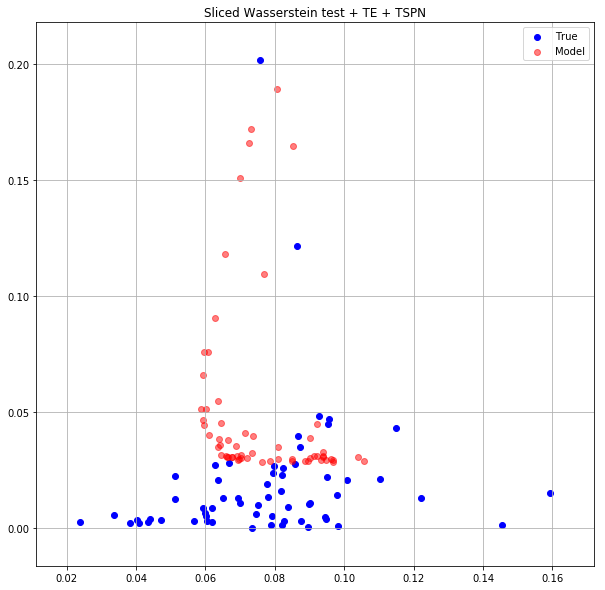

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  27 0.0237472579 0.0226676743


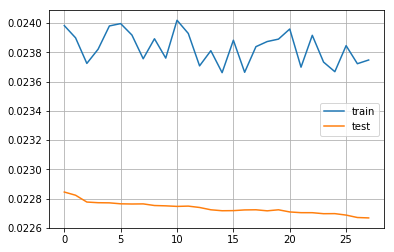

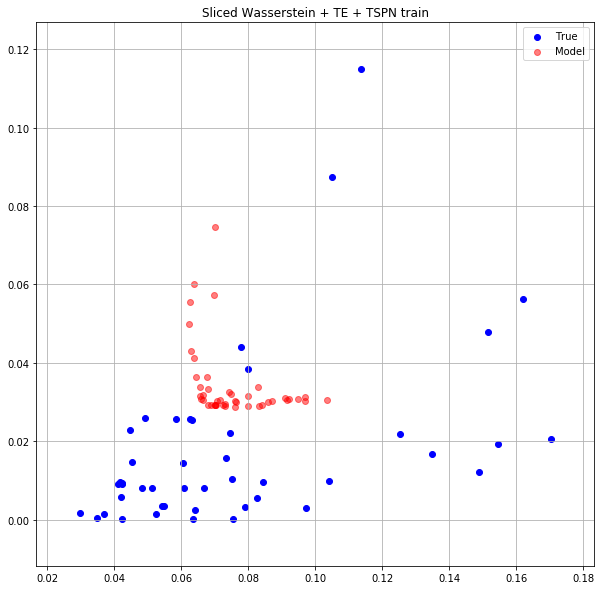

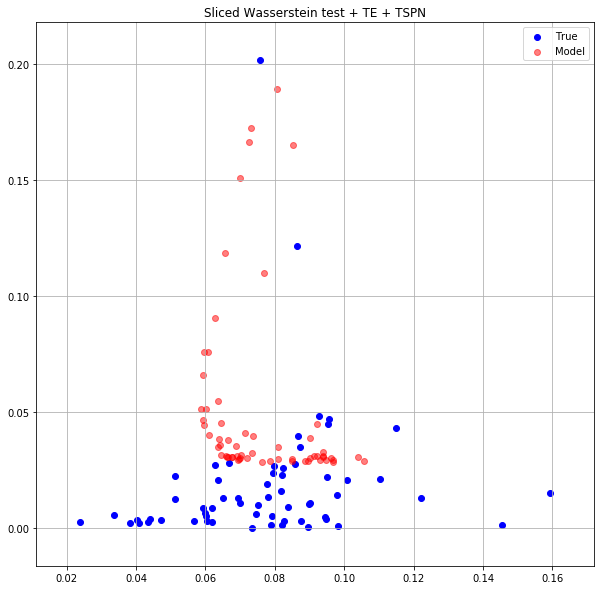

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  28 0.0237547979 0.0226648394


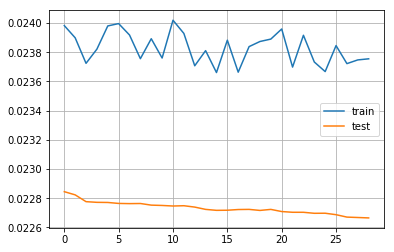

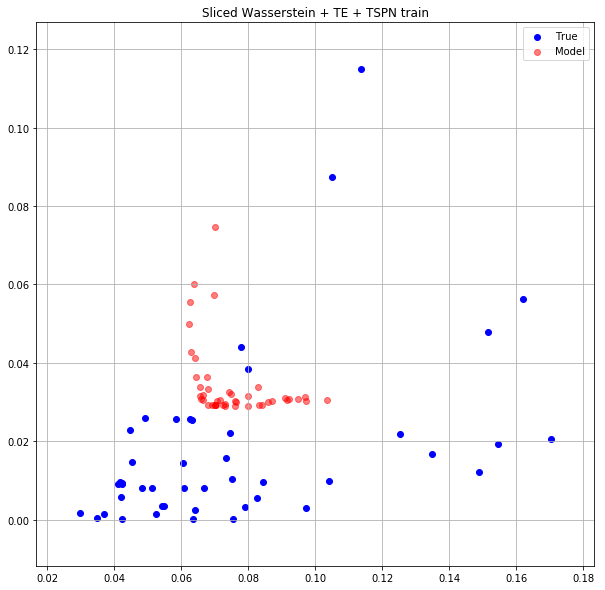

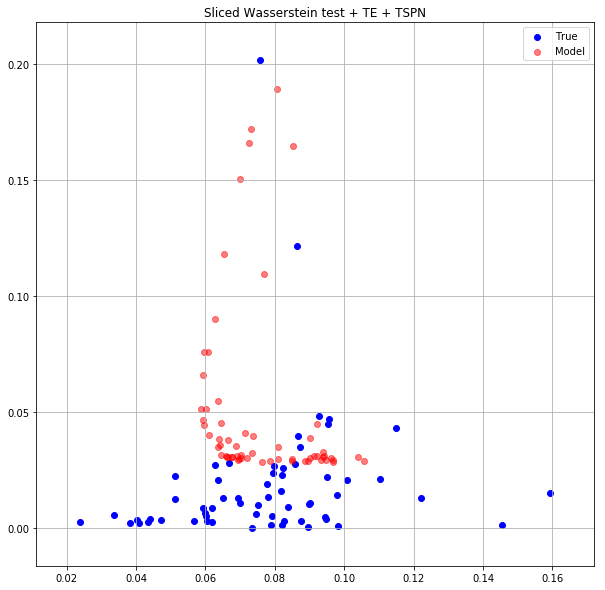

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  29 0.0236808397 0.0226645377


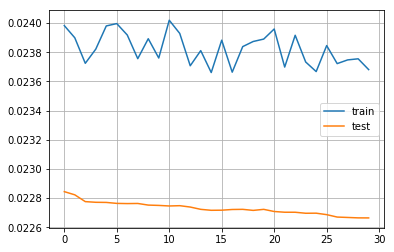

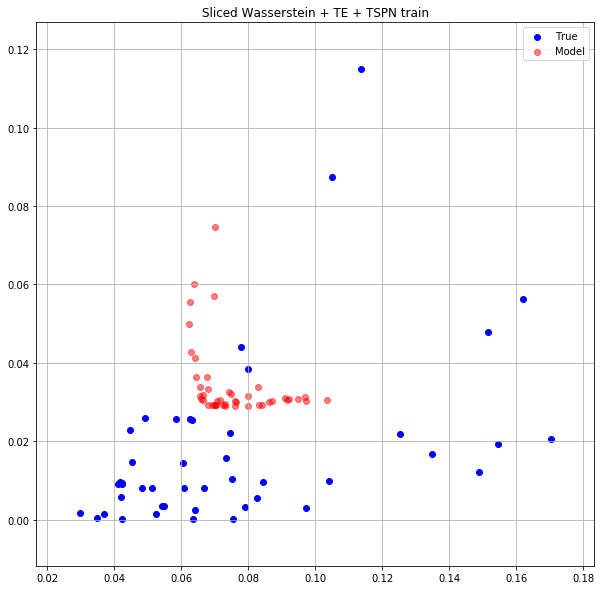

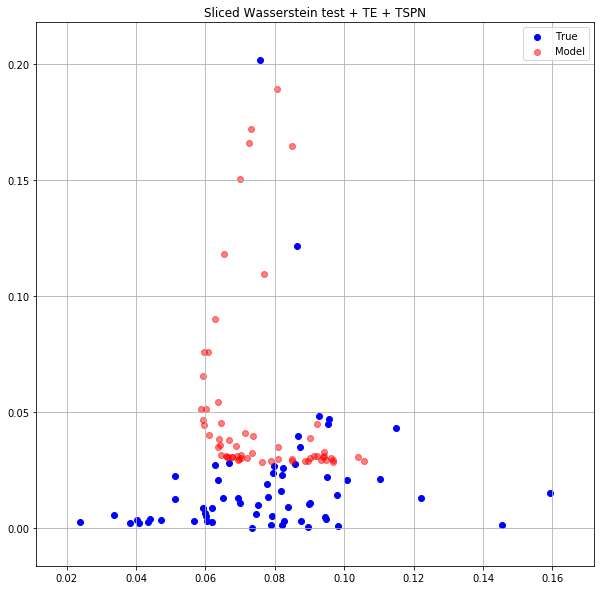

In [56]:
from ot.sliced import sliced_wasserstein_distance


train_loss, val_loss = [], []

for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        #print(src.shape, mask.shape)
        tgt = model(src, mask)
        loss_batch = 0
        for val, pred, cur_mask in zip(src, tgt, mask):
            #print(pred)
            val = val * cur_mask.unsqueeze(1).repeat(1, 2)
            pred = pred * cur_mask.unsqueeze(1).repeat(1, 2)
            a = (val[:, 1]**2 / torch.sum(val[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
            b = (pred[:, 1]**2 / torch.sum(pred[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
            #print(a, b)
            loss_batch += sliced_wasserstein_distance(val, pred, a, b, seed=54, n_projections=100)
        
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
    train_loss.append(loss_train)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            for val, pred, cur_mask in zip(src, tgt, mask):
                #print(pred)
                val = val * cur_mask.unsqueeze(1).repeat(1, 2)
                pred = pred * cur_mask.unsqueeze(1).repeat(1, 2)
                a = (val[:, 1]**2 / torch.sum(val[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
                b = (pred[:, 1]**2 / torch.sum(pred[:, 1]**2 + 1e-8).unsqueeze(0)).clone().detach()
                loss += sliced_wasserstein_distance(val, pred, a, b, seed=54, n_projections=100)
            
            
    loss_test = loss / len(dataloader_test.dataset)
    val_loss.append(loss_test)
    scheduler.step(loss_test)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    
    cur_n = len(train_loss)
    plt.plot(np.arange(cur_n), train_loss, label = 'train')
    plt.plot(np.arange(cur_n), val_loss, label = 'test')
    plt.grid()
    plt.legend()
    plt.show()
    
    
    item = dataset_train[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Sliced Wasserstein + TE + TSPN train")
    plt.show()
    
    
    
    item = dataset_test[0].reshape(1, -1, 2)
    mask = np.ones((1, item.shape[1]))

    d_mask = (item[0, :, 1] != -1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    maskk = (pred[0, :, 1] != -1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask, 0], item[0, d_mask, 1], label = "True", c = "b")
    plt.scatter(pred[0, maskk, 0], pred[0, maskk, 1], label = 'Model', alpha = 0.5, c = "r")
    
    plt.grid()
    plt.legend()
    plt.title("Sliced Wasserstein test + TE + TSPN")
    plt.show()